<a href="https://colab.research.google.com/github/Aditya-y9/ApnaMakaan/blob/main/Apna_Makaan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
# from test import population as population_final
from input_converter import *
import random
global i1
i1 = 0
from pix_array import floorArray
import time


"""
living room --> 25% skewness --> 1.6
kitchen --> 15% skewness --> 1.6 to 2
bathroom --> 10% skewness --> 1.6 to 2
bedroom --> 20% skewness --> 1.6 to 2
passage --> 15% skewness --> 3
"""
import numpy as np
import random
from pix_array import floorArray

def find_length_breadth_fixed_ratio(area, skewness=1.6):
    breadth = int((area / skewness) ** 0.5)
    length = int(skewness * breadth)
    return length, breadth

def is_rectangle_inside_plot(plot, vertex, length, breadth):
    x, y = vertex
    if x < 0 or y < 0 or x + length > plot.shape[1] or y + breadth > plot.shape[0]:
        return False
    for i in range(y, y + breadth):
        for j in range(x, x + length):
            if plot[i, j] == 0:
                return False
    return True

def mark_room_on_plot(plot, vertex, length, breadth, label):
    x, y = vertex
    for i in range(y, y + breadth):
        for j in range(x, x + length):
            # plot[i, j] = 0
            plot[i, j] = label

def get_boundary_coordinates(vertex, length, breadth):
    x, y = vertex
    left_boundary = [(x - 1, i) for i in range(y, y + breadth)]
    right_boundary = [(x + length, i) for i in range(y, y + breadth)]
    top_boundary = [(j, y - 1) for j in range(x, x + length)]
    bottom_boundary = [(j, y + breadth) for j in range(x, x + length)]
    return left_boundary, top_boundary, right_boundary, bottom_boundary

def find_room_position(plot, length, breadth, inside_coords, max_attempts=1000):
    for attempt in range(max_attempts):
        idx = random.randint(0, len(inside_coords) - 1)
        vertex = tuple(inside_coords[idx])
        if is_rectangle_inside_plot(plot, vertex, length, breadth):
            return vertex
    raise ValueError("Unable to find a valid position for the room within the maximum number of attempts.")

def select_random_boundary_point(boundaries):
    side = random.choice(['left', 'top', 'right', 'bottom'])
    if side == 'left':
        return random.choice(boundaries[0]), 'left'
    elif side == 'top':
        return random.choice(boundaries[1]), 'top'
    elif side == 'right':
        return random.choice(boundaries[2]), 'right'
    else:  # 'bottom'
        return random.choice(boundaries[3]), 'bottom'

def adjust_vertex_for_side(vertex, side, length, breadth):
    x, y = vertex
    if side == 'left':
        return (x - length, y)
    elif side == 'top':
        return (x, y - breadth)
    elif side == 'right':
        return (x + 1, y)
    elif side == 'bottom':
        return (x, y + 1)

def initial_population(path):
    binary_plot = floorArray(path)
    og_floor_array = np.copy(binary_plot)
    plot_area = np.sum(binary_plot)

    # Define room specifications
    rooms = [
        {"name": "living room", "area_percentage": 0.075, "skewness": 1.6, "label": 2},
        {"name": "passage", "area_percentage": 0.035, "skewness": random.uniform(1.6, 2), "label": 3},
        {"name": "kitchen", "area_percentage": 0.035, "skewness": random.uniform(1.6, 2), "label": 4},
        {"name": "bathroom", "area_percentage": 0.015, "skewness": random.uniform(1.6, 2), "label": 5},
        {"name": "bedroom", "area_percentage": 0.05, "skewness": random.uniform(1.6, 2), "label": 6},
        {"name": "bedroom2", "area_percentage": 0.05, "skewness": random.uniform(1.6, 2), "label": 6}
    ]

    room_positions = {}
    inside_coords = np.argwhere(binary_plot == 1)
    boundary_points_passage = None
    boundary_points_living_room = None
    for room in rooms:
        room_area = plot_area * room["area_percentage"]
        length, breadth = find_length_breadth_fixed_ratio(room_area, room["skewness"])
        # print(f"{room['name'].capitalize()} - Length: {length}, Breadth: {breadth}")

        try:
            if room["name"] == "living room":
                vertex = find_room_position(binary_plot, length, breadth, inside_coords)
                mark_room_on_plot(binary_plot, vertex, length, breadth, 2)
                # print(f"Vertex: {vertex}, Length: {length}, Breadth: {breadth}")
                room_positions[room["name"]] = {"vertex": vertex, "length": length, "breadth": breadth}
                left_boundary, top_boundary, right_boundary, bottom_boundary = get_boundary_coordinates(vertex, length, breadth)
                boundary_points_living_room = (left_boundary, top_boundary, right_boundary, bottom_boundary)

            elif room["name"] == "passage":
                if boundary_points_living_room is None:
                    raise ValueError("Boundary points for the living room are not set.")

                for attempt in range(10000):
                    boundary_vertex, side = select_random_boundary_point(boundary_points_living_room)

                    if random.choice([True, False]):
                        new_length, new_breadth = length, breadth
                    else:
                        new_length, new_breadth = breadth, length

                    adjusted_vertex = adjust_vertex_for_side(boundary_vertex, side, new_length, new_breadth)
                    if is_rectangle_inside_plot(binary_plot, adjusted_vertex, new_length, new_breadth):
                        mark_room_on_plot(binary_plot, adjusted_vertex, new_length, new_breadth, 3)
                        # print(f"New Vertex: {adjusted_vertex}, New Length: {new_length}, New Breadth: {new_breadth}")
                        room_positions[room["name"]] = {"vertex": adjusted_vertex, "length": new_length, "breadth": new_breadth}
                        # Update boundary points for the next room
                        left_boundary, top_boundary, right_boundary, bottom_boundary = get_boundary_coordinates(adjusted_vertex, new_length, new_breadth)
                        boundary_points_passage = (left_boundary, top_boundary, right_boundary, bottom_boundary)
                        break
                else:
                    print(f"Unable to place the {room['name']} at any selected boundary vertex within the maximum attempts.")

            else:
                if boundary_points_passage is None:
                    raise ValueError("Boundary points for the passage are not set.")

                for attempt in range(10000):
                    boundary_vertex, side = select_random_boundary_point(boundary_points_passage)

                    if random.choice([True, False]):
                        new_length, new_breadth = length, breadth
                    else:
                        new_length, new_breadth = breadth, length

                    adjusted_vertex = adjust_vertex_for_side(boundary_vertex, side, new_length, new_breadth)
                    if is_rectangle_inside_plot(binary_plot, adjusted_vertex, new_length, new_breadth):
                        mark_room_on_plot(binary_plot, adjusted_vertex, new_length, new_breadth, room["label"])
                        # print(f"New Vertex: {adjusted_vertex}, New Length: {new_length}, New Breadth: {new_breadth}")
                        room_positions[room["name"]] = {"vertex": adjusted_vertex, "length": new_length, "breadth": new_breadth}
                        # Update boundary points for the next room
                        # left_boundary, top_boundary, right_boundary, bottom_boundary = get_boundary_coordinates(adjusted_vertex, new_length, new_breadth)
                        # boundary_points_passage = (left_boundary, top_boundary, right_boundary, bottom_boundary)
                        break
                else:
                    print(f"Unable to place the {room['name']} at any selected boundary vertex within the maximum attempts.")
        except ValueError as e:
            print(e)

    np.savetxt('final_plot.txt', binary_plot, fmt='%d')
    # print(room_positions)

    return room_positions, binary_plot

Elapsed time for initial population generation: 29.61 seconds


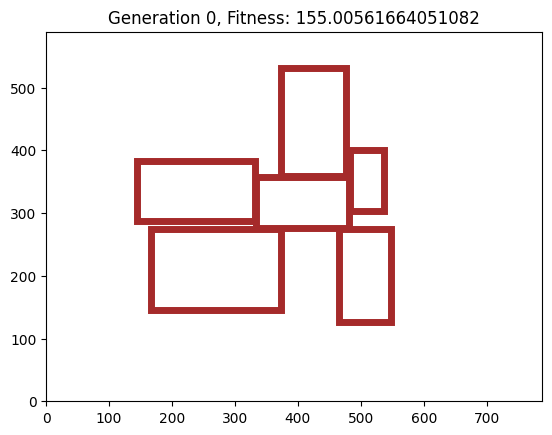

{'rooms': [{'name': 'Living Room', 'position': (167, 146), 'size': (206, 129)}, {'name': 'Passage', 'position': (333, 276), 'size': (149, 82)}, {'name': 'Kitchen', 'position': (466, 126), 'size': (82, 149)}, {'name': 'Washroom', 'position': (483, 304), 'size': (54, 96)}, {'name': 'Bedroom1', 'position': (145, 288), 'size': (187, 95)}, {'name': 'Bedroom2', 'position': (373, 359), 'size': (103, 172)}], 'fitness': 155.00561664051082}


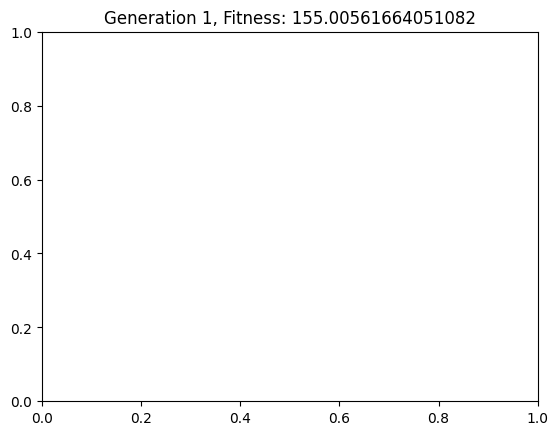

{'rooms': [{'name': 'Living Room', 'position': (167, 145), 'size': (208, 130)}, {'name': 'Passage', 'position': (333, 275), 'size': (149, 83)}, {'name': 'Kitchen', 'position': (466, 134), 'size': (84, 141)}, {'name': 'Washroom', 'position': (483, 304), 'size': (56, 90)}, {'name': 'Bedroom1', 'position': (144, 288), 'size': (188, 97)}, {'name': 'Bedroom2', 'position': (373, 359), 'size': (105, 174)}], 'fitness': 155.00561664051082}


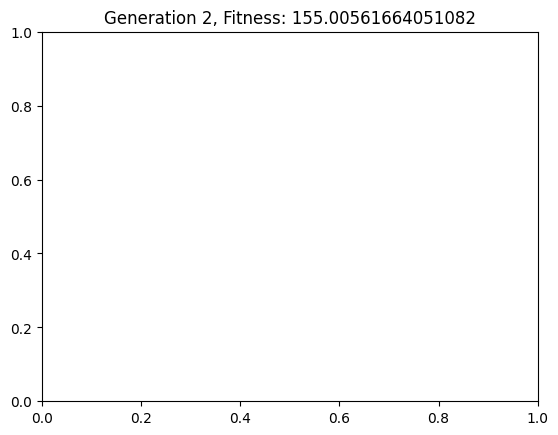

{'rooms': [{'name': 'Living Room', 'position': (167, 142), 'size': (213, 132)}, {'name': 'Passage', 'position': (333, 275), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 108), 'size': (89, 167)}, {'name': 'Washroom', 'position': (483, 304), 'size': (61, 117)}, {'name': 'Bedroom1', 'position': (142, 288), 'size': (191, 102)}, {'name': 'Bedroom2', 'position': (373, 359), 'size': (110, 179)}], 'fitness': 55.76125334197192}


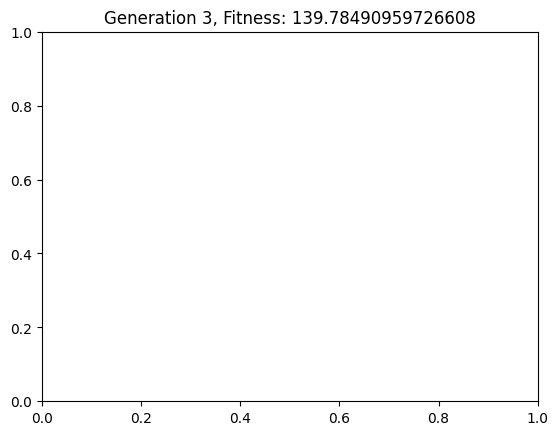

{'rooms': [{'name': 'Living Room', 'position': (167, 138), 'size': (221, 136)}, {'name': 'Bedroom1', 'position': (138, 288), 'size': (195, 110)}, {'name': 'Bedroom2', 'position': (369, 359), 'size': (114, 187)}, {'name': 'Passage', 'position': (333, 275), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 94), 'size': (97, 181)}, {'name': 'Washroom', 'position': (483, 304), 'size': (69, 128)}], 'fitness': 139.78490959726608}


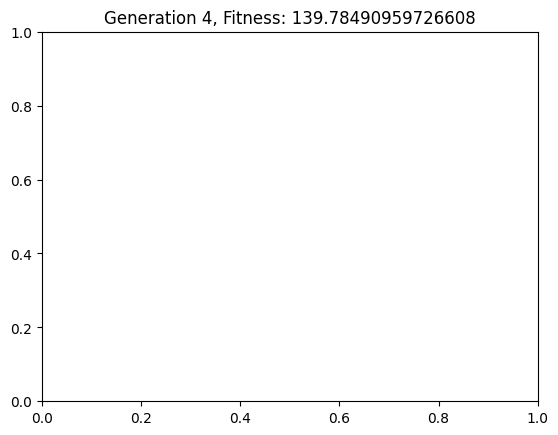

{'rooms': [{'name': 'Living Room', 'position': (167, 134), 'size': (229, 140)}, {'name': 'Bedroom1', 'position': (134, 288), 'size': (199, 118)}, {'name': 'Bedroom2', 'position': (365, 359), 'size': (118, 195)}, {'name': 'Passage', 'position': (333, 275), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 74), 'size': (105, 201)}, {'name': 'Washroom', 'position': (483, 304), 'size': (77, 136)}], 'fitness': -90.6444286272392}


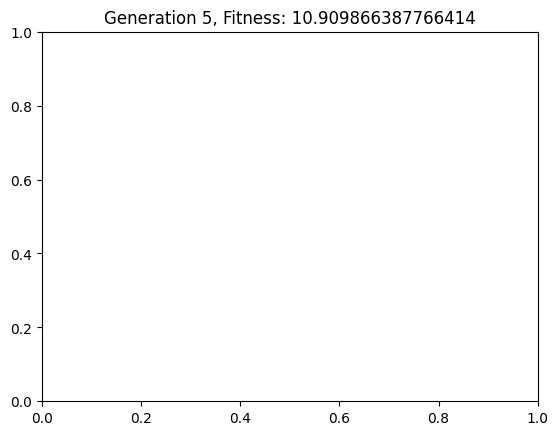

{'rooms': [{'name': 'Living Room', 'position': (167, 130), 'size': (237, 144)}, {'name': 'Bedroom1', 'position': (130, 288), 'size': (203, 126)}, {'name': 'Bedroom2', 'position': (361, 359), 'size': (122, 201)}, {'name': 'Passage', 'position': (333, 275), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 70), 'size': (113, 205)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 138)}], 'fitness': 10.909866387766414}


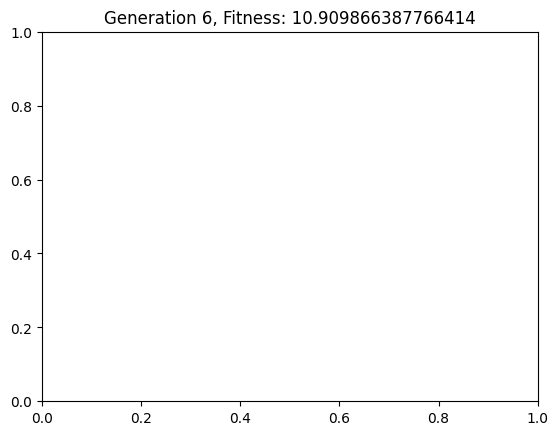

{'rooms': [{'name': 'Living Room', 'position': (167, 126), 'size': (245, 148)}, {'name': 'Bedroom1', 'position': (126, 288), 'size': (207, 134)}, {'name': 'Bedroom2', 'position': (357, 359), 'size': (126, 201)}, {'name': 'Passage', 'position': (333, 275), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 68), 'size': (120, 207)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 149)}], 'fitness': -112.79212279404071}


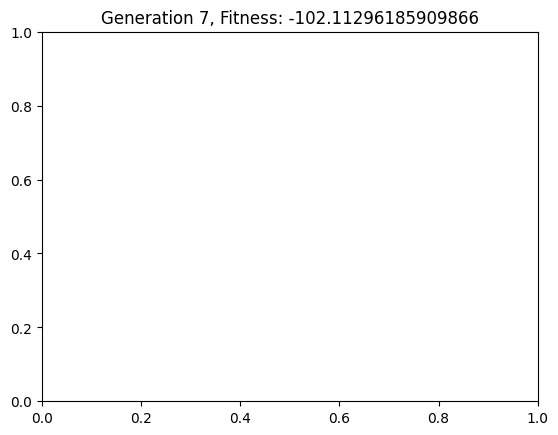

{'rooms': [{'name': 'Living Room', 'position': (167, 122), 'size': (253, 152)}, {'name': 'Bedroom1', 'position': (122, 288), 'size': (211, 142)}, {'name': 'Bedroom2', 'position': (353, 359), 'size': (130, 201)}, {'name': 'Passage', 'position': (333, 275), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 71), 'size': (124, 204)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 128)}], 'fitness': -102.11296185909866}


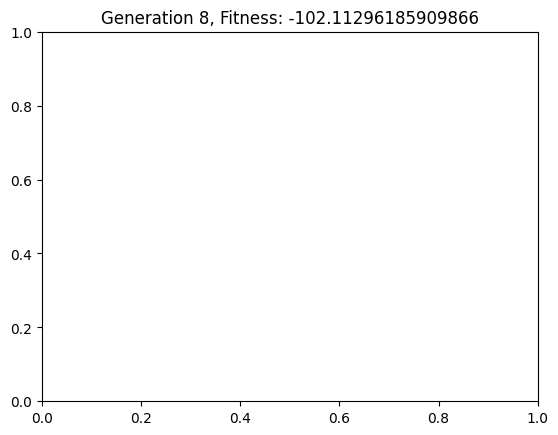

{'rooms': [{'name': 'Living Room', 'position': (167, 118), 'size': (261, 156)}, {'name': 'Bedroom1', 'position': (118, 288), 'size': (215, 150)}, {'name': 'Bedroom2', 'position': (349, 359), 'size': (134, 201)}, {'name': 'Passage', 'position': (333, 275), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 60), 'size': (128, 214)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 140)}], 'fitness': -102.14779705889691}


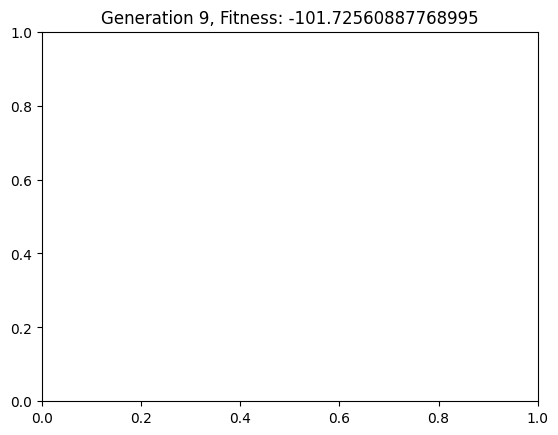

{'rooms': [{'name': 'Living Room', 'position': (167, 114), 'size': (269, 160)}, {'name': 'Bedroom1', 'position': (114, 288), 'size': (219, 158)}, {'name': 'Bedroom2', 'position': (345, 358), 'size': (138, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 59), 'size': (131, 215)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 140)}], 'fitness': -101.72560887768995}


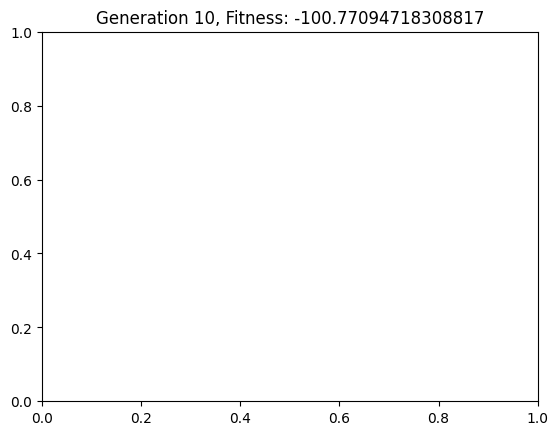

{'rooms': [{'name': 'Living Room', 'position': (167, 110), 'size': (277, 164)}, {'name': 'Bedroom1', 'position': (110, 288), 'size': (223, 166)}, {'name': 'Bedroom2', 'position': (341, 358), 'size': (142, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 61), 'size': (133, 213)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 150)}], 'fitness': -100.77094718308817}


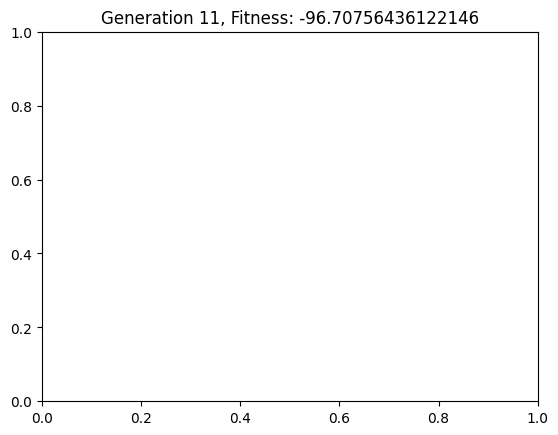

{'rooms': [{'name': 'Living Room', 'position': (167, 106), 'size': (285, 168)}, {'name': 'Bedroom1', 'position': (106, 288), 'size': (227, 174)}, {'name': 'Bedroom2', 'position': (337, 358), 'size': (146, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 54), 'size': (134, 220)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 135)}], 'fitness': -96.70756436122146}


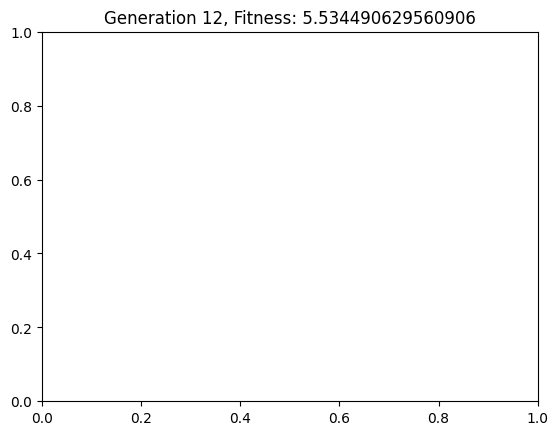

{'rooms': [{'name': 'Living Room', 'position': (167, 102), 'size': (293, 172)}, {'name': 'Bedroom1', 'position': (102, 288), 'size': (231, 182)}, {'name': 'Bedroom2', 'position': (333, 358), 'size': (150, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 54), 'size': (134, 220)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 129)}], 'fitness': 5.534490629560906}


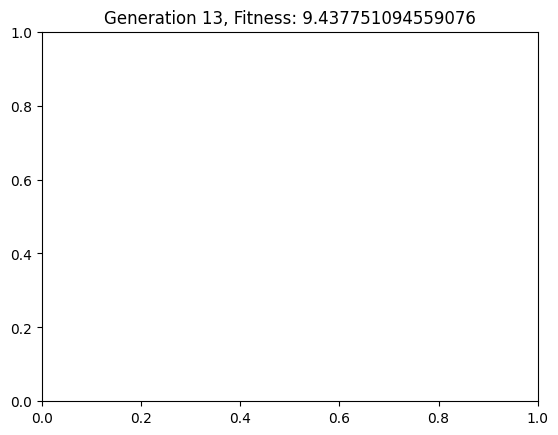

{'rooms': [{'name': 'Living Room', 'position': (166, 98), 'size': (300, 176)}, {'name': 'Bedroom1', 'position': (101, 288), 'size': (231, 190)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 54), 'size': (134, 220)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 132)}], 'fitness': 9.437751094559076}


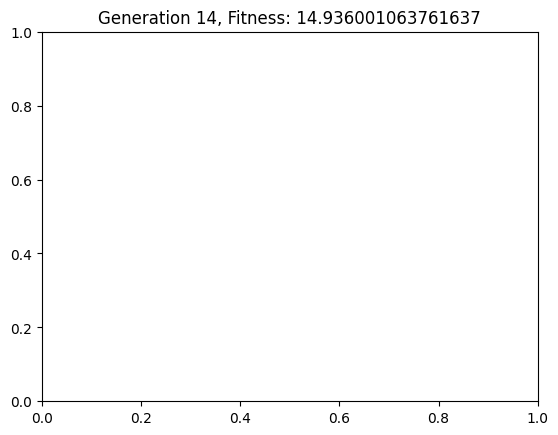

{'rooms': [{'name': 'Living Room', 'position': (162, 94), 'size': (304, 180)}, {'name': 'Bedroom1', 'position': (101, 288), 'size': (231, 198)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 54), 'size': (134, 220)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 135)}], 'fitness': 14.936001063761637}


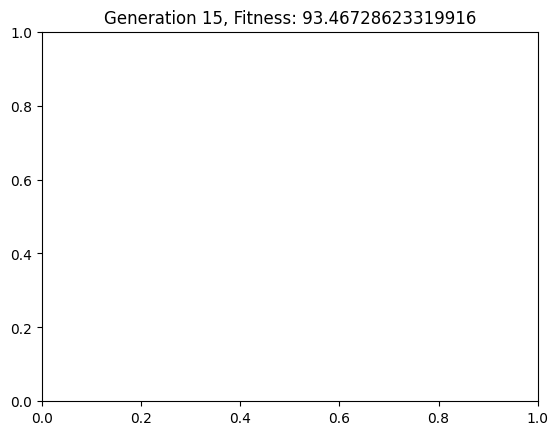

{'rooms': [{'name': 'Living Room', 'position': (158, 90), 'size': (308, 184)}, {'name': 'Bedroom1', 'position': (101, 288), 'size': (231, 206)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 54), 'size': (134, 220)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 142)}], 'fitness': 93.46728623319916}


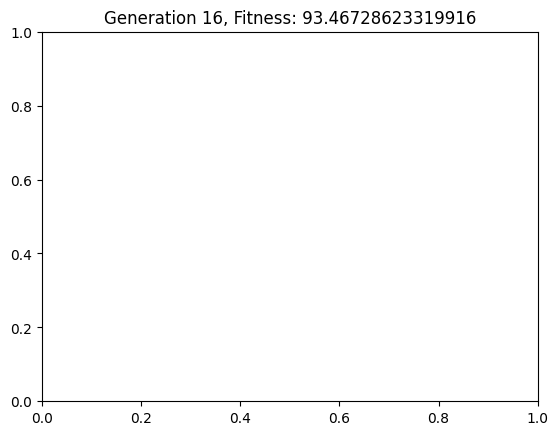

{'rooms': [{'name': 'Living Room', 'position': (154, 86), 'size': (312, 188)}, {'name': 'Bedroom1', 'position': (101, 288), 'size': (231, 214)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 54), 'size': (134, 220)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 150)}], 'fitness': 22.995041607429243}


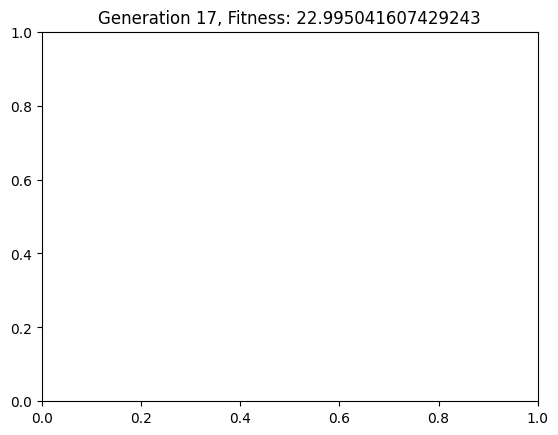

{'rooms': [{'name': 'Living Room', 'position': (150, 82), 'size': (316, 192)}, {'name': 'Bedroom1', 'position': (101, 288), 'size': (231, 222)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 54), 'size': (135, 220)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 146)}], 'fitness': 22.893327955995062}


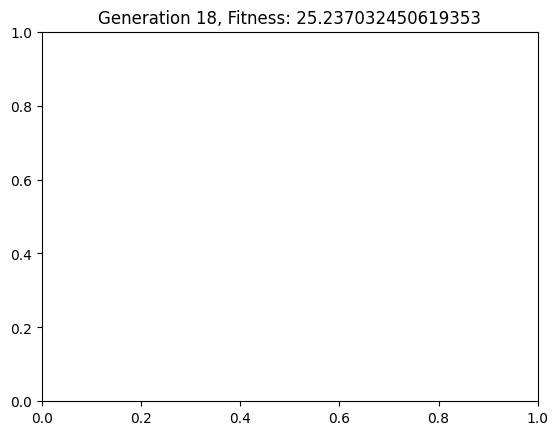

{'rooms': [{'name': 'Living Room', 'position': (146, 78), 'size': (320, 196)}, {'name': 'Bedroom1', 'position': (101, 288), 'size': (231, 230)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 54), 'size': (135, 220)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 127)}], 'fitness': 25.237032450619353}


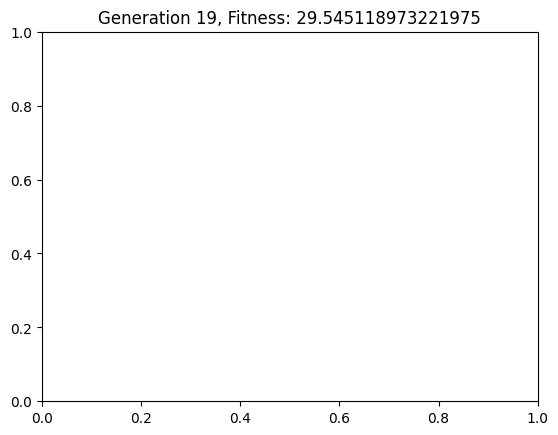

{'rooms': [{'name': 'Living Room', 'position': (142, 74), 'size': (324, 200)}, {'name': 'Bedroom1', 'position': (101, 288), 'size': (231, 238)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 54), 'size': (135, 220)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 135)}], 'fitness': 29.545118973221975}


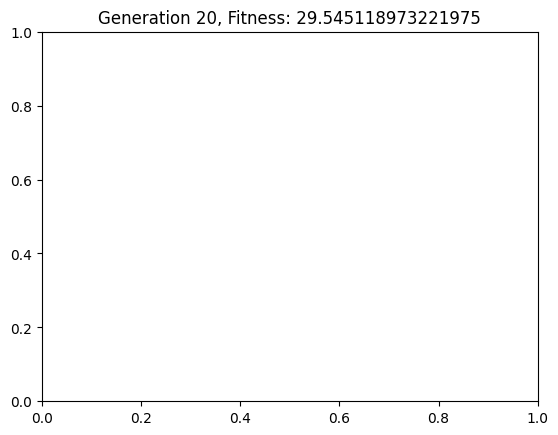

{'rooms': [{'name': 'Living Room', 'position': (138, 70), 'size': (328, 204)}, {'name': 'Bedroom1', 'position': (101, 288), 'size': (231, 246)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 54), 'size': (135, 220)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 125)}], 'fitness': -90.50583239136158}


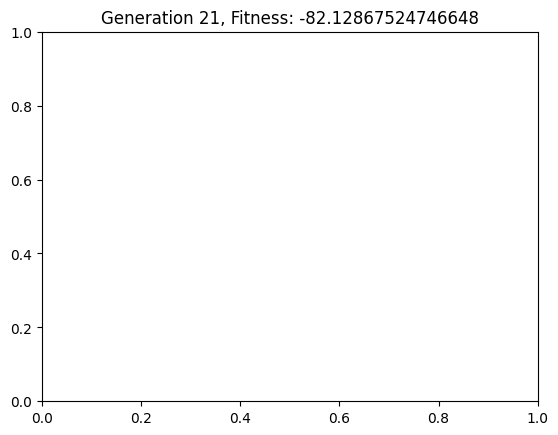

{'rooms': [{'name': 'Living Room', 'position': (134, 66), 'size': (332, 208)}, {'name': 'Bedroom1', 'position': (101, 288), 'size': (231, 254)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (136, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 152)}], 'fitness': -82.12867524746648}


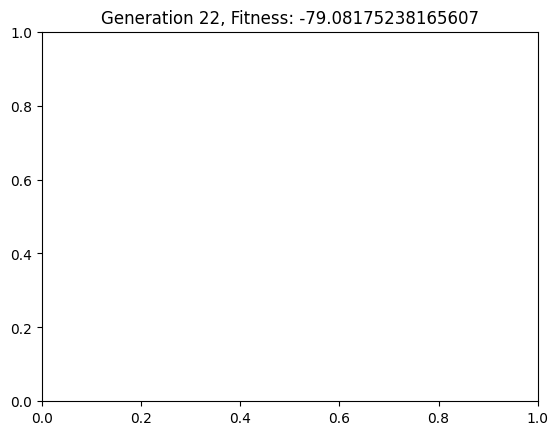

{'rooms': [{'name': 'Living Room', 'position': (130, 62), 'size': (336, 212)}, {'name': 'Bedroom1', 'position': (101, 288), 'size': (231, 262)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (136, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 143)}], 'fitness': -79.08175238165607}


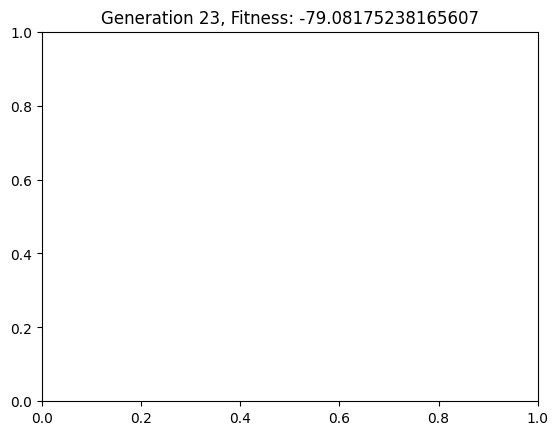

{'rooms': [{'name': 'Living Room', 'position': (126, 58), 'size': (340, 216)}, {'name': 'Bedroom1', 'position': (101, 288), 'size': (231, 270)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (136, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 134)}], 'fitness': -91.76598601063989}


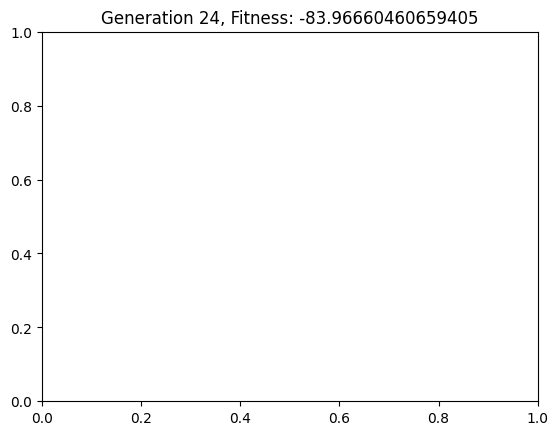

{'rooms': [{'name': 'Living Room', 'position': (122, 54), 'size': (344, 220)}, {'name': 'Bedroom1', 'position': (101, 285), 'size': (231, 275)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (136, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 140)}], 'fitness': -83.96660460659405}


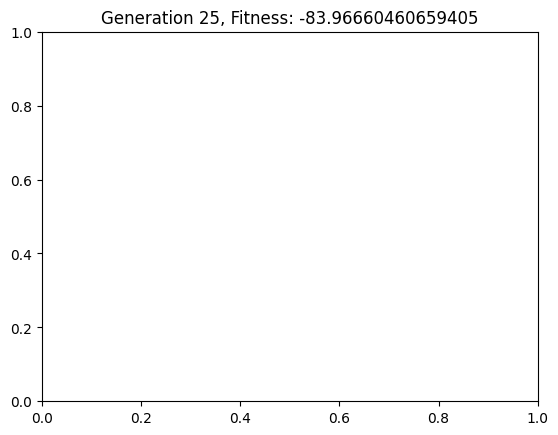

{'rooms': [{'name': 'Living Room', 'position': (118, 52), 'size': (348, 222)}, {'name': 'Bedroom1', 'position': (101, 281), 'size': (231, 279)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (138, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 134)}], 'fitness': -222.30692535766372}


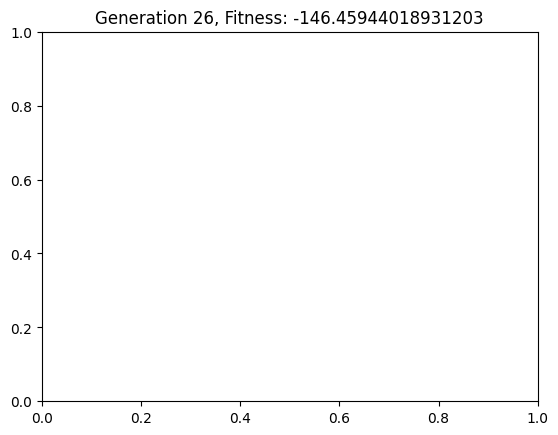

{'rooms': [{'name': 'Living Room', 'position': (114, 52), 'size': (352, 222)}, {'name': 'Bedroom1', 'position': (101, 277), 'size': (231, 283)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (138, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 150)}], 'fitness': -146.45944018931203}


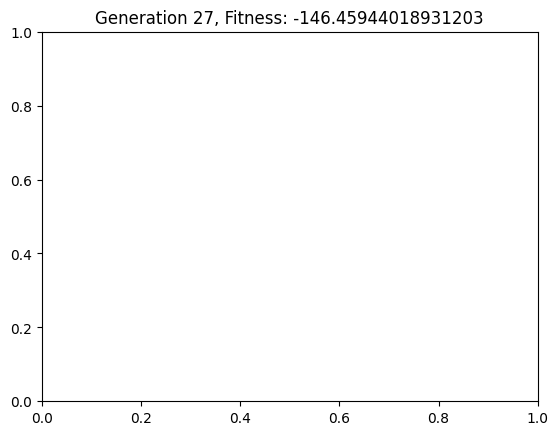

{'rooms': [{'name': 'Living Room', 'position': (110, 52), 'size': (356, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (138, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 142)}], 'fitness': -220.06680733312152}


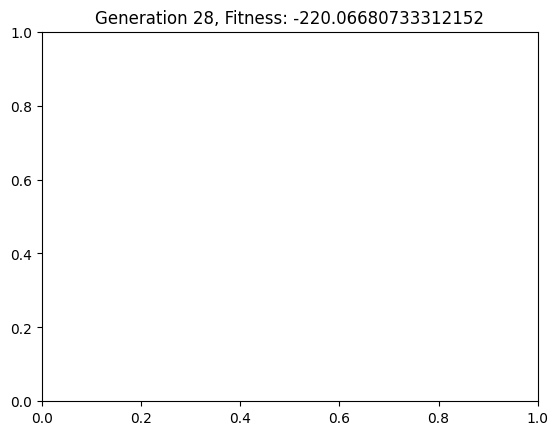

{'rooms': [{'name': 'Living Room', 'position': (106, 52), 'size': (360, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (138, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 138)}], 'fitness': -230.47752767765405}


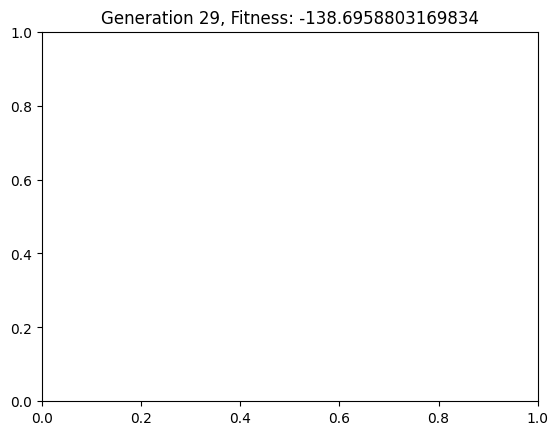

{'rooms': [{'name': 'Living Room', 'position': (102, 52), 'size': (364, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (138, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 154)}], 'fitness': -138.6958803169834}


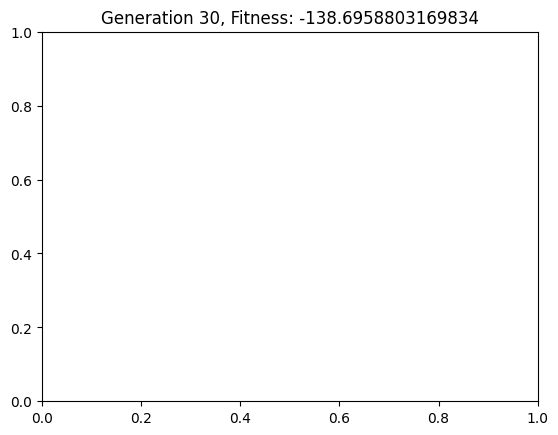

{'rooms': [{'name': 'Living Room', 'position': (98, 52), 'size': (368, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (138, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 130)}], 'fitness': -142.88815228245852}


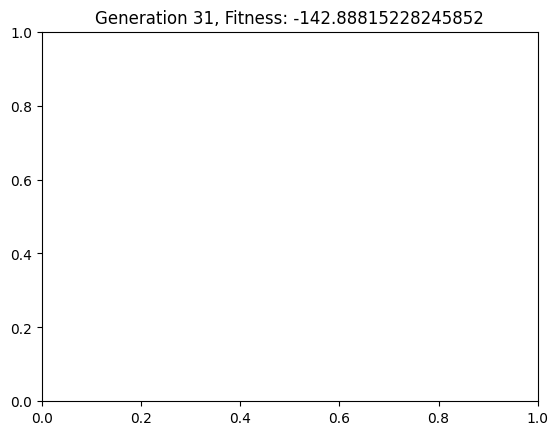

{'rooms': [{'name': 'Living Room', 'position': (94, 52), 'size': (372, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (138, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 134)}], 'fitness': -170.2960998569527}


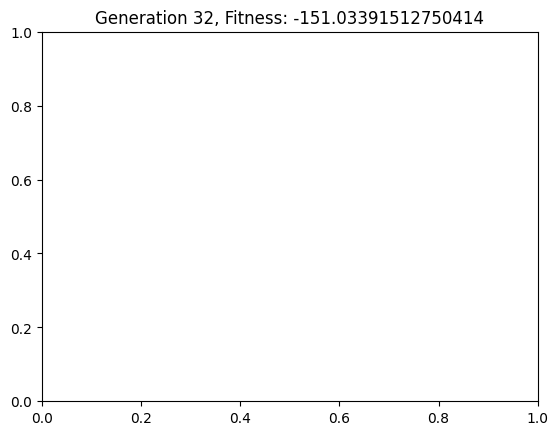

{'rooms': [{'name': 'Living Room', 'position': (90, 52), 'size': (376, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (138, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 125)}], 'fitness': -151.03391512750414}


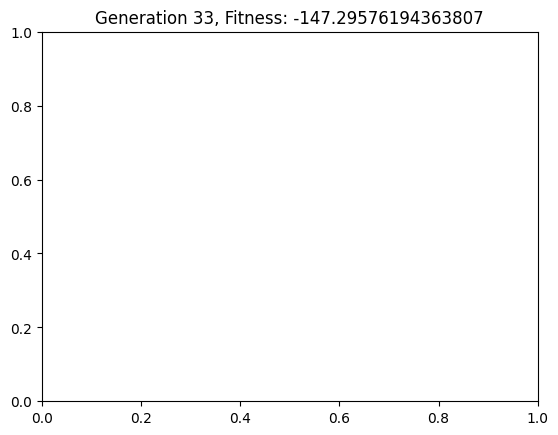

{'rooms': [{'name': 'Living Room', 'position': (86, 52), 'size': (380, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (138, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 132)}], 'fitness': -147.29576194363807}


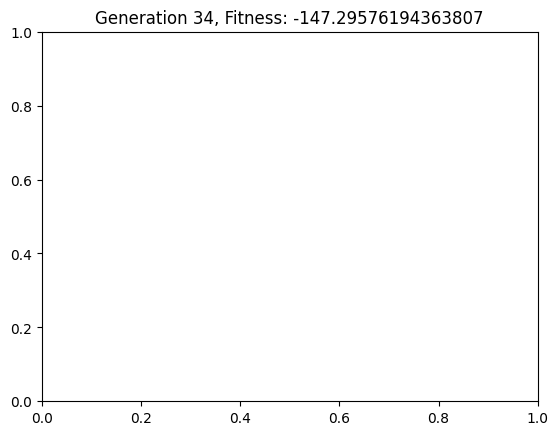

{'rooms': [{'name': 'Living Room', 'position': (82, 52), 'size': (384, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (138, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 136)}], 'fitness': -175.55502027913064}


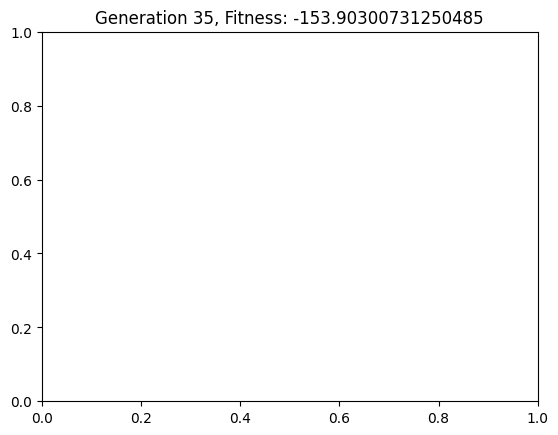

{'rooms': [{'name': 'Living Room', 'position': (78, 52), 'size': (388, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (139, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 134)}], 'fitness': -153.90300731250485}


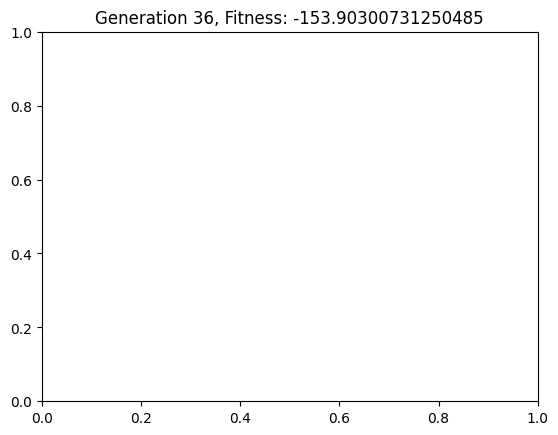

{'rooms': [{'name': 'Living Room', 'position': (74, 52), 'size': (392, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (139, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 142)}], 'fitness': -177.3843936586903}


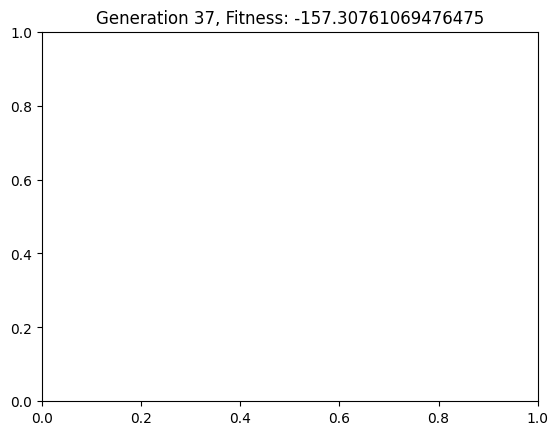

{'rooms': [{'name': 'Living Room', 'position': (70, 52), 'size': (396, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (139, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 155)}], 'fitness': -157.30761069476475}


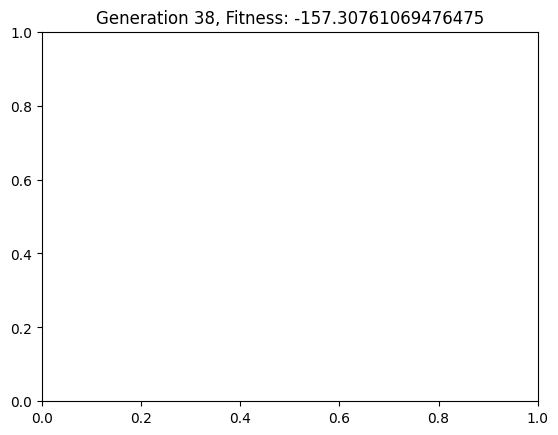

{'rooms': [{'name': 'Living Room', 'position': (66, 52), 'size': (400, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (139, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 140)}], 'fitness': -159.77006601649245}


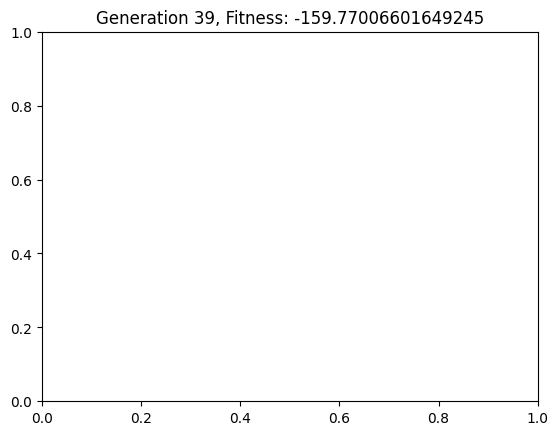

{'rooms': [{'name': 'Living Room', 'position': (62, 52), 'size': (404, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (139, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 154)}], 'fitness': -177.88697273783328}


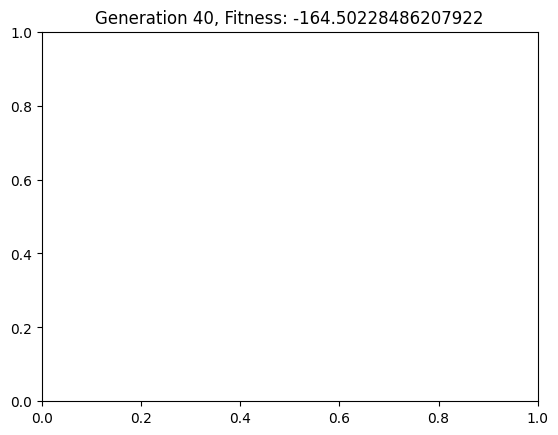

{'rooms': [{'name': 'Living Room', 'position': (58, 52), 'size': (408, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (139, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 144)}], 'fitness': -164.50228486207922}


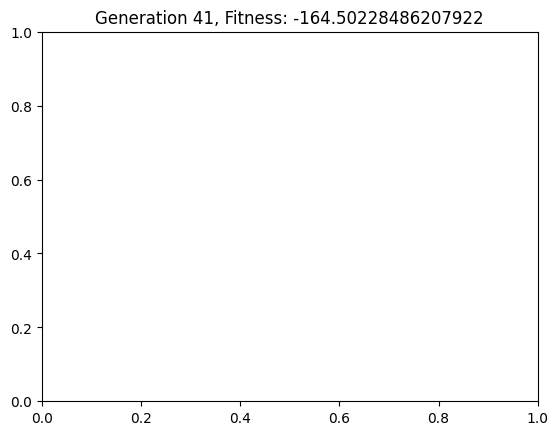

{'rooms': [{'name': 'Living Room', 'position': (54, 52), 'size': (412, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (139, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 125)}], 'fitness': -177.38892090993588}


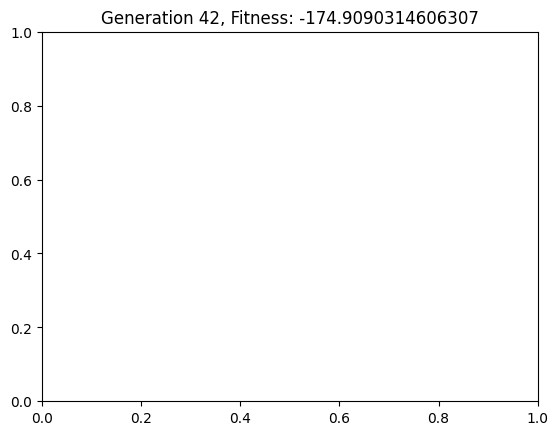

{'rooms': [{'name': 'Living Room', 'position': (50, 52), 'size': (416, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (139, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 137)}], 'fitness': -174.9090314606307}


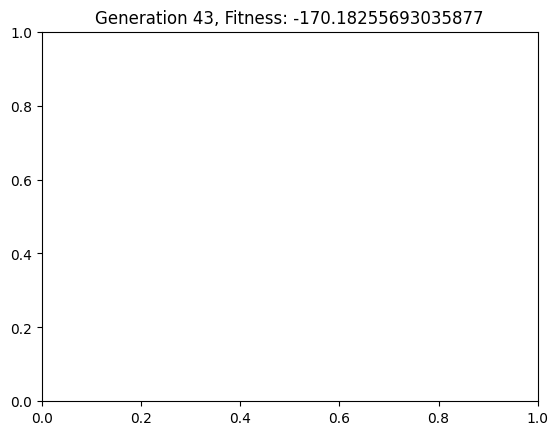

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (418, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (139, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 147)}], 'fitness': -170.18255693035877}


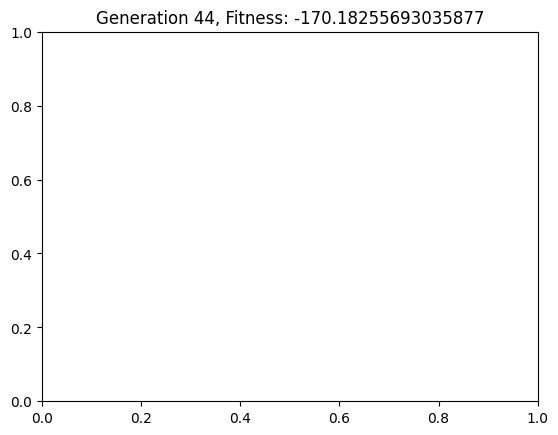

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (418, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (139, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 150)}], 'fitness': -180.36621467116575}


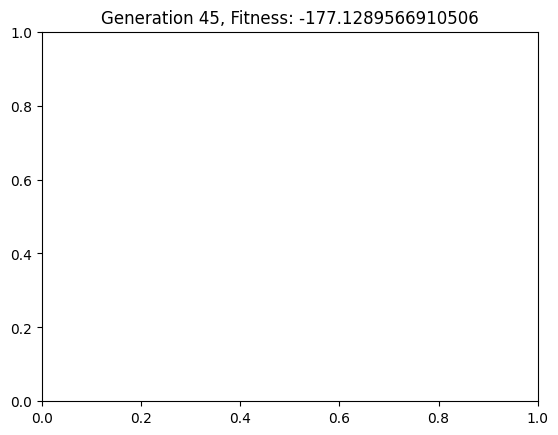

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (418, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (139, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 155)}], 'fitness': -177.1289566910506}


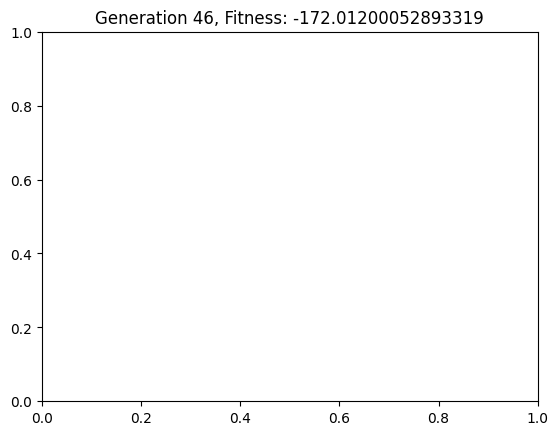

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (418, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (139, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 137)}], 'fitness': -172.01200052893319}


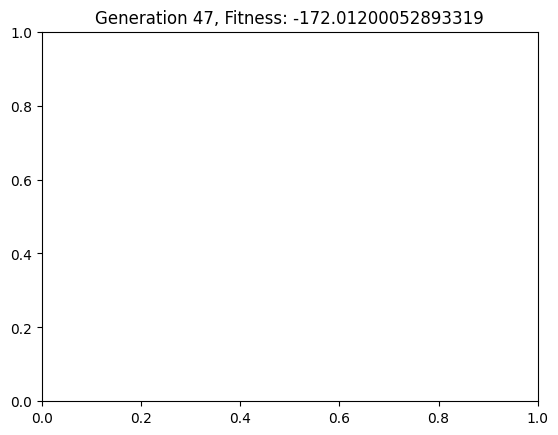

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (418, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (139, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 139)}], 'fitness': -192.18102481757128}


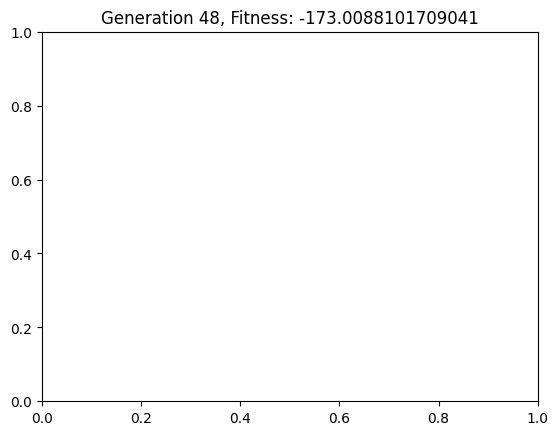

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (418, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (139, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 130)}], 'fitness': -173.0088101709041}


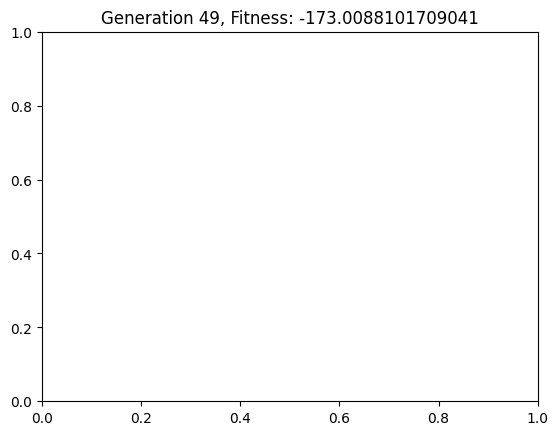

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (418, 222)}, {'name': 'Bedroom1', 'position': (101, 274), 'size': (231, 286)}, {'name': 'Bedroom2', 'position': (332, 358), 'size': (151, 202)}, {'name': 'Passage', 'position': (333, 274), 'size': (149, 84)}, {'name': 'Kitchen', 'position': (466, 52), 'size': (139, 222)}, {'name': 'Washroom', 'position': (483, 304), 'size': (78, 129)}], 'fitness': -201.53290146422617}
Elapsed time: 928.25 seconds


<Figure size 640x480 with 0 Axes>

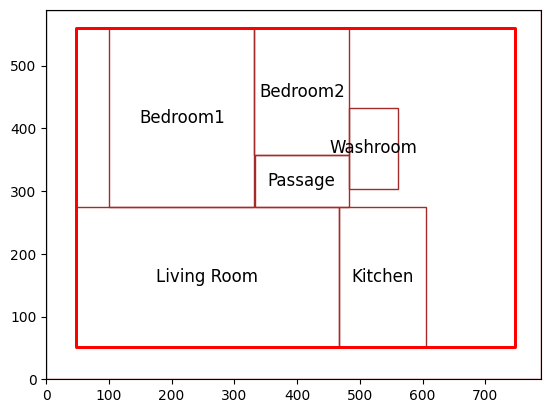

Elapsed time for initial population generation: 28.66 seconds


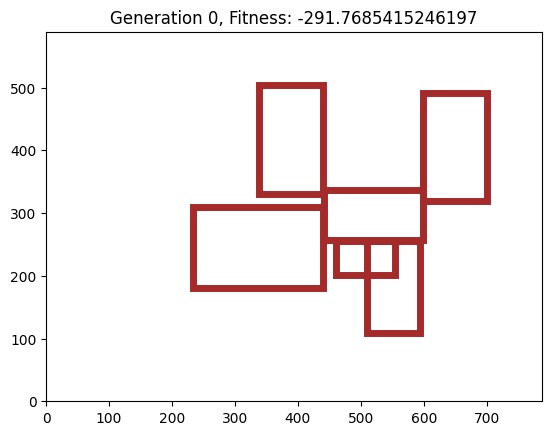

{'rooms': [{'name': 'Living Room', 'position': (234, 181), 'size': (206, 129)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 79)}, {'name': 'Kitchen', 'position': (510, 109), 'size': (84, 147)}, {'name': 'Washroom', 'position': (461, 201), 'size': (93, 55)}, {'name': 'Bedroom1', 'position': (599, 319), 'size': (101, 173)}, {'name': 'Bedroom2', 'position': (339, 330), 'size': (101, 174)}], 'fitness': -291.7685415246197}


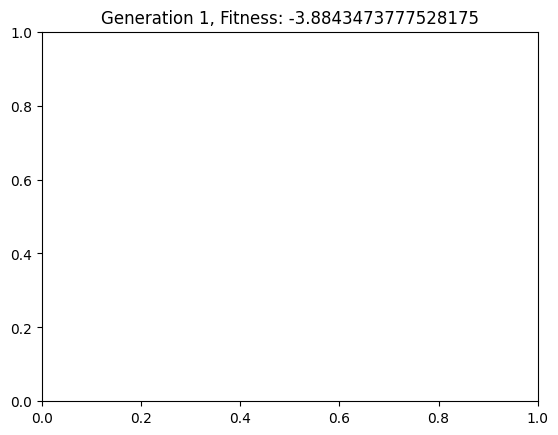

{'rooms': [{'name': 'Living Room', 'position': (234, 181), 'size': (206, 129)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 79)}, {'name': 'Kitchen', 'position': (510, 109), 'size': (84, 147)}, {'name': 'Washroom', 'position': (461, 201), 'size': (49, 55)}, {'name': 'Bedroom1', 'position': (599, 319), 'size': (101, 173)}, {'name': 'Bedroom2', 'position': (339, 330), 'size': (101, 174)}], 'fitness': -3.8843473777528175}


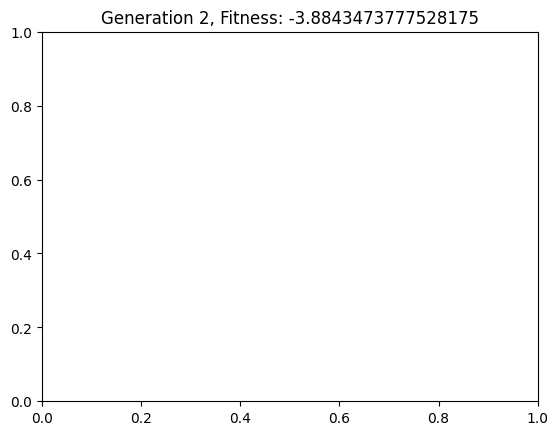

{'rooms': [{'name': 'Living Room', 'position': (234, 181), 'size': (206, 129)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 79)}, {'name': 'Kitchen', 'position': (510, 109), 'size': (84, 147)}, {'name': 'Washroom', 'position': (461, 201), 'size': (49, 55)}, {'name': 'Bedroom1', 'position': (599, 319), 'size': (101, 173)}, {'name': 'Bedroom2', 'position': (339, 330), 'size': (101, 174)}], 'fitness': -3.8843473777528175}


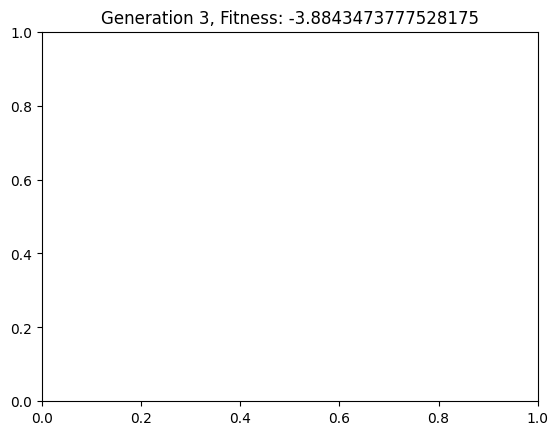

{'rooms': [{'name': 'Living Room', 'position': (233, 181), 'size': (207, 131)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 81)}, {'name': 'Kitchen', 'position': (510, 97), 'size': (86, 159)}, {'name': 'Washroom', 'position': (459, 161), 'size': (51, 95)}, {'name': 'Bedroom1', 'position': (599, 319), 'size': (103, 175)}, {'name': 'Bedroom2', 'position': (338, 330), 'size': (102, 176)}], 'fitness': -3.8843473777528175}


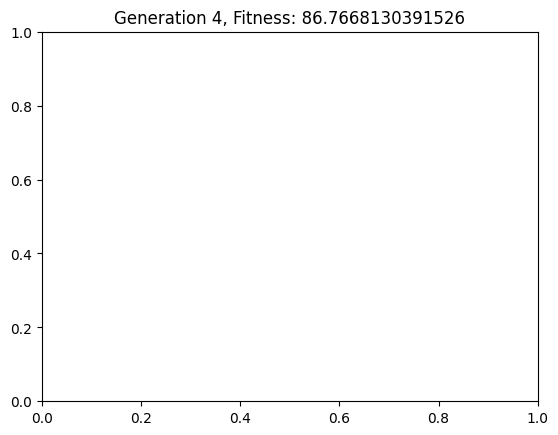

{'rooms': [{'name': 'Living Room', 'position': (231, 181), 'size': (209, 135)}, {'name': 'Bedroom1', 'position': (599, 319), 'size': (107, 179)}, {'name': 'Bedroom2', 'position': (336, 330), 'size': (104, 180)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 85)}, {'name': 'Kitchen', 'position': (510, 90), 'size': (90, 167)}, {'name': 'Washroom', 'position': (455, 164), 'size': (55, 92)}], 'fitness': 86.7668130391526}


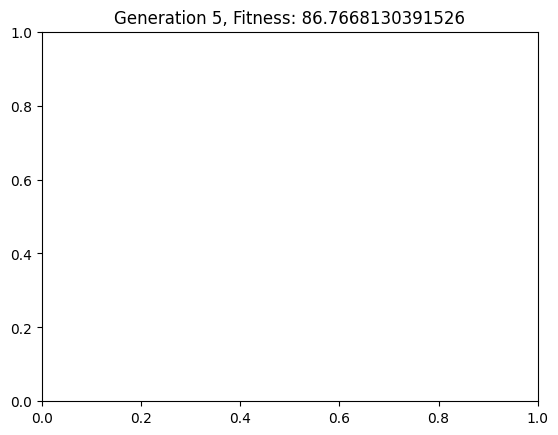

{'rooms': [{'name': 'Living Room', 'position': (227, 181), 'size': (213, 143)}, {'name': 'Bedroom1', 'position': (599, 319), 'size': (115, 187)}, {'name': 'Bedroom2', 'position': (332, 330), 'size': (108, 188)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 89), 'size': (98, 168)}, {'name': 'Washroom', 'position': (447, 155), 'size': (63, 101)}], 'fitness': 67.53873568868731}


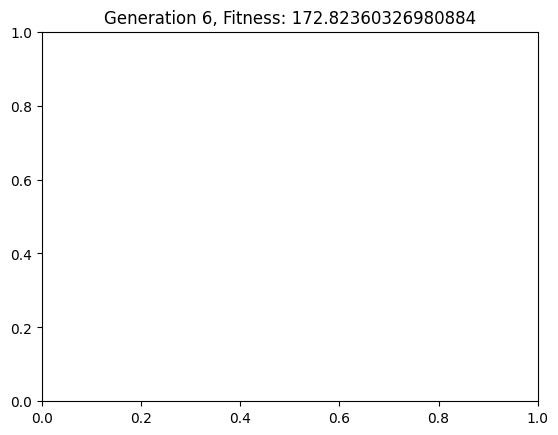

{'rooms': [{'name': 'Living Room', 'position': (223, 180), 'size': (217, 150)}, {'name': 'Bedroom1', 'position': (599, 319), 'size': (123, 195)}, {'name': 'Bedroom2', 'position': (328, 330), 'size': (112, 196)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 88), 'size': (105, 169)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': 172.82360326980884}


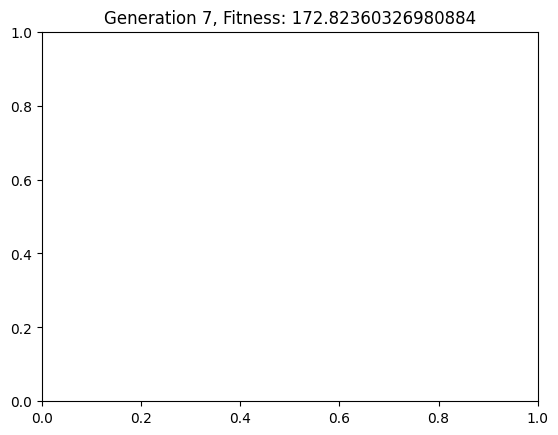

{'rooms': [{'name': 'Living Room', 'position': (223, 176), 'size': (217, 154)}, {'name': 'Bedroom1', 'position': (599, 319), 'size': (131, 203)}, {'name': 'Bedroom2', 'position': (324, 330), 'size': (116, 204)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 62), 'size': (110, 195)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': 54.04793120706023}


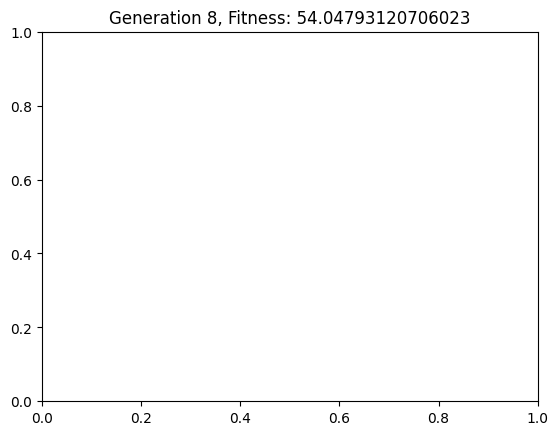

{'rooms': [{'name': 'Living Room', 'position': (223, 172), 'size': (217, 158)}, {'name': 'Bedroom1', 'position': (599, 319), 'size': (139, 211)}, {'name': 'Bedroom2', 'position': (320, 330), 'size': (120, 212)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 62), 'size': (113, 195)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -51.87877033077618}


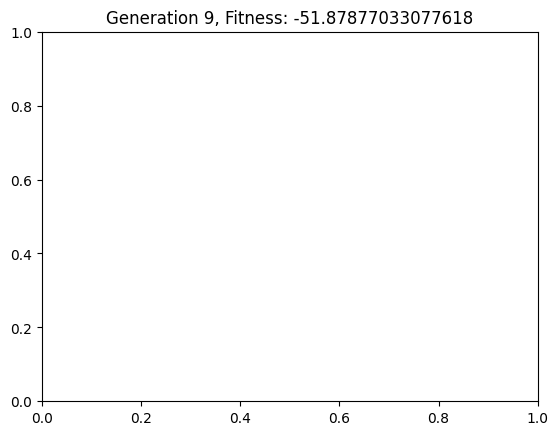

{'rooms': [{'name': 'Living Room', 'position': (223, 168), 'size': (217, 162)}, {'name': 'Bedroom1', 'position': (599, 319), 'size': (147, 219)}, {'name': 'Bedroom2', 'position': (316, 330), 'size': (124, 220)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 56), 'size': (117, 201)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -136.7914454430132}


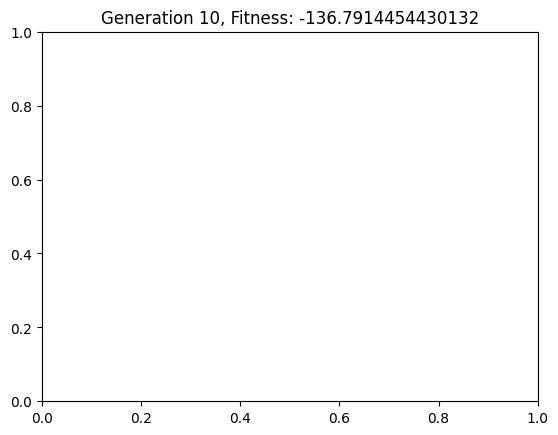

{'rooms': [{'name': 'Living Room', 'position': (223, 164), 'size': (217, 166)}, {'name': 'Bedroom1', 'position': (598, 319), 'size': (149, 227)}, {'name': 'Bedroom2', 'position': (312, 330), 'size': (128, 228)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 63), 'size': (120, 194)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -144.03183470148122}


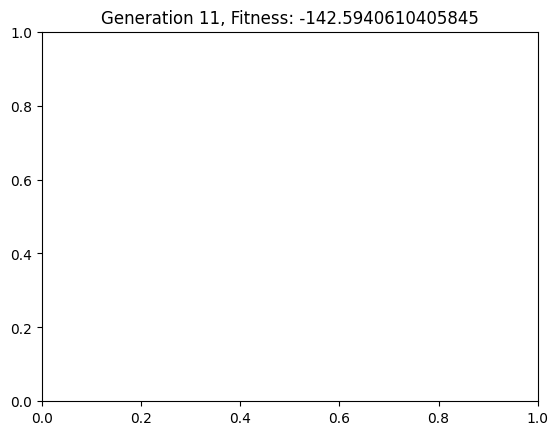

{'rooms': [{'name': 'Living Room', 'position': (223, 159), 'size': (217, 169)}, {'name': 'Bedroom1', 'position': (598, 319), 'size': (149, 235)}, {'name': 'Bedroom2', 'position': (308, 328), 'size': (132, 232)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 61), 'size': (123, 196)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -142.5940610405845}


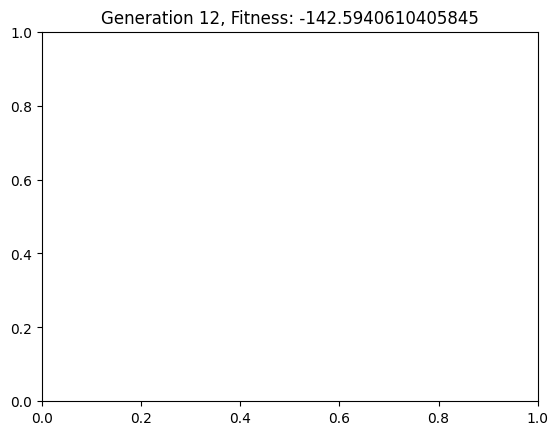

{'rooms': [{'name': 'Living Room', 'position': (223, 153), 'size': (217, 171)}, {'name': 'Bedroom1', 'position': (598, 318), 'size': (149, 242)}, {'name': 'Bedroom2', 'position': (304, 325), 'size': (136, 235)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 55), 'size': (124, 202)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -147.0329704455289}


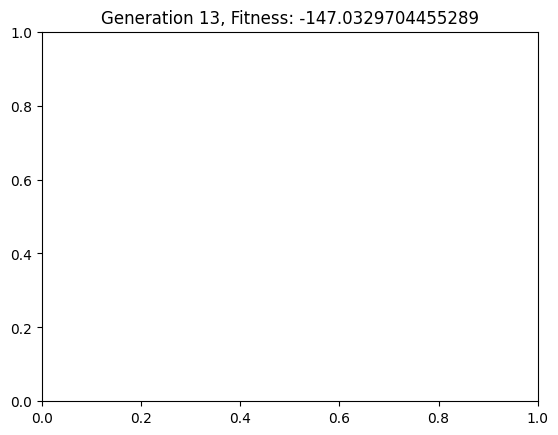

{'rooms': [{'name': 'Living Room', 'position': (223, 148), 'size': (217, 174)}, {'name': 'Bedroom1', 'position': (598, 314), 'size': (149, 246)}, {'name': 'Bedroom2', 'position': (300, 322), 'size': (140, 237)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 57), 'size': (125, 200)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -152.79708896475006}


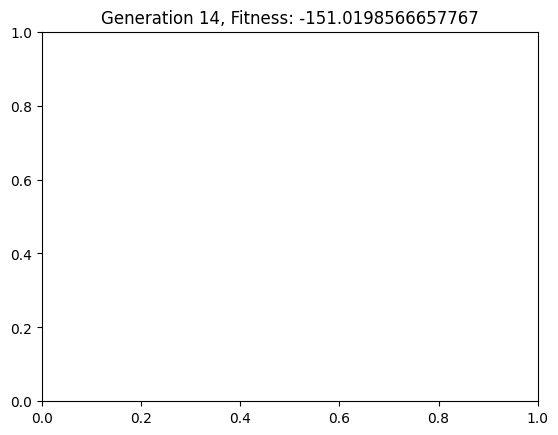

{'rooms': [{'name': 'Living Room', 'position': (223, 143), 'size': (217, 177)}, {'name': 'Bedroom1', 'position': (598, 310), 'size': (149, 250)}, {'name': 'Bedroom2', 'position': (296, 320), 'size': (144, 240)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 57), 'size': (125, 200)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -151.0198566657767}


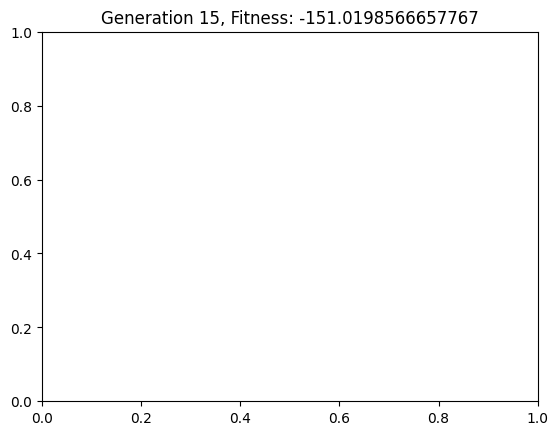

{'rooms': [{'name': 'Living Room', 'position': (223, 137), 'size': (217, 179)}, {'name': 'Bedroom1', 'position': (598, 306), 'size': (149, 254)}, {'name': 'Bedroom2', 'position': (292, 317), 'size': (148, 243)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (126, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -153.95520565682457}


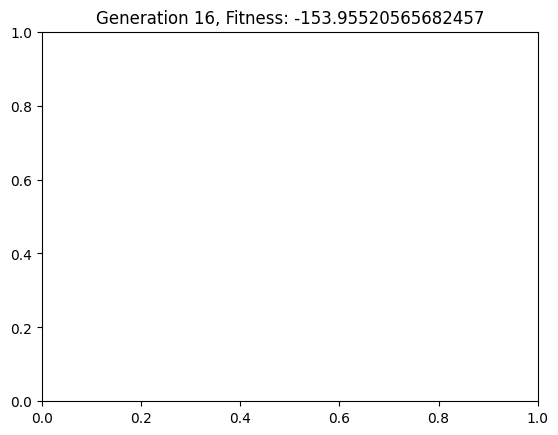

{'rooms': [{'name': 'Living Room', 'position': (223, 132), 'size': (217, 182)}, {'name': 'Bedroom1', 'position': (598, 302), 'size': (149, 258)}, {'name': 'Bedroom2', 'position': (288, 314), 'size': (152, 245)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (127, 204)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -158.5822848220383}


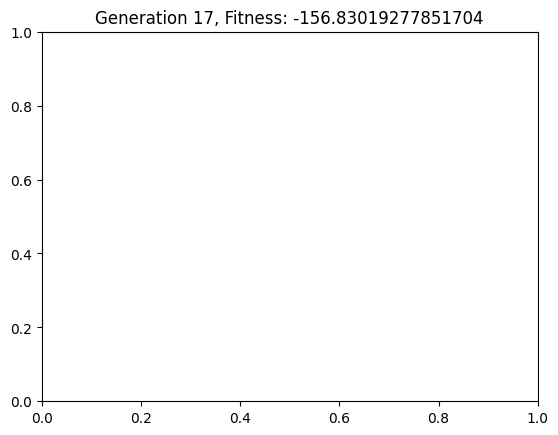

{'rooms': [{'name': 'Living Room', 'position': (223, 127), 'size': (217, 185)}, {'name': 'Bedroom1', 'position': (598, 298), 'size': (149, 262)}, {'name': 'Bedroom2', 'position': (284, 312), 'size': (156, 248)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -156.83019277851704}


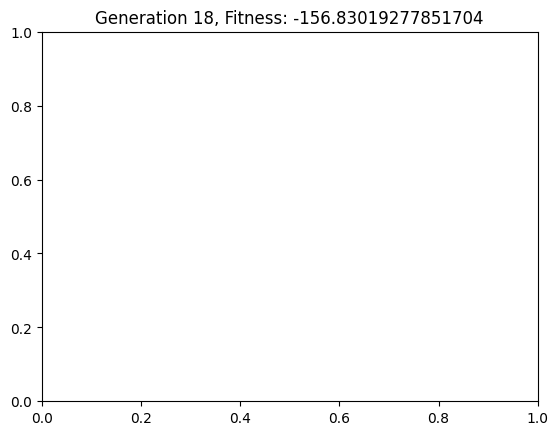

{'rooms': [{'name': 'Living Room', 'position': (223, 121), 'size': (217, 187)}, {'name': 'Bedroom1', 'position': (598, 294), 'size': (149, 266)}, {'name': 'Bedroom2', 'position': (280, 309), 'size': (160, 251)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -161.06258024106066}


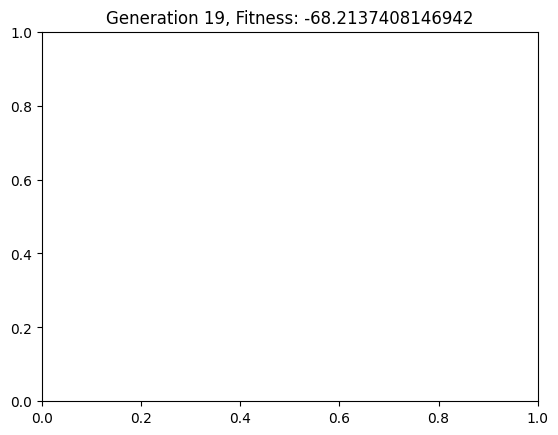

{'rooms': [{'name': 'Living Room', 'position': (223, 116), 'size': (217, 190)}, {'name': 'Bedroom1', 'position': (598, 290), 'size': (149, 270)}, {'name': 'Bedroom2', 'position': (276, 306), 'size': (164, 253)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -68.2137408146942}


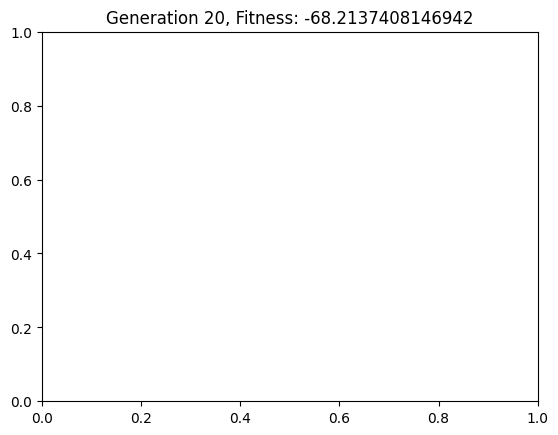

{'rooms': [{'name': 'Living Room', 'position': (223, 111), 'size': (217, 193)}, {'name': 'Bedroom1', 'position': (598, 286), 'size': (149, 274)}, {'name': 'Bedroom2', 'position': (272, 304), 'size': (168, 256)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -70.02577690334212}


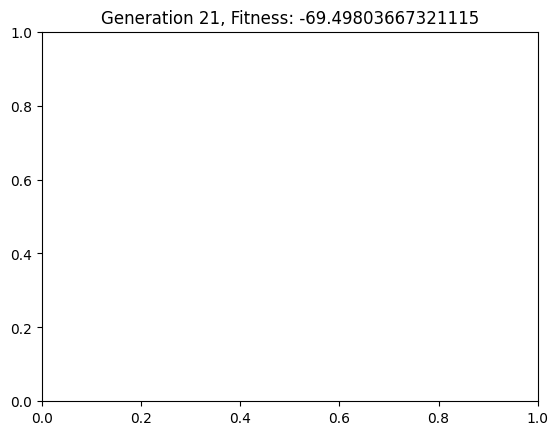

{'rooms': [{'name': 'Living Room', 'position': (223, 105), 'size': (217, 195)}, {'name': 'Bedroom1', 'position': (598, 282), 'size': (149, 278)}, {'name': 'Bedroom2', 'position': (268, 301), 'size': (172, 259)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -69.49803667321115}


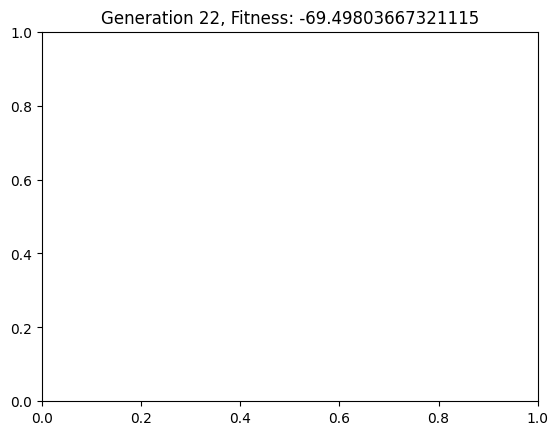

{'rooms': [{'name': 'Living Room', 'position': (223, 100), 'size': (217, 198)}, {'name': 'Bedroom1', 'position': (598, 278), 'size': (149, 282)}, {'name': 'Bedroom2', 'position': (264, 298), 'size': (176, 261)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -73.9402077053923}


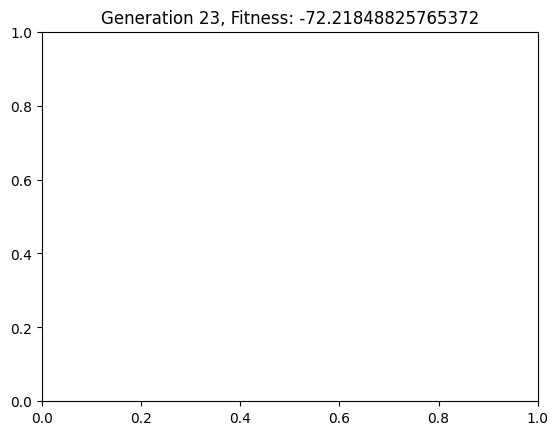

{'rooms': [{'name': 'Living Room', 'position': (223, 95), 'size': (217, 201)}, {'name': 'Bedroom1', 'position': (598, 274), 'size': (149, 286)}, {'name': 'Bedroom2', 'position': (260, 296), 'size': (180, 264)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -72.21848825765372}


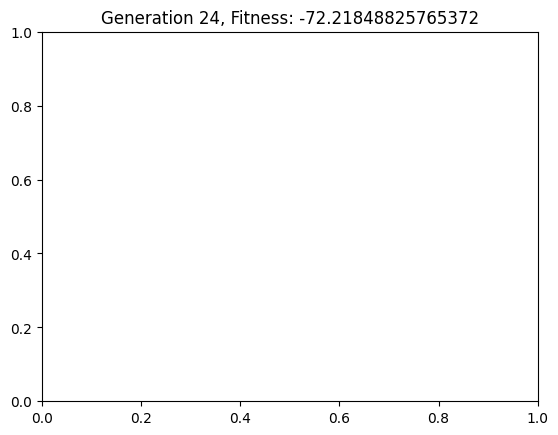

{'rooms': [{'name': 'Living Room', 'position': (223, 89), 'size': (217, 203)}, {'name': 'Bedroom1', 'position': (598, 270), 'size': (149, 290)}, {'name': 'Bedroom2', 'position': (256, 293), 'size': (184, 267)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -74.09648071054045}


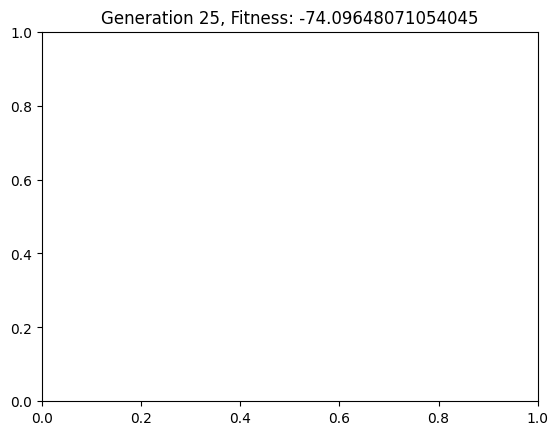

{'rooms': [{'name': 'Living Room', 'position': (223, 84), 'size': (217, 206)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (252, 290), 'size': (188, 269)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -77.36176081017604}


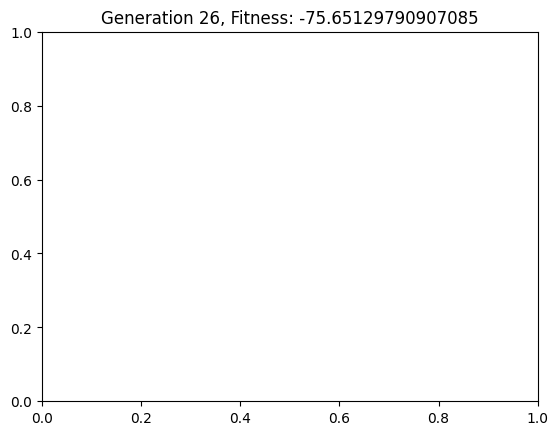

{'rooms': [{'name': 'Living Room', 'position': (223, 79), 'size': (217, 209)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (248, 288), 'size': (192, 272)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -75.65129790907085}


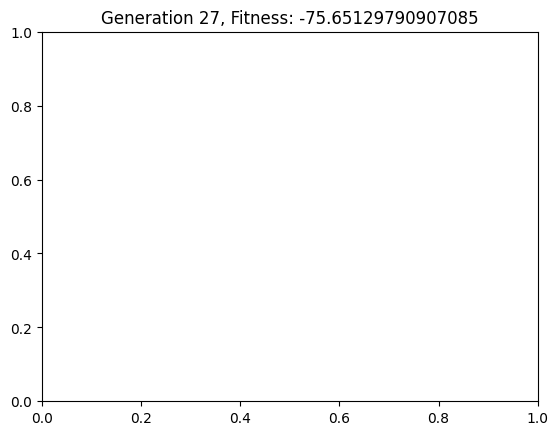

{'rooms': [{'name': 'Living Room', 'position': (223, 73), 'size': (217, 211)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (244, 285), 'size': (196, 275)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -76.88465614944933}


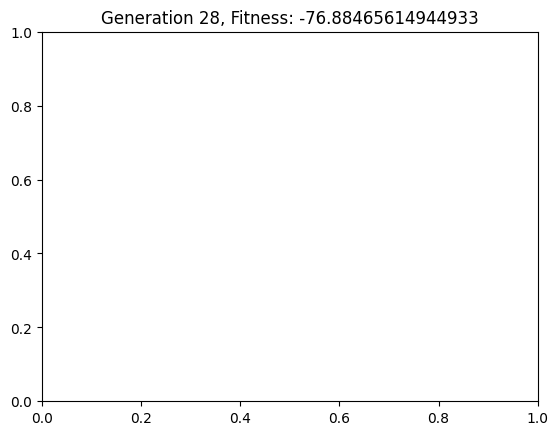

{'rooms': [{'name': 'Living Room', 'position': (223, 68), 'size': (217, 214)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (240, 282), 'size': (200, 277)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -186.14275174778243}


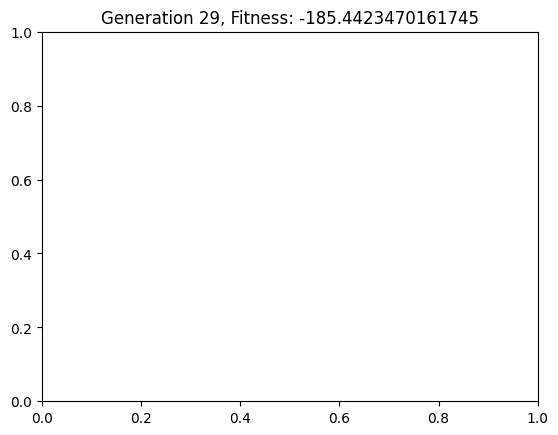

{'rooms': [{'name': 'Living Room', 'position': (223, 63), 'size': (217, 217)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (236, 280), 'size': (204, 280)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -185.4423470161745}


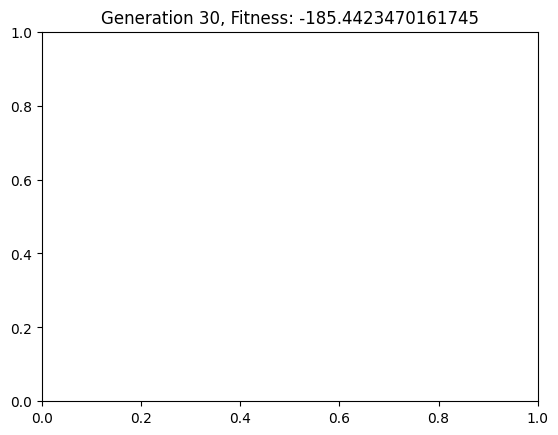

{'rooms': [{'name': 'Living Room', 'position': (223, 57), 'size': (217, 219)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (232, 277), 'size': (208, 283)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -191.87097325663842}


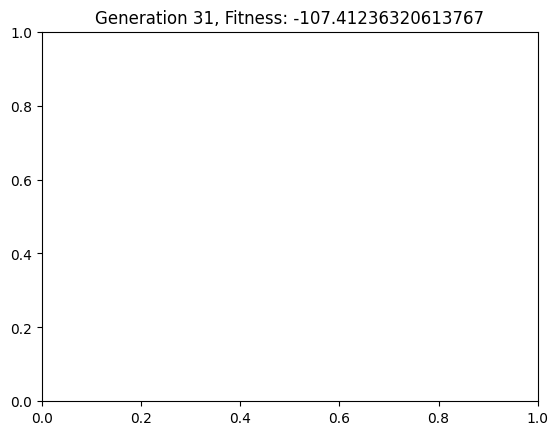

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (228, 274), 'size': (212, 285)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -107.41236320613767}


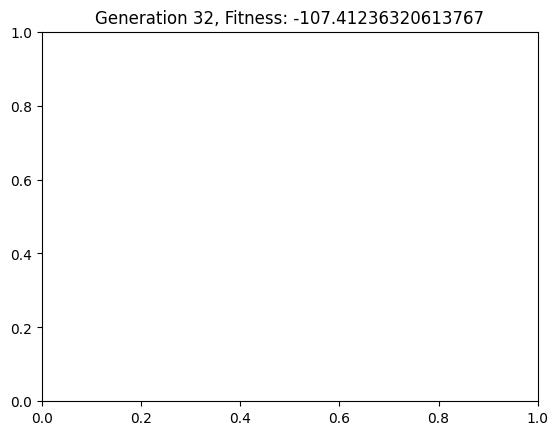

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (224, 274), 'size': (216, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -112.42950600314279}


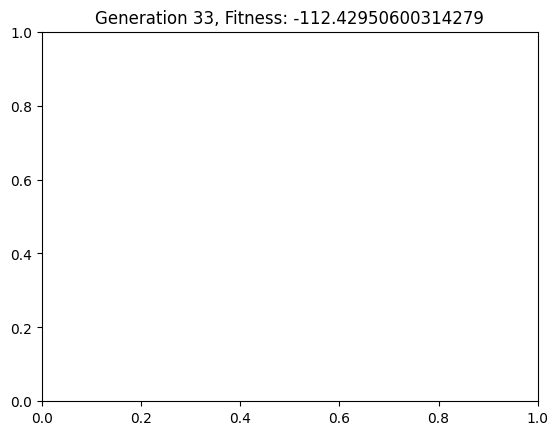

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (220, 274), 'size': (220, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -112.42950600314279}


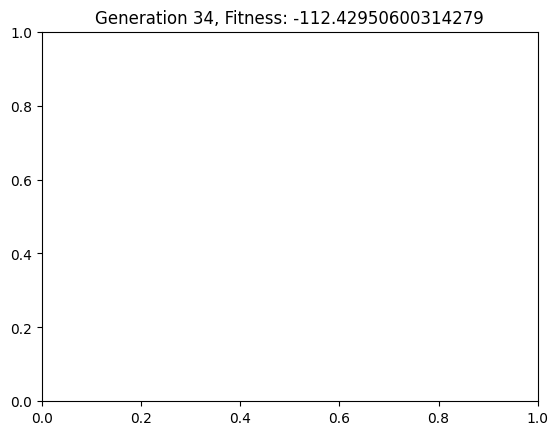

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (216, 274), 'size': (224, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -112.42950600314279}


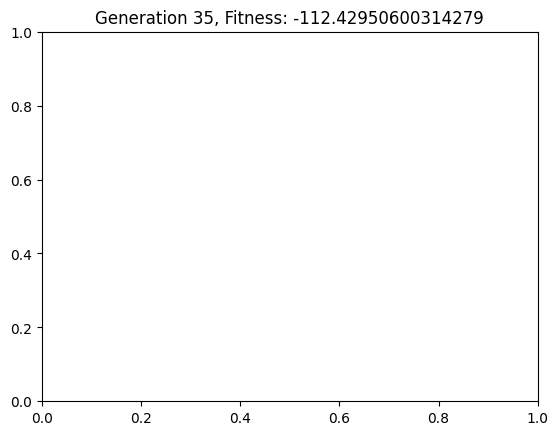

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (212, 274), 'size': (228, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -112.42950600314279}


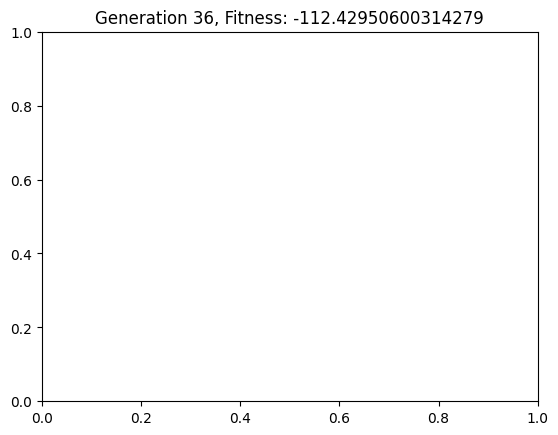

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (208, 274), 'size': (232, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -112.42950600314279}


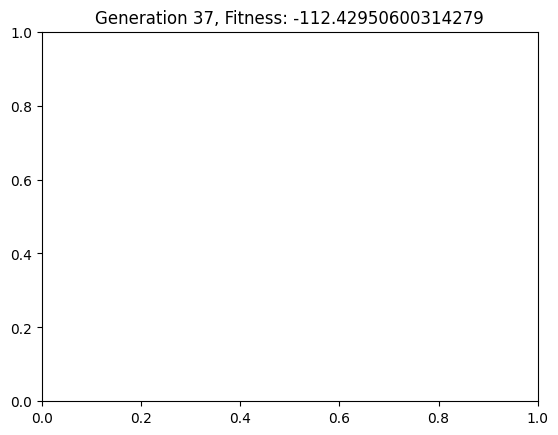

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (204, 274), 'size': (236, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -112.42950600314279}


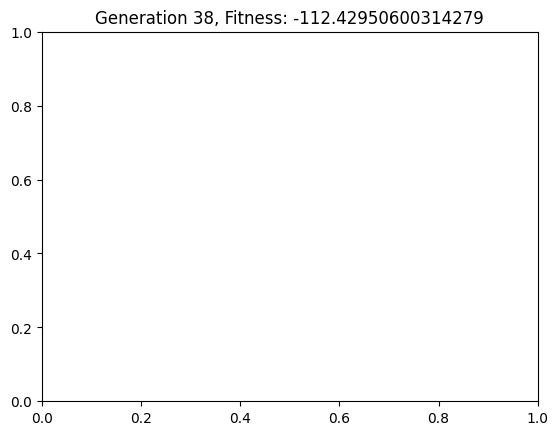

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (200, 274), 'size': (240, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -112.42950600314279}


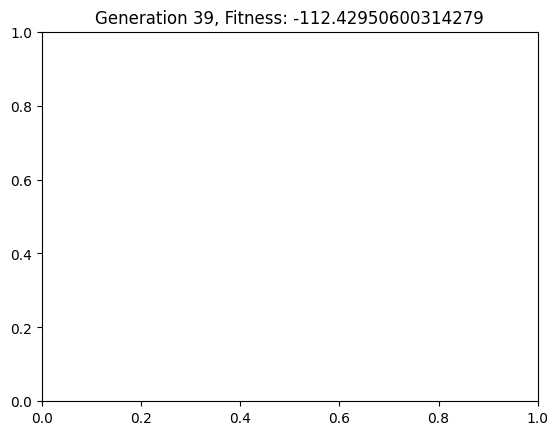

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (196, 274), 'size': (244, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -112.42950600314279}


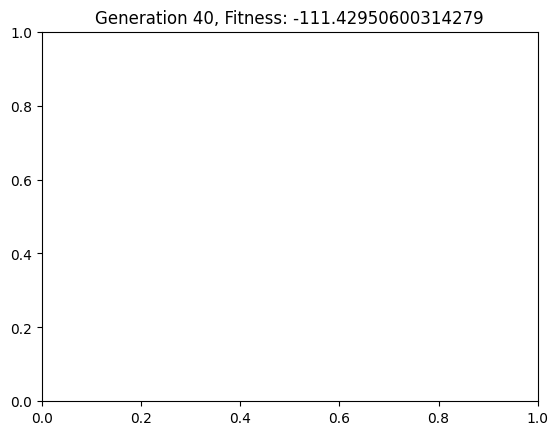

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (192, 274), 'size': (248, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -111.42950600314279}


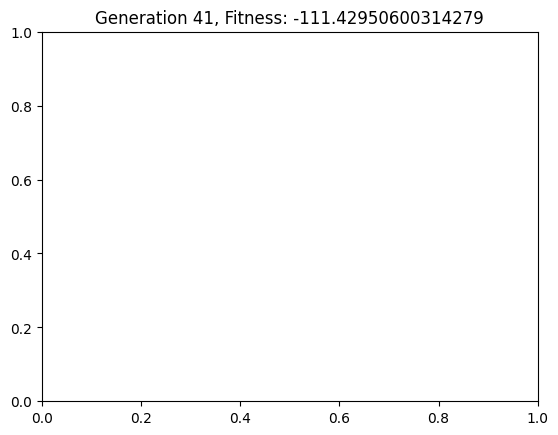

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (188, 274), 'size': (252, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -111.42950600314279}


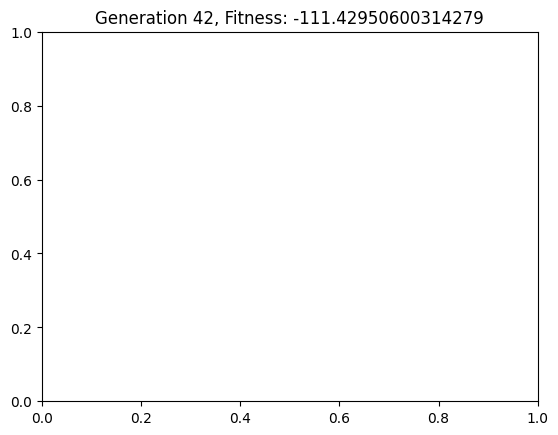

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (184, 274), 'size': (256, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -111.42950600314279}


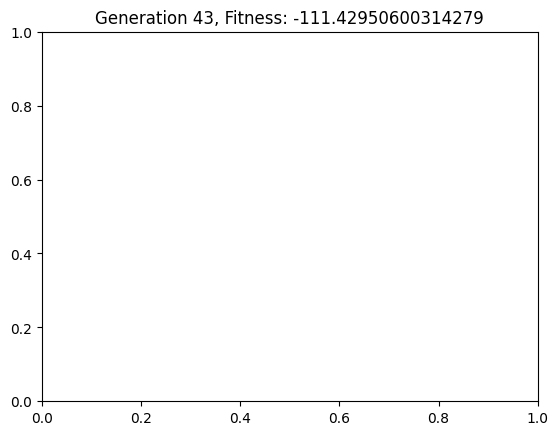

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (180, 274), 'size': (260, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -111.42950600314279}


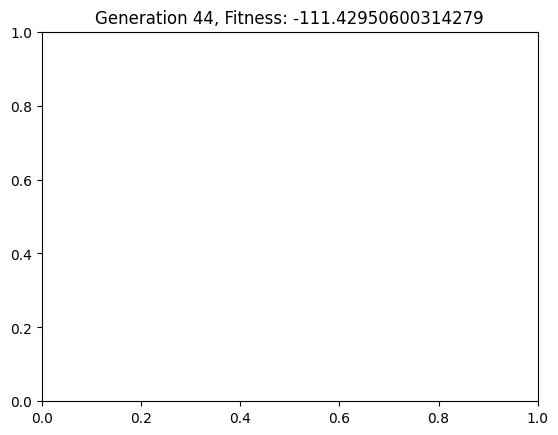

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (176, 274), 'size': (264, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -111.42950600314279}


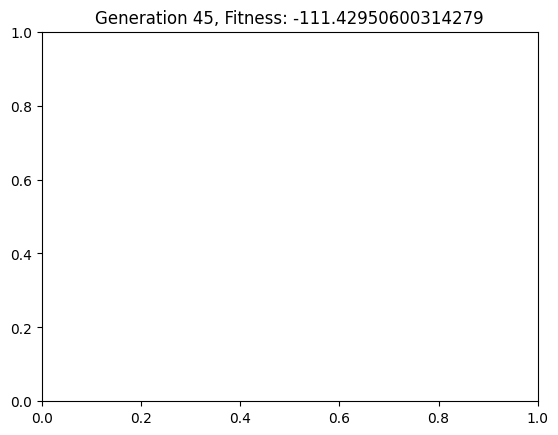

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (172, 274), 'size': (268, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -111.42950600314279}


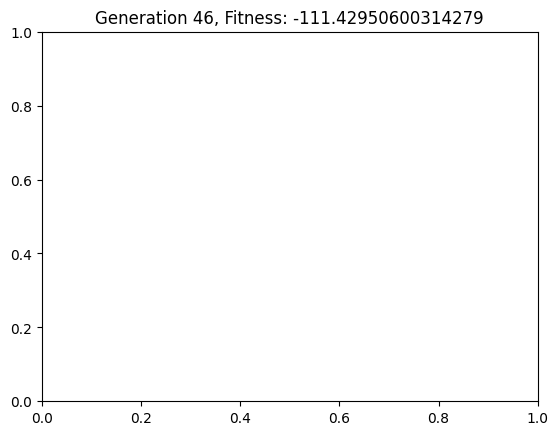

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (168, 274), 'size': (272, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -111.42950600314279}


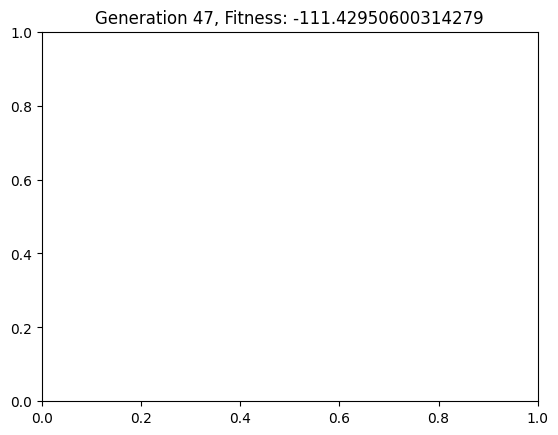

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (164, 274), 'size': (276, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -111.42950600314279}


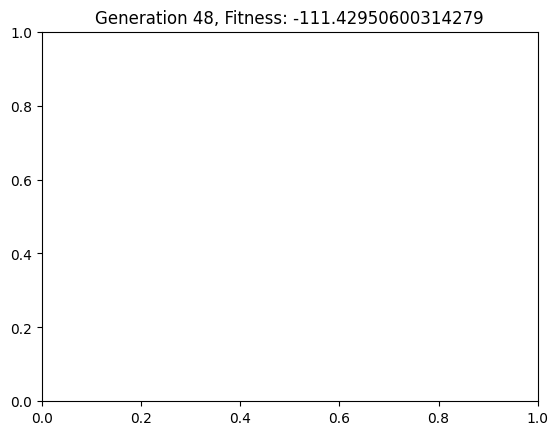

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (160, 274), 'size': (280, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -111.42950600314279}


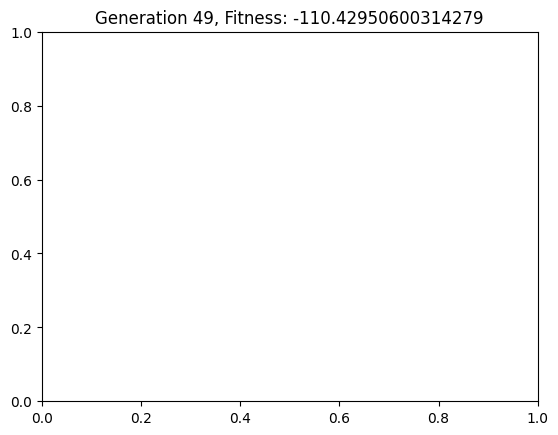

{'rooms': [{'name': 'Living Room', 'position': (223, 52), 'size': (217, 222)}, {'name': 'Bedroom1', 'position': (598, 266), 'size': (149, 294)}, {'name': 'Bedroom2', 'position': (156, 274), 'size': (284, 286)}, {'name': 'Passage', 'position': (441, 257), 'size': (157, 88)}, {'name': 'Kitchen', 'position': (510, 52), 'size': (128, 205)}, {'name': 'Washroom', 'position': (440, 133), 'size': (70, 123)}], 'fitness': -110.42950600314279}
Elapsed time: 886.46 seconds


<Figure size 640x480 with 0 Axes>

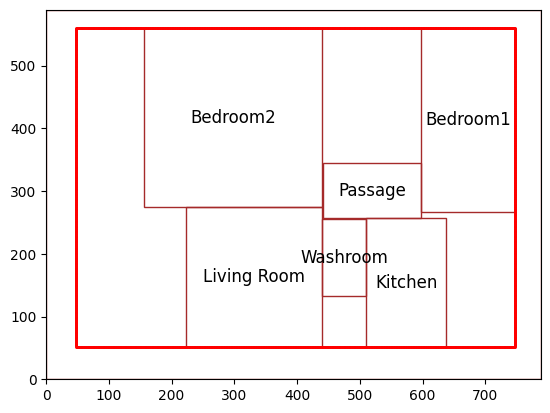

Elapsed time for initial population generation: 29.25 seconds


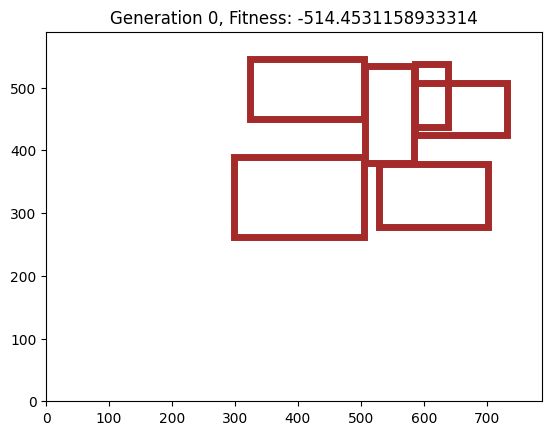

{'rooms': [{'name': 'Living Room', 'position': (299, 261), 'size': (206, 129)}, {'name': 'Passage', 'position': (506, 379), 'size': (79, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}, {'name': 'Bedroom1', 'position': (529, 277), 'size': (173, 101)}, {'name': 'Bedroom2', 'position': (324, 450), 'size': (181, 96)}], 'fitness': -514.4531158933314}


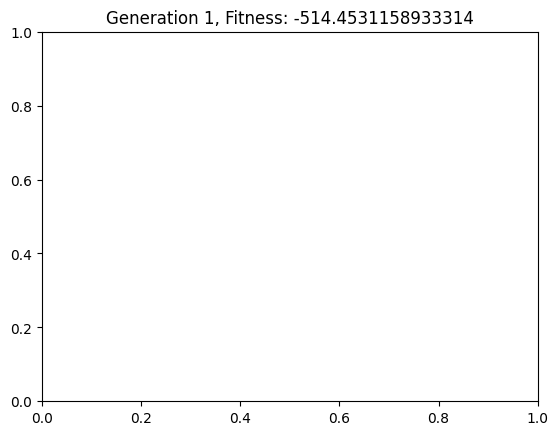

{'rooms': [{'name': 'Living Room', 'position': (298, 261), 'size': (207, 131)}, {'name': 'Passage', 'position': (505, 379), 'size': (80, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}, {'name': 'Bedroom1', 'position': (529, 276), 'size': (175, 102)}, {'name': 'Bedroom2', 'position': (323, 450), 'size': (182, 98)}], 'fitness': -514.4531158933314}


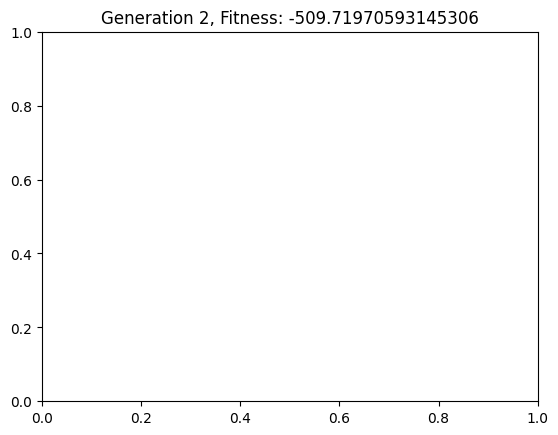

{'rooms': [{'name': 'Living Room', 'position': (295, 261), 'size': (209, 136)}, {'name': 'Bedroom1', 'position': (529, 274), 'size': (180, 105)}, {'name': 'Bedroom2', 'position': (320, 450), 'size': (184, 103)}, {'name': 'Passage', 'position': (504, 379), 'size': (82, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -509.71970593145306}


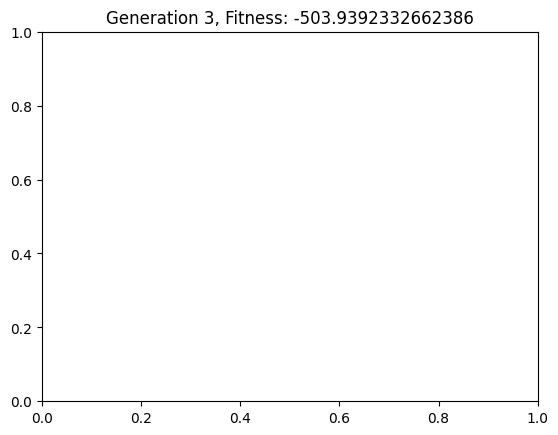

{'rooms': [{'name': 'Living Room', 'position': (289, 261), 'size': (211, 144)}, {'name': 'Bedroom1', 'position': (529, 270), 'size': (188, 109)}, {'name': 'Bedroom2', 'position': (314, 449), 'size': (186, 110)}, {'name': 'Passage', 'position': (501, 379), 'size': (85, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -503.9392332662386}


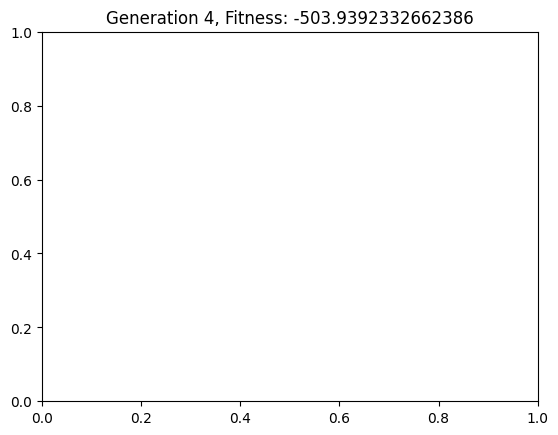

{'rooms': [{'name': 'Living Room', 'position': (284, 261), 'size': (214, 152)}, {'name': 'Bedroom1', 'position': (529, 266), 'size': (196, 113)}, {'name': 'Bedroom2', 'position': (309, 445), 'size': (189, 114)}, {'name': 'Passage', 'position': (498, 379), 'size': (87, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -723.6511447433677}


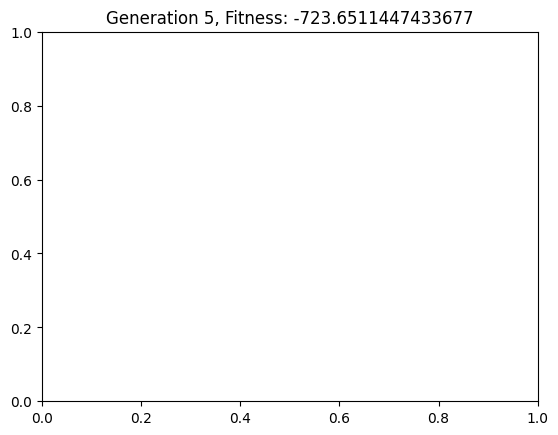

{'rooms': [{'name': 'Living Room', 'position': (279, 261), 'size': (217, 160)}, {'name': 'Bedroom1', 'position': (529, 262), 'size': (204, 117)}, {'name': 'Bedroom2', 'position': (304, 441), 'size': (192, 118)}, {'name': 'Passage', 'position': (496, 379), 'size': (90, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -735.393842760703}


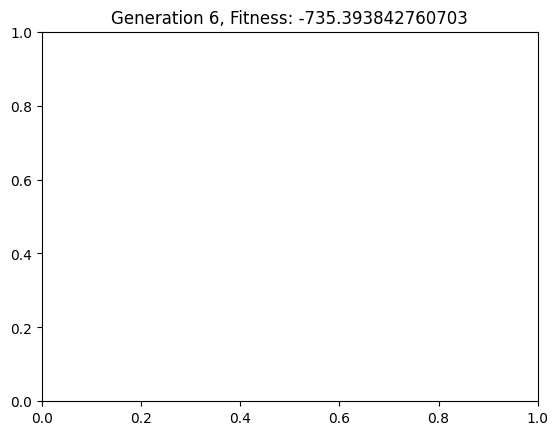

{'rooms': [{'name': 'Living Room', 'position': (273, 261), 'size': (219, 168)}, {'name': 'Bedroom1', 'position': (529, 258), 'size': (212, 121)}, {'name': 'Bedroom2', 'position': (298, 437), 'size': (194, 122)}, {'name': 'Passage', 'position': (493, 379), 'size': (93, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -748.5316470503692}


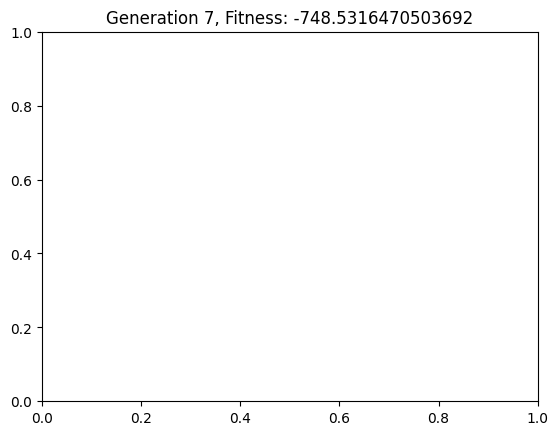

{'rooms': [{'name': 'Living Room', 'position': (268, 259), 'size': (222, 174)}, {'name': 'Bedroom1', 'position': (528, 254), 'size': (219, 125)}, {'name': 'Bedroom2', 'position': (293, 434), 'size': (197, 126)}, {'name': 'Passage', 'position': (490, 379), 'size': (95, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -758.8888143694111}


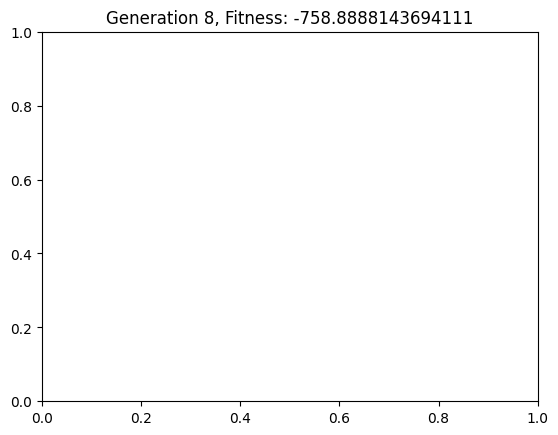

{'rooms': [{'name': 'Living Room', 'position': (263, 254), 'size': (225, 177)}, {'name': 'Bedroom1', 'position': (524, 250), 'size': (223, 129)}, {'name': 'Bedroom2', 'position': (288, 431), 'size': (200, 128)}, {'name': 'Passage', 'position': (488, 379), 'size': (98, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -771.36328304828}


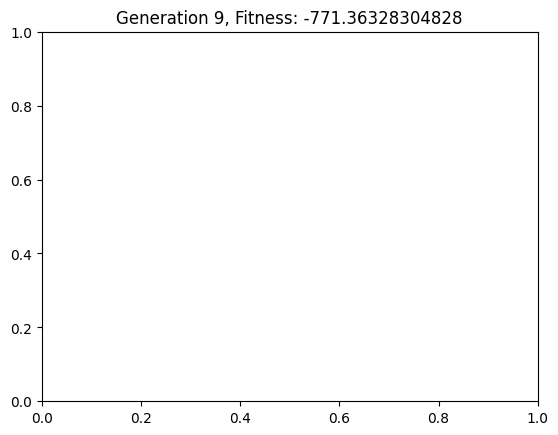

{'rooms': [{'name': 'Living Room', 'position': (257, 249), 'size': (227, 180)}, {'name': 'Bedroom1', 'position': (520, 246), 'size': (227, 133)}, {'name': 'Bedroom2', 'position': (282, 429), 'size': (202, 131)}, {'name': 'Passage', 'position': (485, 379), 'size': (101, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -780.980681689624}


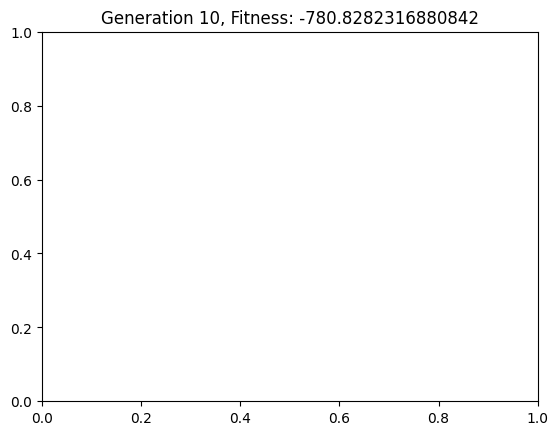

{'rooms': [{'name': 'Living Room', 'position': (252, 243), 'size': (230, 182)}, {'name': 'Bedroom1', 'position': (516, 242), 'size': (231, 137)}, {'name': 'Bedroom2', 'position': (277, 426), 'size': (205, 134)}, {'name': 'Passage', 'position': (482, 379), 'size': (103, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -780.8282316880842}


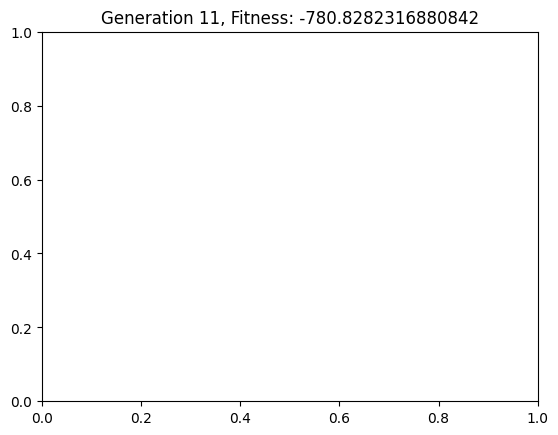

{'rooms': [{'name': 'Living Room', 'position': (247, 238), 'size': (233, 185)}, {'name': 'Bedroom1', 'position': (512, 238), 'size': (235, 141)}, {'name': 'Bedroom2', 'position': (272, 423), 'size': (208, 136)}, {'name': 'Passage', 'position': (480, 379), 'size': (106, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -799.6828049329745}


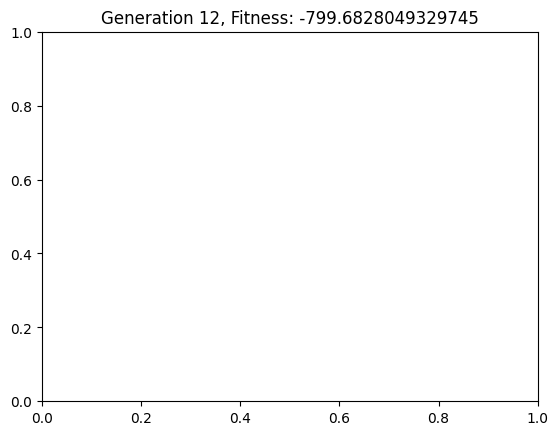

{'rooms': [{'name': 'Living Room', 'position': (241, 233), 'size': (235, 188)}, {'name': 'Bedroom1', 'position': (508, 234), 'size': (239, 145)}, {'name': 'Bedroom2', 'position': (266, 421), 'size': (210, 139)}, {'name': 'Passage', 'position': (477, 379), 'size': (109, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -811.1946850521232}


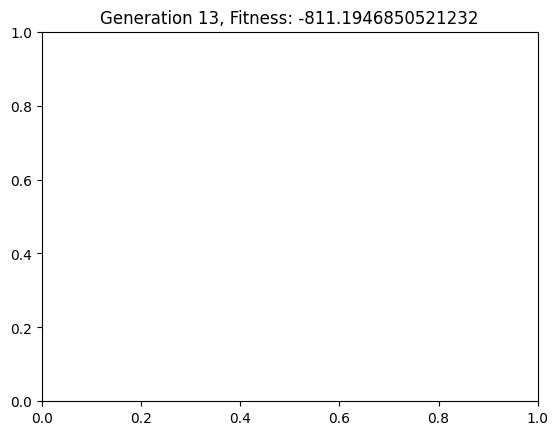

{'rooms': [{'name': 'Living Room', 'position': (236, 227), 'size': (238, 190)}, {'name': 'Bedroom1', 'position': (504, 230), 'size': (243, 149)}, {'name': 'Bedroom2', 'position': (261, 418), 'size': (213, 142)}, {'name': 'Passage', 'position': (474, 379), 'size': (111, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -821.0547195278127}


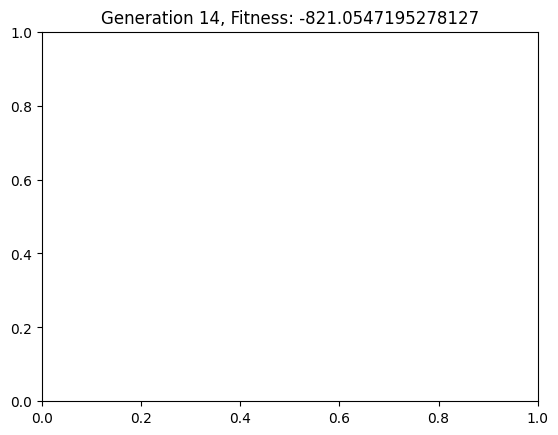

{'rooms': [{'name': 'Living Room', 'position': (231, 222), 'size': (241, 193)}, {'name': 'Bedroom1', 'position': (500, 226), 'size': (247, 153)}, {'name': 'Bedroom2', 'position': (256, 415), 'size': (216, 144)}, {'name': 'Passage', 'position': (472, 379), 'size': (114, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -832.0176832557847}


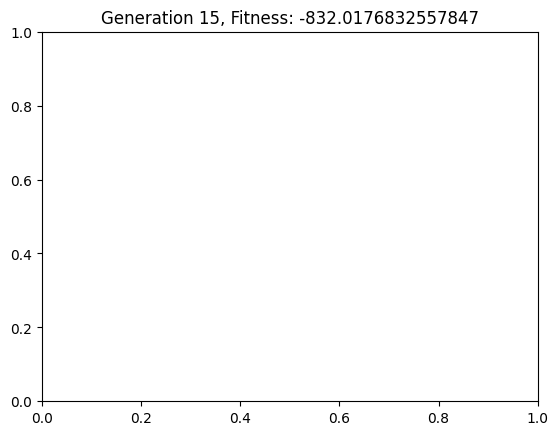

{'rooms': [{'name': 'Living Room', 'position': (225, 217), 'size': (243, 196)}, {'name': 'Bedroom1', 'position': (496, 222), 'size': (251, 157)}, {'name': 'Bedroom2', 'position': (250, 413), 'size': (218, 147)}, {'name': 'Passage', 'position': (469, 379), 'size': (117, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -844.5096034534669}


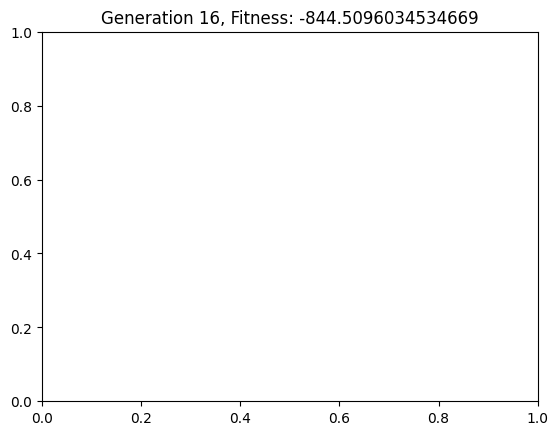

{'rooms': [{'name': 'Living Room', 'position': (221, 211), 'size': (247, 198)}, {'name': 'Bedroom1', 'position': (492, 218), 'size': (255, 161)}, {'name': 'Bedroom2', 'position': (246, 410), 'size': (222, 150)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -854.4921064894033}


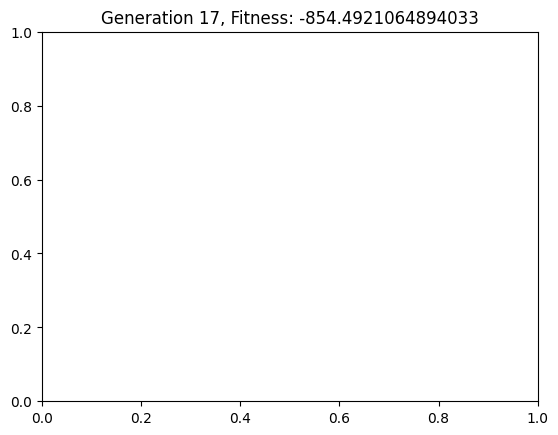

{'rooms': [{'name': 'Living Room', 'position': (217, 206), 'size': (251, 201)}, {'name': 'Bedroom1', 'position': (488, 214), 'size': (259, 165)}, {'name': 'Bedroom2', 'position': (242, 407), 'size': (226, 152)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -949.202214165098}


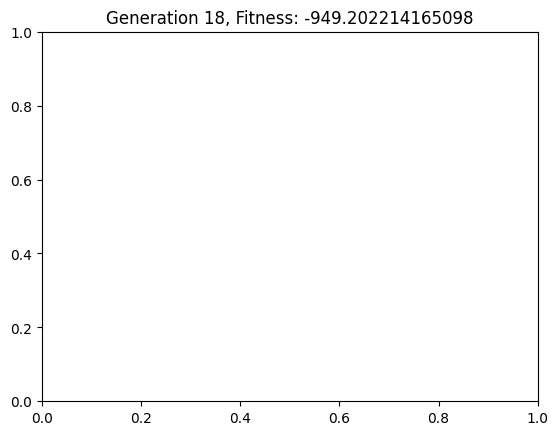

{'rooms': [{'name': 'Living Room', 'position': (213, 201), 'size': (255, 204)}, {'name': 'Bedroom1', 'position': (484, 210), 'size': (263, 169)}, {'name': 'Bedroom2', 'position': (238, 405), 'size': (230, 155)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -964.2627021956837}


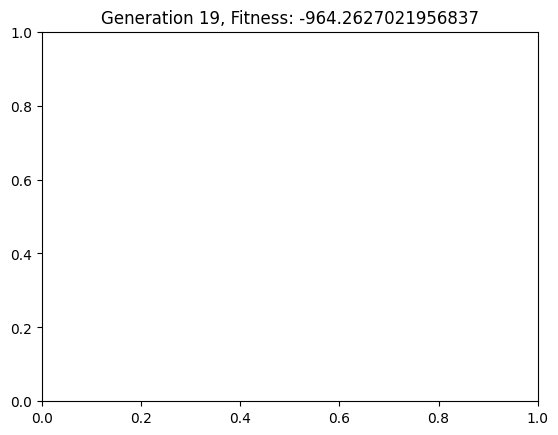

{'rooms': [{'name': 'Living Room', 'position': (209, 195), 'size': (259, 206)}, {'name': 'Bedroom1', 'position': (480, 206), 'size': (267, 173)}, {'name': 'Bedroom2', 'position': (234, 402), 'size': (234, 158)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -978.571436458486}


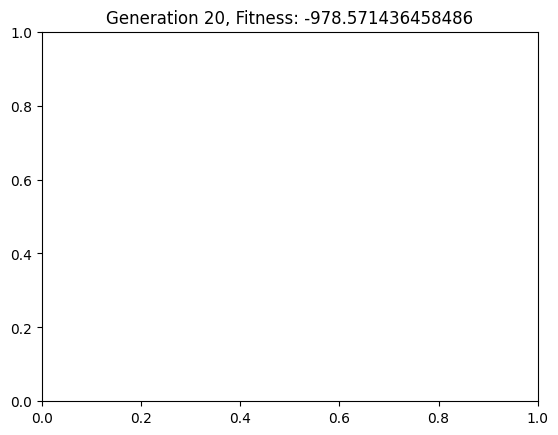

{'rooms': [{'name': 'Living Room', 'position': (205, 190), 'size': (263, 209)}, {'name': 'Bedroom1', 'position': (476, 202), 'size': (271, 177)}, {'name': 'Bedroom2', 'position': (230, 399), 'size': (238, 160)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -993.9093602775943}


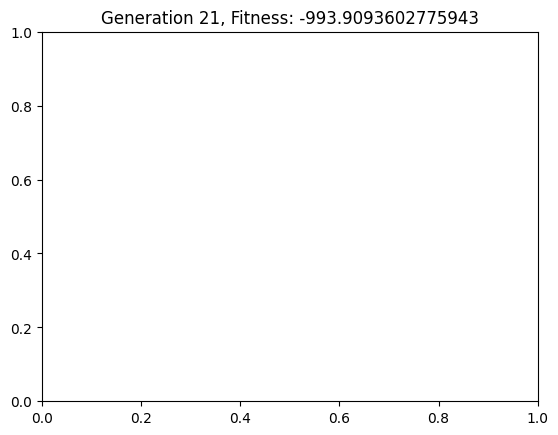

{'rooms': [{'name': 'Living Room', 'position': (201, 185), 'size': (267, 212)}, {'name': 'Bedroom1', 'position': (472, 198), 'size': (275, 181)}, {'name': 'Bedroom2', 'position': (226, 397), 'size': (242, 163)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1008.6742775161493}


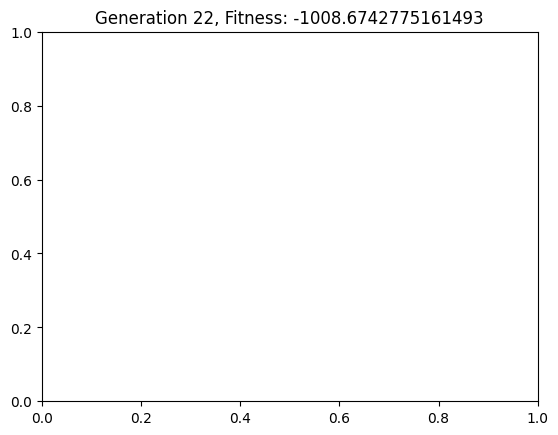

{'rooms': [{'name': 'Living Room', 'position': (197, 179), 'size': (271, 214)}, {'name': 'Bedroom1', 'position': (468, 194), 'size': (279, 185)}, {'name': 'Bedroom2', 'position': (222, 394), 'size': (246, 166)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1024.672305708371}


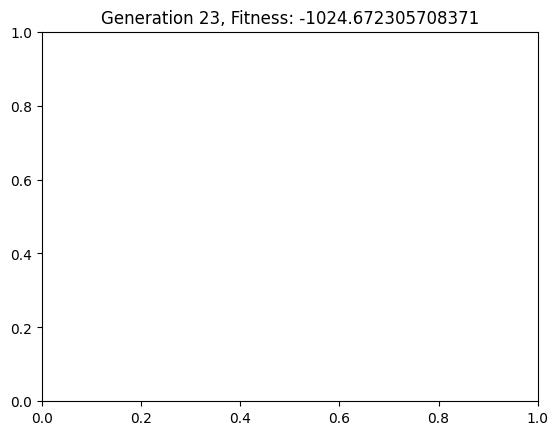

{'rooms': [{'name': 'Living Room', 'position': (196, 174), 'size': (271, 217)}, {'name': 'Bedroom1', 'position': (467, 190), 'size': (280, 189)}, {'name': 'Bedroom2', 'position': (218, 391), 'size': (250, 168)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1039.6040332605369}


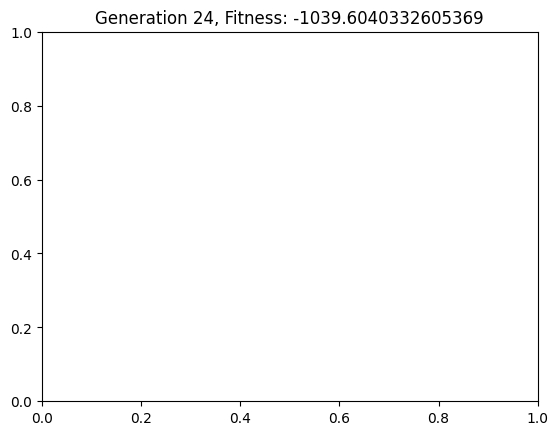

{'rooms': [{'name': 'Living Room', 'position': (196, 169), 'size': (271, 220)}, {'name': 'Bedroom1', 'position': (467, 186), 'size': (280, 193)}, {'name': 'Bedroom2', 'position': (214, 389), 'size': (254, 171)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1050.0286370025892}


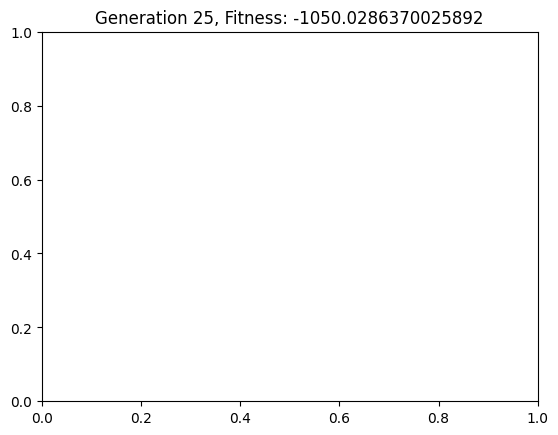

{'rooms': [{'name': 'Living Room', 'position': (196, 163), 'size': (271, 222)}, {'name': 'Bedroom1', 'position': (467, 182), 'size': (280, 197)}, {'name': 'Bedroom2', 'position': (210, 386), 'size': (258, 174)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1060.4017432300445}


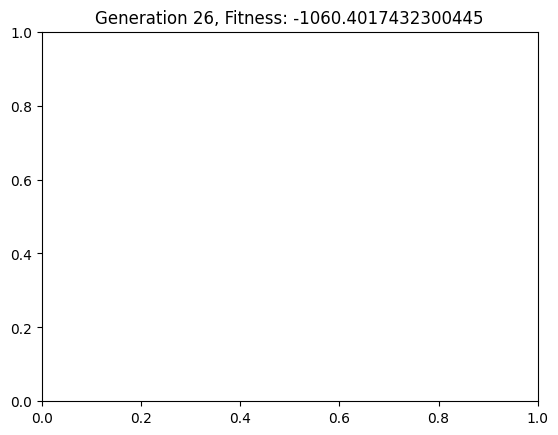

{'rooms': [{'name': 'Living Room', 'position': (196, 158), 'size': (271, 225)}, {'name': 'Bedroom1', 'position': (467, 178), 'size': (280, 201)}, {'name': 'Bedroom2', 'position': (206, 383), 'size': (262, 176)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1069.440370403392}


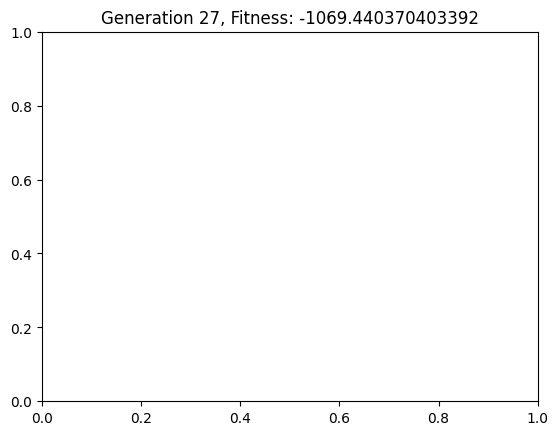

{'rooms': [{'name': 'Living Room', 'position': (196, 153), 'size': (271, 228)}, {'name': 'Bedroom1', 'position': (467, 174), 'size': (280, 205)}, {'name': 'Bedroom2', 'position': (202, 381), 'size': (266, 179)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1079.7522553526485}


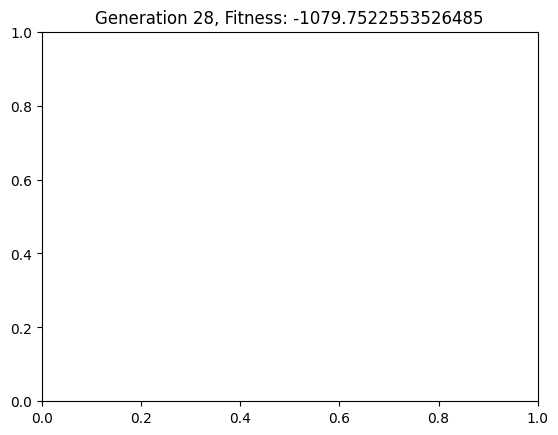

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 170), 'size': (280, 209)}, {'name': 'Bedroom2', 'position': (198, 379), 'size': (270, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1090.0385098181466}


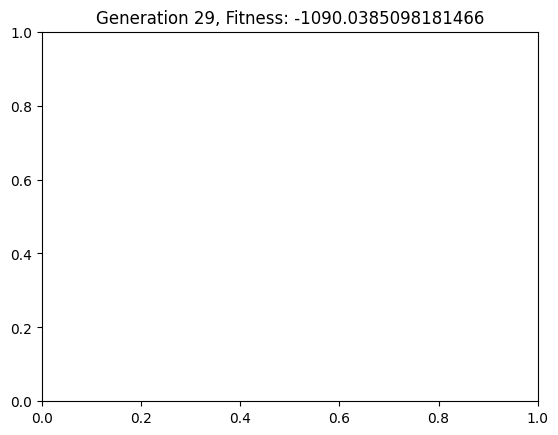

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 166), 'size': (280, 213)}, {'name': 'Bedroom2', 'position': (194, 379), 'size': (274, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1094.740034230776}


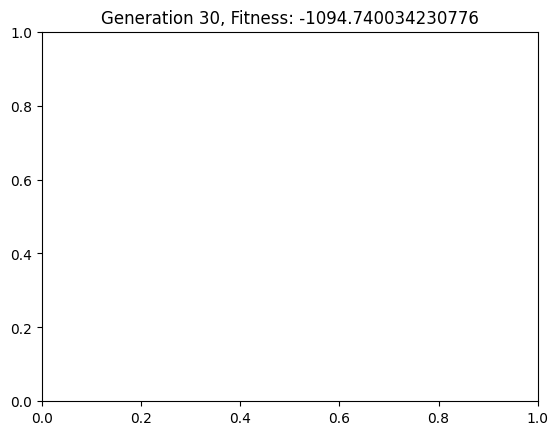

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 162), 'size': (280, 217)}, {'name': 'Bedroom2', 'position': (190, 379), 'size': (278, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1096.1458436116857}


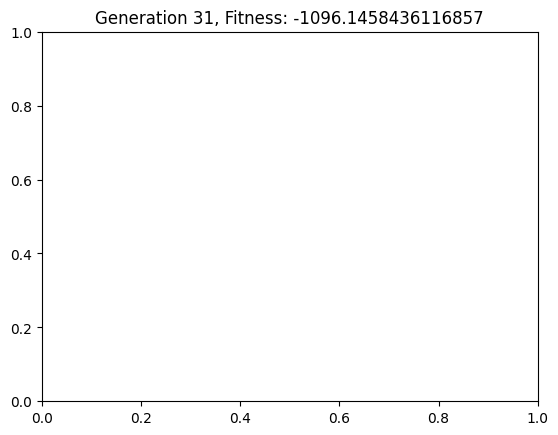

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 158), 'size': (280, 221)}, {'name': 'Bedroom2', 'position': (186, 379), 'size': (282, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1097.497606557879}


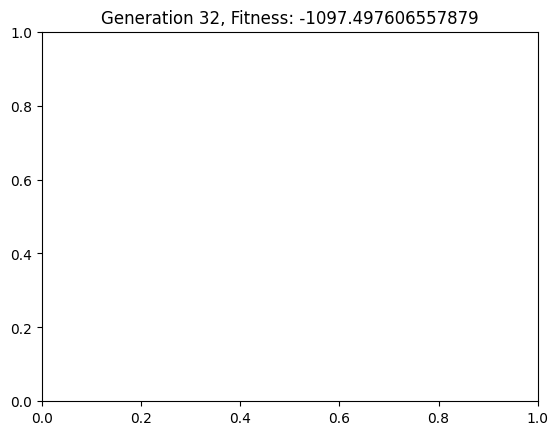

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 154), 'size': (280, 225)}, {'name': 'Bedroom2', 'position': (182, 379), 'size': (286, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1098.7984643232521}


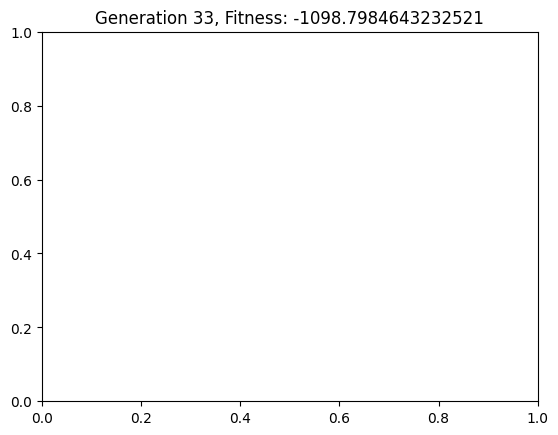

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 150), 'size': (280, 229)}, {'name': 'Bedroom2', 'position': (178, 379), 'size': (290, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1100.051309916507}


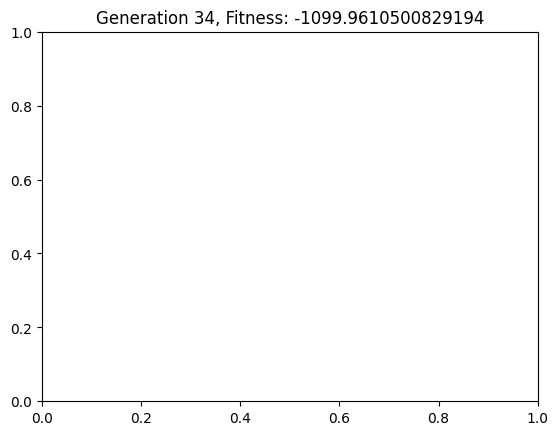

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 146), 'size': (280, 233)}, {'name': 'Bedroom2', 'position': (174, 379), 'size': (294, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1099.9610500829194}


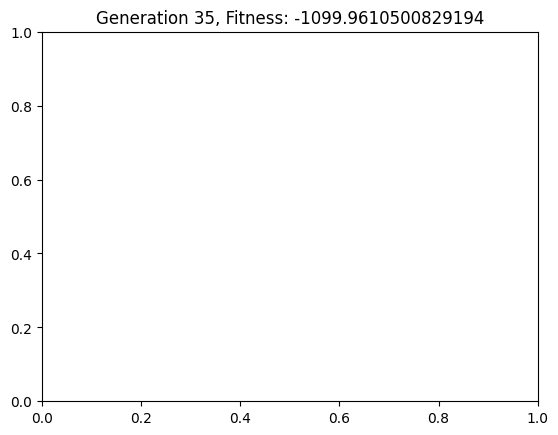

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 142), 'size': (280, 237)}, {'name': 'Bedroom2', 'position': (170, 379), 'size': (298, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1101.423444042212}


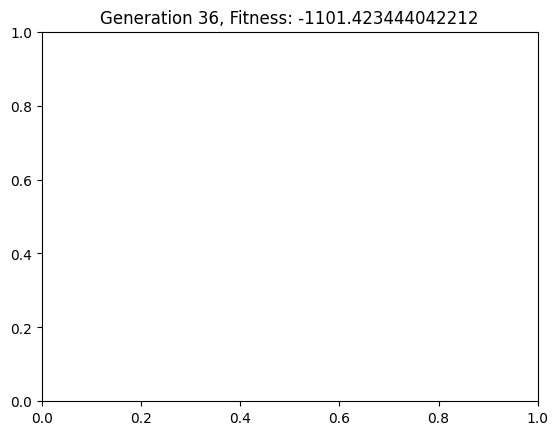

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 138), 'size': (280, 241)}, {'name': 'Bedroom2', 'position': (166, 379), 'size': (302, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1102.5474895478083}


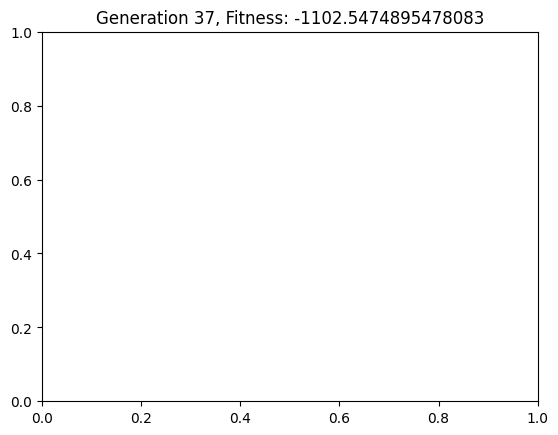

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 134), 'size': (280, 245)}, {'name': 'Bedroom2', 'position': (162, 379), 'size': (306, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1103.6330732343313}


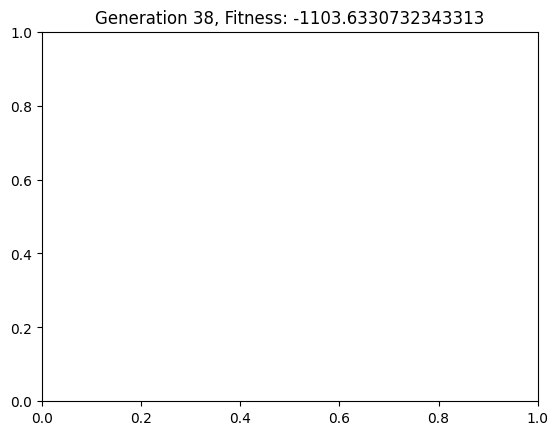

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 130), 'size': (280, 249)}, {'name': 'Bedroom2', 'position': (158, 379), 'size': (310, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1104.6821690306429}


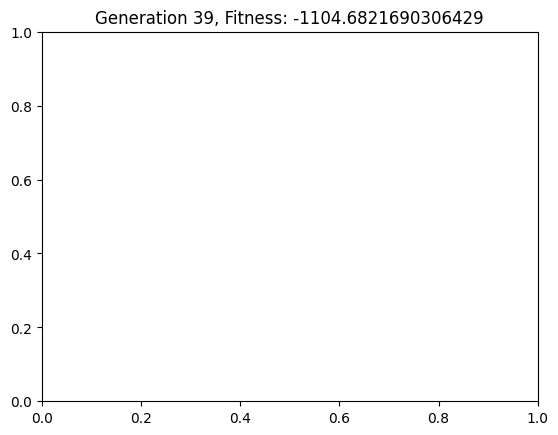

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 126), 'size': (280, 253)}, {'name': 'Bedroom2', 'position': (154, 379), 'size': (314, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1105.6966148517238}


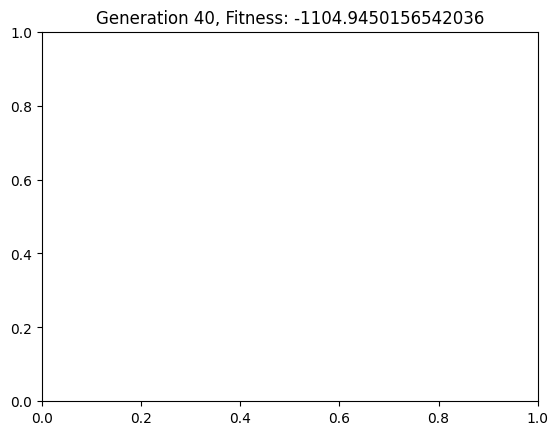

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 122), 'size': (280, 257)}, {'name': 'Bedroom2', 'position': (150, 379), 'size': (318, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1104.9450156542036}


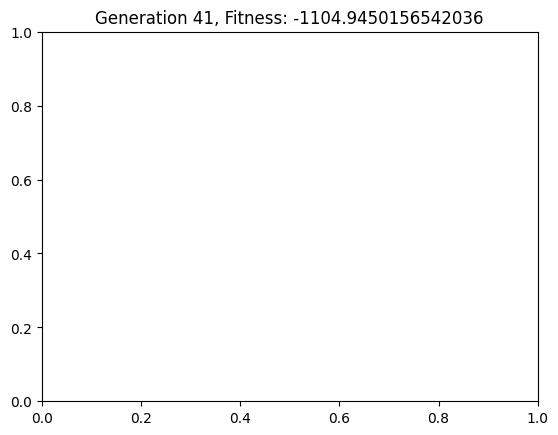

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 118), 'size': (280, 261)}, {'name': 'Bedroom2', 'position': (146, 379), 'size': (322, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1106.6282982288167}


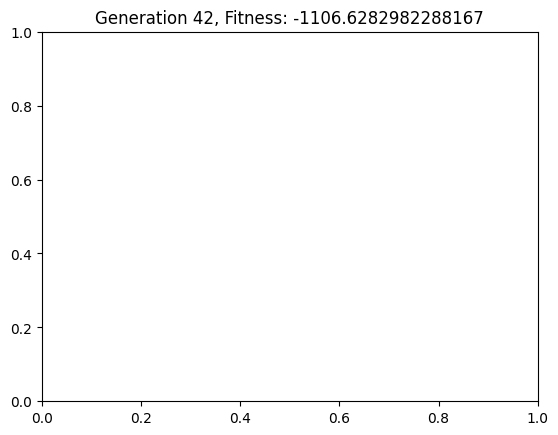

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 114), 'size': (280, 265)}, {'name': 'Bedroom2', 'position': (142, 379), 'size': (326, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1107.5486323489404}


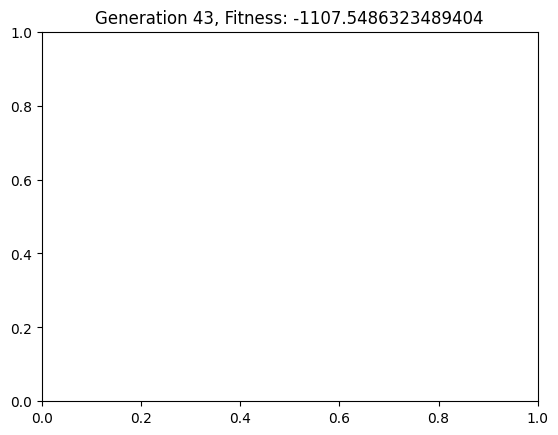

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 110), 'size': (280, 269)}, {'name': 'Bedroom2', 'position': (138, 379), 'size': (330, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1108.4405276564837}


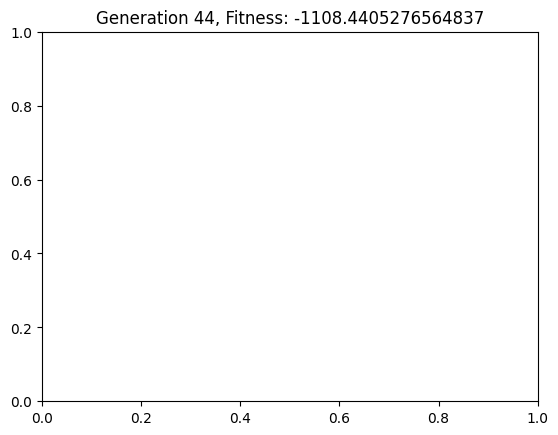

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 106), 'size': (280, 273)}, {'name': 'Bedroom2', 'position': (134, 379), 'size': (334, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1109.3052971620768}


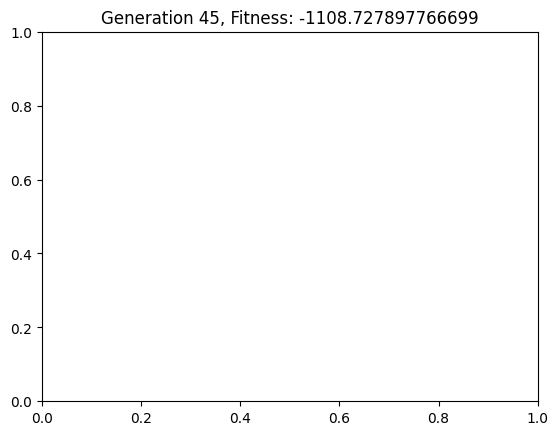

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 102), 'size': (280, 277)}, {'name': 'Bedroom2', 'position': (130, 379), 'size': (338, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1108.727897766699}


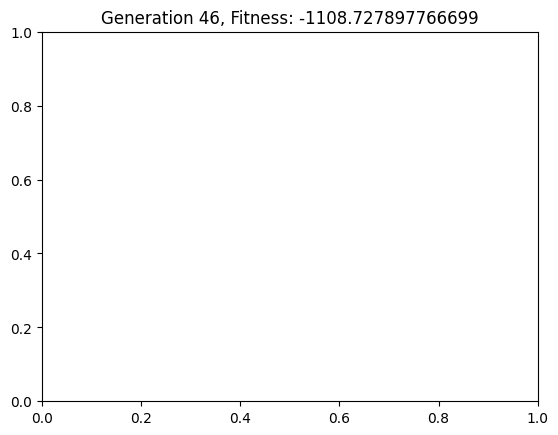

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 98), 'size': (280, 281)}, {'name': 'Bedroom2', 'position': (126, 379), 'size': (342, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1109.9583127225412}


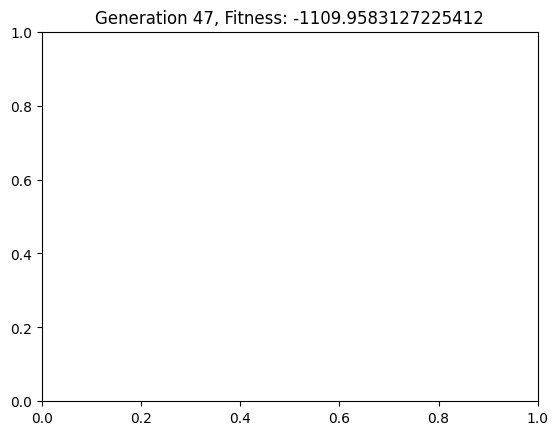

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 94), 'size': (280, 285)}, {'name': 'Bedroom2', 'position': (122, 379), 'size': (346, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1110.7334193590452}


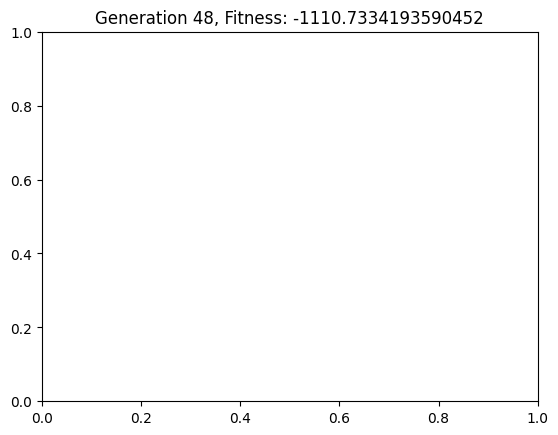

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 90), 'size': (280, 289)}, {'name': 'Bedroom2', 'position': (118, 379), 'size': (350, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1111.4402678798954}


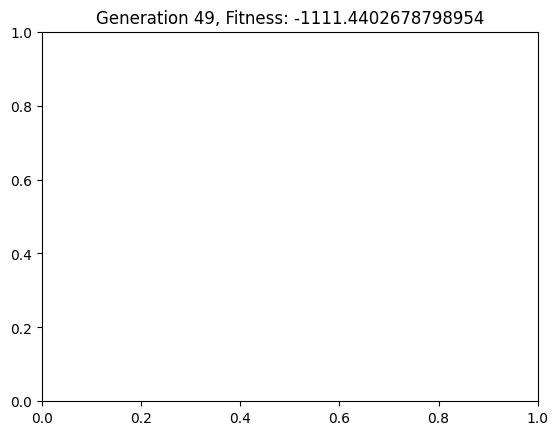

{'rooms': [{'name': 'Living Room', 'position': (196, 150), 'size': (271, 229)}, {'name': 'Bedroom1', 'position': (467, 86), 'size': (280, 293)}, {'name': 'Bedroom2', 'position': (114, 379), 'size': (354, 181)}, {'name': 'Passage', 'position': (468, 379), 'size': (118, 156)}, {'name': 'Kitchen', 'position': (586, 424), 'size': (147, 84)}, {'name': 'Washroom', 'position': (586, 437), 'size': (52, 101)}], 'fitness': -1112.1262263274562}
Elapsed time: 962.60 seconds


<Figure size 640x480 with 0 Axes>

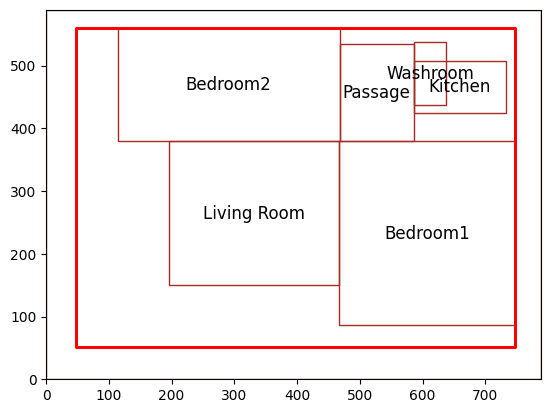

Elapsed time for initial population generation: 28.84 seconds


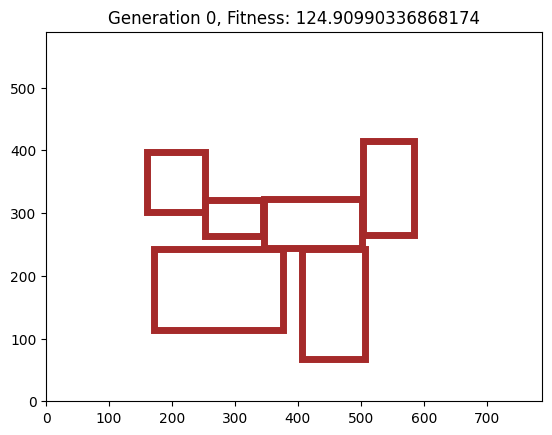

{'rooms': [{'name': 'Living Room', 'position': (171, 114), 'size': (206, 129)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 79)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (82, 149)}, {'name': 'Washroom', 'position': (253, 264), 'size': (92, 56)}, {'name': 'Bedroom1', 'position': (406, 68), 'size': (100, 175)}, {'name': 'Bedroom2', 'position': (161, 301), 'size': (92, 96)}], 'fitness': 124.90990336868174}


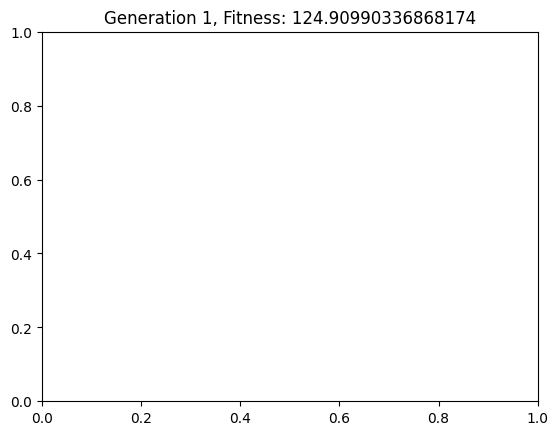

{'rooms': [{'name': 'Living Room', 'position': (171, 114), 'size': (207, 130)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 80)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (83, 148)}, {'name': 'Washroom', 'position': (253, 264), 'size': (92, 56)}, {'name': 'Bedroom1', 'position': (406, 68), 'size': (101, 176)}, {'name': 'Bedroom2', 'position': (160, 301), 'size': (92, 97)}], 'fitness': 124.90990336868174}


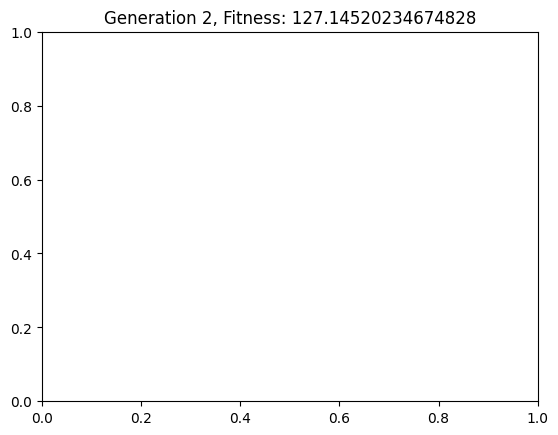

{'rooms': [{'name': 'Living Room', 'position': (171, 114), 'size': (207, 130)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 80)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (83, 148)}, {'name': 'Washroom', 'position': (253, 264), 'size': (92, 56)}, {'name': 'Bedroom1', 'position': (406, 68), 'size': (101, 176)}, {'name': 'Bedroom2', 'position': (160, 301), 'size': (92, 97)}], 'fitness': 127.14520234674828}


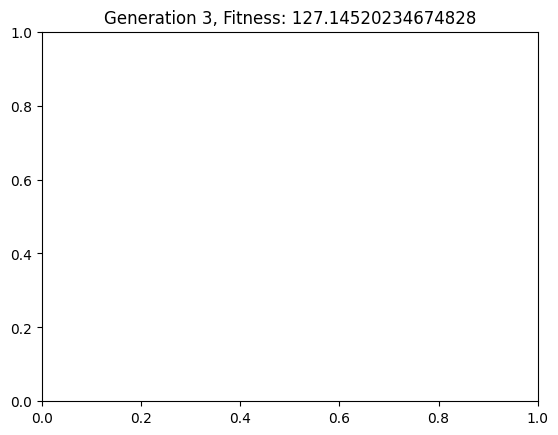

{'rooms': [{'name': 'Living Room', 'position': (171, 113), 'size': (208, 130)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 81)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (84, 153)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 138)}, {'name': 'Bedroom1', 'position': (406, 67), 'size': (102, 176)}, {'name': 'Bedroom2', 'position': (160, 301), 'size': (93, 98)}], 'fitness': 127.14520234674828}


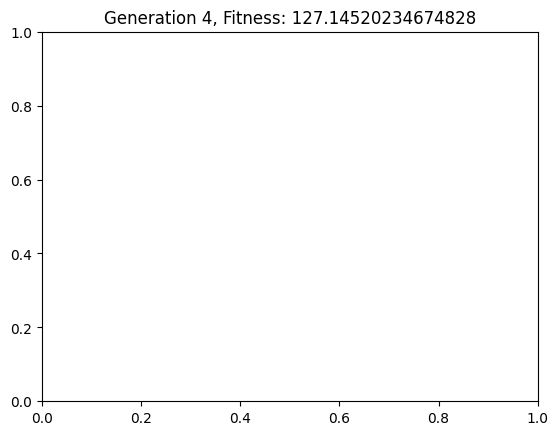

{'rooms': [{'name': 'Living Room', 'position': (171, 113), 'size': (208, 130)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 81)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (84, 153)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 138)}, {'name': 'Bedroom1', 'position': (406, 67), 'size': (102, 176)}, {'name': 'Bedroom2', 'position': (160, 301), 'size': (93, 98)}], 'fitness': -26.071841470119438}


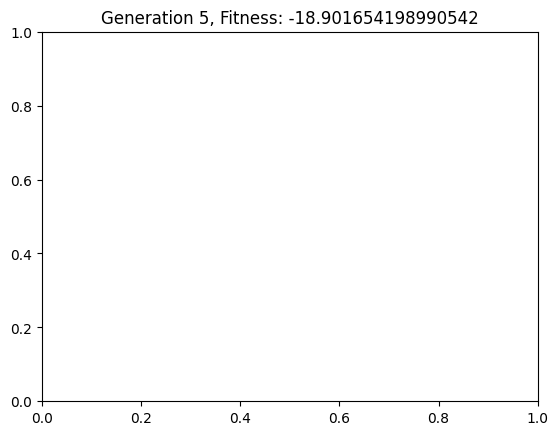

{'rooms': [{'name': 'Living Room', 'position': (171, 102), 'size': (230, 141)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (105, 200)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 149)}, {'name': 'Bedroom1', 'position': (406, 56), 'size': (125, 188)}, {'name': 'Bedroom2', 'position': (156, 301), 'size': (110, 119)}], 'fitness': -18.901654198990542}


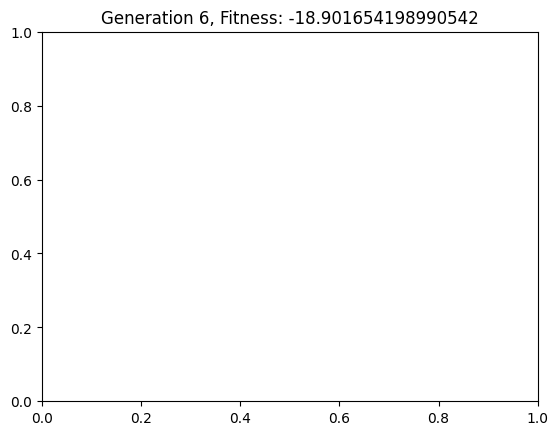

{'rooms': [{'name': 'Living Room', 'position': (170, 99), 'size': (235, 144)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (111, 220)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 152)}, {'name': 'Bedroom1', 'position': (406, 53), 'size': (131, 191)}, {'name': 'Bedroom2', 'position': (153, 301), 'size': (113, 125)}], 'fitness': -146.114781966816}


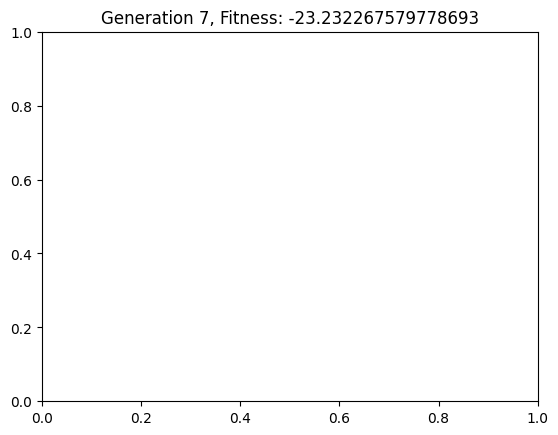

{'rooms': [{'name': 'Living Room', 'position': (171, 110), 'size': (215, 134)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (91, 154)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 130)}, {'name': 'Bedroom1', 'position': (406, 64), 'size': (109, 180)}, {'name': 'Bedroom2', 'position': (160, 301), 'size': (100, 105)}], 'fitness': -23.232267579778693}


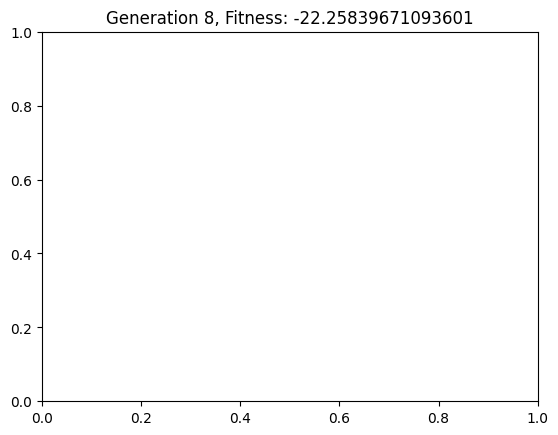

{'rooms': [{'name': 'Living Room', 'position': (171, 106), 'size': (223, 138)}, {'name': 'Bedroom1', 'position': (406, 60), 'size': (117, 184)}, {'name': 'Bedroom2', 'position': (159, 301), 'size': (107, 113)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (99, 169)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 140)}], 'fitness': -22.25839671093601}


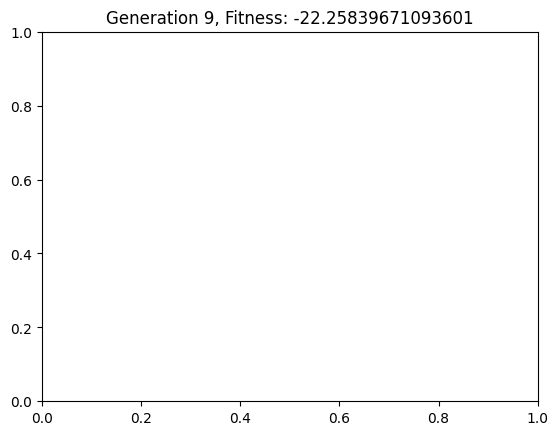

{'rooms': [{'name': 'Living Room', 'position': (171, 102), 'size': (231, 142)}, {'name': 'Bedroom1', 'position': (406, 56), 'size': (125, 188)}, {'name': 'Bedroom2', 'position': (155, 301), 'size': (111, 121)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (107, 187)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 144)}], 'fitness': -39.76435212154044}


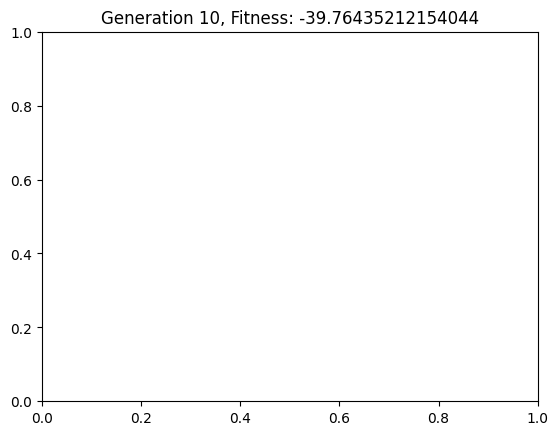

{'rooms': [{'name': 'Living Room', 'position': (169, 98), 'size': (237, 146)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (133, 192)}, {'name': 'Bedroom2', 'position': (151, 301), 'size': (115, 129)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (115, 218)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 143)}], 'fitness': -136.45165391807575}


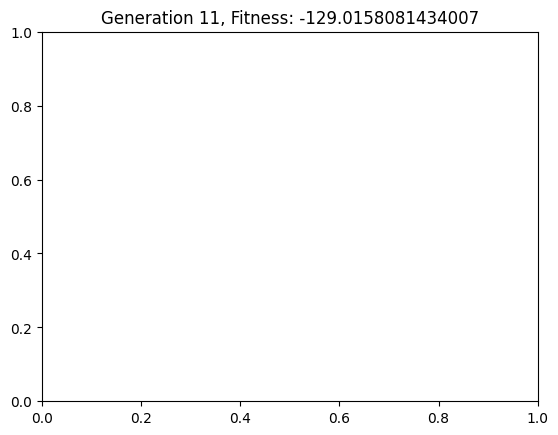

{'rooms': [{'name': 'Living Room', 'position': (165, 94), 'size': (241, 150)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (141, 192)}, {'name': 'Bedroom2', 'position': (147, 301), 'size': (119, 137)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (123, 221)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 141)}], 'fitness': -129.0158081434007}


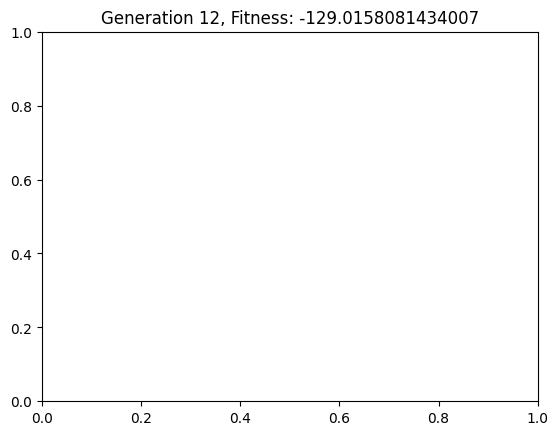

{'rooms': [{'name': 'Living Room', 'position': (161, 90), 'size': (245, 154)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (149, 192)}, {'name': 'Bedroom2', 'position': (143, 301), 'size': (123, 145)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (131, 211)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 146)}], 'fitness': -150.6144125933325}


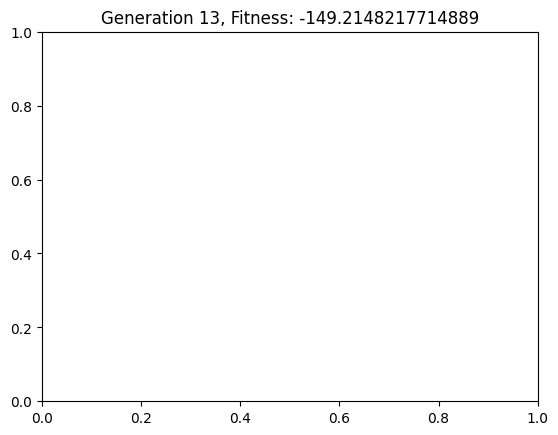

{'rooms': [{'name': 'Living Room', 'position': (157, 86), 'size': (249, 158)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (157, 192)}, {'name': 'Bedroom2', 'position': (139, 301), 'size': (127, 153)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (139, 264)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 131)}], 'fitness': -149.2148217714889}


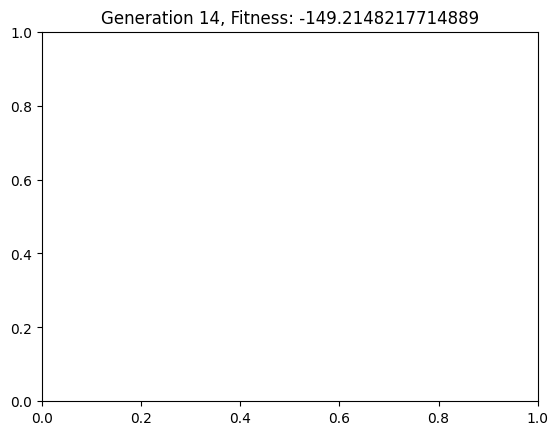

{'rooms': [{'name': 'Living Room', 'position': (153, 82), 'size': (253, 162)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (165, 192)}, {'name': 'Bedroom2', 'position': (135, 301), 'size': (131, 161)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (147, 241)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 125)}], 'fitness': -158.20995903780275}


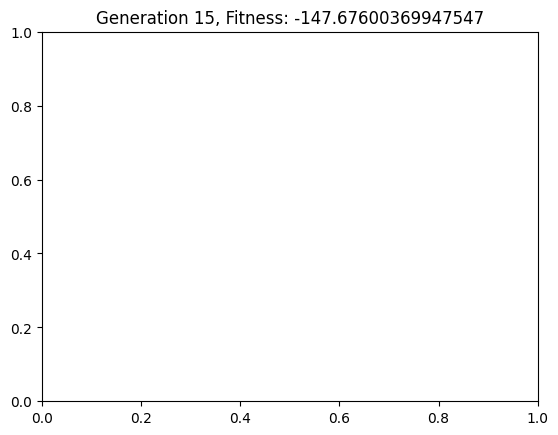

{'rooms': [{'name': 'Living Room', 'position': (149, 78), 'size': (257, 166)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (173, 192)}, {'name': 'Bedroom2', 'position': (131, 301), 'size': (135, 169)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (154, 260)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 132)}], 'fitness': -147.67600369947547}


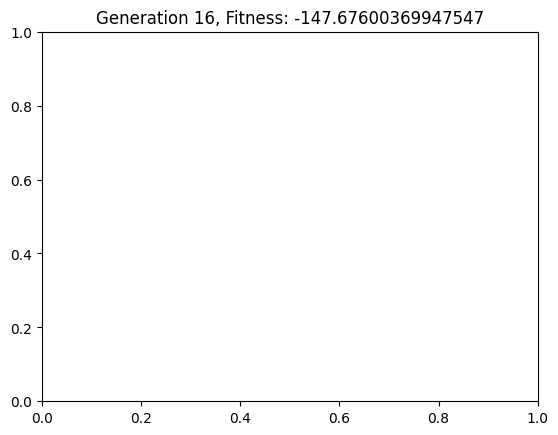

{'rooms': [{'name': 'Living Room', 'position': (145, 74), 'size': (261, 170)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (181, 192)}, {'name': 'Bedroom2', 'position': (127, 301), 'size': (139, 177)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (158, 279)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 127)}], 'fitness': -155.6856472309395}


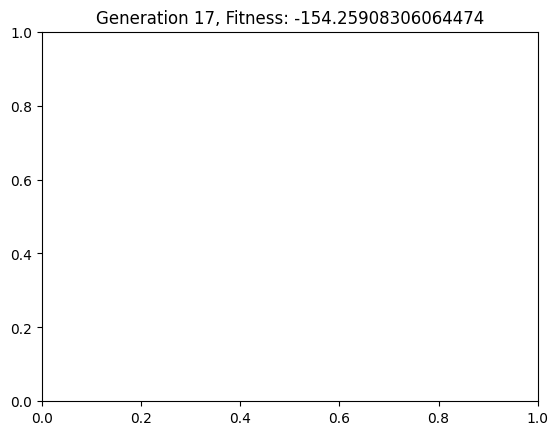

{'rooms': [{'name': 'Living Room', 'position': (141, 70), 'size': (265, 174)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (189, 192)}, {'name': 'Bedroom2', 'position': (123, 301), 'size': (143, 185)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 265), 'size': (163, 290)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 141)}], 'fitness': -154.25908306064474}


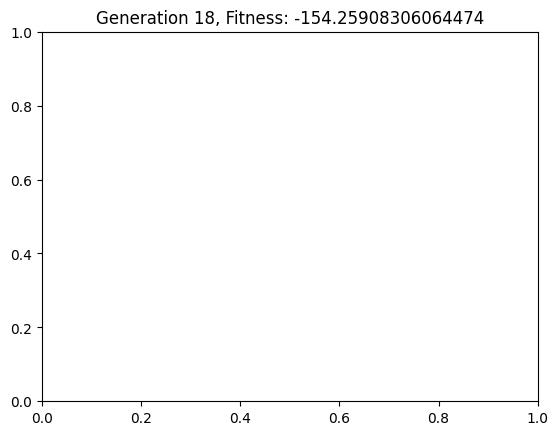

{'rooms': [{'name': 'Living Room', 'position': (137, 66), 'size': (269, 178)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (197, 192)}, {'name': 'Bedroom2', 'position': (119, 301), 'size': (147, 193)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 250), 'size': (168, 296)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 131)}], 'fitness': -163.3920068563824}


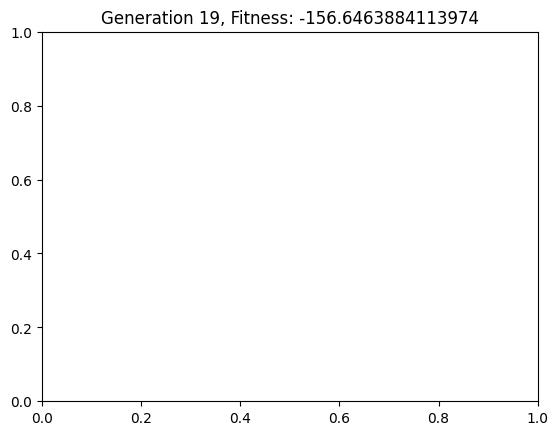

{'rooms': [{'name': 'Living Room', 'position': (133, 62), 'size': (273, 182)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (205, 192)}, {'name': 'Bedroom2', 'position': (115, 301), 'size': (151, 201)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 250), 'size': (171, 303)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 145)}], 'fitness': -156.6463884113974}


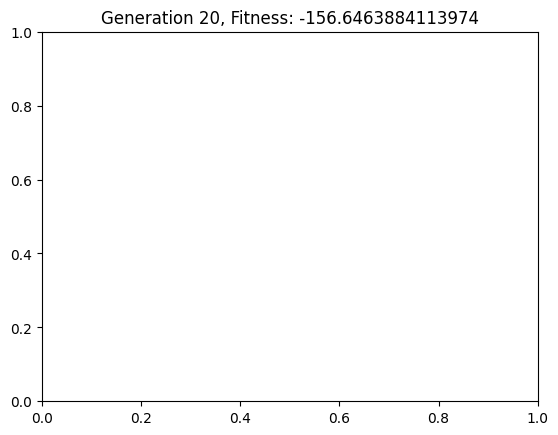

{'rooms': [{'name': 'Living Room', 'position': (129, 58), 'size': (277, 186)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (213, 192)}, {'name': 'Bedroom2', 'position': (111, 301), 'size': (155, 209)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 250), 'size': (175, 290)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 153)}], 'fitness': -164.24435708140885}


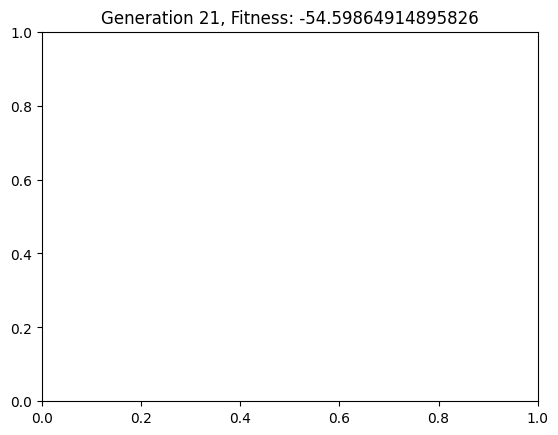

{'rooms': [{'name': 'Living Room', 'position': (125, 54), 'size': (281, 190)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (221, 192)}, {'name': 'Bedroom2', 'position': (107, 301), 'size': (159, 217)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 250), 'size': (178, 291)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 155)}], 'fitness': -54.59864914895826}


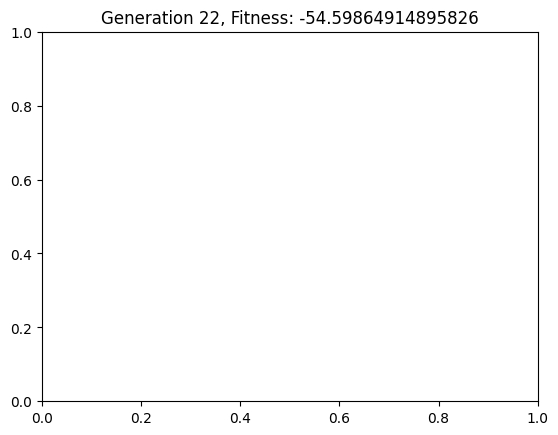

{'rooms': [{'name': 'Living Room', 'position': (121, 52), 'size': (285, 192)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (229, 192)}, {'name': 'Bedroom2', 'position': (103, 301), 'size': (163, 225)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 250), 'size': (179, 295)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 147)}], 'fitness': -163.17229923213628}


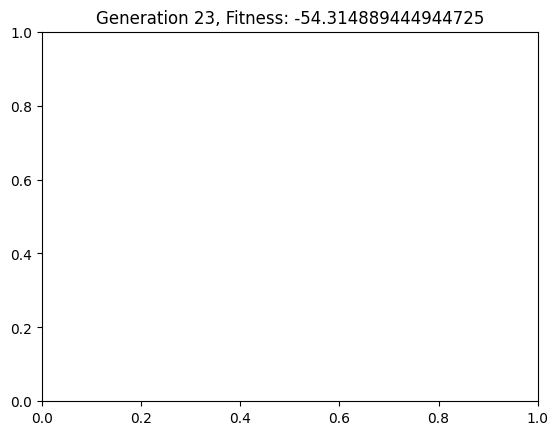

{'rooms': [{'name': 'Living Room', 'position': (117, 52), 'size': (289, 192)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (237, 192)}, {'name': 'Bedroom2', 'position': (99, 301), 'size': (167, 233)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 250), 'size': (183, 294)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 136)}], 'fitness': -54.314889444944725}


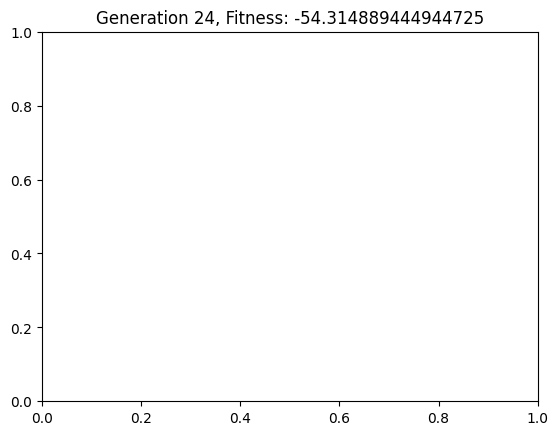

{'rooms': [{'name': 'Living Room', 'position': (113, 52), 'size': (293, 192)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (245, 192)}, {'name': 'Bedroom2', 'position': (95, 301), 'size': (171, 241)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 248), 'size': (187, 311)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 139)}], 'fitness': -55.681293787241714}


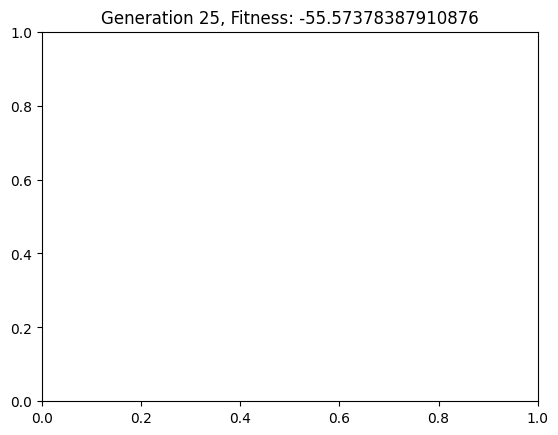

{'rooms': [{'name': 'Living Room', 'position': (109, 52), 'size': (297, 192)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (253, 192)}, {'name': 'Bedroom2', 'position': (91, 301), 'size': (175, 249)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 248), 'size': (189, 303)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 145)}], 'fitness': -55.57378387910876}


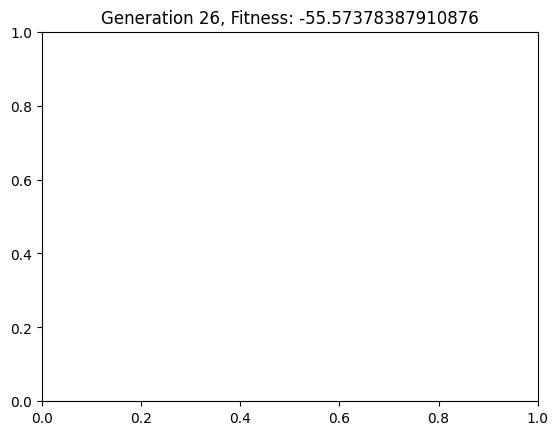

{'rooms': [{'name': 'Living Room', 'position': (105, 52), 'size': (301, 192)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (261, 192)}, {'name': 'Bedroom2', 'position': (87, 301), 'size': (179, 257)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 248), 'size': (190, 306)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 139)}], 'fitness': -142.4042523079362}


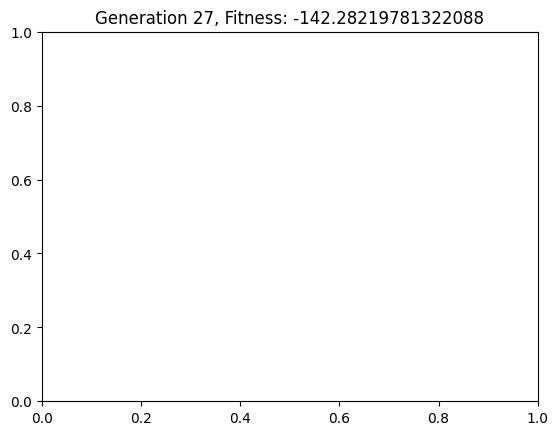

{'rooms': [{'name': 'Living Room', 'position': (101, 52), 'size': (305, 192)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (269, 192)}, {'name': 'Bedroom2', 'position': (83, 298), 'size': (183, 262)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 248), 'size': (191, 308)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 155)}], 'fitness': -142.28219781322088}


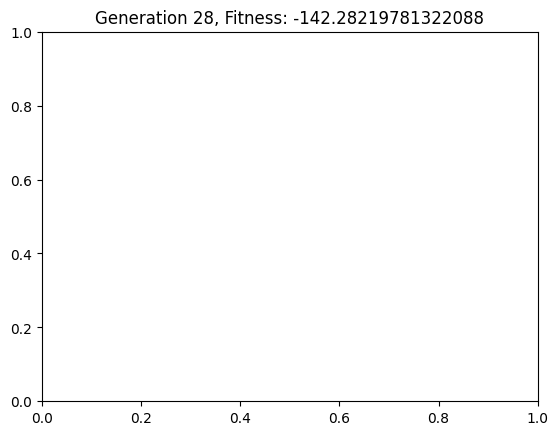

{'rooms': [{'name': 'Living Room', 'position': (97, 52), 'size': (309, 192)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (277, 192)}, {'name': 'Bedroom2', 'position': (79, 294), 'size': (187, 266)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 248), 'size': (193, 310)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 142)}], 'fitness': -148.1809427360164}


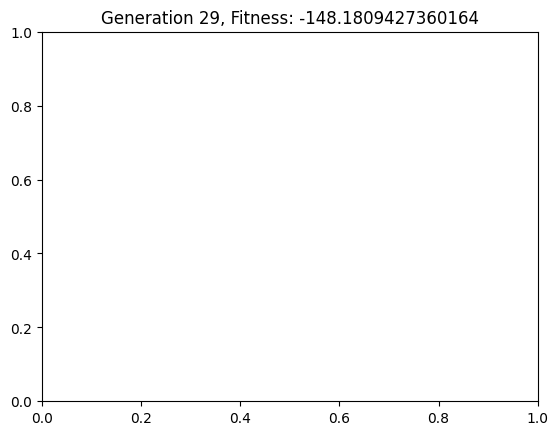

{'rooms': [{'name': 'Living Room', 'position': (93, 52), 'size': (313, 192)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (285, 192)}, {'name': 'Bedroom2', 'position': (75, 290), 'size': (191, 270)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 248), 'size': (193, 310)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 131)}], 'fitness': -247.81105721417063}


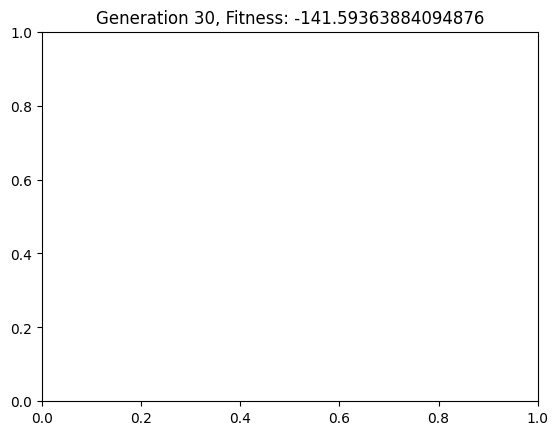

{'rooms': [{'name': 'Living Room', 'position': (89, 52), 'size': (317, 192)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (293, 192)}, {'name': 'Bedroom2', 'position': (71, 286), 'size': (195, 274)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 248), 'size': (193, 310)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 151)}], 'fitness': -141.59363884094876}


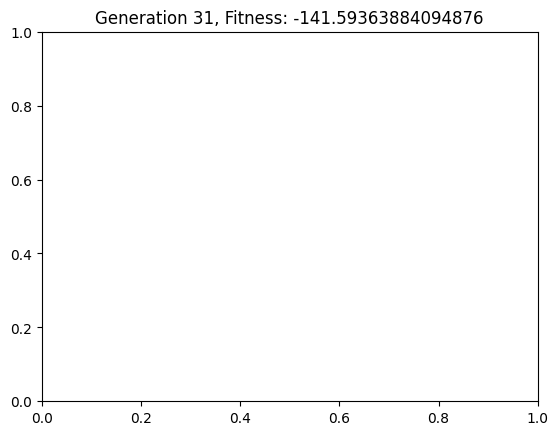

{'rooms': [{'name': 'Living Room', 'position': (85, 52), 'size': (321, 192)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (301, 192)}, {'name': 'Bedroom2', 'position': (67, 282), 'size': (199, 278)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 248), 'size': (195, 312)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 133)}], 'fitness': -144.2454650350786}


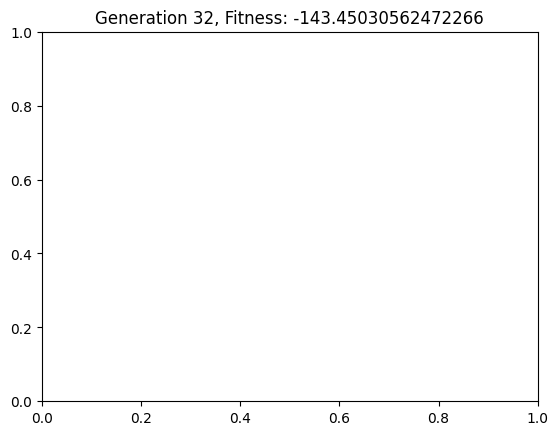

{'rooms': [{'name': 'Living Room', 'position': (81, 52), 'size': (325, 192)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (309, 192)}, {'name': 'Bedroom2', 'position': (63, 278), 'size': (203, 282)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 248), 'size': (195, 312)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 137)}], 'fitness': -143.45030562472266}


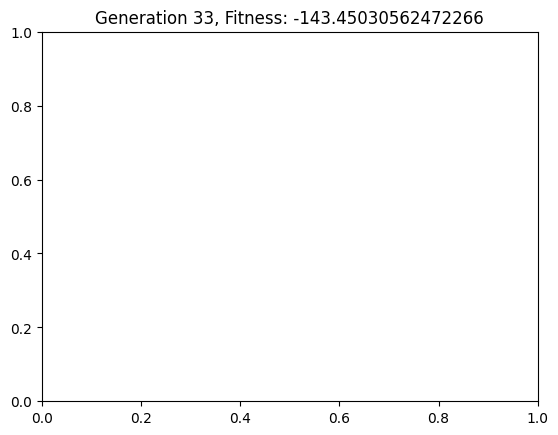

{'rooms': [{'name': 'Living Room', 'position': (77, 52), 'size': (329, 192)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (317, 192)}, {'name': 'Bedroom2', 'position': (59, 274), 'size': (207, 286)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 248), 'size': (195, 312)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 131)}], 'fitness': -259.9386012158859}


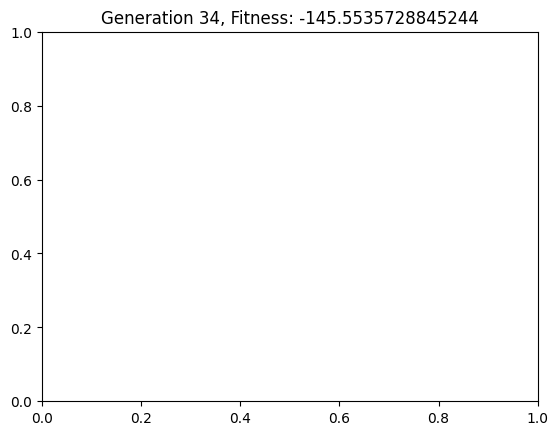

{'rooms': [{'name': 'Living Room', 'position': (73, 52), 'size': (333, 192)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (325, 192)}, {'name': 'Bedroom2', 'position': (55, 270), 'size': (211, 290)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 248), 'size': (195, 312)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 134)}], 'fitness': -145.5535728845244}


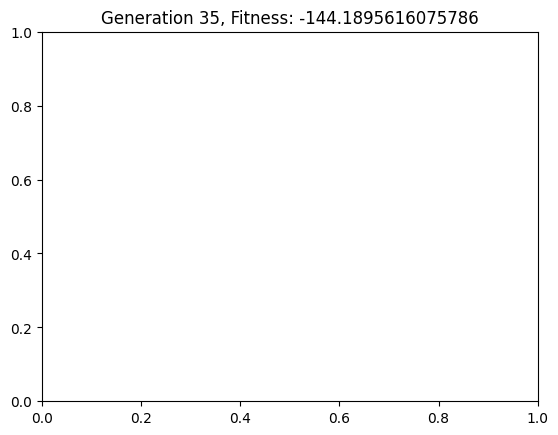

{'rooms': [{'name': 'Living Room', 'position': (69, 52), 'size': (337, 192)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (333, 192)}, {'name': 'Bedroom2', 'position': (51, 266), 'size': (215, 294)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 248), 'size': (195, 312)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 129)}], 'fitness': -144.1895616075786}


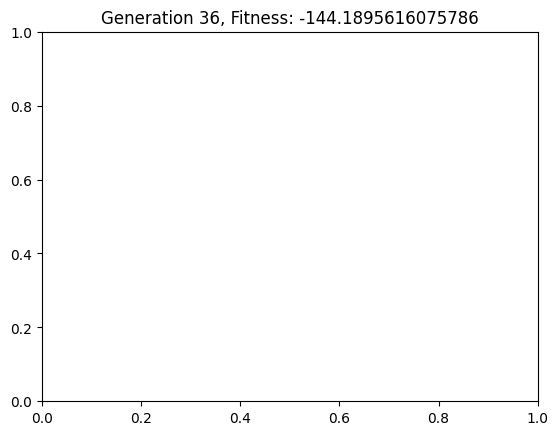

{'rooms': [{'name': 'Living Room', 'position': (65, 52), 'size': (341, 192)}, {'name': 'Bedroom1', 'position': (406, 52), 'size': (341, 192)}, {'name': 'Bedroom2', 'position': (48, 266), 'size': (219, 294)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 248), 'size': (195, 312)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 155)}], 'fitness': -272.92436705029405}


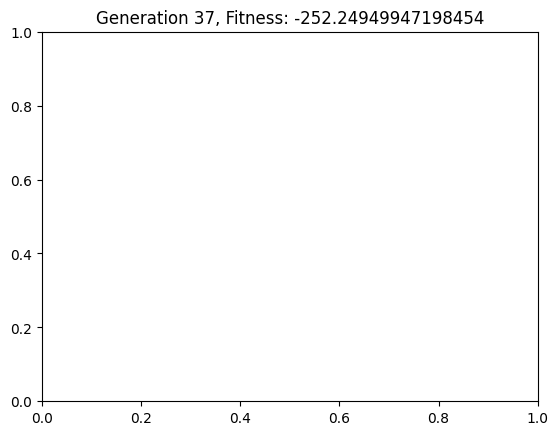

{'rooms': [{'name': 'Living Room', 'position': (59, 52), 'size': (343, 192)}, {'name': 'Bedroom1', 'position': (403, 52), 'size': (344, 192)}, {'name': 'Bedroom2', 'position': (48, 266), 'size': (219, 294)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 248), 'size': (195, 312)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 146)}], 'fitness': -252.24949947198454}


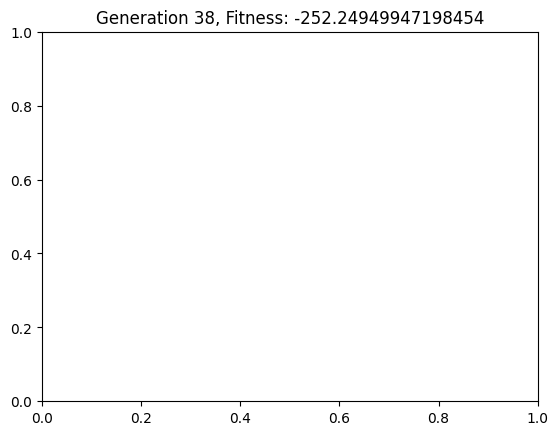

{'rooms': [{'name': 'Living Room', 'position': (54, 52), 'size': (346, 192)}, {'name': 'Bedroom1', 'position': (400, 52), 'size': (346, 192)}, {'name': 'Bedroom2', 'position': (48, 266), 'size': (219, 294)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 248), 'size': (195, 312)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 153)}], 'fitness': -260.8670893658555}


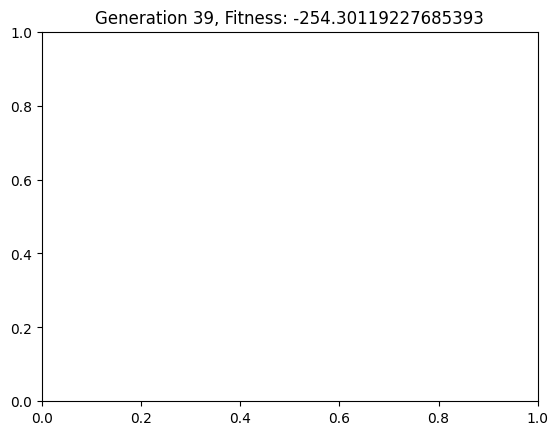

{'rooms': [{'name': 'Living Room', 'position': (49, 52), 'size': (349, 192)}, {'name': 'Bedroom1', 'position': (398, 52), 'size': (349, 192)}, {'name': 'Bedroom2', 'position': (48, 266), 'size': (219, 294)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 247), 'size': (196, 313)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 151)}], 'fitness': -254.30119227685393}


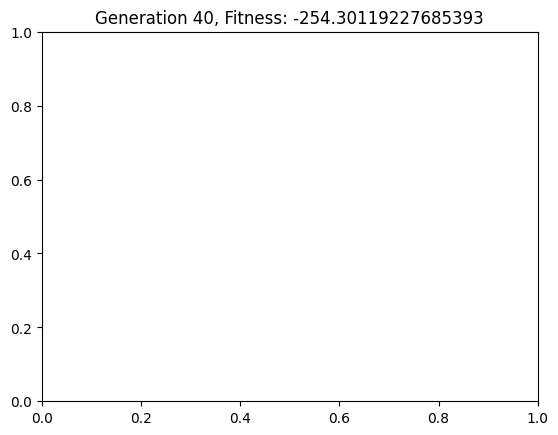

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (349, 192)}, {'name': 'Bedroom1', 'position': (397, 52), 'size': (350, 192)}, {'name': 'Bedroom2', 'position': (48, 266), 'size': (219, 294)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 247), 'size': (196, 313)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 143)}], 'fitness': -260.49032582902544}


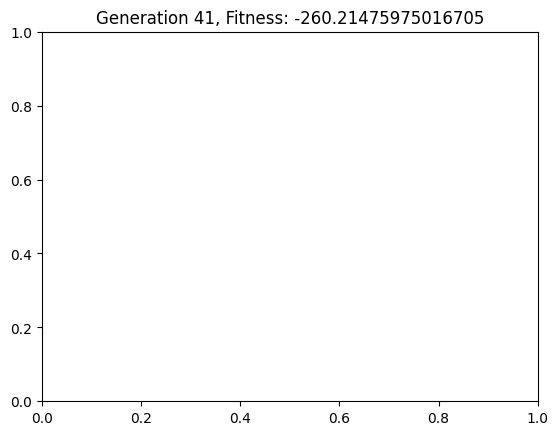

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (349, 192)}, {'name': 'Bedroom1', 'position': (397, 52), 'size': (350, 192)}, {'name': 'Bedroom2', 'position': (48, 266), 'size': (219, 294)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 247), 'size': (196, 313)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 130)}], 'fitness': -260.21475975016705}


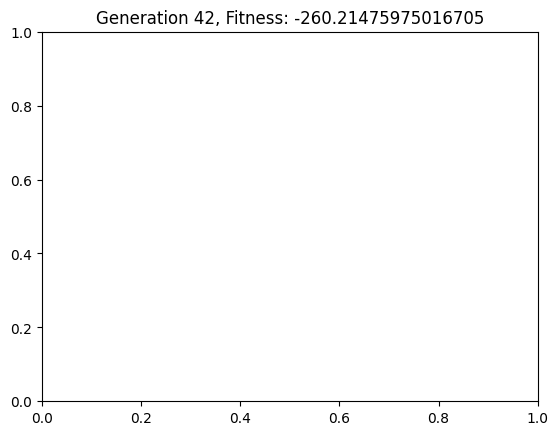

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (349, 192)}, {'name': 'Bedroom1', 'position': (397, 52), 'size': (350, 192)}, {'name': 'Bedroom2', 'position': (48, 266), 'size': (219, 294)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 247), 'size': (196, 313)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 150)}], 'fitness': -279.3440029765763}


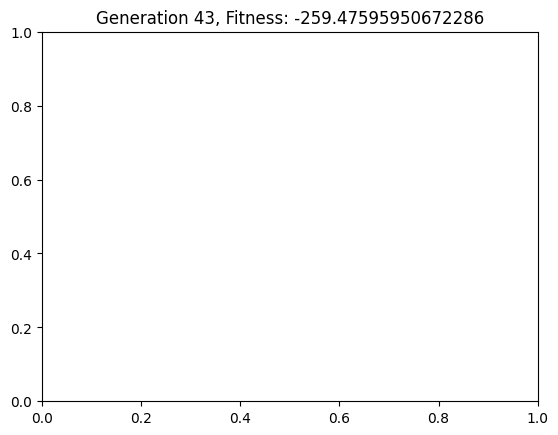

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (349, 192)}, {'name': 'Bedroom1', 'position': (397, 52), 'size': (350, 192)}, {'name': 'Bedroom2', 'position': (48, 266), 'size': (219, 294)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 247), 'size': (196, 313)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 141)}], 'fitness': -259.47595950672286}


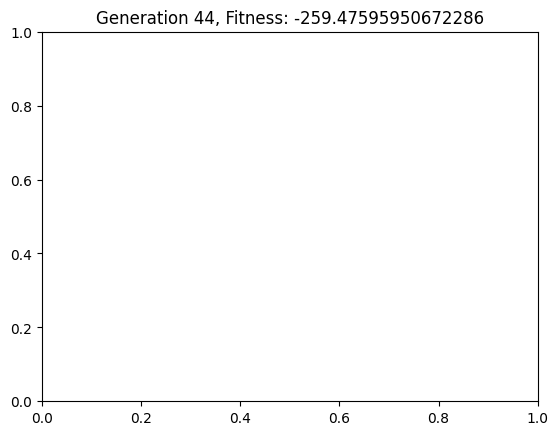

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (349, 192)}, {'name': 'Bedroom1', 'position': (397, 52), 'size': (350, 192)}, {'name': 'Bedroom2', 'position': (48, 266), 'size': (219, 294)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 247), 'size': (196, 313)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 126)}], 'fitness': -269.03320520915}


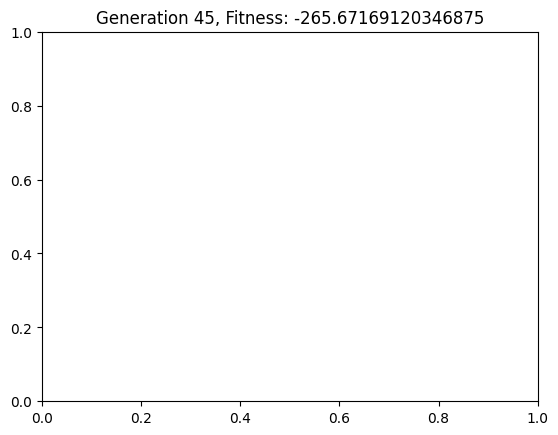

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (349, 192)}, {'name': 'Bedroom1', 'position': (397, 52), 'size': (350, 192)}, {'name': 'Bedroom2', 'position': (48, 266), 'size': (219, 294)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 245), 'size': (197, 315)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 154)}], 'fitness': -265.67169120346875}


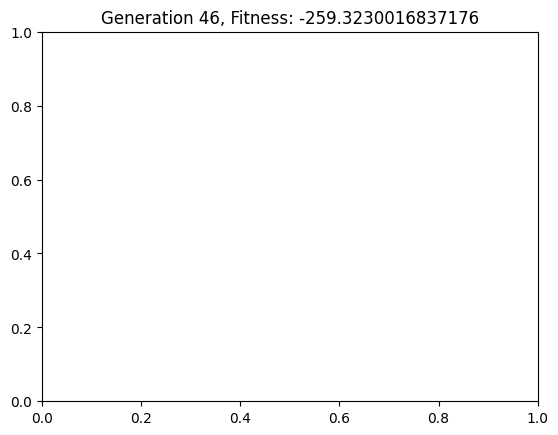

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (349, 192)}, {'name': 'Bedroom1', 'position': (397, 52), 'size': (350, 192)}, {'name': 'Bedroom2', 'position': (48, 266), 'size': (219, 294)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 245), 'size': (197, 315)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 130)}], 'fitness': -259.3230016837176}


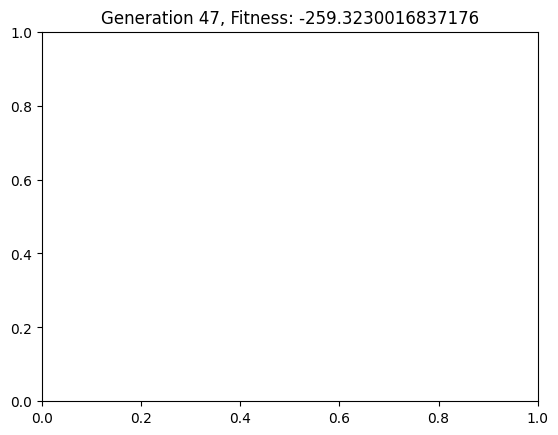

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (349, 192)}, {'name': 'Bedroom1', 'position': (397, 52), 'size': (350, 192)}, {'name': 'Bedroom2', 'position': (48, 266), 'size': (219, 294)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 245), 'size': (197, 315)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 133)}], 'fitness': -279.9202505886588}


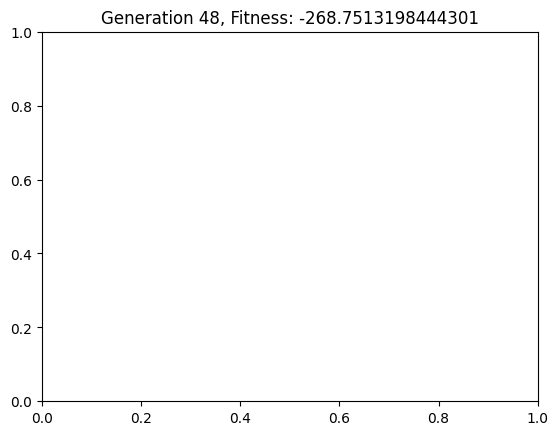

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (349, 192)}, {'name': 'Bedroom1', 'position': (397, 52), 'size': (350, 192)}, {'name': 'Bedroom2', 'position': (48, 266), 'size': (219, 294)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 245), 'size': (197, 315)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 147)}], 'fitness': -268.7513198444301}


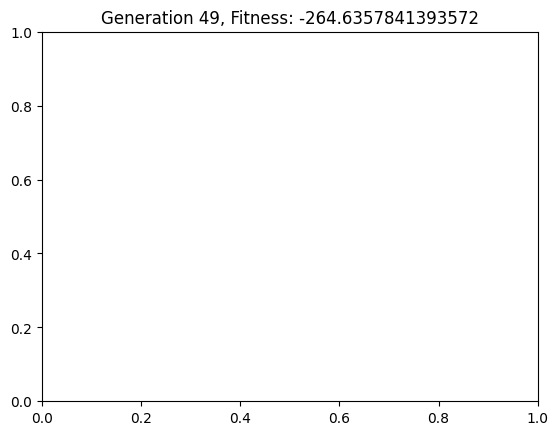

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (349, 192)}, {'name': 'Bedroom1', 'position': (397, 52), 'size': (350, 192)}, {'name': 'Bedroom2', 'position': (48, 266), 'size': (219, 294)}, {'name': 'Passage', 'position': (346, 244), 'size': (156, 88)}, {'name': 'Kitchen', 'position': (503, 245), 'size': (197, 315)}, {'name': 'Washroom', 'position': (267, 264), 'size': (78, 142)}], 'fitness': -264.6357841393572}
Elapsed time: 927.98 seconds


<Figure size 640x480 with 0 Axes>

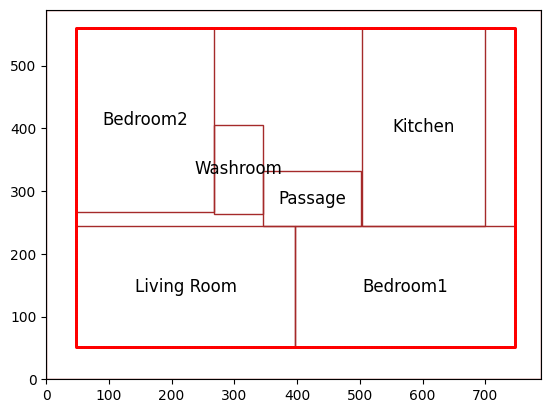

Elapsed time for initial population generation: 28.95 seconds


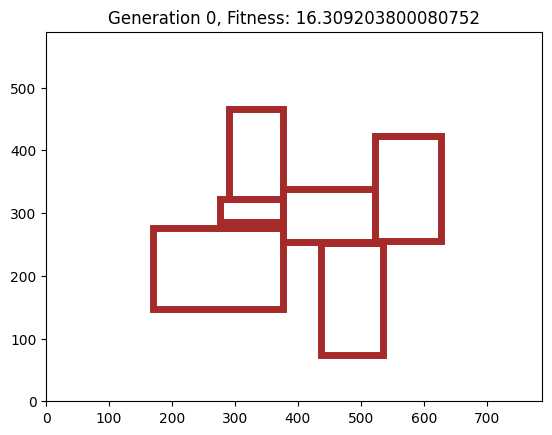

{'rooms': [{'name': 'Living Room', 'position': (170, 147), 'size': (206, 129)}, {'name': 'Passage', 'position': (377, 254), 'size': (145, 84)}, {'name': 'Kitchen', 'position': (290, 323), 'size': (86, 142)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}, {'name': 'Bedroom1', 'position': (437, 74), 'size': (98, 179)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (105, 168)}], 'fitness': 16.309203800080752}


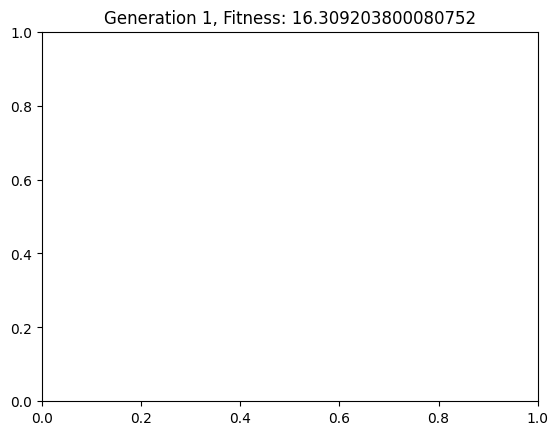

{'rooms': [{'name': 'Living Room', 'position': (170, 147), 'size': (207, 130)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 85)}, {'name': 'Kitchen', 'position': (290, 323), 'size': (86, 142)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}, {'name': 'Bedroom1', 'position': (437, 74), 'size': (99, 180)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (106, 169)}], 'fitness': 16.309203800080752}


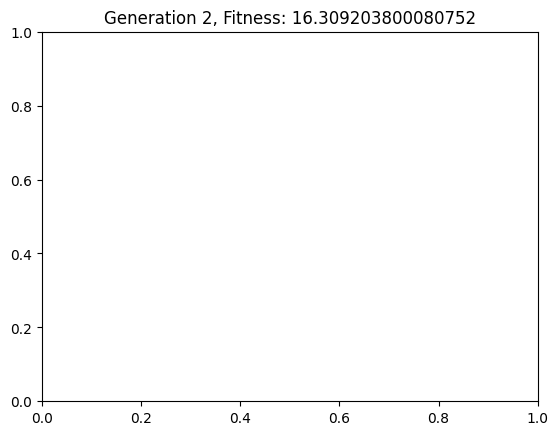

{'rooms': [{'name': 'Living Room', 'position': (168, 147), 'size': (208, 133)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (289, 323), 'size': (88, 147)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}, {'name': 'Bedroom1', 'position': (437, 72), 'size': (102, 181)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (109, 172)}], 'fitness': 14.586618093278958}


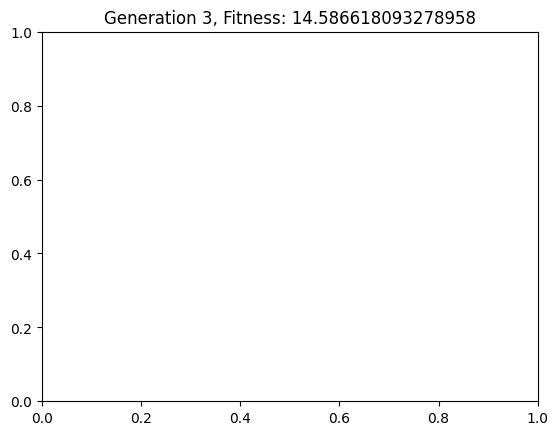

{'rooms': [{'name': 'Living Room', 'position': (165, 146), 'size': (212, 139)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (283, 323), 'size': (94, 165)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}, {'name': 'Bedroom1', 'position': (437, 69), 'size': (108, 184)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (115, 178)}], 'fitness': 8.058103744724548}


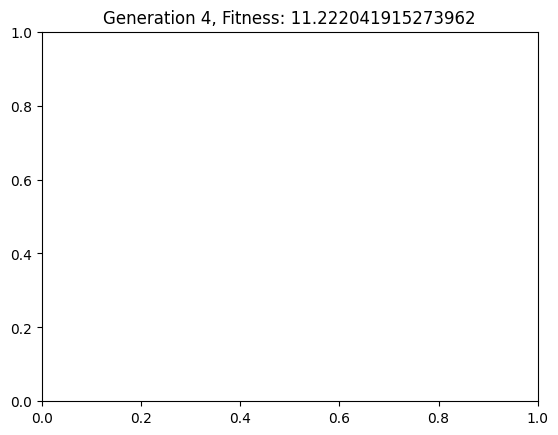

{'rooms': [{'name': 'Living Room', 'position': (161, 142), 'size': (216, 143)}, {'name': 'Bedroom1', 'position': (437, 71), 'size': (105, 183)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (112, 175)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (285, 323), 'size': (92, 176)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': 11.222041915273962}


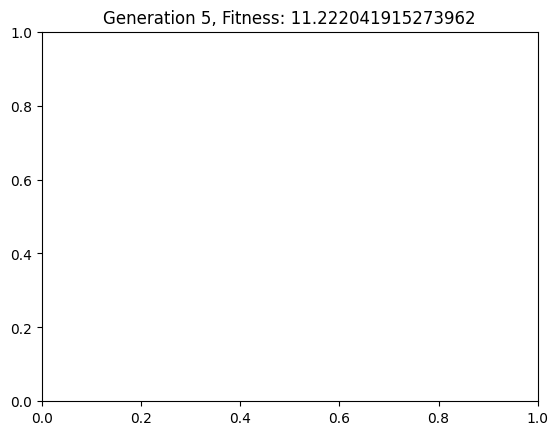

{'rooms': [{'name': 'Living Room', 'position': (157, 138), 'size': (220, 147)}, {'name': 'Bedroom1', 'position': (437, 67), 'size': (112, 186)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (119, 182)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (98, 181)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -15.721482423508405}


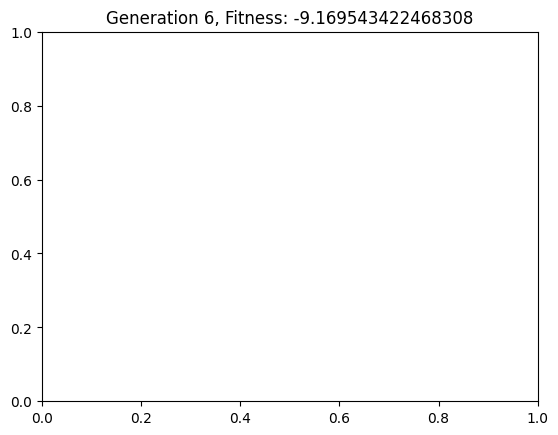

{'rooms': [{'name': 'Living Room', 'position': (153, 134), 'size': (224, 151)}, {'name': 'Bedroom1', 'position': (437, 63), 'size': (120, 190)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (127, 190)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (106, 201)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -9.169543422468308}


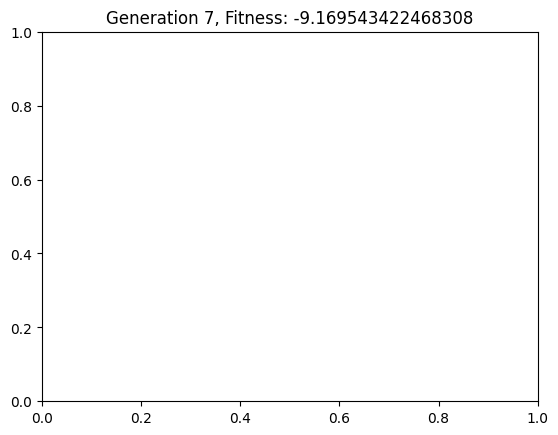

{'rooms': [{'name': 'Living Room', 'position': (149, 130), 'size': (228, 155)}, {'name': 'Bedroom1', 'position': (437, 59), 'size': (128, 194)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (135, 198)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (114, 188)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -144.43467742901092}


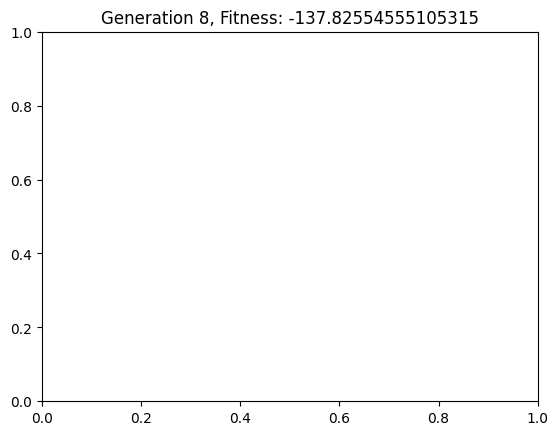

{'rooms': [{'name': 'Living Room', 'position': (145, 126), 'size': (232, 159)}, {'name': 'Bedroom1', 'position': (437, 55), 'size': (136, 198)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (143, 206)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (118, 200)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -137.82554555105315}


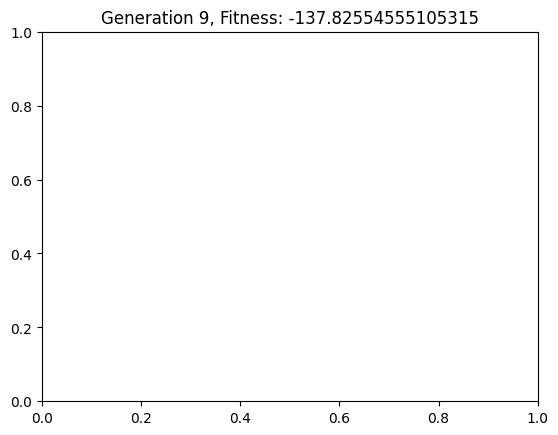

{'rooms': [{'name': 'Living Room', 'position': (141, 122), 'size': (236, 163)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (144, 202)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (151, 214)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (122, 209)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -171.96732261332818}


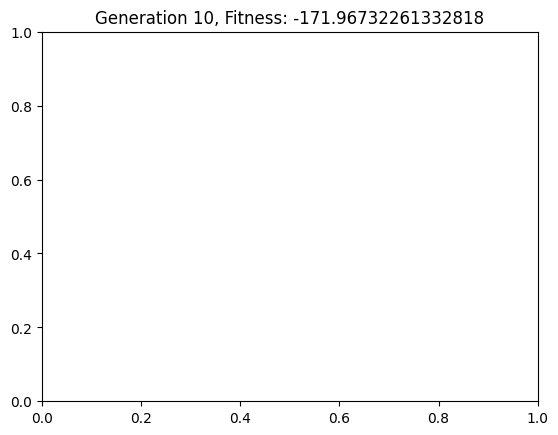

{'rooms': [{'name': 'Living Room', 'position': (137, 118), 'size': (240, 167)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (152, 202)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (159, 222)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (128, 215)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -189.05453318070644}


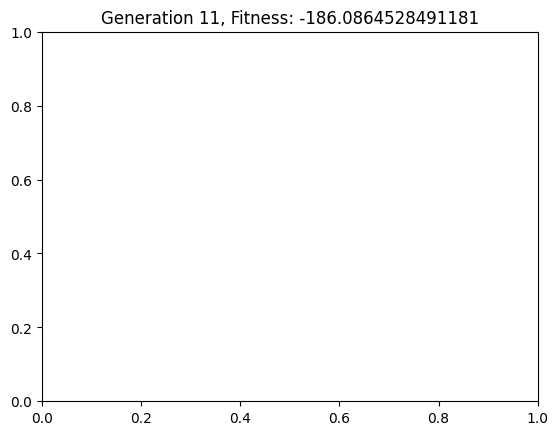

{'rooms': [{'name': 'Living Room', 'position': (133, 114), 'size': (244, 171)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (160, 202)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (167, 230)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (131, 212)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -186.0864528491181}


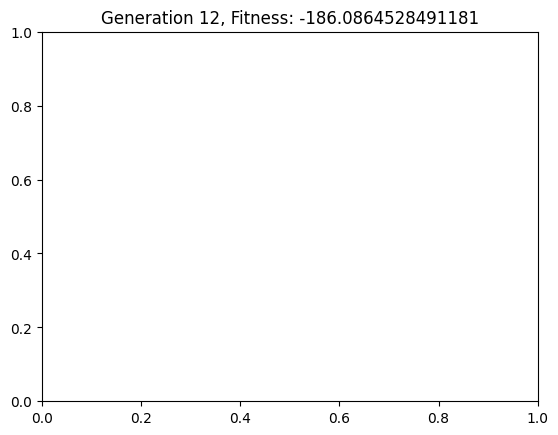

{'rooms': [{'name': 'Living Room', 'position': (129, 110), 'size': (248, 175)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (168, 202)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (175, 238)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (131, 212)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -211.77019416801718}


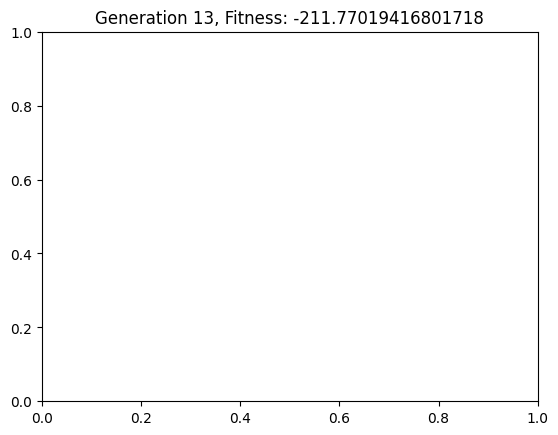

{'rooms': [{'name': 'Living Room', 'position': (125, 106), 'size': (252, 179)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (176, 202)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (183, 246)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (134, 217)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -220.42739960621466}


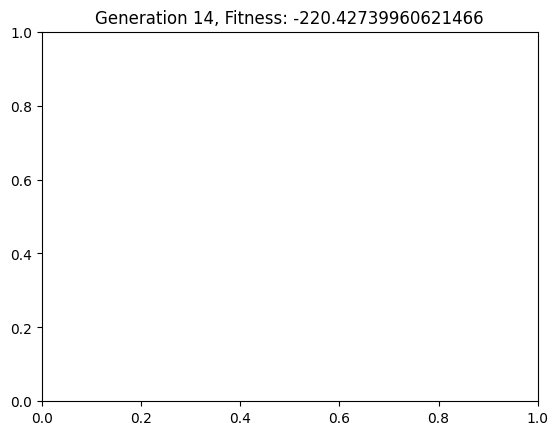

{'rooms': [{'name': 'Living Room', 'position': (121, 102), 'size': (256, 183)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (184, 202)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (191, 254)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (135, 216)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -233.51576989929885}


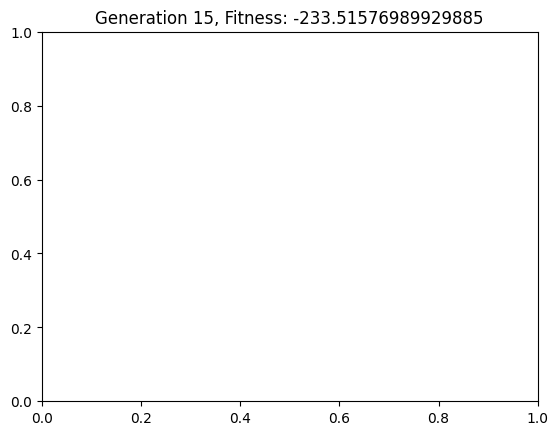

{'rooms': [{'name': 'Living Room', 'position': (117, 98), 'size': (260, 187)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (192, 202)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (199, 262)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (135, 216)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -242.63647568816262}


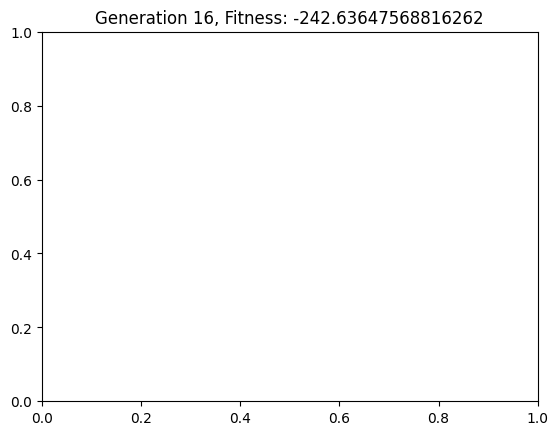

{'rooms': [{'name': 'Living Room', 'position': (113, 94), 'size': (264, 191)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (200, 202)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (207, 270)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (135, 216)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -251.4005790410783}


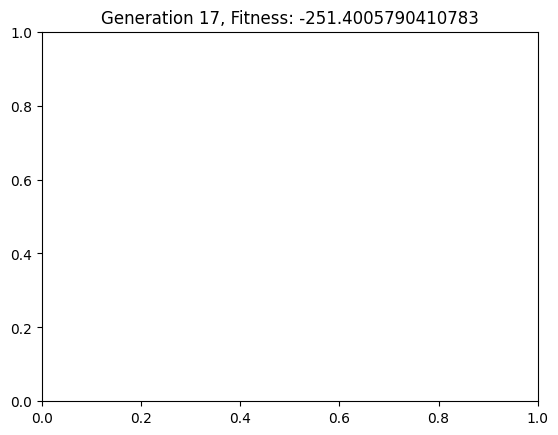

{'rooms': [{'name': 'Living Room', 'position': (109, 90), 'size': (268, 195)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (208, 202)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (215, 278)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (135, 216)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -261.1893423454573}


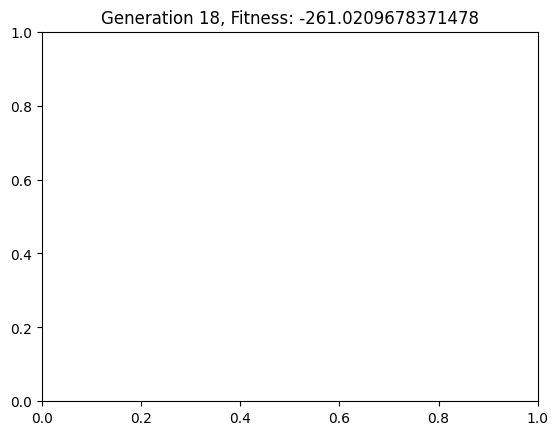

{'rooms': [{'name': 'Living Room', 'position': (105, 86), 'size': (272, 199)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (216, 202)}, {'name': 'Bedroom2', 'position': (523, 255), 'size': (223, 286)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (135, 216)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -261.0209678371478}


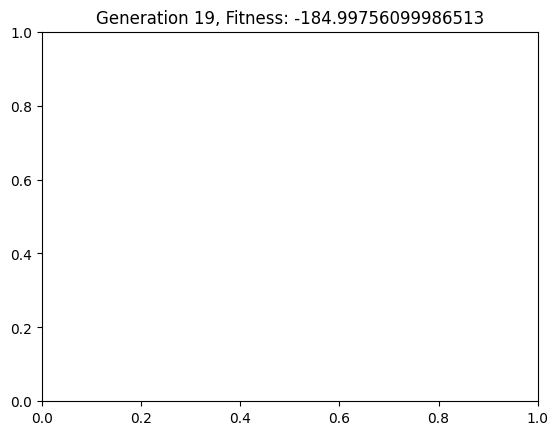

{'rooms': [{'name': 'Living Room', 'position': (101, 82), 'size': (276, 203)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (224, 202)}, {'name': 'Bedroom2', 'position': (519, 255), 'size': (227, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (135, 216)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -184.99756099986513}


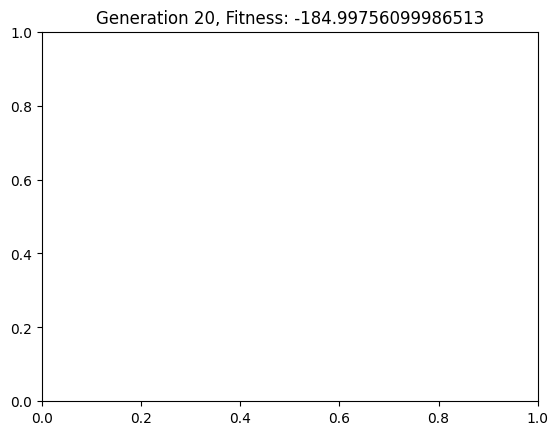

{'rooms': [{'name': 'Living Room', 'position': (97, 78), 'size': (280, 207)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (232, 202)}, {'name': 'Bedroom2', 'position': (515, 255), 'size': (231, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (135, 216)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -201.65332077685758}


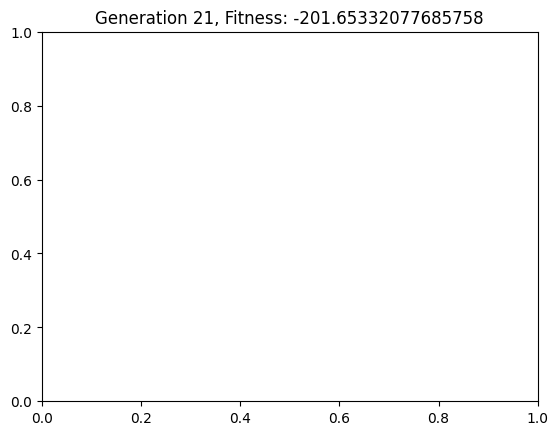

{'rooms': [{'name': 'Living Room', 'position': (93, 74), 'size': (284, 211)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (240, 202)}, {'name': 'Bedroom2', 'position': (511, 255), 'size': (235, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (135, 216)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -211.48896561994235}


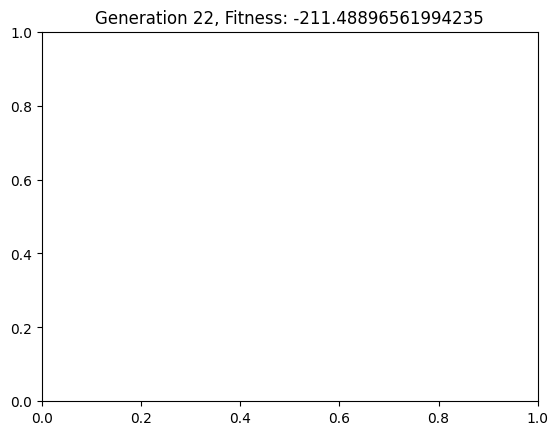

{'rooms': [{'name': 'Living Room', 'position': (89, 70), 'size': (288, 215)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (248, 202)}, {'name': 'Bedroom2', 'position': (507, 255), 'size': (239, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (135, 216)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -220.39603666433447}


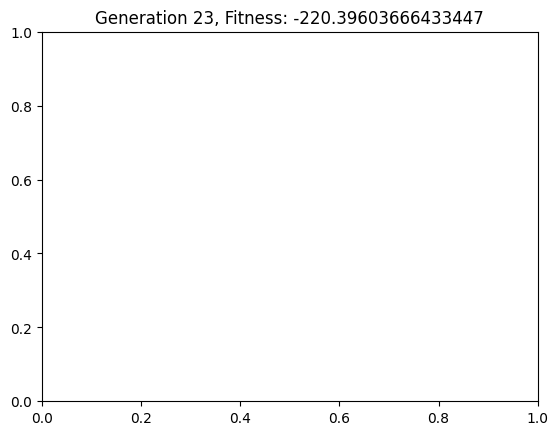

{'rooms': [{'name': 'Living Room', 'position': (85, 66), 'size': (292, 219)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (256, 202)}, {'name': 'Bedroom2', 'position': (503, 255), 'size': (243, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (135, 216)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -230.379012800284}


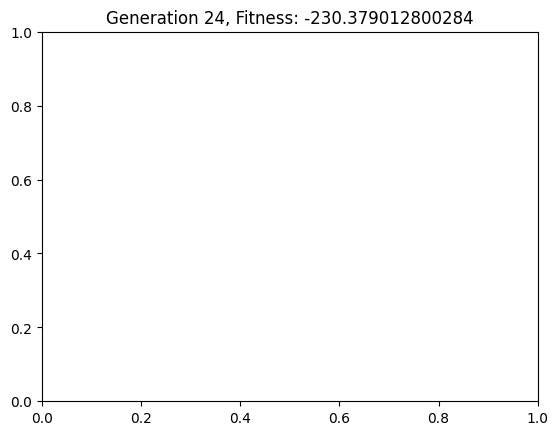

{'rooms': [{'name': 'Living Room', 'position': (81, 62), 'size': (296, 223)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (264, 202)}, {'name': 'Bedroom2', 'position': (499, 255), 'size': (247, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -239.4417316427847}


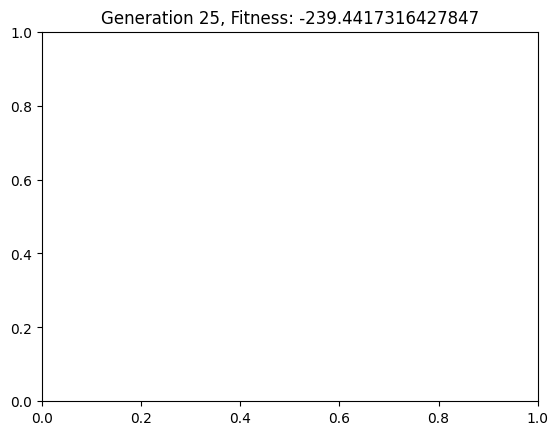

{'rooms': [{'name': 'Living Room', 'position': (77, 58), 'size': (300, 227)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (272, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (251, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -251.33808160756485}


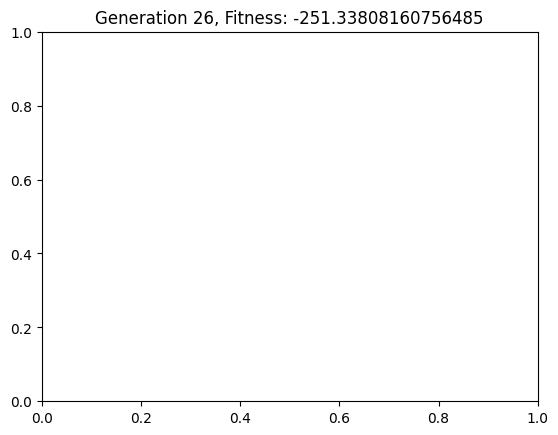

{'rooms': [{'name': 'Living Room', 'position': (73, 54), 'size': (304, 231)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (280, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -260.62589903302967}


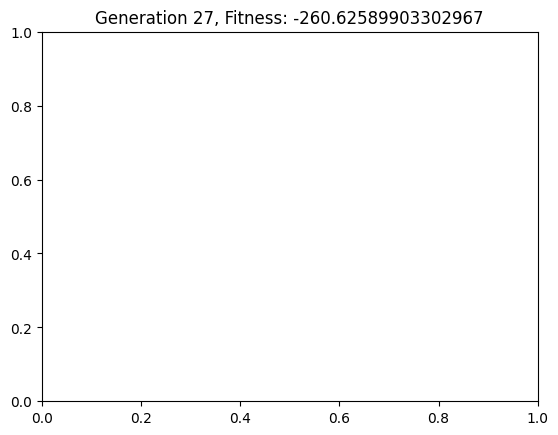

{'rooms': [{'name': 'Living Room', 'position': (69, 52), 'size': (308, 234)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (288, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -271.00280468729574}


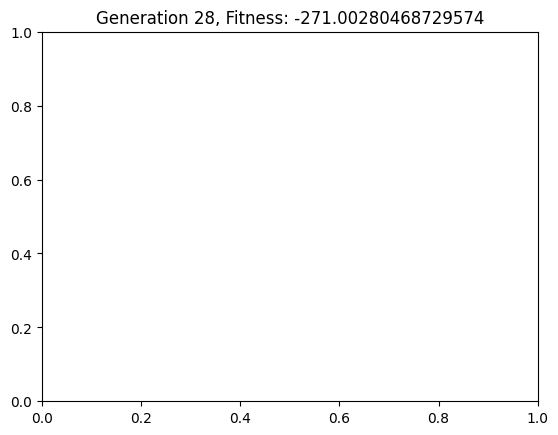

{'rooms': [{'name': 'Living Room', 'position': (65, 52), 'size': (312, 234)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (296, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -396.4459623737795}


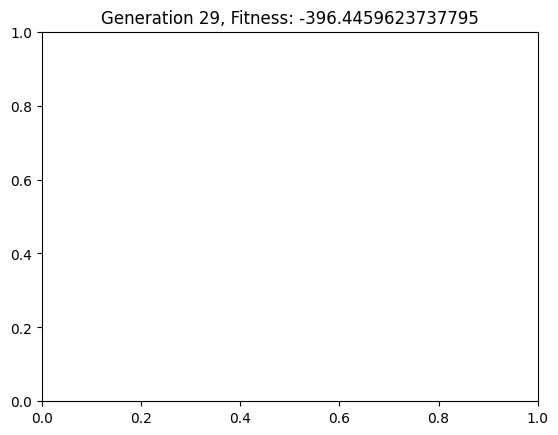

{'rooms': [{'name': 'Living Room', 'position': (61, 52), 'size': (316, 234)}, {'name': 'Bedroom1', 'position': (437, 52), 'size': (304, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -403.65757211342293}


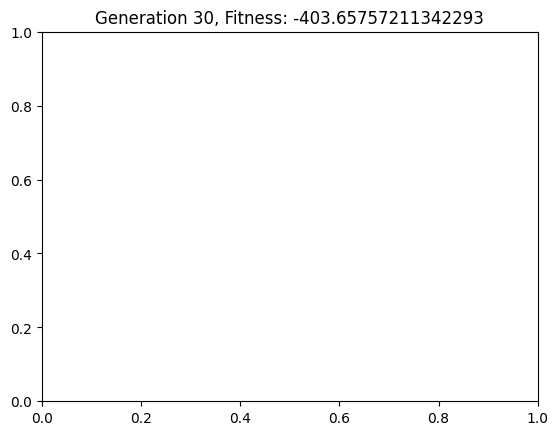

{'rooms': [{'name': 'Living Room', 'position': (57, 52), 'size': (320, 234)}, {'name': 'Bedroom1', 'position': (436, 52), 'size': (311, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -411.81091703029705}


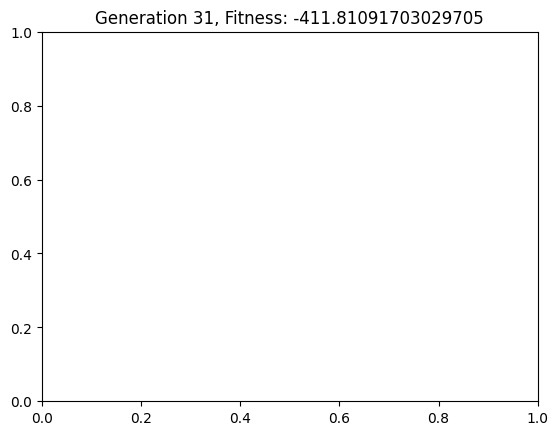

{'rooms': [{'name': 'Living Room', 'position': (53, 52), 'size': (324, 234)}, {'name': 'Bedroom1', 'position': (432, 52), 'size': (315, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -499.6756205534087}


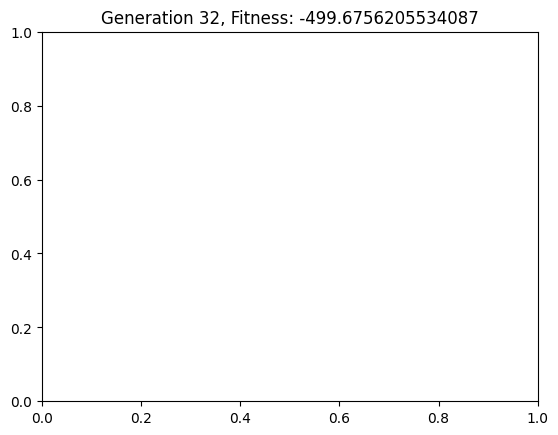

{'rooms': [{'name': 'Living Room', 'position': (49, 52), 'size': (328, 234)}, {'name': 'Bedroom1', 'position': (428, 52), 'size': (319, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -506.8231021780991}


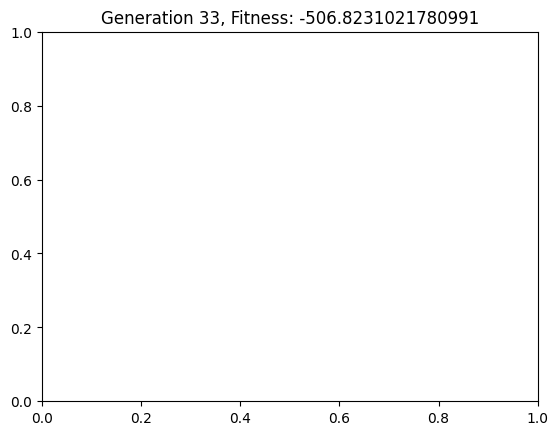

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (424, 52), 'size': (323, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -513.9788768839064}


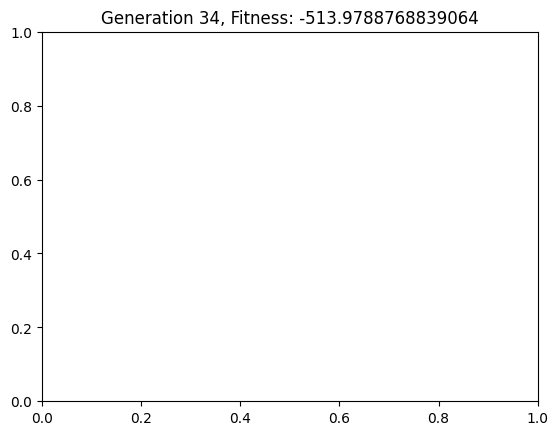

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (420, 52), 'size': (327, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -515.4409422314873}


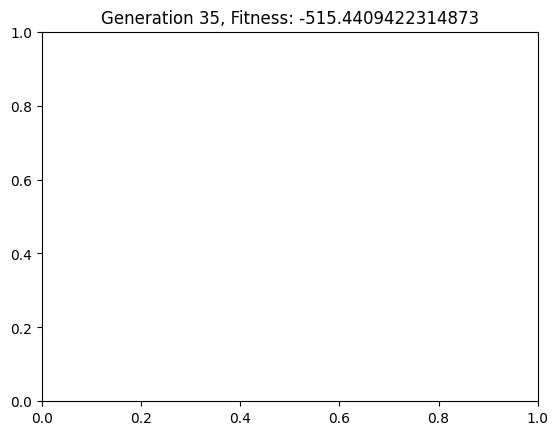

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (416, 52), 'size': (331, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -516.3134595627778}


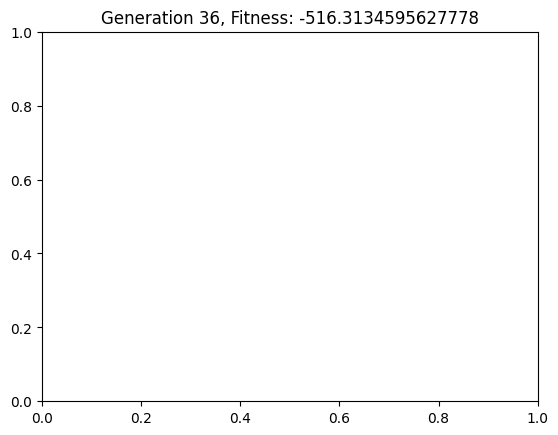

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (412, 52), 'size': (335, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -517.1600422769952}


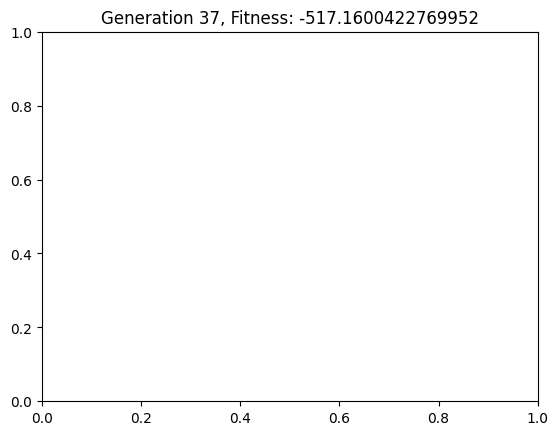

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (408, 52), 'size': (339, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -517.9814016801752}


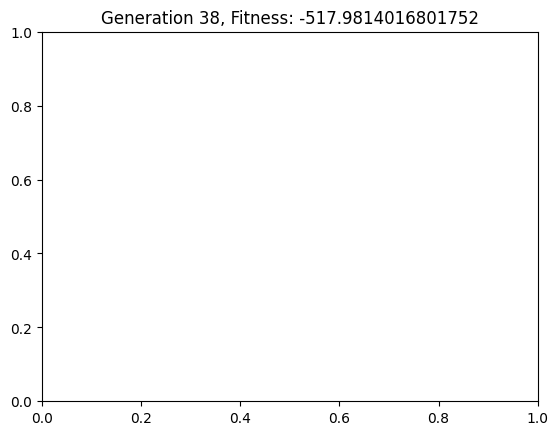

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (404, 52), 'size': (343, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -518.7782022662091}


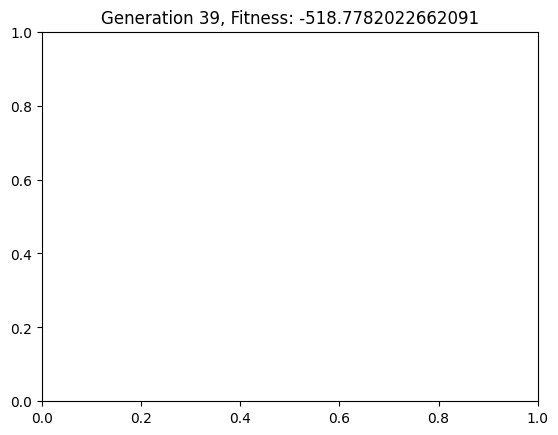

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (400, 52), 'size': (347, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -519.551063423962}


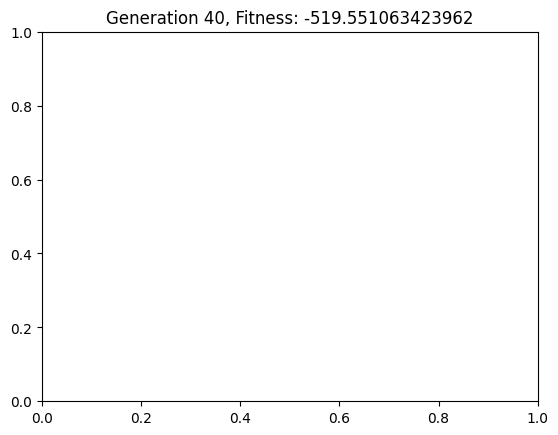

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (396, 52), 'size': (351, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -520.3005609300526}


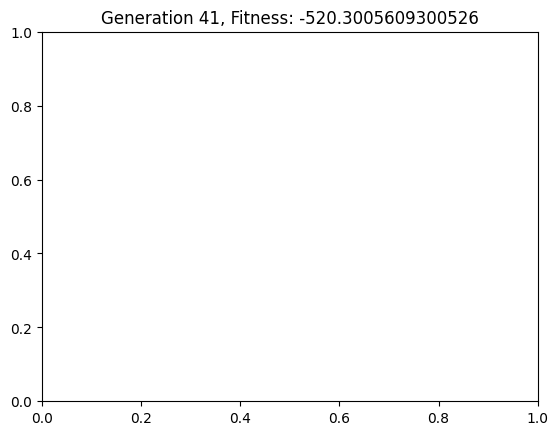

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (392, 52), 'size': (355, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -521.0272282336466}


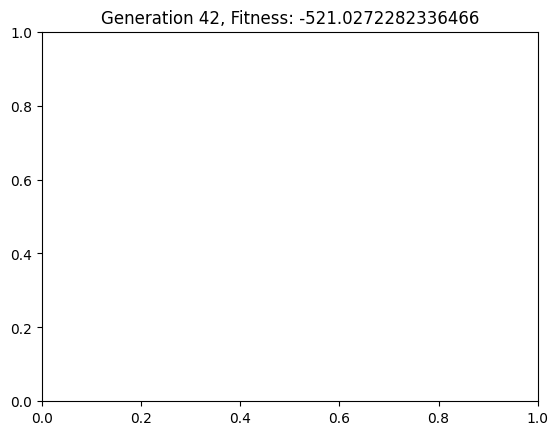

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (388, 52), 'size': (359, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -521.7315575376517}


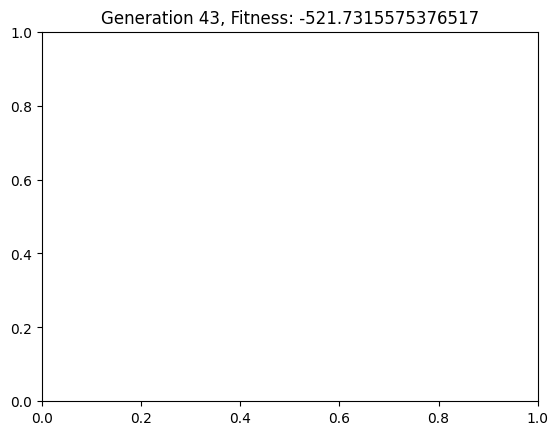

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (384, 52), 'size': (363, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -522.4140006787198}


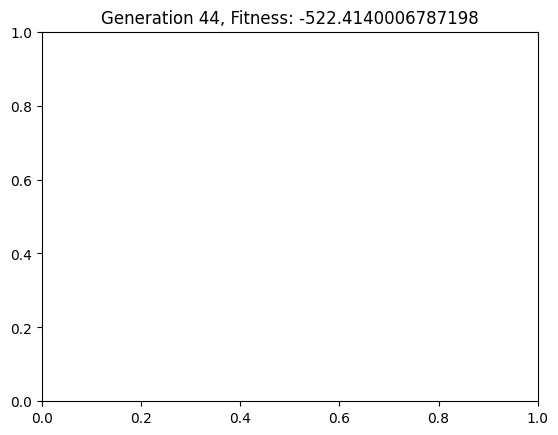

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (380, 52), 'size': (367, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -523.0749698064524}


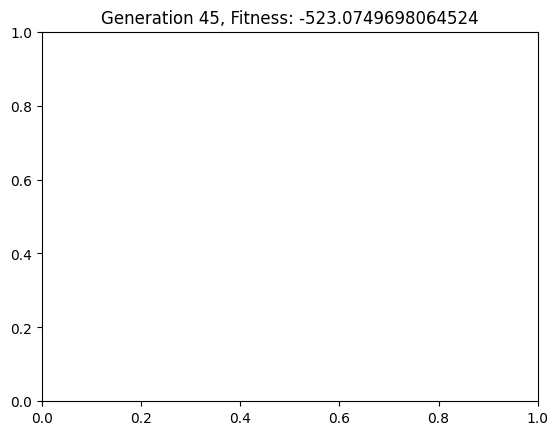

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (377, 52), 'size': (370, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -523.7148378600966}


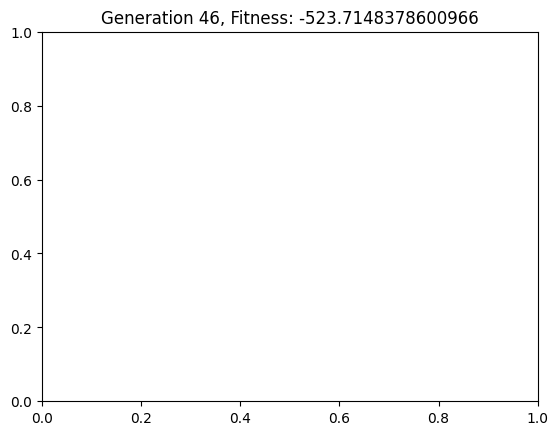

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (377, 52), 'size': (370, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -524.1810937029811}


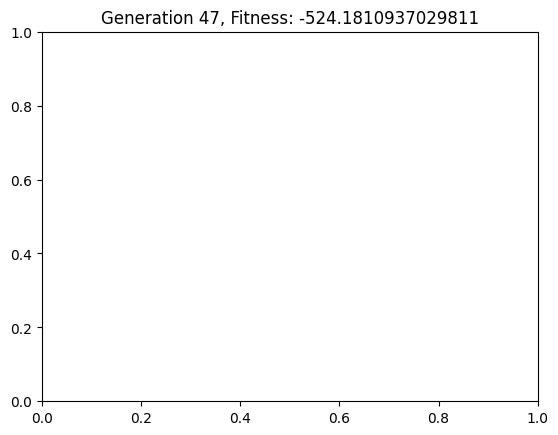

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (377, 52), 'size': (370, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -524.1810937029811}


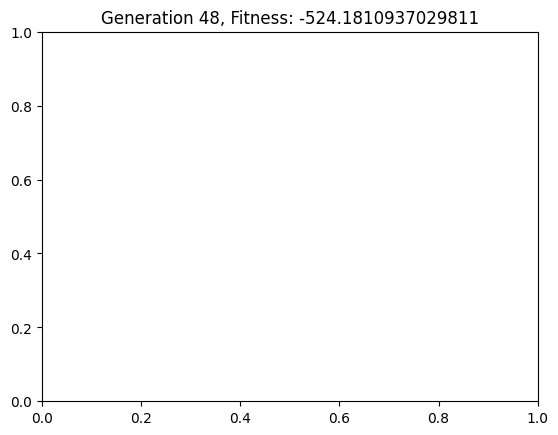

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (377, 52), 'size': (370, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -524.1810937029811}


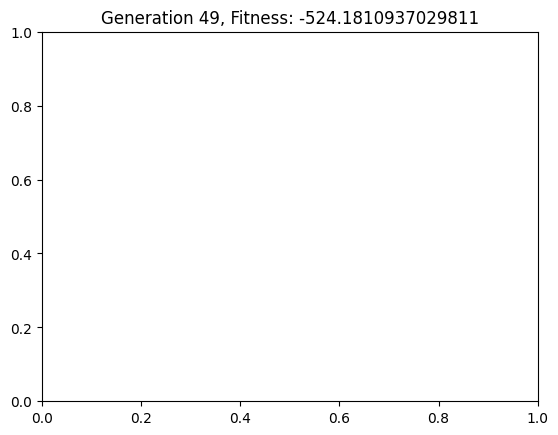

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (329, 234)}, {'name': 'Bedroom1', 'position': (377, 52), 'size': (370, 202)}, {'name': 'Bedroom2', 'position': (495, 255), 'size': (252, 294)}, {'name': 'Passage', 'position': (377, 254), 'size': (118, 88)}, {'name': 'Kitchen', 'position': (281, 342), 'size': (136, 218)}, {'name': 'Washroom', 'position': (276, 286), 'size': (100, 37)}], 'fitness': -524.1810937029811}
Elapsed time: 973.57 seconds


<Figure size 640x480 with 0 Axes>

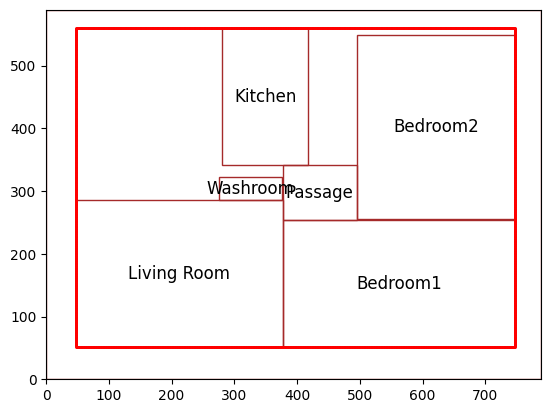

Elapsed time for initial population generation: 28.48 seconds


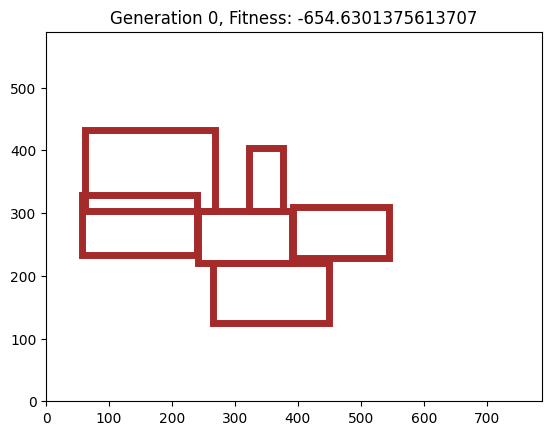

{'rooms': [{'name': 'Living Room', 'position': (62, 304), 'size': (206, 129)}, {'name': 'Passage', 'position': (241, 221), 'size': (150, 82)}, {'name': 'Kitchen', 'position': (392, 228), 'size': (153, 81)}, {'name': 'Washroom', 'position': (323, 304), 'size': (53, 99)}, {'name': 'Bedroom1', 'position': (57, 233), 'size': (183, 95)}, {'name': 'Bedroom2', 'position': (265, 125), 'size': (184, 95)}], 'fitness': -654.6301375613707}


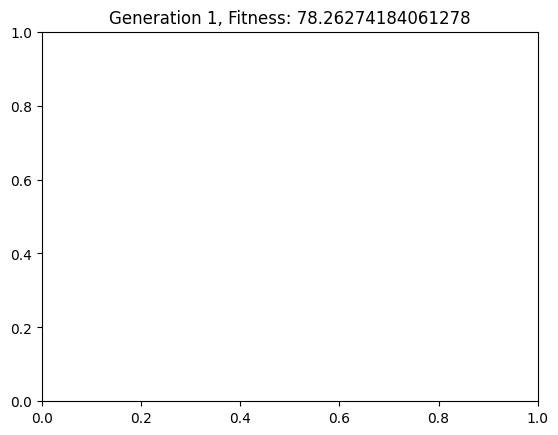

{'rooms': [{'name': 'Living Room', 'position': (62, 304), 'size': (206, 129)}, {'name': 'Passage', 'position': (241, 221), 'size': (150, 82)}, {'name': 'Kitchen', 'position': (392, 228), 'size': (153, 81)}, {'name': 'Washroom', 'position': (323, 304), 'size': (53, 99)}, {'name': 'Bedroom1', 'position': (57, 233), 'size': (183, 71)}, {'name': 'Bedroom2', 'position': (265, 125), 'size': (184, 95)}], 'fitness': 78.26274184061278}


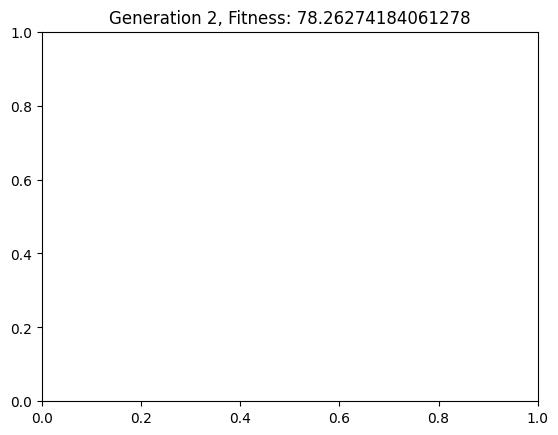

{'rooms': [{'name': 'Living Room', 'position': (62, 304), 'size': (207, 130)}, {'name': 'Passage', 'position': (241, 221), 'size': (150, 83)}, {'name': 'Kitchen', 'position': (392, 228), 'size': (154, 283)}, {'name': 'Washroom', 'position': (323, 304), 'size': (54, 93)}, {'name': 'Bedroom1', 'position': (57, 232), 'size': (184, 71)}, {'name': 'Bedroom2', 'position': (265, 124), 'size': (185, 95)}], 'fitness': 78.26274184061278}


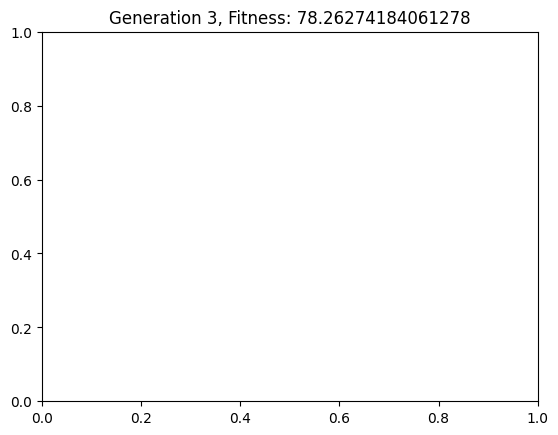

{'rooms': [{'name': 'Living Room', 'position': (62, 304), 'size': (209, 132)}, {'name': 'Passage', 'position': (241, 220), 'size': (150, 84)}, {'name': 'Kitchen', 'position': (392, 228), 'size': (156, 274)}, {'name': 'Washroom', 'position': (323, 304), 'size': (56, 95)}, {'name': 'Bedroom1', 'position': (56, 231), 'size': (185, 72)}, {'name': 'Bedroom2', 'position': (265, 123), 'size': (187, 96)}], 'fitness': -179.94081502649732}


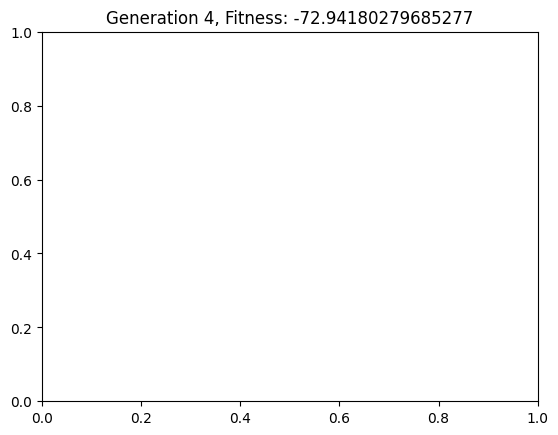

{'rooms': [{'name': 'Living Room', 'position': (62, 304), 'size': (215, 138)}, {'name': 'Bedroom1', 'position': (53, 228), 'size': (188, 75)}, {'name': 'Bedroom2', 'position': (265, 120), 'size': (192, 99)}, {'name': 'Passage', 'position': (241, 219), 'size': (150, 85)}, {'name': 'Kitchen', 'position': (392, 228), 'size': (161, 301)}, {'name': 'Washroom', 'position': (323, 304), 'size': (62, 120)}], 'fitness': -72.94180279685277}


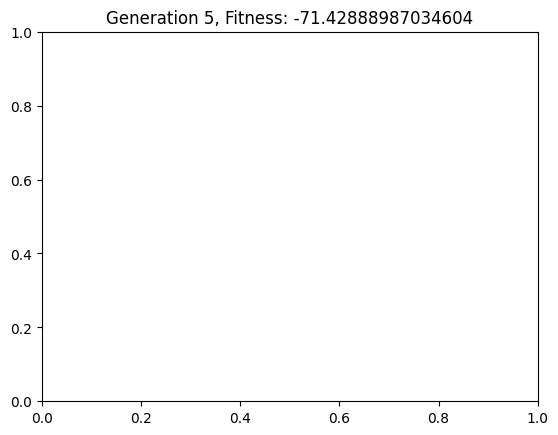

{'rooms': [{'name': 'Living Room', 'position': (62, 304), 'size': (223, 146)}, {'name': 'Bedroom1', 'position': (49, 224), 'size': (192, 79)}, {'name': 'Bedroom2', 'position': (265, 115), 'size': (200, 102)}, {'name': 'Passage', 'position': (241, 218), 'size': (150, 86)}, {'name': 'Kitchen', 'position': (392, 228), 'size': (163, 313)}, {'name': 'Washroom', 'position': (322, 304), 'size': (70, 114)}], 'fitness': -71.42888987034604}


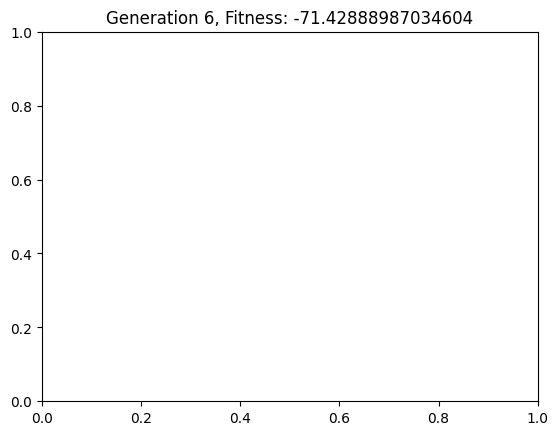

{'rooms': [{'name': 'Living Room', 'position': (62, 304), 'size': (231, 154)}, {'name': 'Bedroom1', 'position': (48, 220), 'size': (193, 83)}, {'name': 'Bedroom2', 'position': (265, 110), 'size': (208, 105)}, {'name': 'Passage', 'position': (241, 218), 'size': (150, 86)}, {'name': 'Kitchen', 'position': (392, 228), 'size': (163, 313)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 145)}], 'fitness': -184.39980896288574}


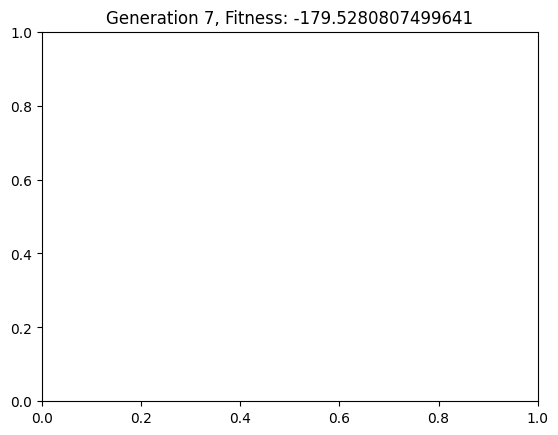

{'rooms': [{'name': 'Living Room', 'position': (62, 304), 'size': (239, 162)}, {'name': 'Bedroom1', 'position': (48, 216), 'size': (193, 87)}, {'name': 'Bedroom2', 'position': (265, 106), 'size': (216, 109)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 228), 'size': (178, 313)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 153)}], 'fitness': -179.5280807499641}


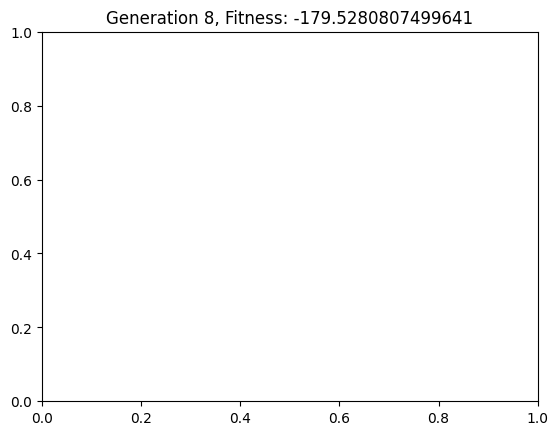

{'rooms': [{'name': 'Living Room', 'position': (62, 304), 'size': (247, 170)}, {'name': 'Bedroom1', 'position': (48, 212), 'size': (193, 91)}, {'name': 'Bedroom2', 'position': (265, 102), 'size': (224, 113)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 228), 'size': (181, 297)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 148)}], 'fitness': -197.77245269358747}


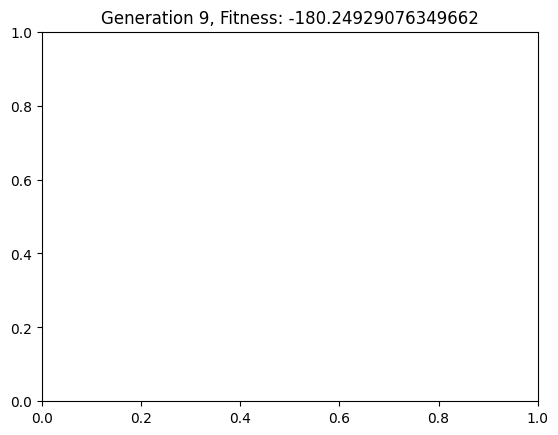

{'rooms': [{'name': 'Living Room', 'position': (60, 304), 'size': (253, 178)}, {'name': 'Bedroom1', 'position': (48, 208), 'size': (193, 95)}, {'name': 'Bedroom2', 'position': (265, 98), 'size': (232, 117)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 228), 'size': (185, 330)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 134)}], 'fitness': -180.24929076349662}


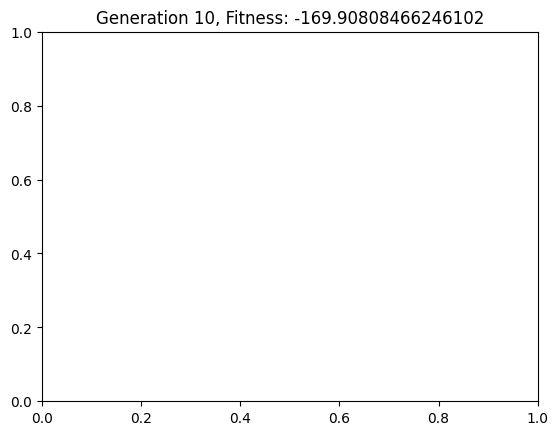

{'rooms': [{'name': 'Living Room', 'position': (56, 304), 'size': (257, 186)}, {'name': 'Bedroom1', 'position': (48, 204), 'size': (193, 99)}, {'name': 'Bedroom2', 'position': (265, 94), 'size': (240, 121)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (191, 338)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 136)}], 'fitness': -169.90808466246102}


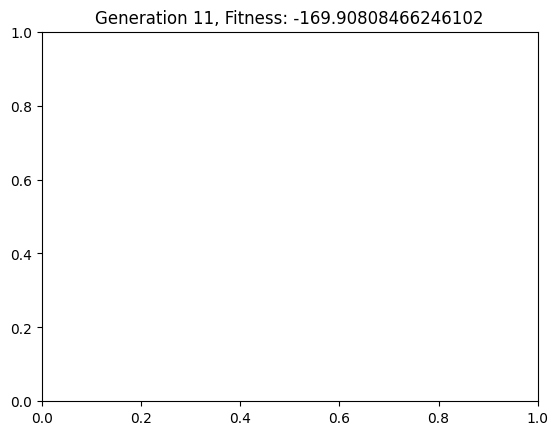

{'rooms': [{'name': 'Living Room', 'position': (52, 304), 'size': (261, 194)}, {'name': 'Bedroom1', 'position': (48, 200), 'size': (193, 103)}, {'name': 'Bedroom2', 'position': (265, 90), 'size': (248, 125)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (195, 334)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 132)}], 'fitness': -175.88535655773177}


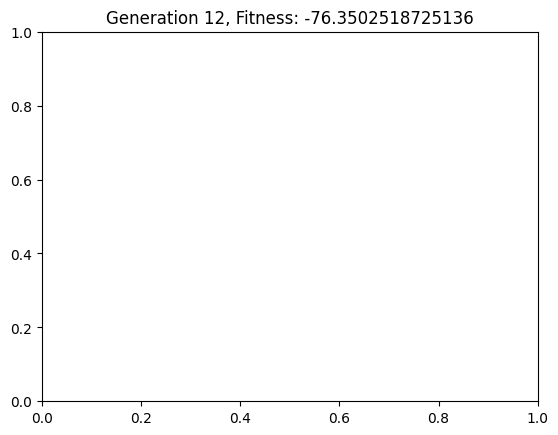

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (265, 202)}, {'name': 'Bedroom1', 'position': (48, 196), 'size': (193, 107)}, {'name': 'Bedroom2', 'position': (265, 86), 'size': (256, 129)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (199, 333)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 150)}], 'fitness': -76.3502518725136}


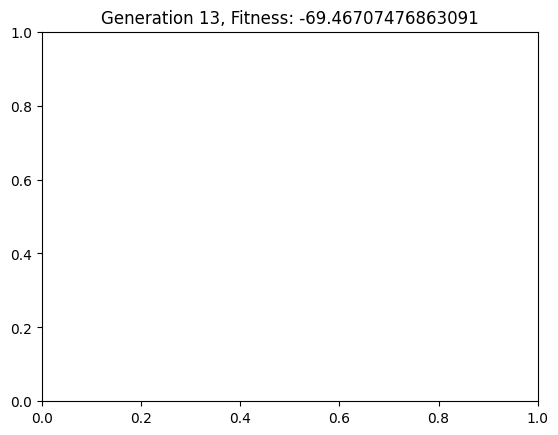

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 210)}, {'name': 'Bedroom1', 'position': (48, 192), 'size': (193, 111)}, {'name': 'Bedroom2', 'position': (265, 82), 'size': (264, 133)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (202, 332)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 145)}], 'fitness': -69.46707476863091}


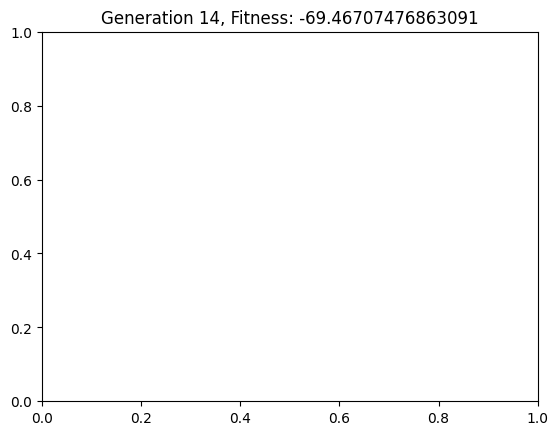

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 218)}, {'name': 'Bedroom1', 'position': (48, 188), 'size': (193, 115)}, {'name': 'Bedroom2', 'position': (265, 78), 'size': (272, 137)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (204, 343)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 142)}], 'fitness': -79.00088016512879}


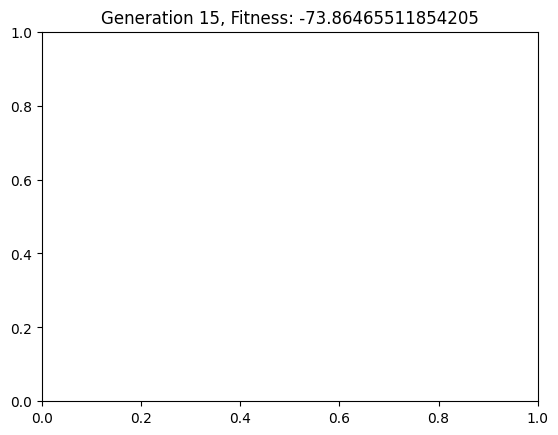

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 226)}, {'name': 'Bedroom1', 'position': (48, 184), 'size': (193, 119)}, {'name': 'Bedroom2', 'position': (265, 74), 'size': (280, 141)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (207, 334)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 139)}], 'fitness': -73.86465511854205}


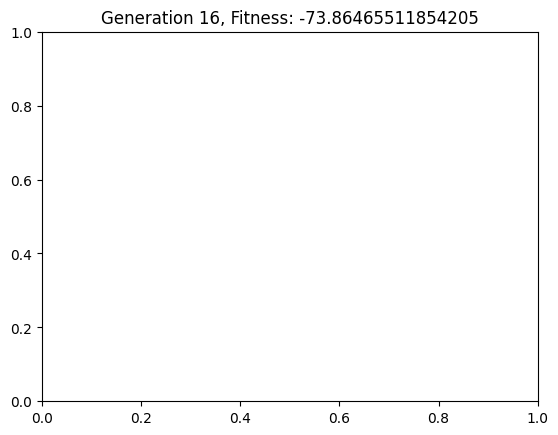

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 234)}, {'name': 'Bedroom1', 'position': (48, 180), 'size': (193, 123)}, {'name': 'Bedroom2', 'position': (265, 70), 'size': (288, 145)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (207, 334)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 127)}], 'fitness': -182.42282928699169}


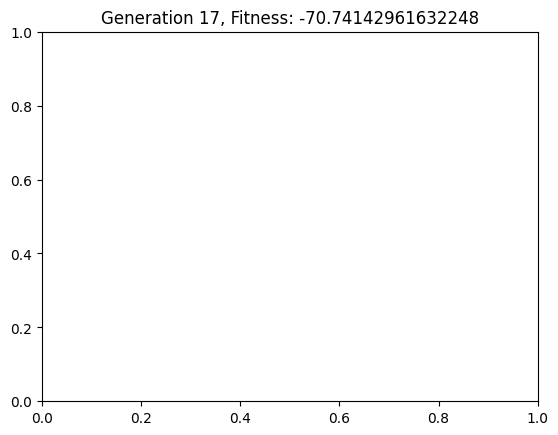

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 242)}, {'name': 'Bedroom1', 'position': (48, 176), 'size': (193, 127)}, {'name': 'Bedroom2', 'position': (265, 66), 'size': (296, 149)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (211, 339)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 136)}], 'fitness': -70.74142961632248}


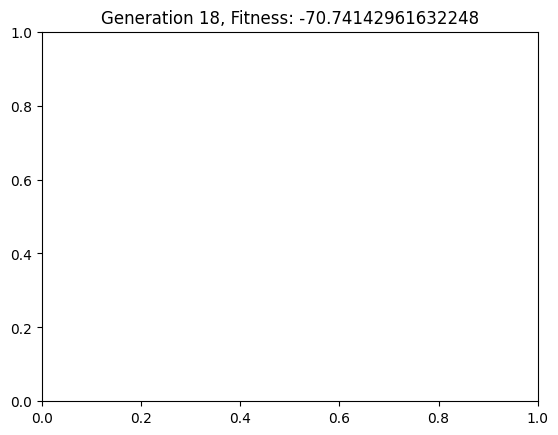

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 250)}, {'name': 'Bedroom1', 'position': (48, 172), 'size': (193, 131)}, {'name': 'Bedroom2', 'position': (265, 62), 'size': (304, 153)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (211, 339)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 154)}], 'fitness': -193.30123505591064}


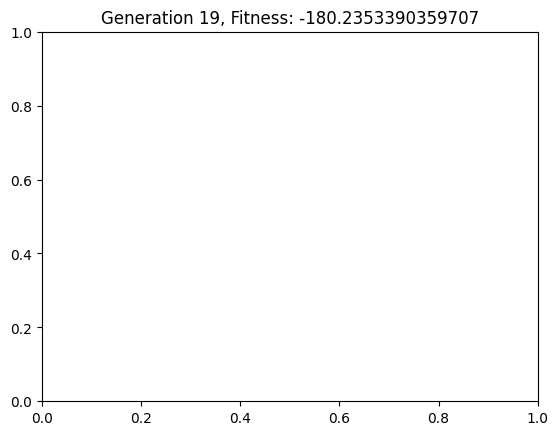

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 168), 'size': (193, 135)}, {'name': 'Bedroom2', 'position': (265, 58), 'size': (312, 157)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (211, 339)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 140)}], 'fitness': -180.2353390359707}


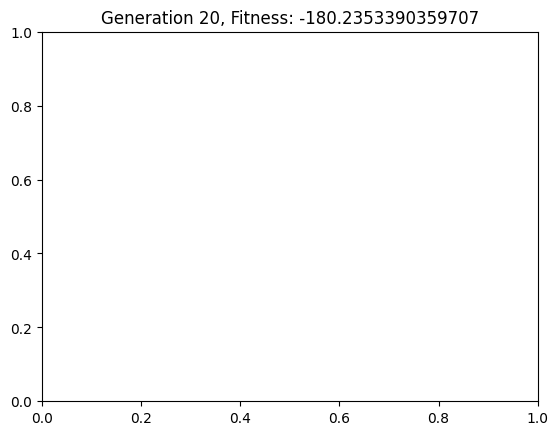

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 164), 'size': (193, 139)}, {'name': 'Bedroom2', 'position': (265, 54), 'size': (320, 161)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (212, 340)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 145)}], 'fitness': -194.5631205132899}


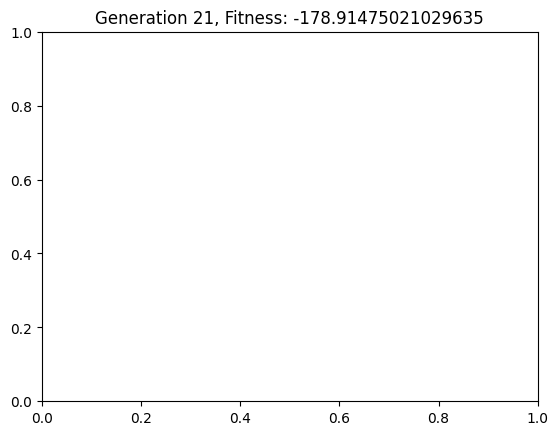

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 160), 'size': (193, 143)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (328, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (212, 340)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 138)}], 'fitness': -178.91475021029635}


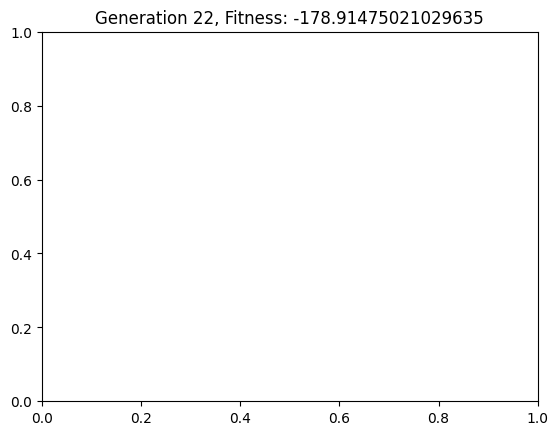

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 156), 'size': (193, 147)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (336, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (212, 340)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 147)}], 'fitness': -186.26151091554993}


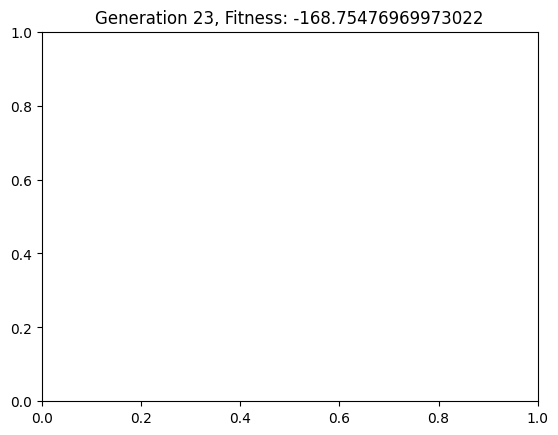

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 152), 'size': (193, 151)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (344, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (212, 340)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 134)}], 'fitness': -168.75476969973022}


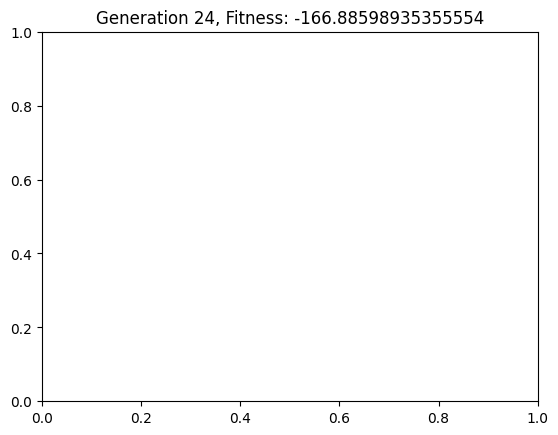

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 148), 'size': (193, 155)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (352, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (212, 340)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 143)}], 'fitness': -166.88598935355554}


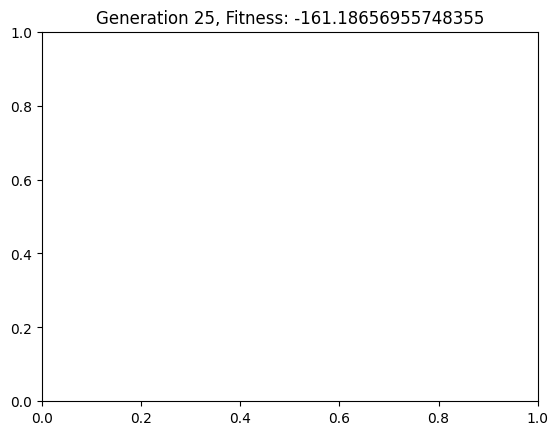

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 144), 'size': (193, 159)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (360, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (213, 341)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 153)}], 'fitness': -161.18656955748355}


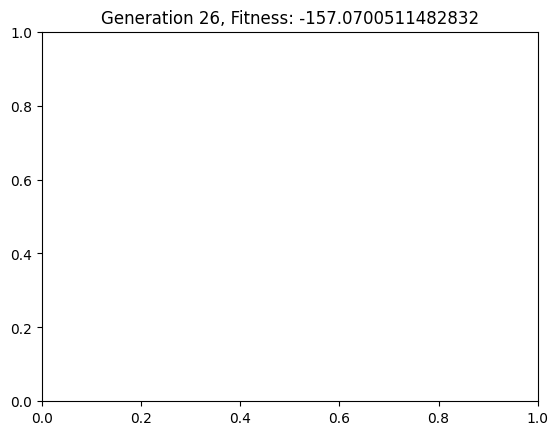

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 140), 'size': (193, 163)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (368, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (213, 341)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 141)}], 'fitness': -157.0700511482832}


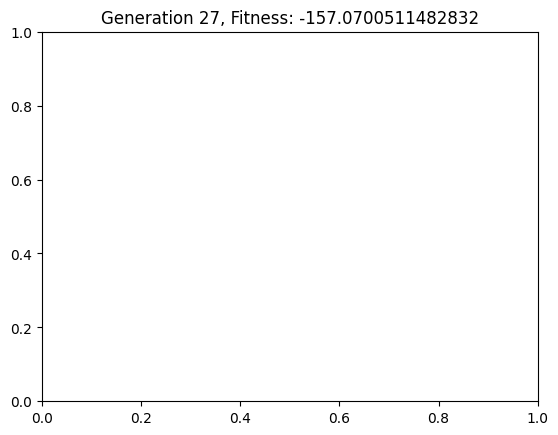

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 136), 'size': (193, 167)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (376, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (213, 341)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 150)}], 'fitness': -163.23170385160057}


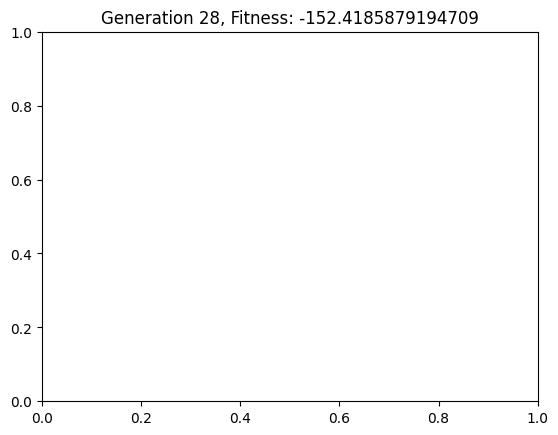

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 132), 'size': (193, 171)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (384, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (214, 343)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 153)}], 'fitness': -152.4185879194709}


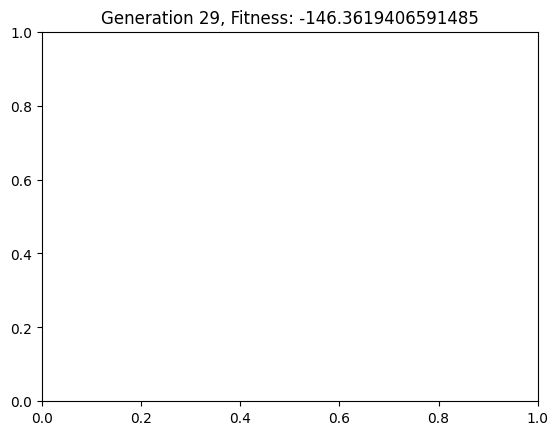

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 128), 'size': (193, 175)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (392, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (214, 343)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 155)}], 'fitness': -146.3619406591485}


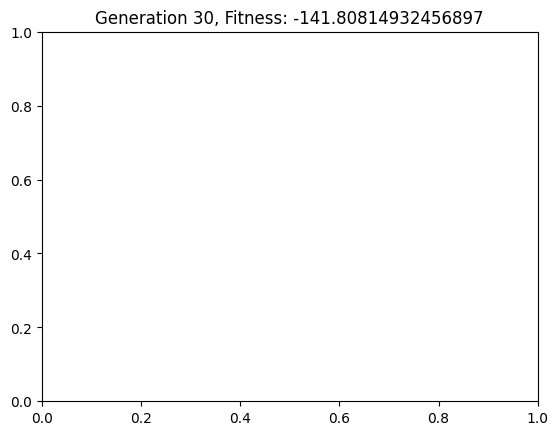

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 124), 'size': (193, 179)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 217), 'size': (214, 343)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 147)}], 'fitness': -141.80814932456897}


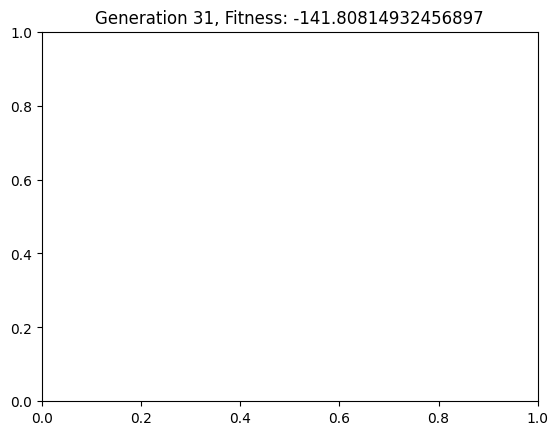

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 120), 'size': (193, 183)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 141)}], 'fitness': -144.99352085498617}


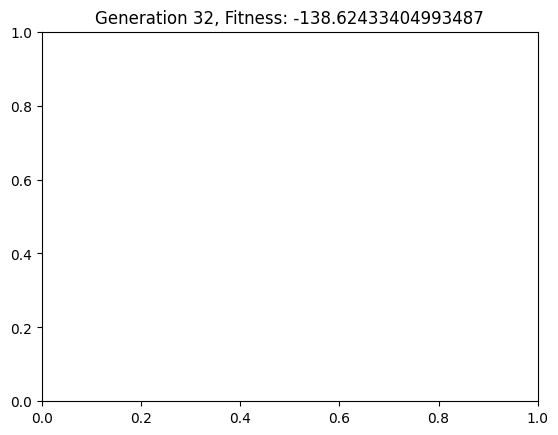

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 116), 'size': (193, 187)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 151)}], 'fitness': -138.62433404993487}


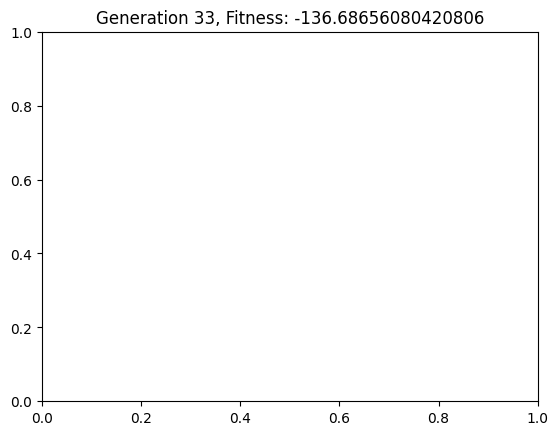

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 112), 'size': (193, 191)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 153)}], 'fitness': -136.68656080420806}


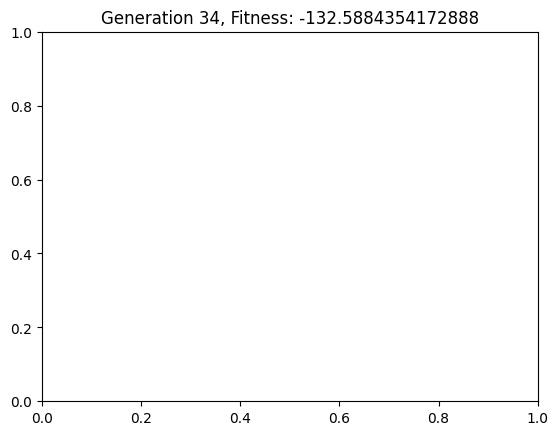

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 108), 'size': (193, 195)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 141)}], 'fitness': -132.5884354172888}


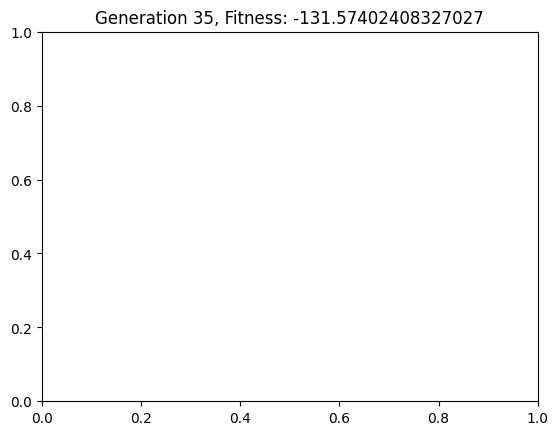

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 104), 'size': (193, 199)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 140)}], 'fitness': -131.57402408327027}


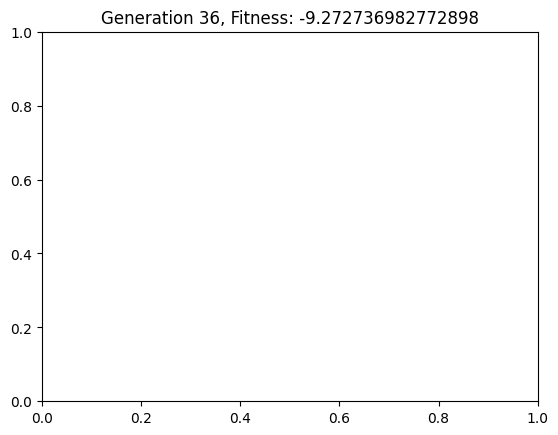

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 100), 'size': (193, 203)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 130)}], 'fitness': -9.272736982772898}


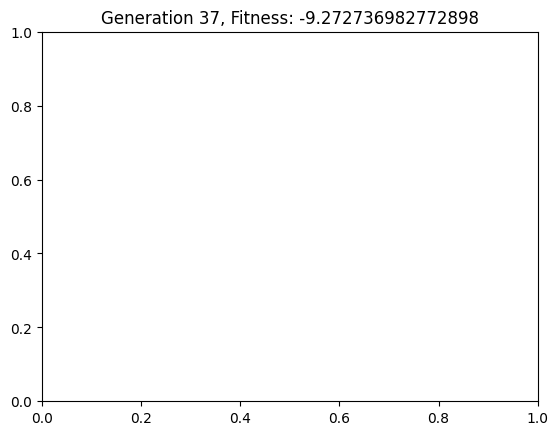

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 96), 'size': (193, 207)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 154)}], 'fitness': -33.663872249959994}


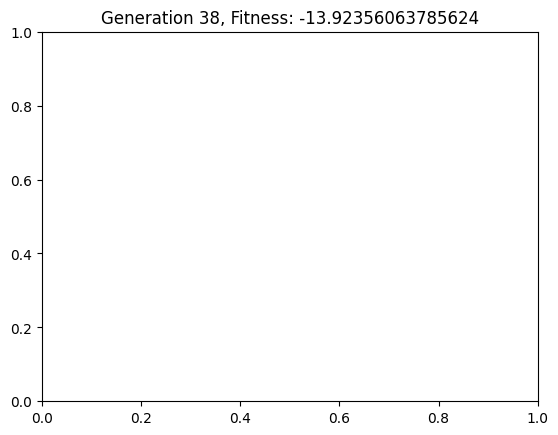

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 92), 'size': (193, 211)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 152)}], 'fitness': -13.92356063785624}


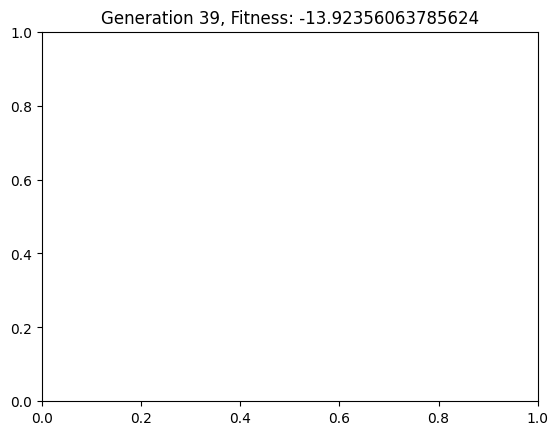

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 88), 'size': (193, 215)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 144)}], 'fitness': -17.520824693837184}


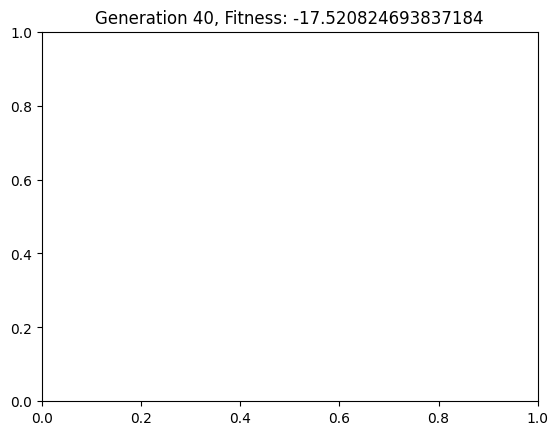

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 84), 'size': (193, 219)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 153)}], 'fitness': -25.92676688362225}


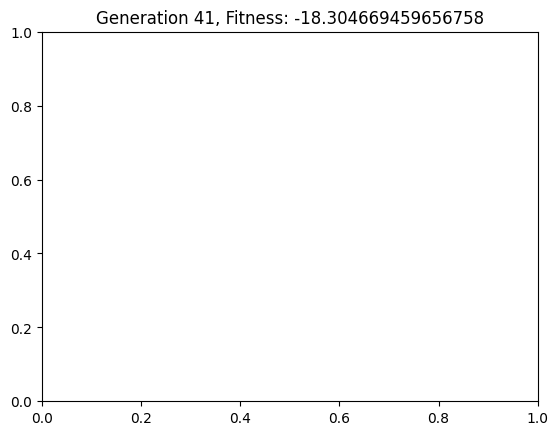

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 80), 'size': (193, 223)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 140)}], 'fitness': -18.304669459656758}


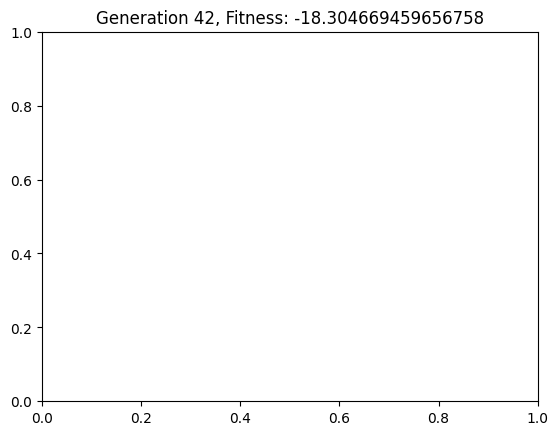

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 76), 'size': (193, 227)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 139)}], 'fitness': -33.21286882901559}


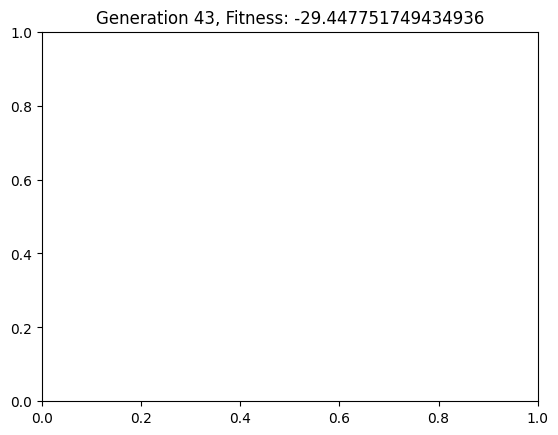

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 72), 'size': (193, 231)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 131)}], 'fitness': -29.447751749434936}


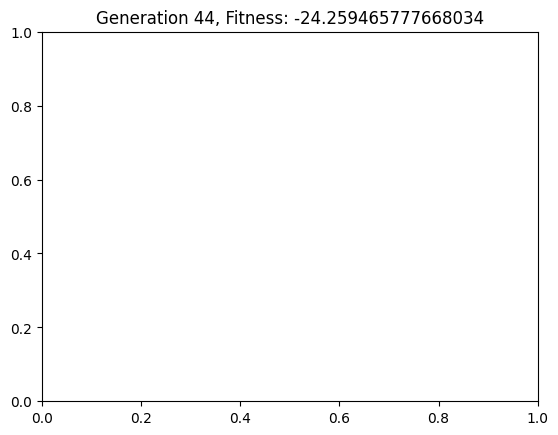

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 68), 'size': (193, 235)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 127)}], 'fitness': -24.259465777668034}


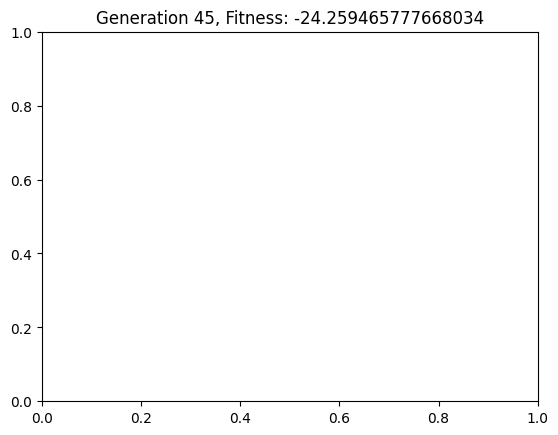

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 64), 'size': (193, 239)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 154)}], 'fitness': -51.20163311425507}


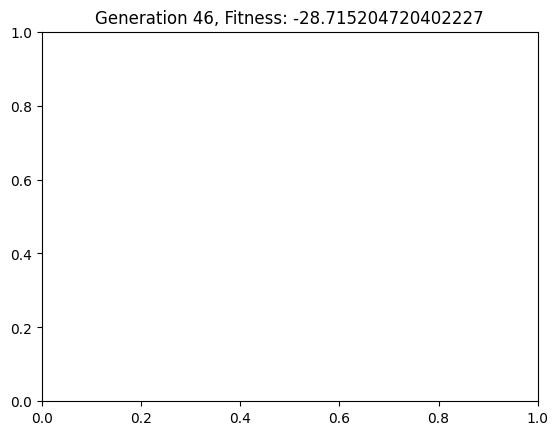

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 60), 'size': (193, 243)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 141)}], 'fitness': -28.715204720402227}


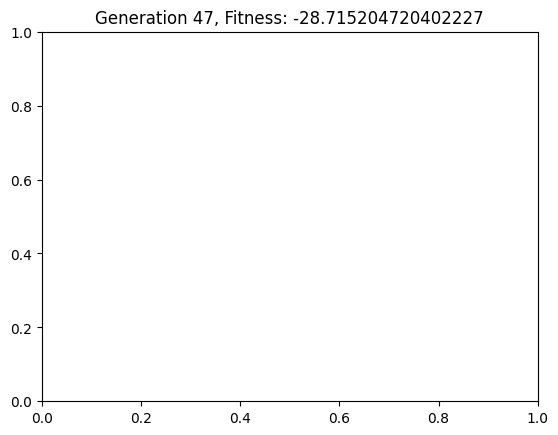

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 56), 'size': (193, 247)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 142)}], 'fitness': -40.7301055999704}


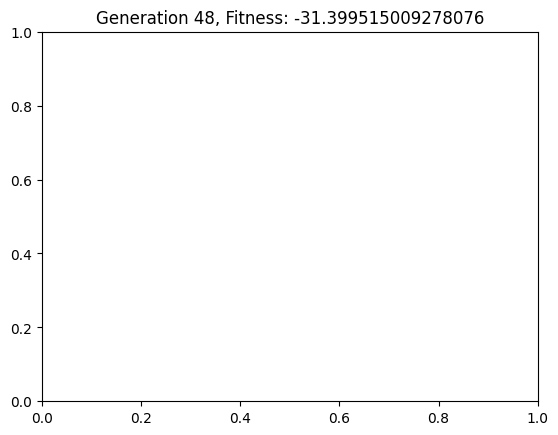

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 52), 'size': (193, 251)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 143)}], 'fitness': -31.399515009278076}


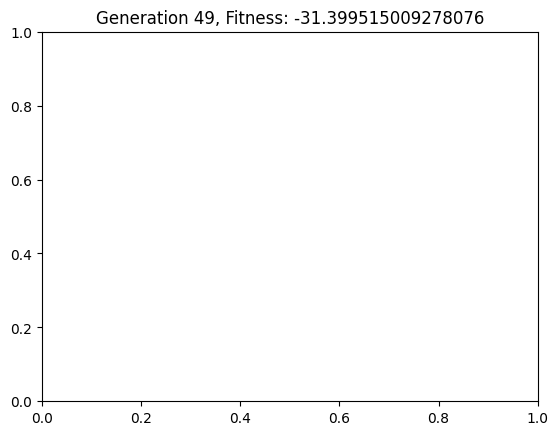

{'rooms': [{'name': 'Living Room', 'position': (48, 304), 'size': (266, 256)}, {'name': 'Bedroom1', 'position': (48, 52), 'size': (193, 252)}, {'name': 'Bedroom2', 'position': (265, 52), 'size': (394, 164)}, {'name': 'Passage', 'position': (241, 216), 'size': (150, 88)}, {'name': 'Kitchen', 'position': (392, 216), 'size': (215, 344)}, {'name': 'Washroom', 'position': (314, 304), 'size': (78, 147)}], 'fitness': -41.96174517880517}
Elapsed time: 947.46 seconds


<Figure size 640x480 with 0 Axes>

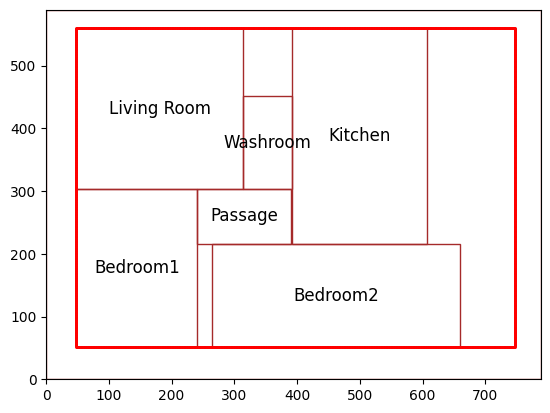

Elapsed time for initial population generation: 28.58 seconds


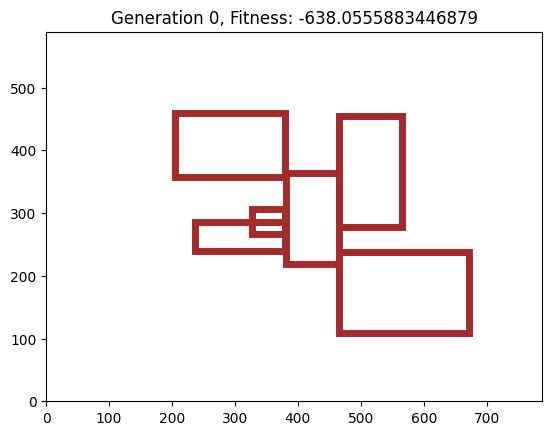

{'rooms': [{'name': 'Living Room', 'position': (466, 109), 'size': (206, 129)}, {'name': 'Passage', 'position': (381, 218), 'size': (84, 146)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 39)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (99, 177)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (175, 101)}], 'fitness': -638.0555883446879}


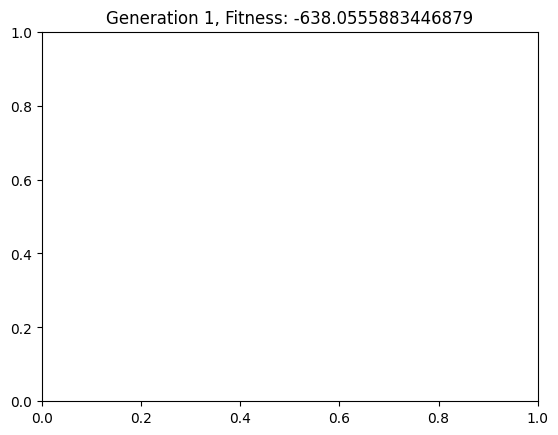

{'rooms': [{'name': 'Living Room', 'position': (466, 109), 'size': (207, 130)}, {'name': 'Passage', 'position': (381, 218), 'size': (85, 146)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 39)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (100, 178)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (175, 101)}], 'fitness': -638.0555883446879}


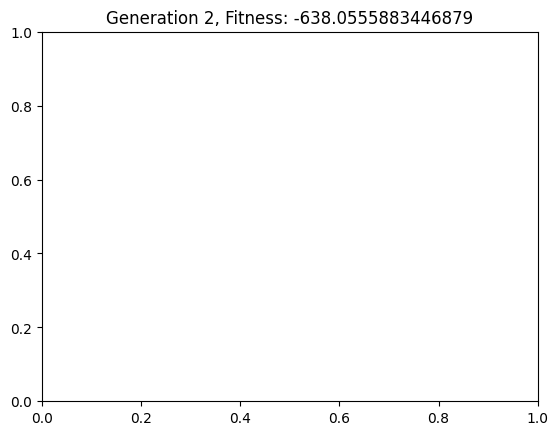

{'rooms': [{'name': 'Living Room', 'position': (466, 109), 'size': (210, 133)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 39)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (103, 181)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (177, 103)}], 'fitness': -644.2504317975727}


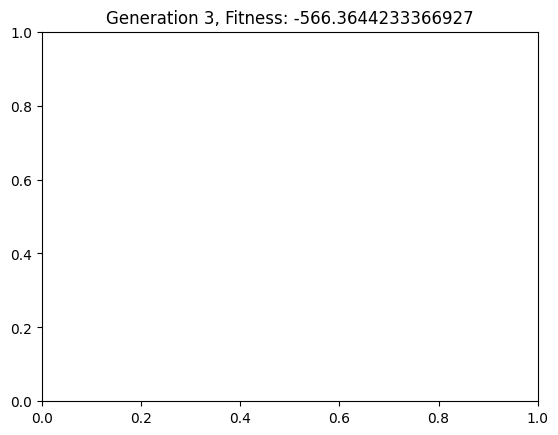

{'rooms': [{'name': 'Living Room', 'position': (466, 109), 'size': (216, 139)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (108, 186)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (181, 107)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -566.3644233366927}


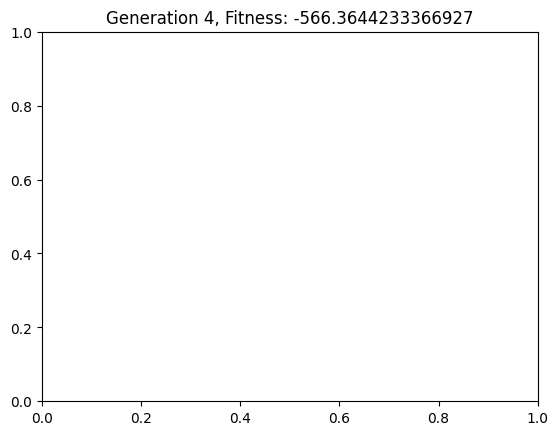

{'rooms': [{'name': 'Living Room', 'position': (466, 109), 'size': (224, 147)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (114, 192)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -590.3946276450897}


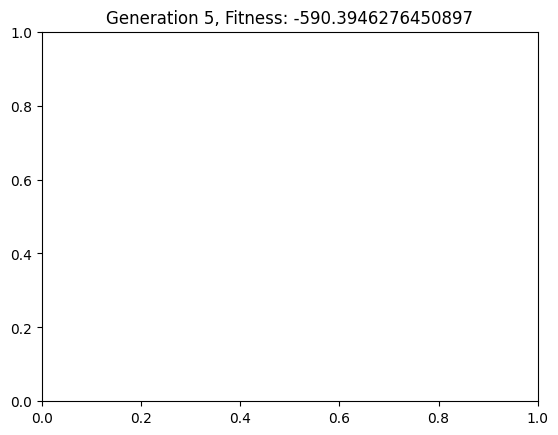

{'rooms': [{'name': 'Living Room', 'position': (466, 109), 'size': (232, 155)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (121, 199)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -621.6483622597058}


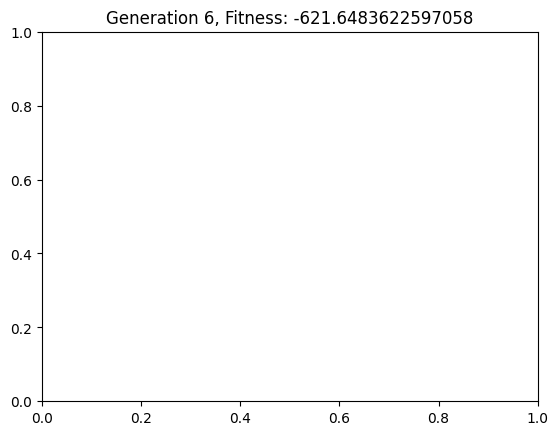

{'rooms': [{'name': 'Living Room', 'position': (466, 109), 'size': (240, 163)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (129, 207)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -656.7430493437712}


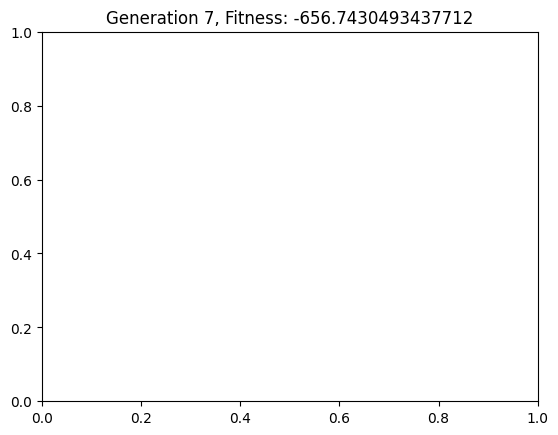

{'rooms': [{'name': 'Living Room', 'position': (466, 108), 'size': (248, 170)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (137, 215)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -693.4603660513795}


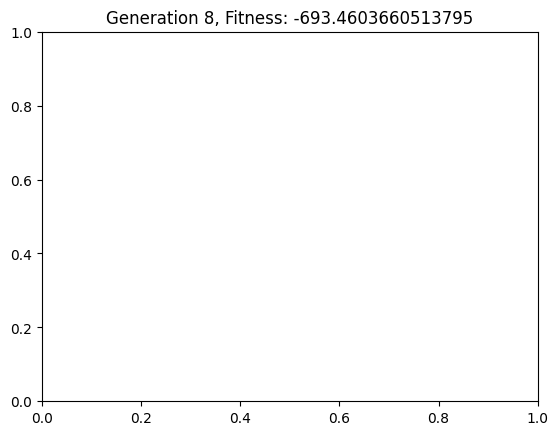

{'rooms': [{'name': 'Living Room', 'position': (466, 104), 'size': (256, 174)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (145, 223)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -730.0699550467069}


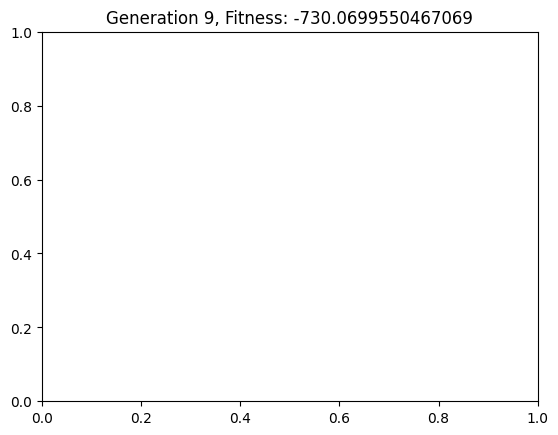

{'rooms': [{'name': 'Living Room', 'position': (466, 100), 'size': (264, 178)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (153, 231)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -764.2862187946571}


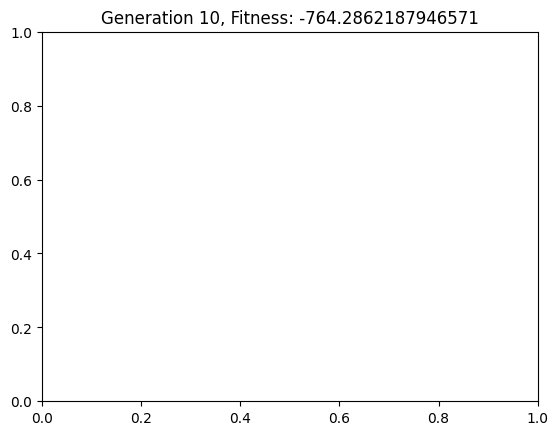

{'rooms': [{'name': 'Living Room', 'position': (466, 96), 'size': (272, 182)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (161, 239)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -797.8045268511542}


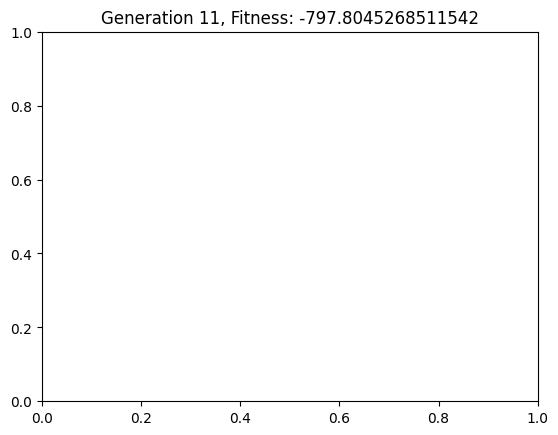

{'rooms': [{'name': 'Living Room', 'position': (466, 92), 'size': (280, 186)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (169, 247)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -832.686836435347}


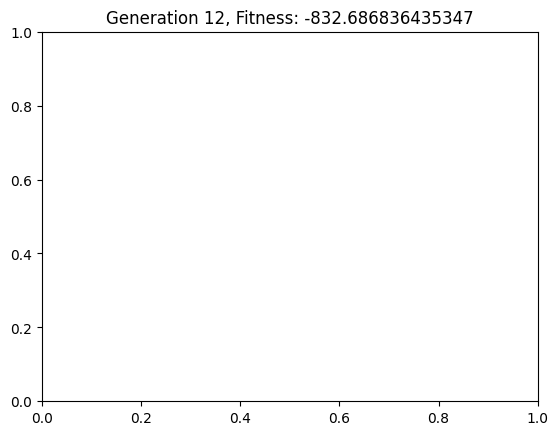

{'rooms': [{'name': 'Living Room', 'position': (466, 88), 'size': (281, 190)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (177, 255)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -866.9830204322536}


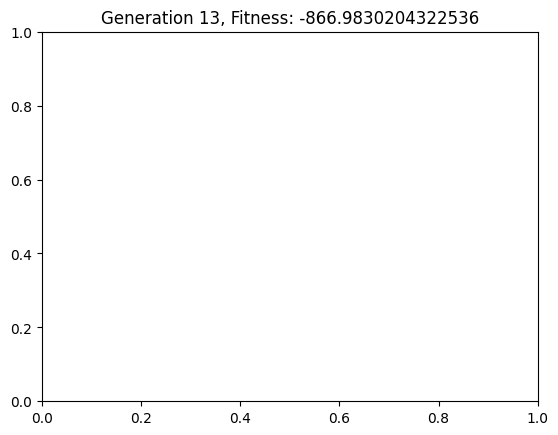

{'rooms': [{'name': 'Living Room', 'position': (466, 84), 'size': (281, 194)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (185, 263)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -967.4968620471852}


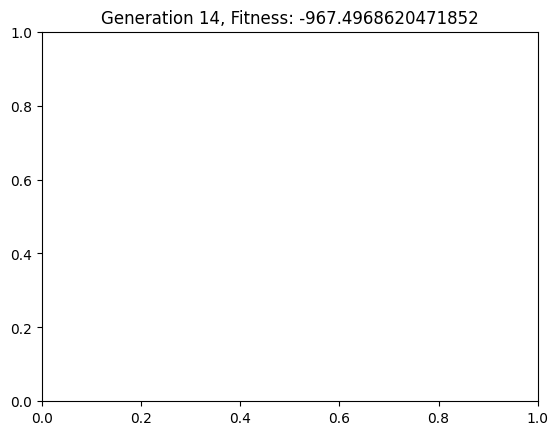

{'rooms': [{'name': 'Living Room', 'position': (466, 80), 'size': (281, 198)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (193, 271)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -984.4264255018971}


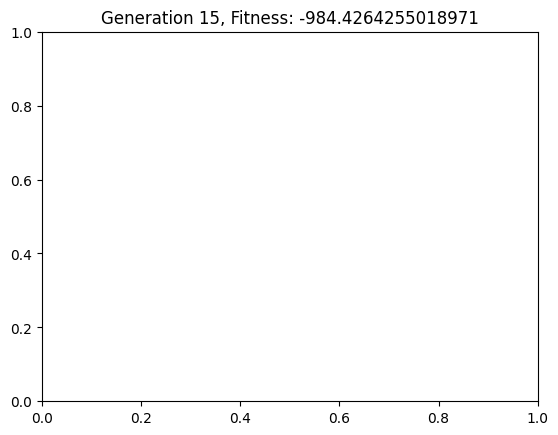

{'rooms': [{'name': 'Living Room', 'position': (466, 76), 'size': (281, 202)}, {'name': 'Bedroom1', 'position': (466, 278), 'size': (201, 279)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1001.9507229781265}


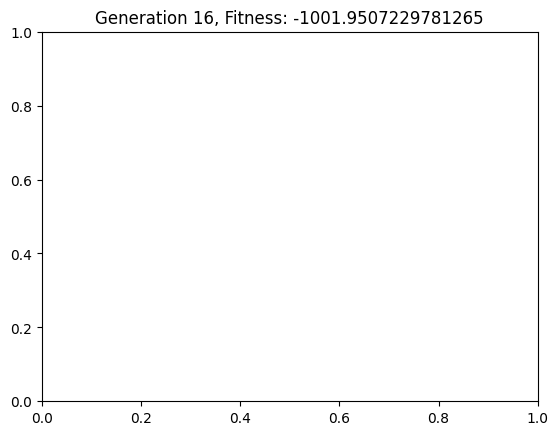

{'rooms': [{'name': 'Living Room', 'position': (466, 71), 'size': (281, 205)}, {'name': 'Bedroom1', 'position': (466, 276), 'size': (209, 283)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1018.1228019460782}


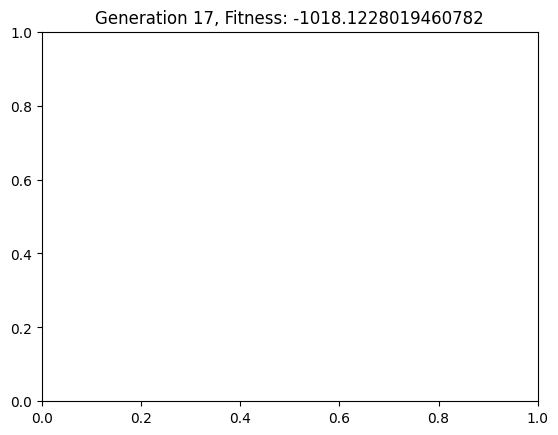

{'rooms': [{'name': 'Living Room', 'position': (466, 66), 'size': (281, 208)}, {'name': 'Bedroom1', 'position': (466, 274), 'size': (217, 286)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1032.230958640791}


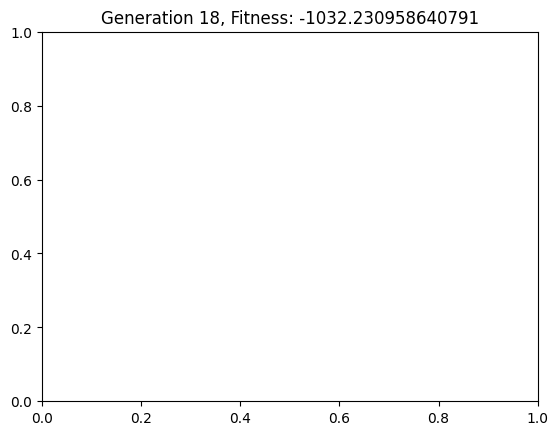

{'rooms': [{'name': 'Living Room', 'position': (466, 60), 'size': (281, 210)}, {'name': 'Bedroom1', 'position': (466, 271), 'size': (225, 289)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1044.9493036599333}


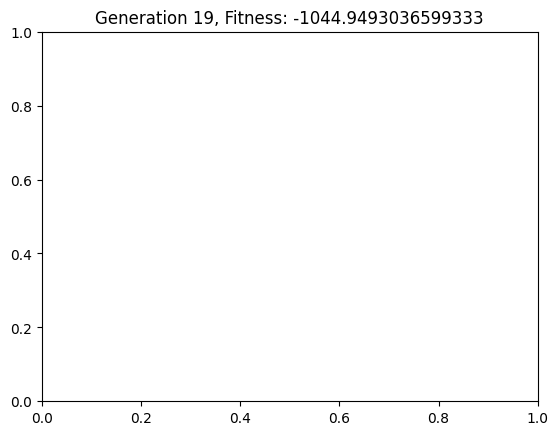

{'rooms': [{'name': 'Living Room', 'position': (466, 55), 'size': (281, 213)}, {'name': 'Bedroom1', 'position': (466, 268), 'size': (233, 291)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1056.6095197448933}


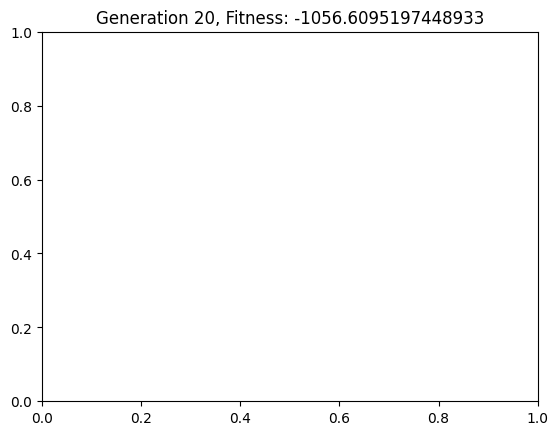

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (241, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1069.8624936790873}


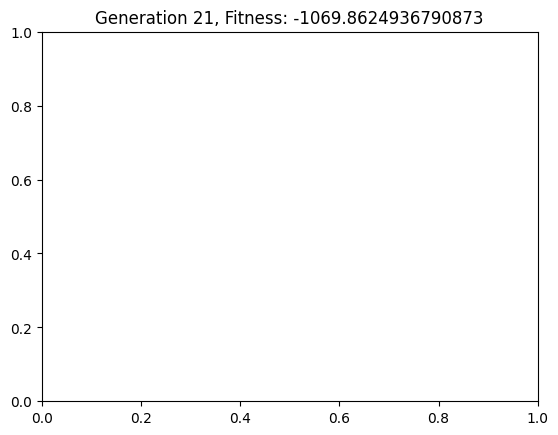

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (249, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1078.2337986838152}


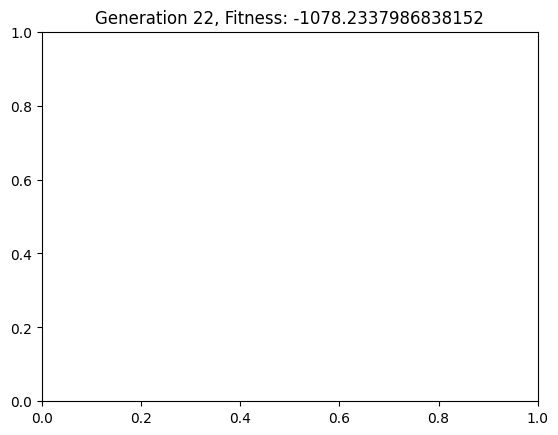

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (257, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1080.170399538547}


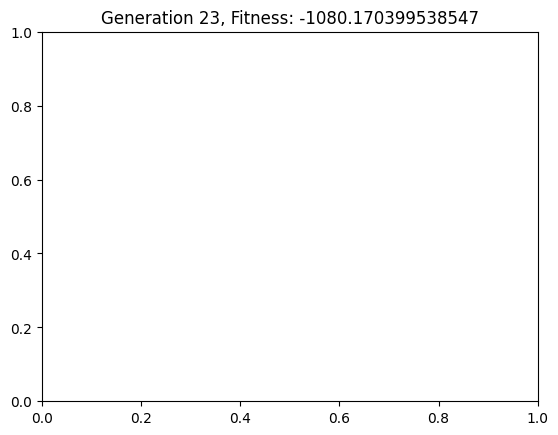

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (265, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1081.982387921056}


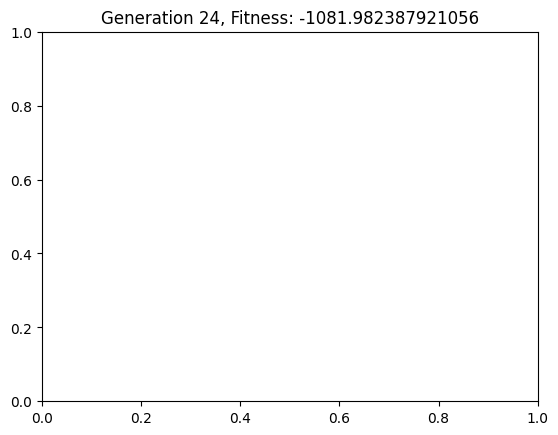

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (273, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1083.6816161398363}


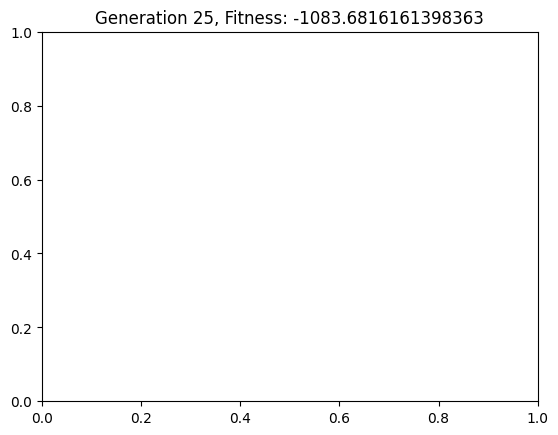

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1084.2784461724484}


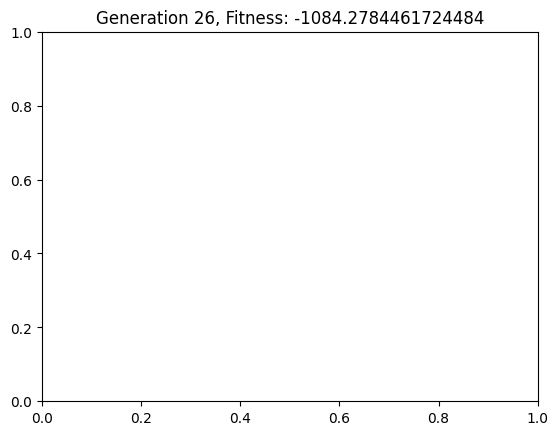

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


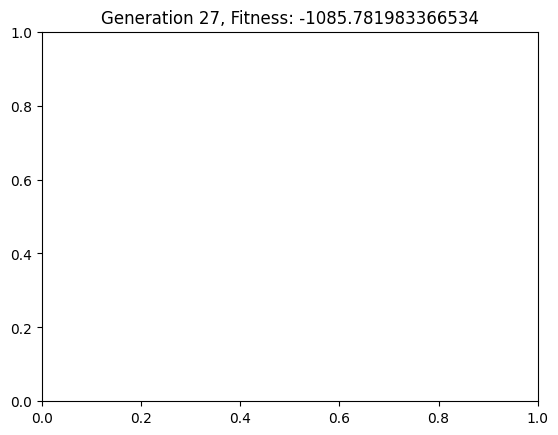

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


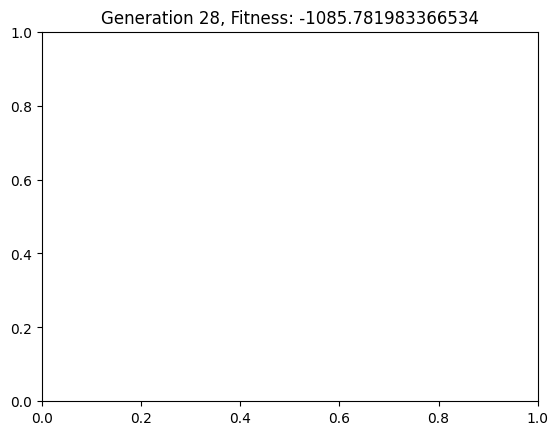

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


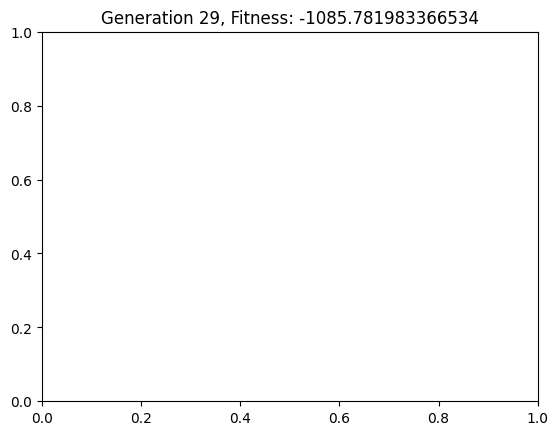

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


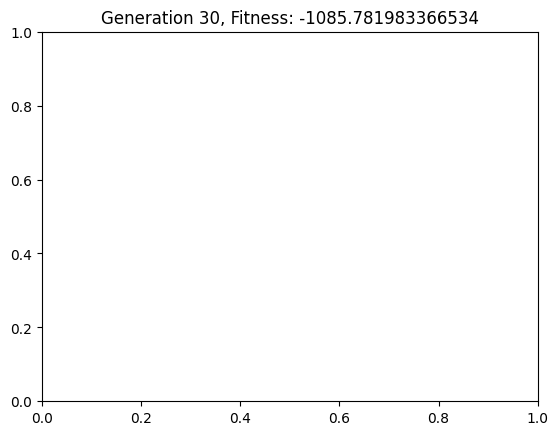

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


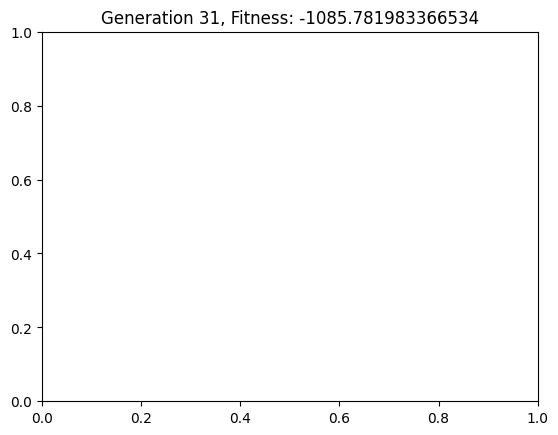

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


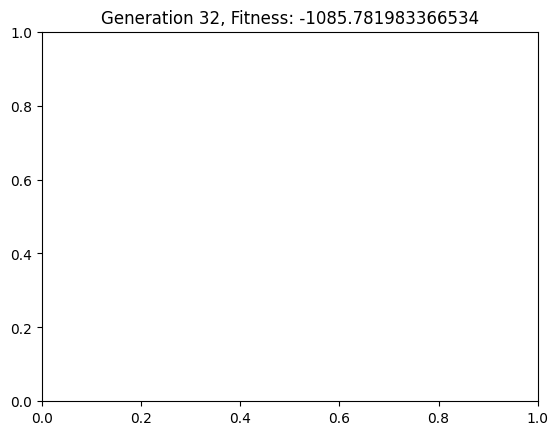

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


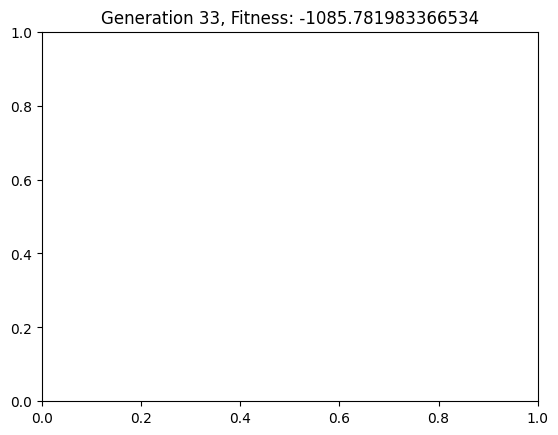

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


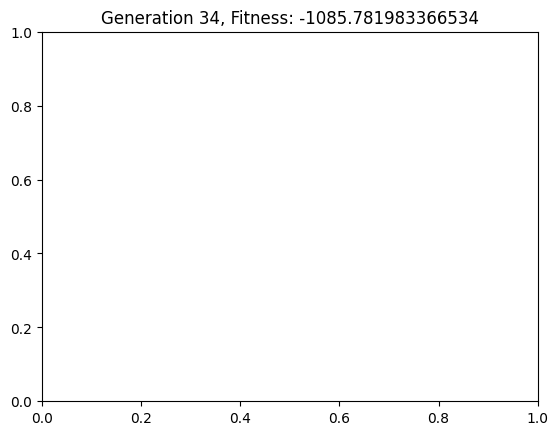

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


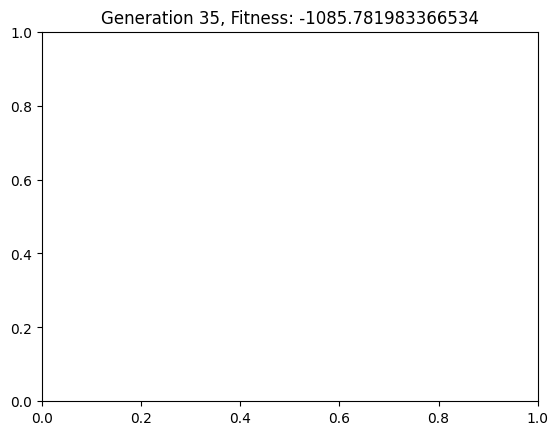

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


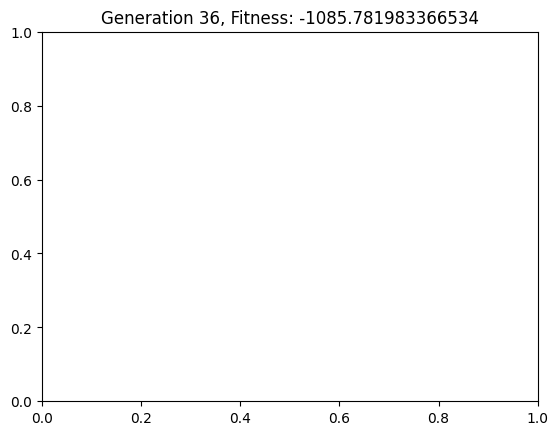

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


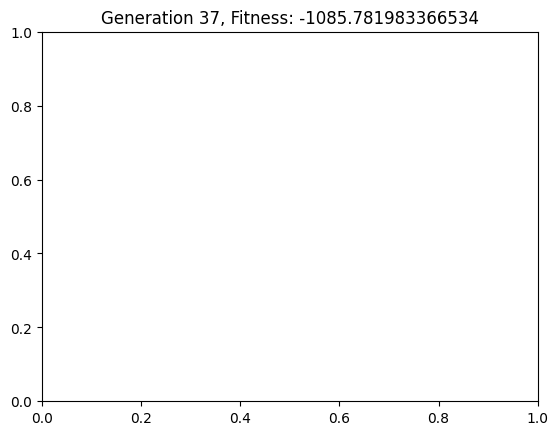

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


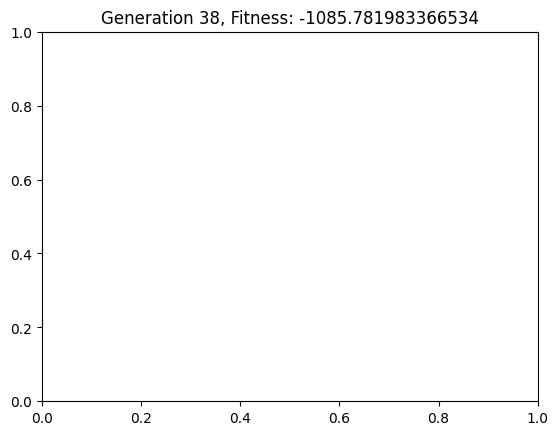

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


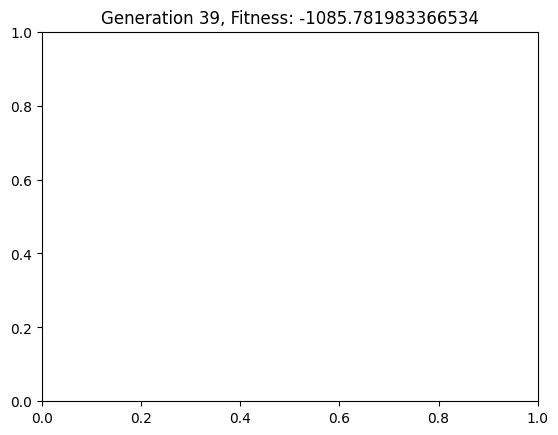

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


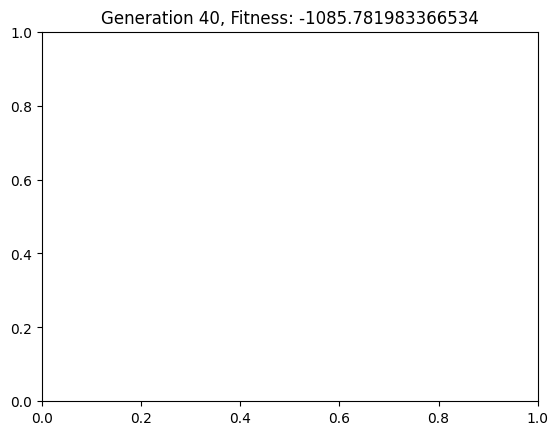

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


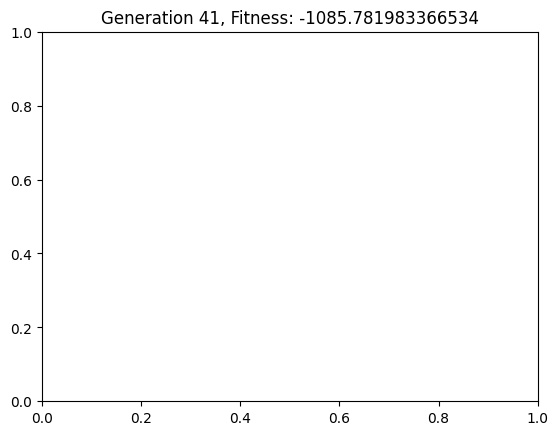

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


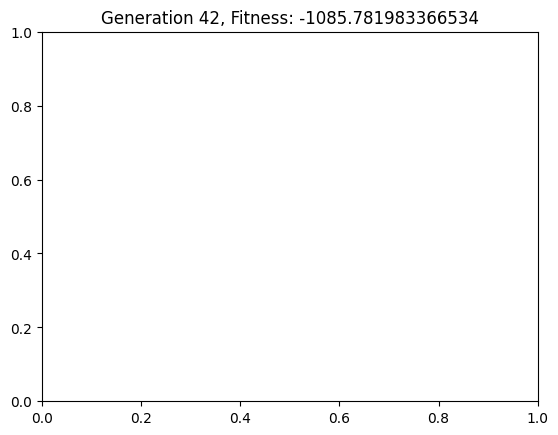

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


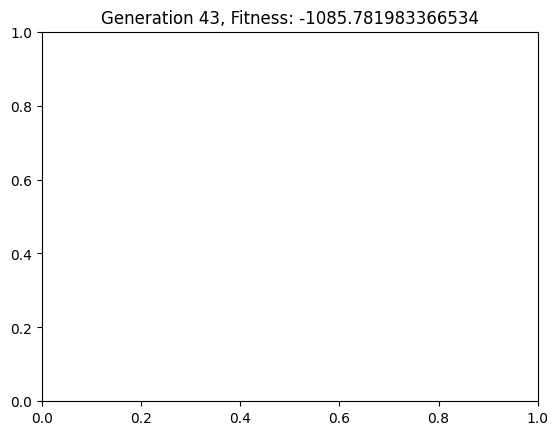

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


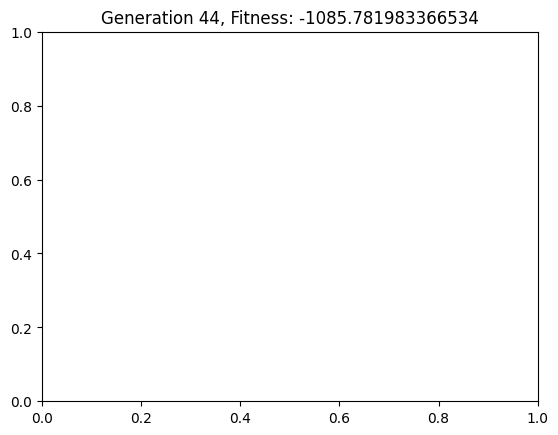

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


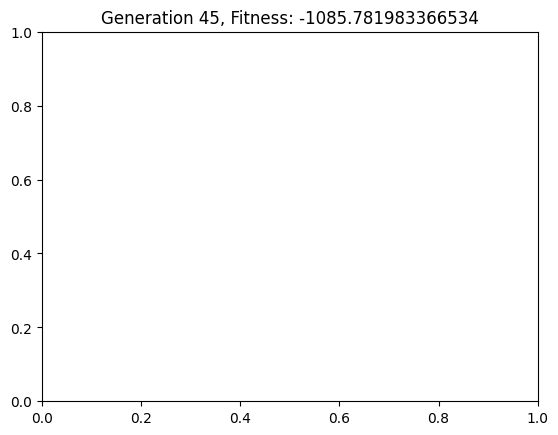

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


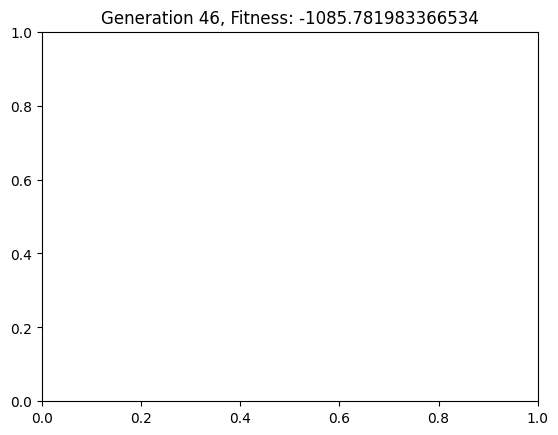

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


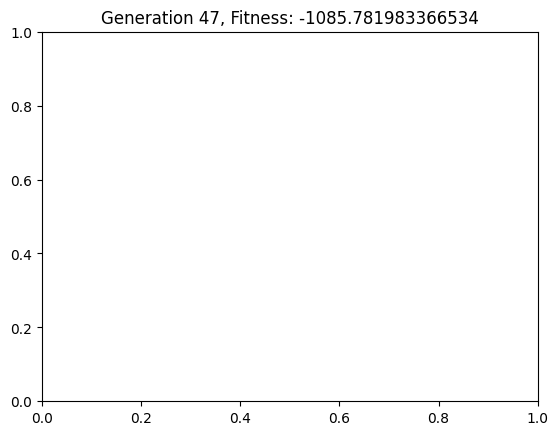

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


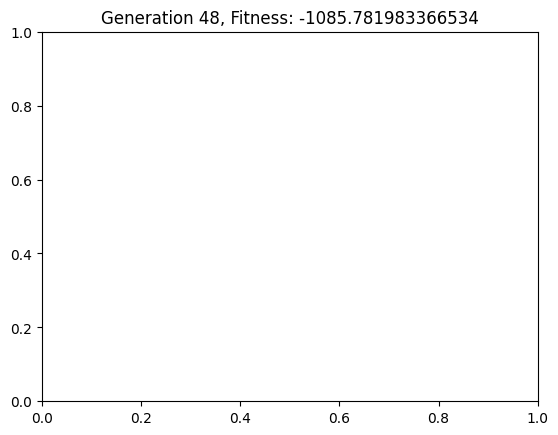

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}


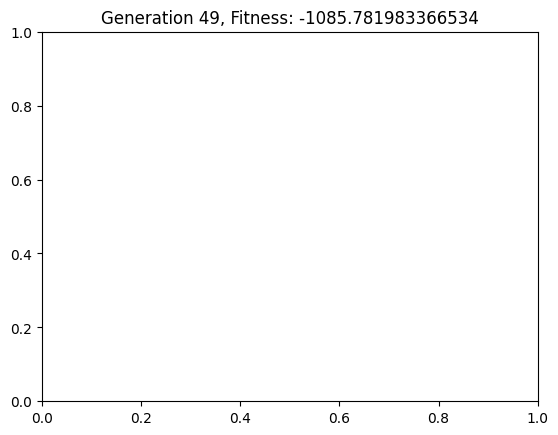

{'rooms': [{'name': 'Living Room', 'position': (466, 52), 'size': (281, 215)}, {'name': 'Bedroom1', 'position': (466, 267), 'size': (281, 293)}, {'name': 'Bedroom2', 'position': (205, 358), 'size': (184, 110)}, {'name': 'Passage', 'position': (380, 218), 'size': (86, 88)}, {'name': 'Kitchen', 'position': (237, 239), 'size': (143, 47)}, {'name': 'Washroom', 'position': (327, 267), 'size': (53, 97)}], 'fitness': -1085.781983366534}
Elapsed time: 859.71 seconds


<Figure size 640x480 with 0 Axes>

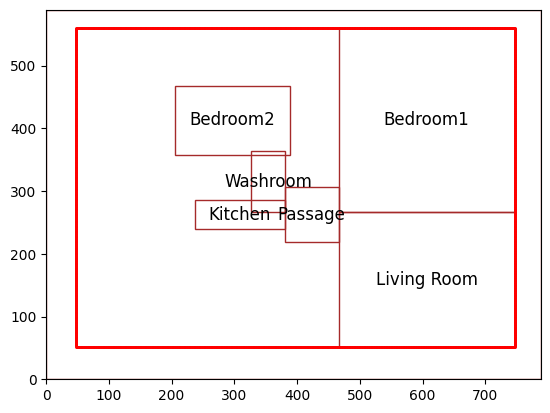

Elapsed time for initial population generation: 28.53 seconds


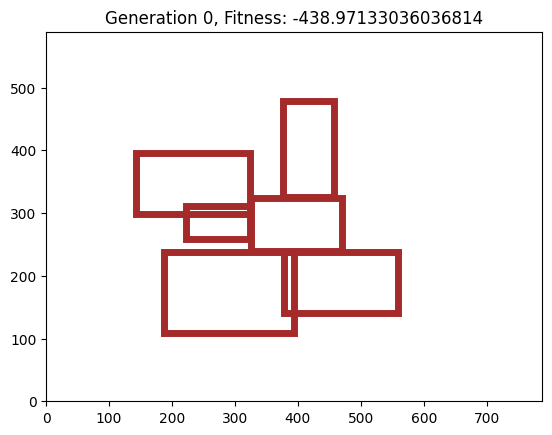

{'rooms': [{'name': 'Living Room', 'position': (188, 109), 'size': (206, 129)}, {'name': 'Passage', 'position': (325, 239), 'size': (145, 85)}, {'name': 'Kitchen', 'position': (377, 325), 'size': (80, 154)}, {'name': 'Washroom', 'position': (222, 259), 'size': (102, 52)}, {'name': 'Bedroom1', 'position': (378, 141), 'size': (181, 97)}, {'name': 'Bedroom2', 'position': (143, 299), 'size': (181, 97)}], 'fitness': -438.97133036036814}


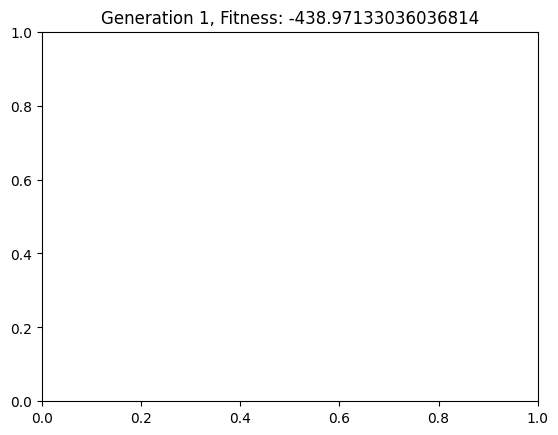

{'rooms': [{'name': 'Living Room', 'position': (188, 109), 'size': (206, 129)}, {'name': 'Passage', 'position': (325, 238), 'size': (118, 86)}, {'name': 'Kitchen', 'position': (377, 325), 'size': (82, 155)}, {'name': 'Washroom', 'position': (222, 259), 'size': (102, 52)}, {'name': 'Bedroom1', 'position': (378, 141), 'size': (181, 97)}, {'name': 'Bedroom2', 'position': (143, 299), 'size': (181, 97)}], 'fitness': -438.97133036036814}


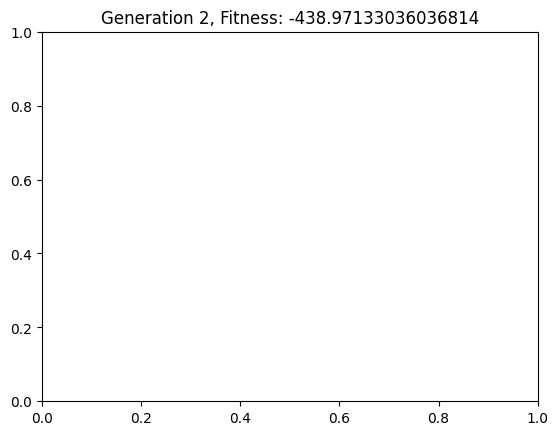

{'rooms': [{'name': 'Living Room', 'position': (188, 109), 'size': (206, 129)}, {'name': 'Passage', 'position': (325, 238), 'size': (118, 87)}, {'name': 'Kitchen', 'position': (377, 325), 'size': (86, 145)}, {'name': 'Washroom', 'position': (222, 259), 'size': (102, 52)}, {'name': 'Bedroom1', 'position': (378, 141), 'size': (181, 97)}, {'name': 'Bedroom2', 'position': (143, 299), 'size': (182, 98)}], 'fitness': -443.2828241110304}


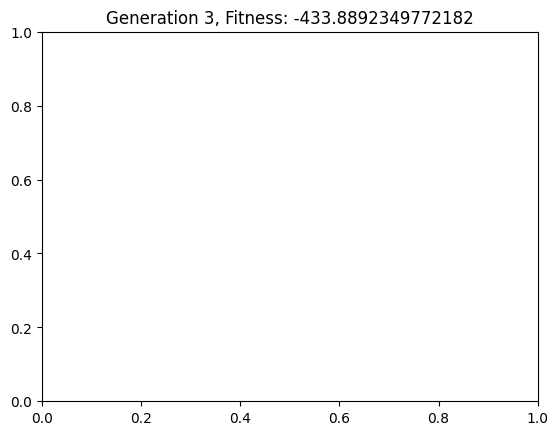

{'rooms': [{'name': 'Living Room', 'position': (188, 109), 'size': (206, 129)}, {'name': 'Bedroom1', 'position': (378, 141), 'size': (181, 97)}, {'name': 'Bedroom2', 'position': (143, 299), 'size': (182, 98)}, {'name': 'Passage', 'position': (325, 238), 'size': (118, 87)}, {'name': 'Kitchen', 'position': (377, 325), 'size': (92, 163)}, {'name': 'Washroom', 'position': (222, 259), 'size': (102, 52)}], 'fitness': -433.8892349772182}


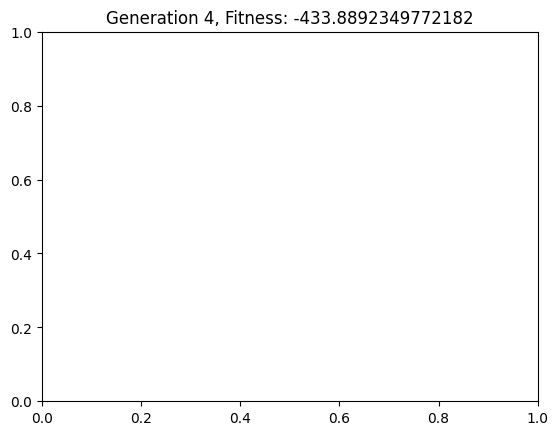

{'rooms': [{'name': 'Living Room', 'position': (188, 109), 'size': (206, 129)}, {'name': 'Bedroom1', 'position': (378, 141), 'size': (181, 97)}, {'name': 'Bedroom2', 'position': (143, 299), 'size': (182, 98)}, {'name': 'Passage', 'position': (325, 238), 'size': (118, 87)}, {'name': 'Kitchen', 'position': (377, 325), 'size': (98, 168)}, {'name': 'Washroom', 'position': (222, 259), 'size': (102, 52)}], 'fitness': -542.5493808708761}


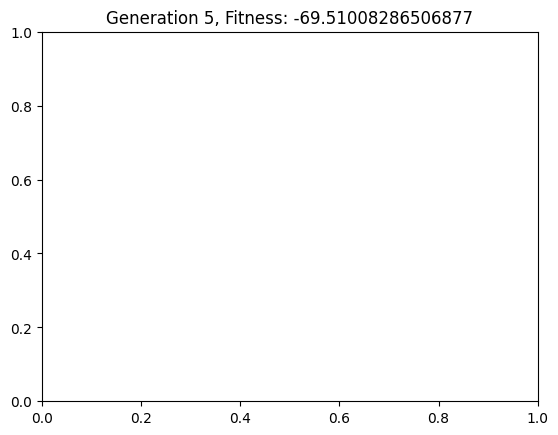

{'rooms': [{'name': 'Living Room', 'position': (139, 112), 'size': (207, 131)}, {'name': 'Passage', 'position': (347, 212), 'size': (84, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (87, 142)}, {'name': 'Washroom', 'position': (373, 358), 'size': (29, 99)}, {'name': 'Bedroom1', 'position': (411, 110), 'size': (177, 102)}, {'name': 'Bedroom2', 'position': (432, 262), 'size': (169, 96)}], 'fitness': -69.51008286506877}


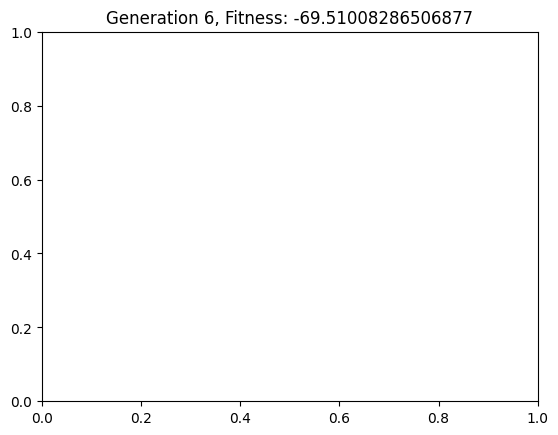

{'rooms': [{'name': 'Living Room', 'position': (139, 112), 'size': (208, 132)}, {'name': 'Passage', 'position': (347, 212), 'size': (85, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (87, 142)}, {'name': 'Washroom', 'position': (372, 358), 'size': (30, 49)}, {'name': 'Bedroom1', 'position': (411, 109), 'size': (178, 102)}, {'name': 'Bedroom2', 'position': (432, 261), 'size': (170, 96)}], 'fitness': -69.51008286506877}


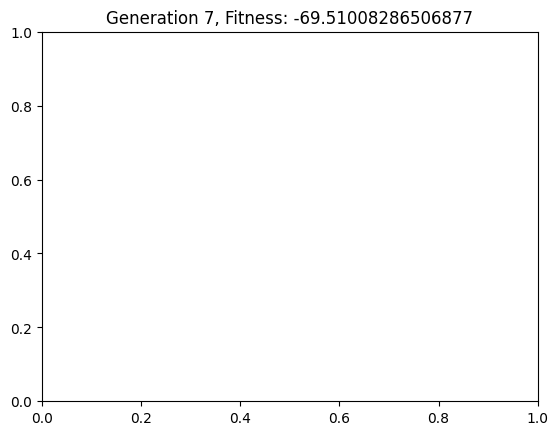

{'rooms': [{'name': 'Living Room', 'position': (137, 112), 'size': (209, 135)}, {'name': 'Passage', 'position': (346, 212), 'size': (86, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (90, 160)}, {'name': 'Washroom', 'position': (369, 358), 'size': (33, 59)}, {'name': 'Bedroom1', 'position': (411, 108), 'size': (181, 104)}, {'name': 'Bedroom2', 'position': (432, 260), 'size': (173, 98)}], 'fitness': -251.6347361503853}


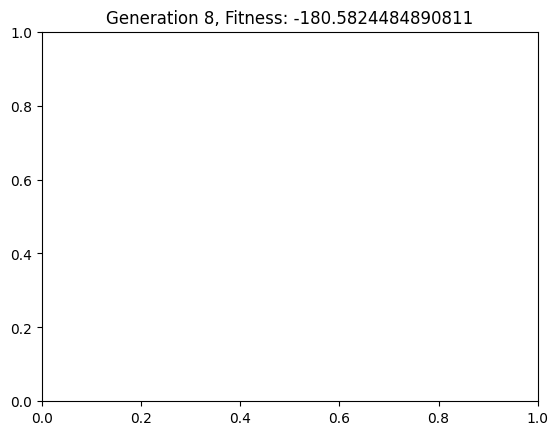

{'rooms': [{'name': 'Living Room', 'position': (133, 112), 'size': (212, 142)}, {'name': 'Bedroom1', 'position': (411, 104), 'size': (188, 107)}, {'name': 'Bedroom2', 'position': (432, 256), 'size': (180, 101)}, {'name': 'Passage', 'position': (345, 212), 'size': (86, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (95, 165)}, {'name': 'Washroom', 'position': (362, 358), 'size': (40, 78)}], 'fitness': -180.5824484890811}


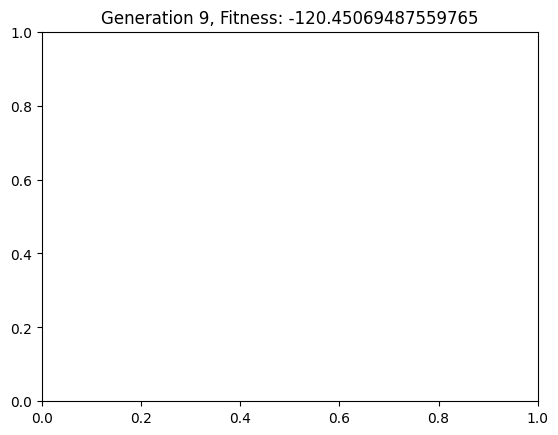

{'rooms': [{'name': 'Living Room', 'position': (127, 112), 'size': (214, 150)}, {'name': 'Bedroom1', 'position': (411, 100), 'size': (196, 111)}, {'name': 'Bedroom2', 'position': (432, 252), 'size': (188, 105)}, {'name': 'Passage', 'position': (342, 212), 'size': (90, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (101, 175)}, {'name': 'Washroom', 'position': (354, 358), 'size': (48, 93)}], 'fitness': -120.45069487559765}


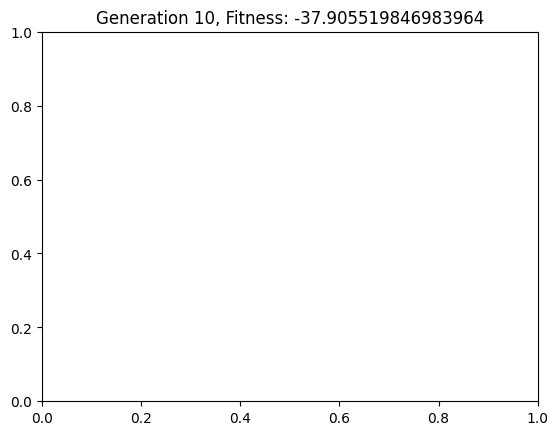

{'rooms': [{'name': 'Living Room', 'position': (122, 112), 'size': (217, 158)}, {'name': 'Bedroom1', 'position': (411, 96), 'size': (204, 115)}, {'name': 'Bedroom2', 'position': (432, 248), 'size': (196, 109)}, {'name': 'Passage', 'position': (339, 212), 'size': (92, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (105, 193)}, {'name': 'Washroom', 'position': (346, 358), 'size': (56, 105)}], 'fitness': -37.905519846983964}


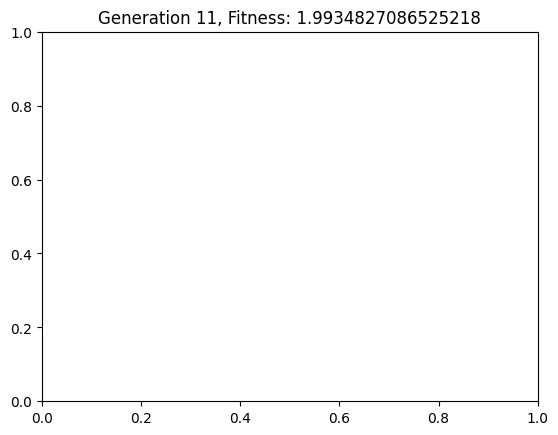

{'rooms': [{'name': 'Living Room', 'position': (122, 112), 'size': (217, 158)}, {'name': 'Bedroom1', 'position': (411, 96), 'size': (204, 115)}, {'name': 'Bedroom2', 'position': (432, 248), 'size': (196, 109)}, {'name': 'Passage', 'position': (339, 212), 'size': (92, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (95, 176)}, {'name': 'Washroom', 'position': (346, 358), 'size': (56, 105)}], 'fitness': 1.9934827086525218}


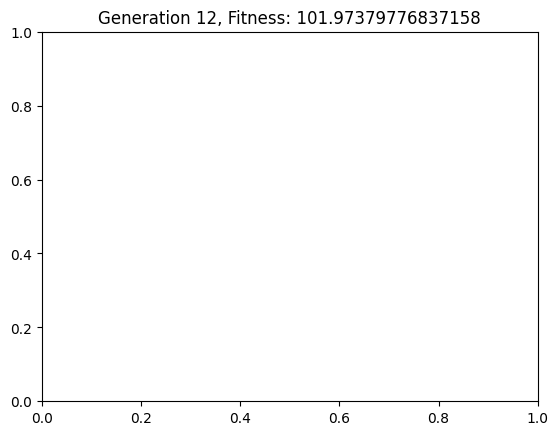

{'rooms': [{'name': 'Living Room', 'position': (112, 112), 'size': (222, 173)}, {'name': 'Bedroom1', 'position': (411, 89), 'size': (219, 123)}, {'name': 'Bedroom2', 'position': (432, 241), 'size': (211, 117)}, {'name': 'Passage', 'position': (334, 212), 'size': (97, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (106, 174)}, {'name': 'Washroom', 'position': (331, 358), 'size': (71, 115)}], 'fitness': 101.97379776837158}


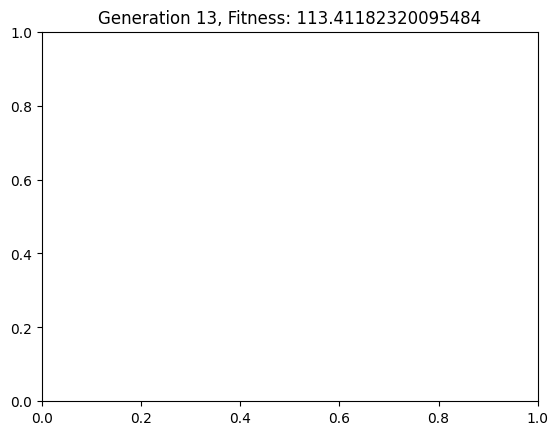

{'rooms': [{'name': 'Living Room', 'position': (107, 112), 'size': (225, 181)}, {'name': 'Bedroom1', 'position': (411, 85), 'size': (226, 126)}, {'name': 'Bedroom2', 'position': (432, 237), 'size': (218, 120)}, {'name': 'Passage', 'position': (332, 212), 'size': (100, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (111, 186)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 151)}], 'fitness': 113.41182320095484}


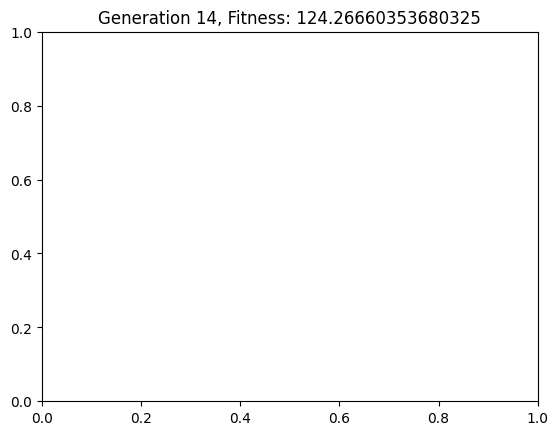

{'rooms': [{'name': 'Living Room', 'position': (101, 112), 'size': (227, 189)}, {'name': 'Bedroom1', 'position': (411, 94), 'size': (208, 117)}, {'name': 'Bedroom2', 'position': (432, 246), 'size': (200, 111)}, {'name': 'Passage', 'position': (329, 212), 'size': (103, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (116, 193)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 137)}], 'fitness': 124.26660353680325}


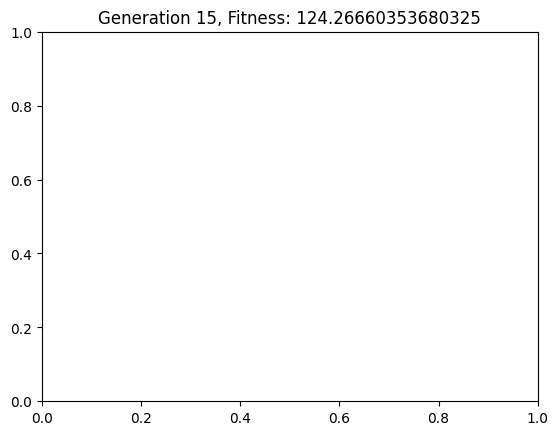

{'rooms': [{'name': 'Living Room', 'position': (96, 112), 'size': (230, 197)}, {'name': 'Bedroom1', 'position': (411, 92), 'size': (213, 120)}, {'name': 'Bedroom2', 'position': (432, 244), 'size': (205, 114)}, {'name': 'Passage', 'position': (326, 212), 'size': (105, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (119, 195)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 127)}], 'fitness': 22.48818237430939}


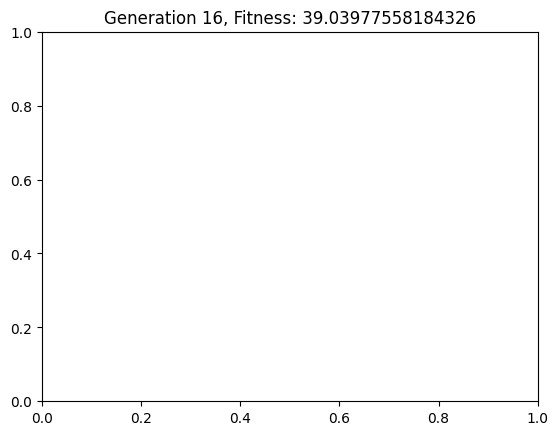

{'rooms': [{'name': 'Living Room', 'position': (96, 112), 'size': (230, 197)}, {'name': 'Bedroom1', 'position': (411, 92), 'size': (213, 120)}, {'name': 'Bedroom2', 'position': (432, 244), 'size': (205, 114)}, {'name': 'Passage', 'position': (326, 212), 'size': (105, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (119, 195)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 127)}], 'fitness': 39.03977558184326}


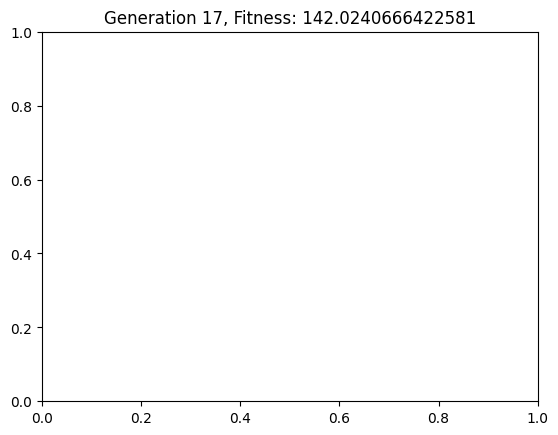

{'rooms': [{'name': 'Living Room', 'position': (85, 112), 'size': (235, 213)}, {'name': 'Bedroom1', 'position': (411, 84), 'size': (229, 128)}, {'name': 'Bedroom2', 'position': (432, 236), 'size': (221, 122)}, {'name': 'Passage', 'position': (321, 212), 'size': (111, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (122, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 132)}], 'fitness': 142.0240666422581}


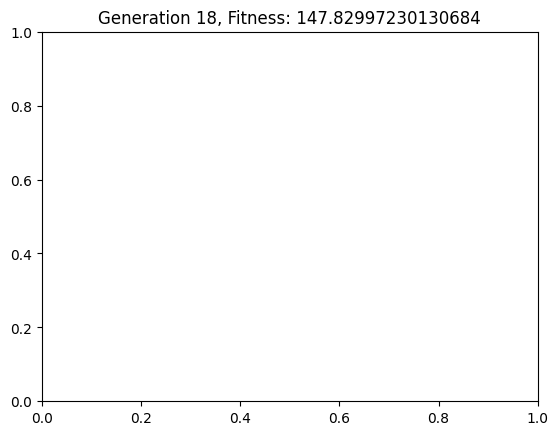

{'rooms': [{'name': 'Living Room', 'position': (80, 112), 'size': (238, 221)}, {'name': 'Bedroom1', 'position': (411, 80), 'size': (237, 132)}, {'name': 'Bedroom2', 'position': (432, 232), 'size': (229, 126)}, {'name': 'Passage', 'position': (318, 212), 'size': (113, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (123, 200)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 127)}], 'fitness': 147.82997230130684}


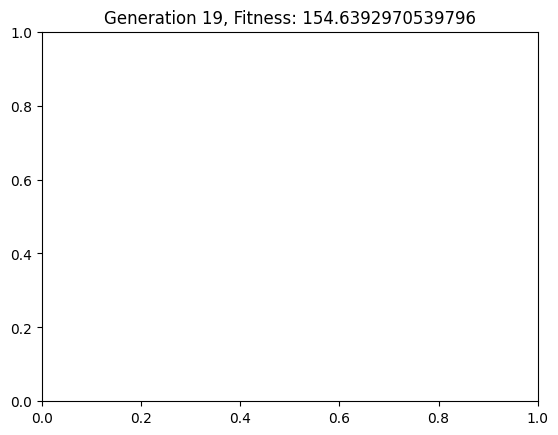

{'rooms': [{'name': 'Living Room', 'position': (75, 112), 'size': (241, 229)}, {'name': 'Bedroom1', 'position': (411, 76), 'size': (245, 136)}, {'name': 'Bedroom2', 'position': (432, 228), 'size': (237, 130)}, {'name': 'Passage', 'position': (316, 212), 'size': (116, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (125, 202)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 138)}], 'fitness': 154.6392970539796}


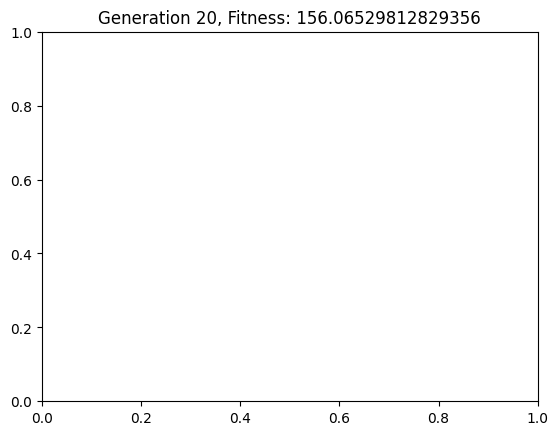

{'rooms': [{'name': 'Living Room', 'position': (70, 112), 'size': (244, 237)}, {'name': 'Bedroom1', 'position': (411, 72), 'size': (253, 140)}, {'name': 'Bedroom2', 'position': (432, 224), 'size': (245, 134)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (125, 202)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 139)}], 'fitness': 156.06529812829356}


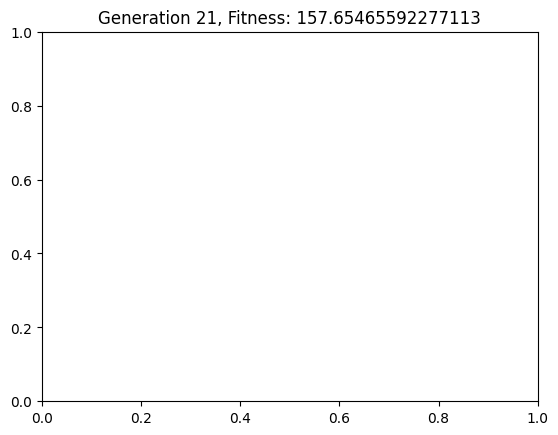

{'rooms': [{'name': 'Living Room', 'position': (66, 112), 'size': (248, 245)}, {'name': 'Bedroom1', 'position': (411, 68), 'size': (261, 144)}, {'name': 'Bedroom2', 'position': (432, 220), 'size': (253, 138)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (125, 202)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 155)}], 'fitness': 157.65465592277113}


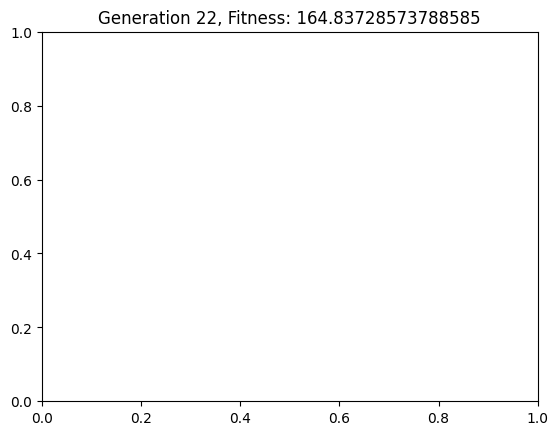

{'rooms': [{'name': 'Living Room', 'position': (62, 112), 'size': (252, 253)}, {'name': 'Bedroom1', 'position': (411, 64), 'size': (269, 148)}, {'name': 'Bedroom2', 'position': (432, 216), 'size': (261, 142)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 127)}], 'fitness': 164.83728573788585}


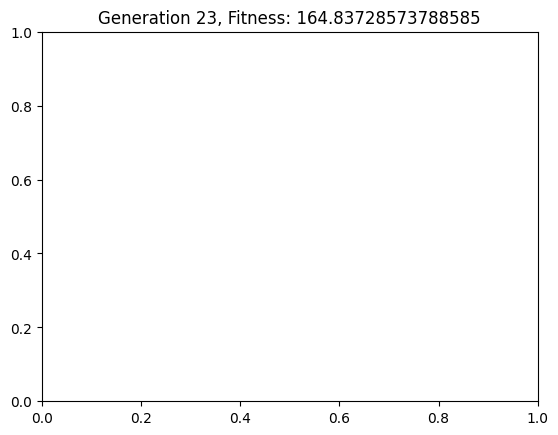

{'rooms': [{'name': 'Living Room', 'position': (58, 112), 'size': (256, 261)}, {'name': 'Bedroom1', 'position': (411, 60), 'size': (277, 152)}, {'name': 'Bedroom2', 'position': (432, 212), 'size': (269, 146)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 144)}], 'fitness': -75.22731169033806}


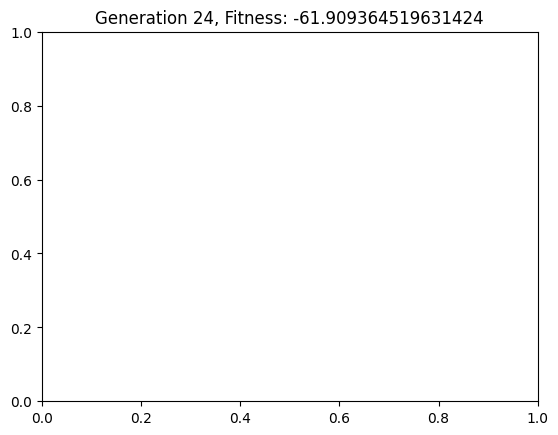

{'rooms': [{'name': 'Living Room', 'position': (54, 112), 'size': (260, 269)}, {'name': 'Bedroom1', 'position': (411, 59), 'size': (285, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (277, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 144)}], 'fitness': -61.909364519631424}


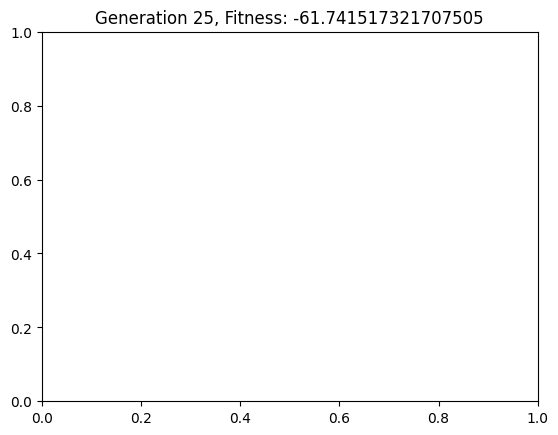

{'rooms': [{'name': 'Living Room', 'position': (50, 112), 'size': (264, 277)}, {'name': 'Bedroom1', 'position': (411, 59), 'size': (293, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (285, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 136)}], 'fitness': -61.741517321707505}


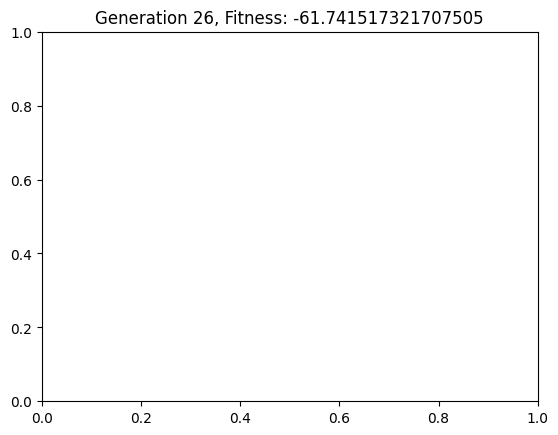

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 285)}, {'name': 'Bedroom1', 'position': (411, 59), 'size': (301, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (293, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 132)}], 'fitness': -90.68613666255499}


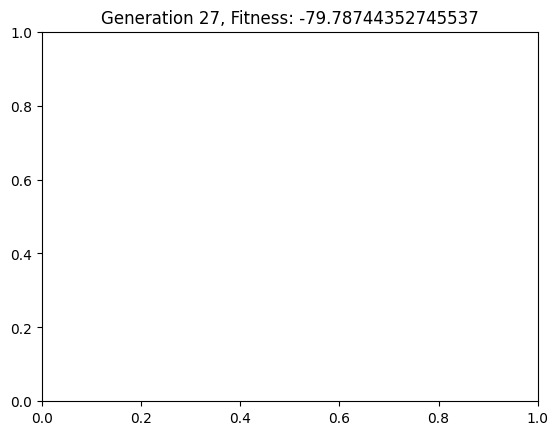

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 293)}, {'name': 'Bedroom1', 'position': (411, 59), 'size': (309, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (301, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 137)}], 'fitness': -79.78744352745537}


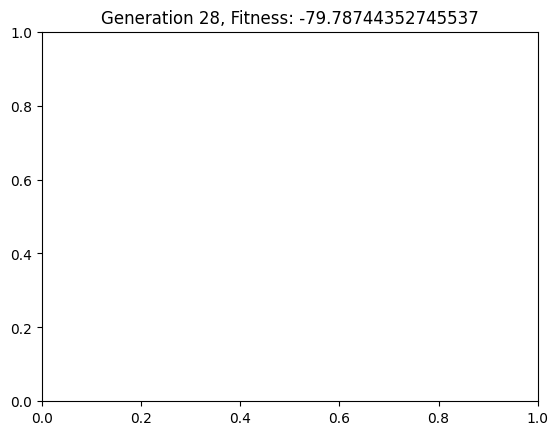

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 301)}, {'name': 'Bedroom1', 'position': (411, 59), 'size': (317, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (309, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 132)}], 'fitness': -100.23127005039808}


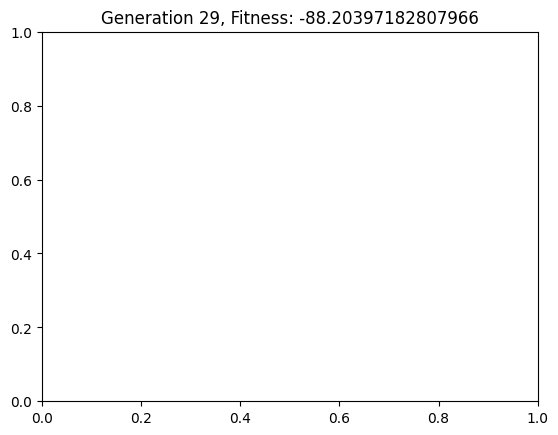

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 309)}, {'name': 'Bedroom1', 'position': (411, 59), 'size': (325, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 132)}], 'fitness': -88.20397182807966}


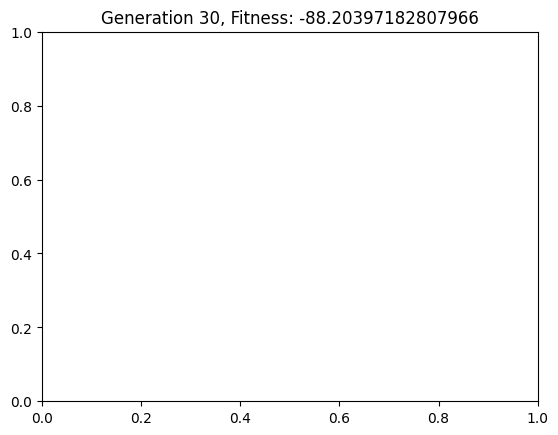

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 317)}, {'name': 'Bedroom1', 'position': (411, 59), 'size': (333, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 136)}], 'fitness': -115.32885128417185}


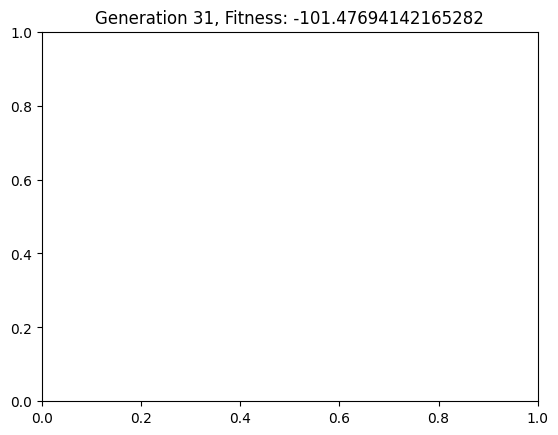

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 325)}, {'name': 'Bedroom1', 'position': (408, 59), 'size': (338, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 143)}], 'fitness': -101.47694142165282}


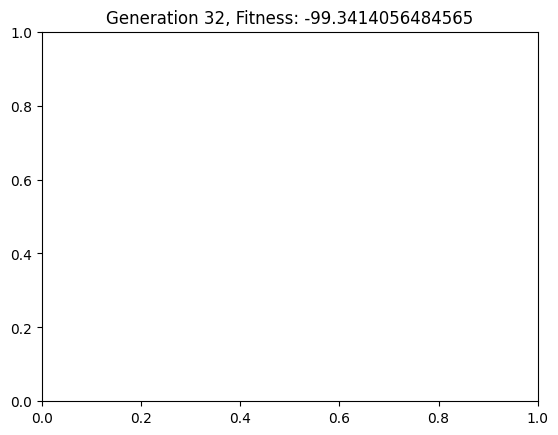

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 333)}, {'name': 'Bedroom1', 'position': (404, 59), 'size': (342, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 125)}], 'fitness': -99.3414056484565}


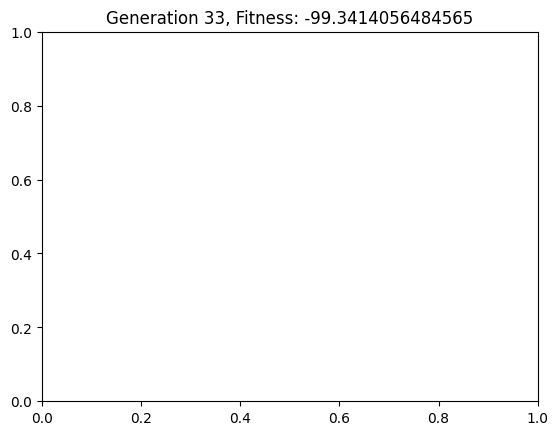

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 341)}, {'name': 'Bedroom1', 'position': (400, 59), 'size': (346, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 137)}], 'fitness': -138.44605521280704}


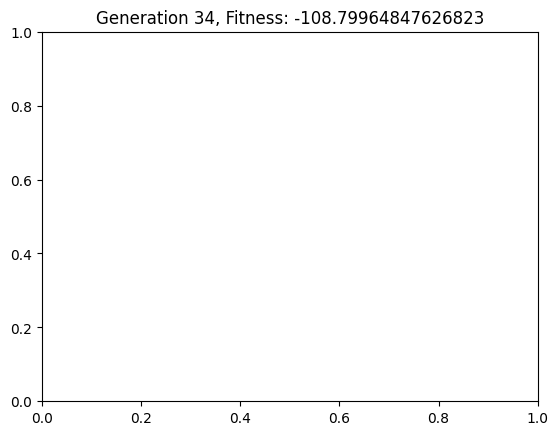

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 349)}, {'name': 'Bedroom1', 'position': (396, 59), 'size': (350, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 144)}], 'fitness': -108.79964847626823}


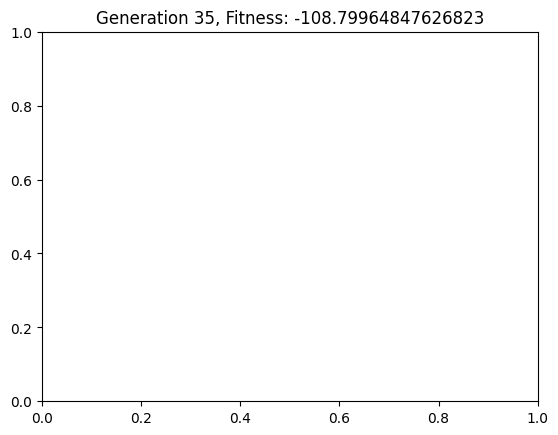

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 357)}, {'name': 'Bedroom1', 'position': (392, 59), 'size': (354, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 132)}], 'fitness': -120.86892383867908}


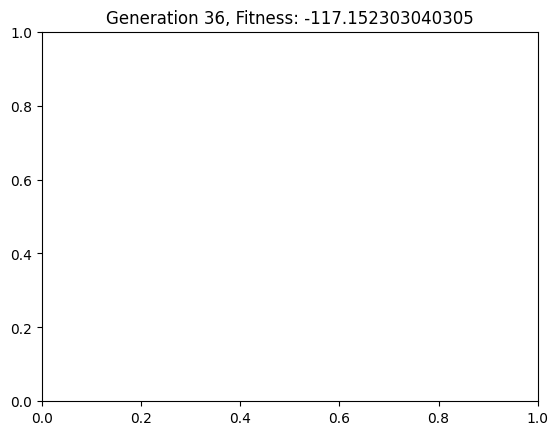

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 365)}, {'name': 'Bedroom1', 'position': (388, 59), 'size': (358, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 130)}], 'fitness': -117.152303040305}


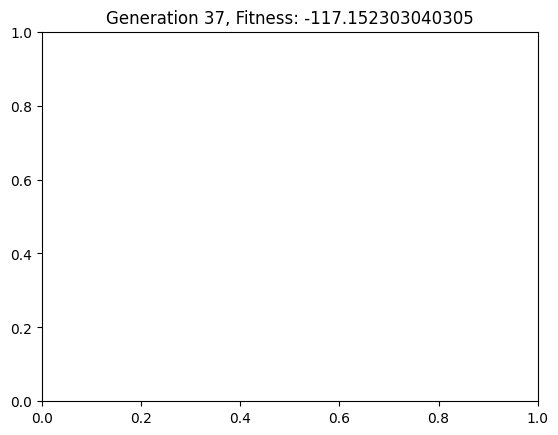

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 373)}, {'name': 'Bedroom1', 'position': (384, 59), 'size': (362, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 155)}], 'fitness': -146.1730937608184}


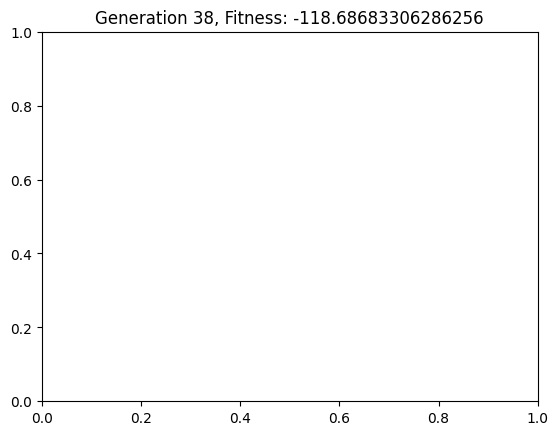

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 381)}, {'name': 'Bedroom1', 'position': (380, 59), 'size': (366, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 148)}], 'fitness': -118.68683306286256}


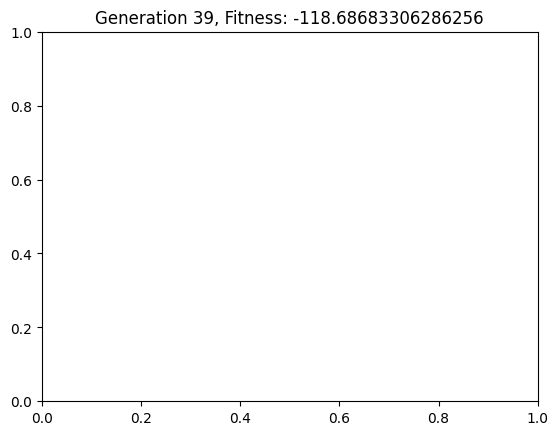

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 389)}, {'name': 'Bedroom1', 'position': (376, 59), 'size': (370, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 131)}], 'fitness': -253.56056163867578}


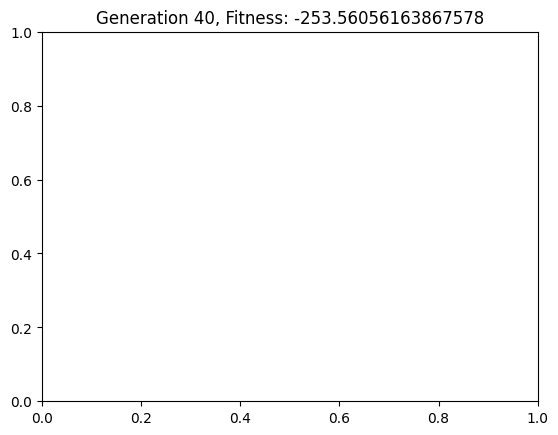

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 397)}, {'name': 'Bedroom1', 'position': (372, 59), 'size': (374, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 145)}], 'fitness': -283.25088404804416}


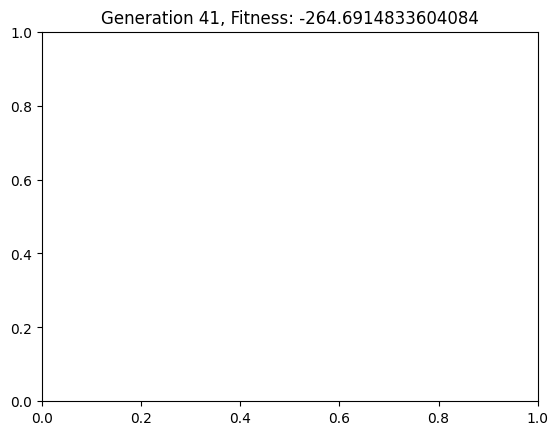

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 405)}, {'name': 'Bedroom1', 'position': (368, 59), 'size': (378, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 129)}], 'fitness': -264.6914833604084}


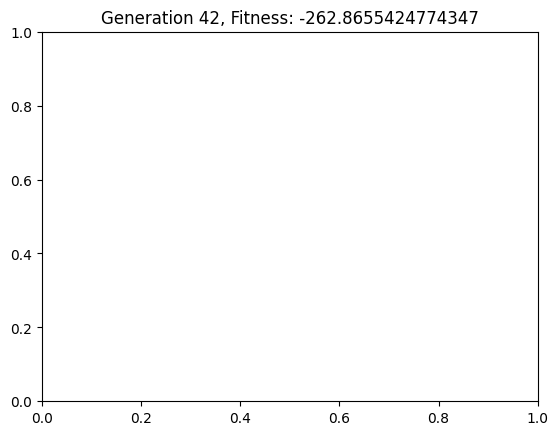

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 413)}, {'name': 'Bedroom1', 'position': (364, 59), 'size': (382, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 131)}], 'fitness': -262.8655424774347}


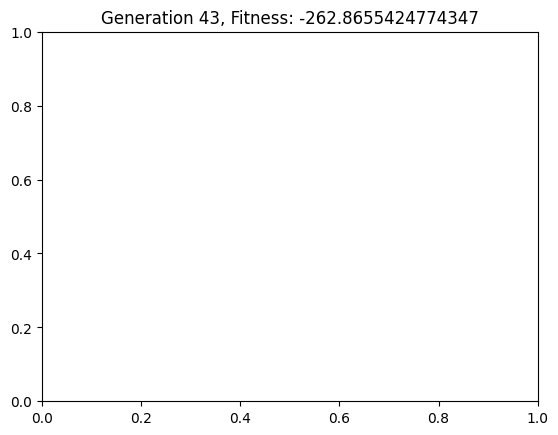

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 421)}, {'name': 'Bedroom1', 'position': (360, 59), 'size': (386, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 134)}], 'fitness': -303.1467392438626}


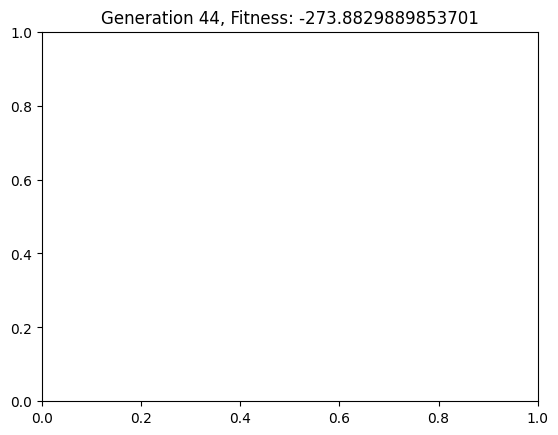

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 429)}, {'name': 'Bedroom1', 'position': (356, 59), 'size': (390, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 132)}], 'fitness': -273.8829889853701}


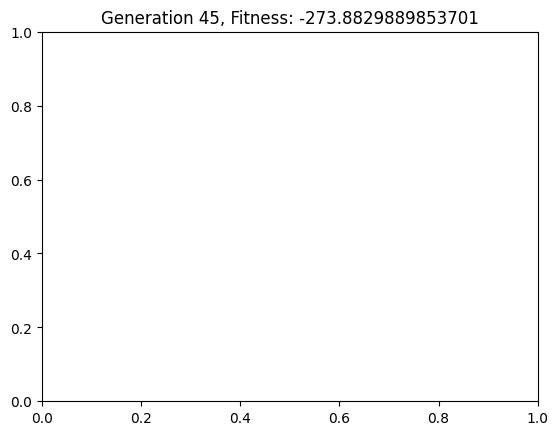

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 437)}, {'name': 'Bedroom1', 'position': (353, 59), 'size': (394, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 127)}], 'fitness': -314.6962595322958}


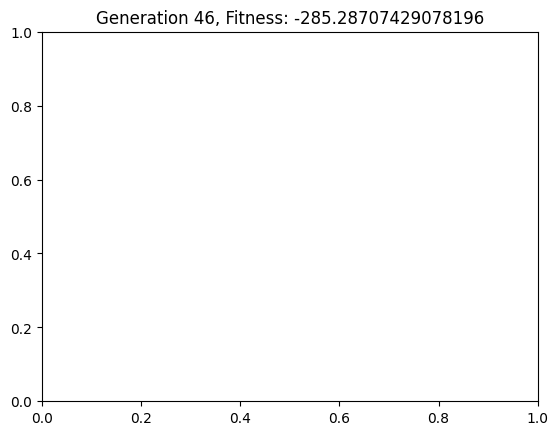

{'rooms': [{'name': 'Living Room', 'position': (48, 112), 'size': (266, 445)}, {'name': 'Bedroom1', 'position': (353, 59), 'size': (394, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 148)}], 'fitness': -285.28707429078196}


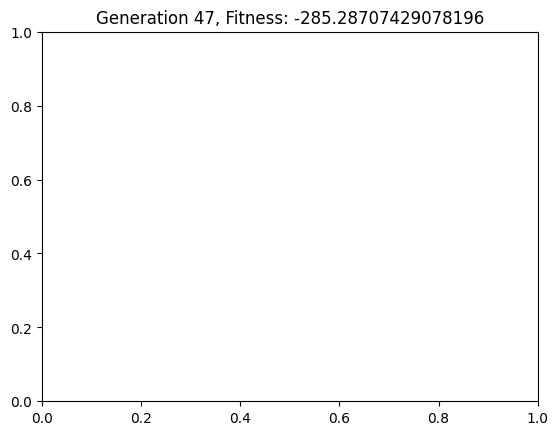

{'rooms': [{'name': 'Living Room', 'position': (48, 109), 'size': (266, 450)}, {'name': 'Bedroom1', 'position': (353, 59), 'size': (394, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 155)}], 'fitness': -306.3148922216309}


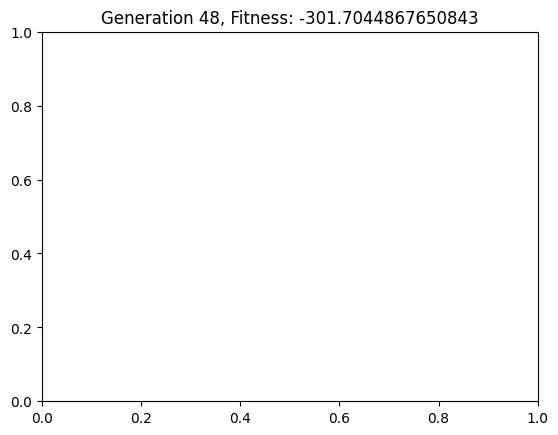

{'rooms': [{'name': 'Living Room', 'position': (48, 105), 'size': (266, 454)}, {'name': 'Bedroom1', 'position': (353, 59), 'size': (394, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 150)}], 'fitness': -301.7044867650843}


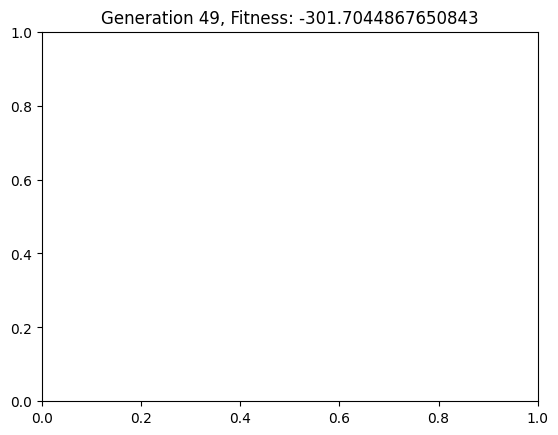

{'rooms': [{'name': 'Living Room', 'position': (48, 101), 'size': (266, 458)}, {'name': 'Bedroom1', 'position': (353, 59), 'size': (394, 152)}, {'name': 'Bedroom2', 'position': (432, 211), 'size': (315, 147)}, {'name': 'Passage', 'position': (314, 212), 'size': (118, 145)}, {'name': 'Kitchen', 'position': (402, 358), 'size': (126, 201)}, {'name': 'Washroom', 'position': (324, 358), 'size': (78, 155)}], 'fitness': -315.2216454586445}
Elapsed time: 941.33 seconds


<Figure size 640x480 with 0 Axes>

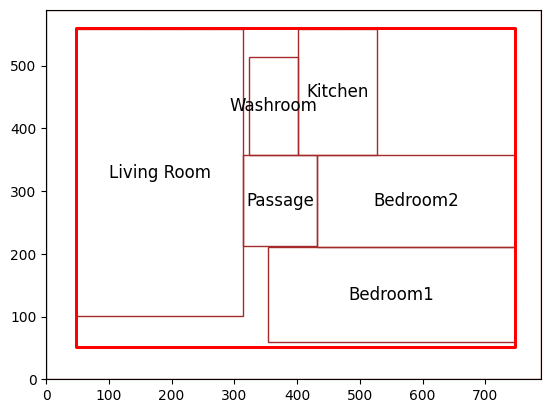

Elapsed time for initial population generation: 29.75 seconds


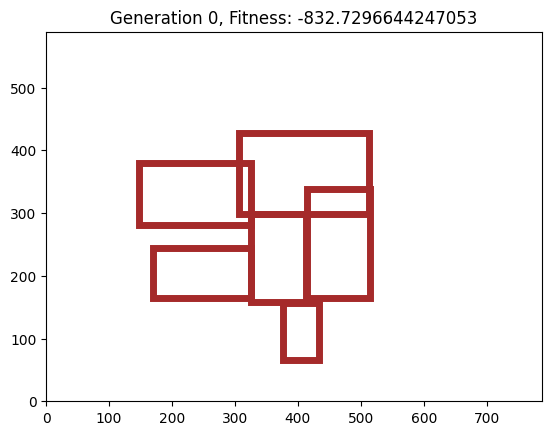

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (206, 129)}, {'name': 'Passage', 'position': (326, 158), 'size': (87, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 65), 'size': (57, 92)}, {'name': 'Bedroom1', 'position': (147, 281), 'size': (178, 99)}, {'name': 'Bedroom2', 'position': (414, 165), 'size': (101, 173)}], 'fitness': -832.7296644247053}


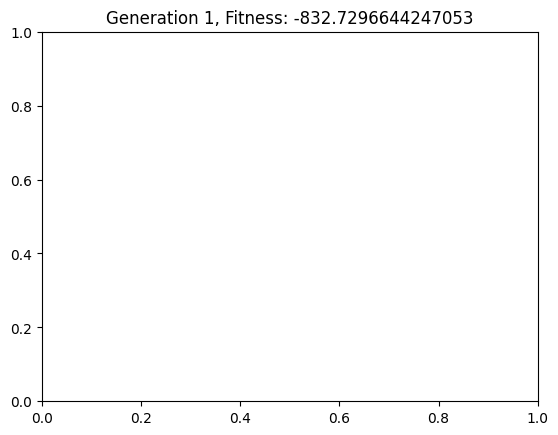

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (206, 129)}, {'name': 'Passage', 'position': (325, 158), 'size': (88, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (58, 105)}, {'name': 'Bedroom1', 'position': (147, 281), 'size': (178, 99)}, {'name': 'Bedroom2', 'position': (414, 165), 'size': (101, 173)}], 'fitness': -832.7296644247053}


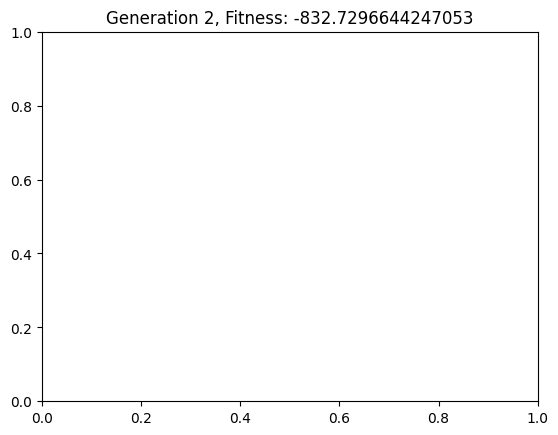

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (206, 129)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 61), 'size': (60, 96)}, {'name': 'Bedroom1', 'position': (147, 281), 'size': (178, 99)}, {'name': 'Bedroom2', 'position': (414, 165), 'size': (101, 173)}], 'fitness': -940.8874523900099}


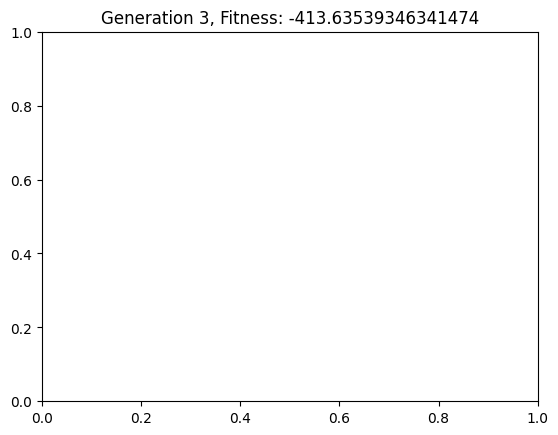

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (206, 129)}, {'name': 'Bedroom1', 'position': (147, 281), 'size': (178, 18)}, {'name': 'Bedroom2', 'position': (414, 165), 'size': (101, 134)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 61), 'size': (60, 96)}], 'fitness': -413.63539346341474}


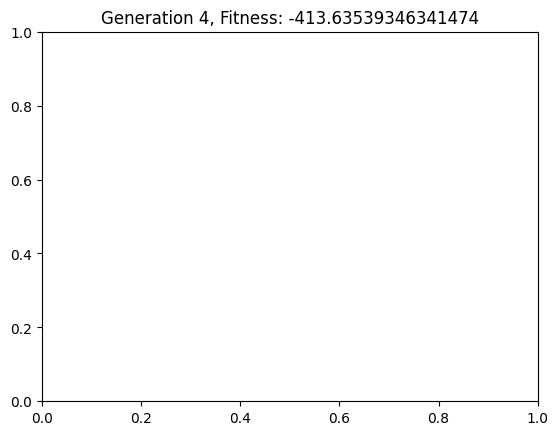

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (206, 129)}, {'name': 'Bedroom1', 'position': (146, 280), 'size': (178, 18)}, {'name': 'Bedroom2', 'position': (414, 164), 'size': (102, 134)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 56), 'size': (61, 101)}], 'fitness': -413.63539346341474}


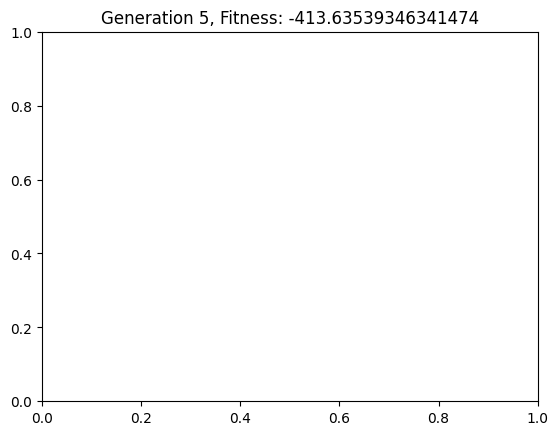

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (208, 131)}, {'name': 'Bedroom1', 'position': (145, 279), 'size': (180, 20)}, {'name': 'Bedroom2', 'position': (414, 163), 'size': (105, 136)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 56), 'size': (61, 101)}], 'fitness': -419.6410101111451}


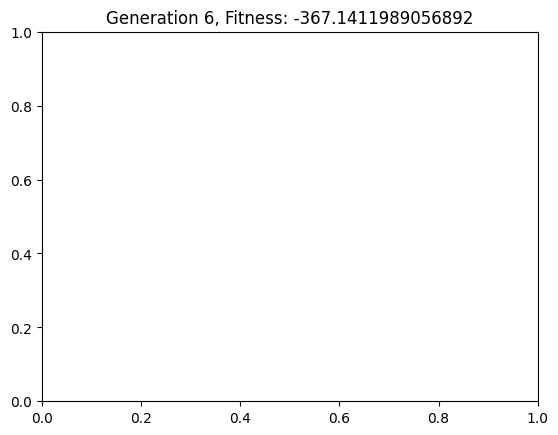

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (209, 132)}, {'name': 'Bedroom1', 'position': (141, 275), 'size': (183, 23)}, {'name': 'Bedroom2', 'position': (414, 159), 'size': (112, 139)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (62, 105)}], 'fitness': -367.1411989056892}


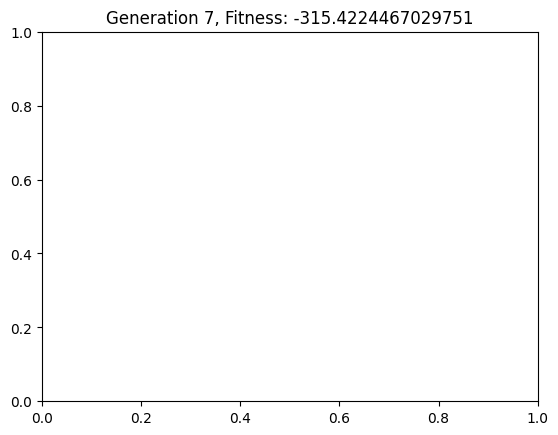

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (218, 141)}, {'name': 'Bedroom1', 'position': (137, 271), 'size': (187, 27)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (119, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 58), 'size': (63, 100)}], 'fitness': -315.4224467029751}


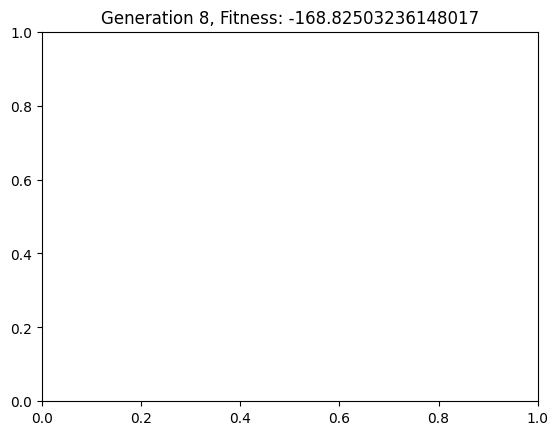

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (218, 141)}, {'name': 'Bedroom1', 'position': (133, 267), 'size': (191, 31)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (125, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 58), 'size': (63, 100)}], 'fitness': -168.82503236148017}


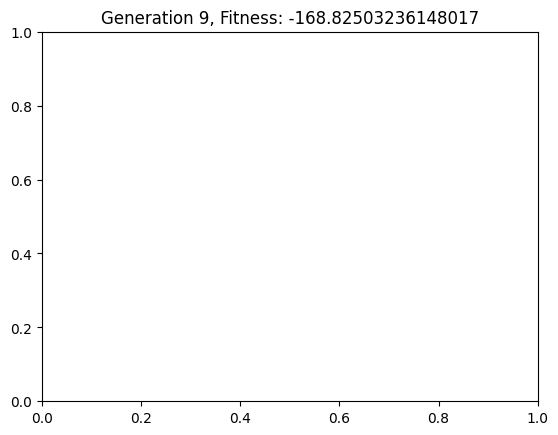

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (219, 142)}, {'name': 'Bedroom1', 'position': (129, 263), 'size': (195, 35)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (132, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 58), 'size': (63, 100)}], 'fitness': -221.10571168671945}


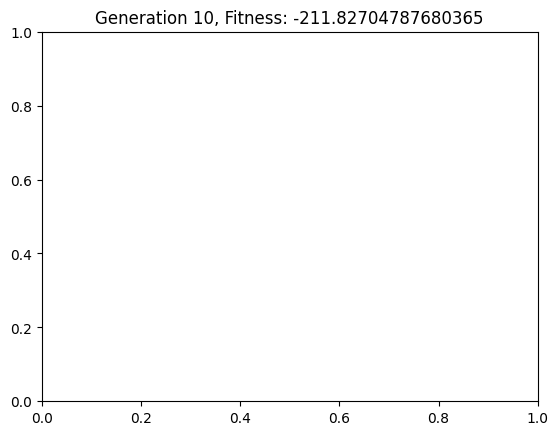

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (221, 144)}, {'name': 'Bedroom1', 'position': (125, 259), 'size': (199, 39)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (138, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 53), 'size': (65, 104)}], 'fitness': -211.82704787680365}


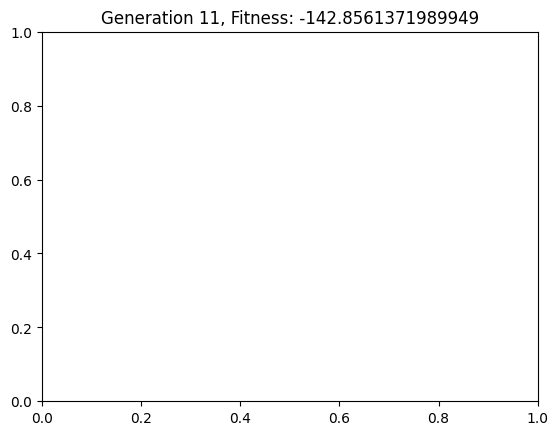

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (221, 144)}, {'name': 'Bedroom1', 'position': (125, 259), 'size': (199, 39)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (138, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 58), 'size': (63, 99)}], 'fitness': -142.8561371989949}


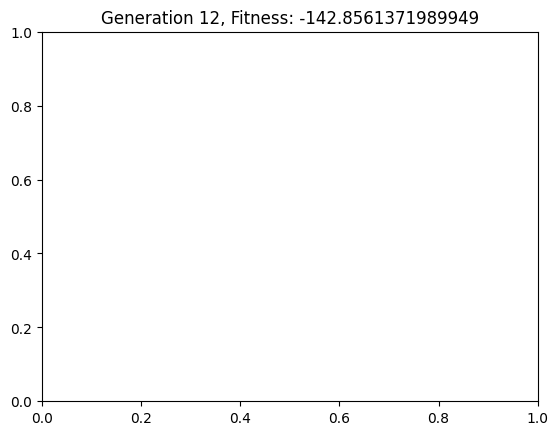

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (222, 145)}, {'name': 'Bedroom1', 'position': (125, 259), 'size': (200, 40)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (139, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 58), 'size': (63, 99)}], 'fitness': -142.8561371989949}


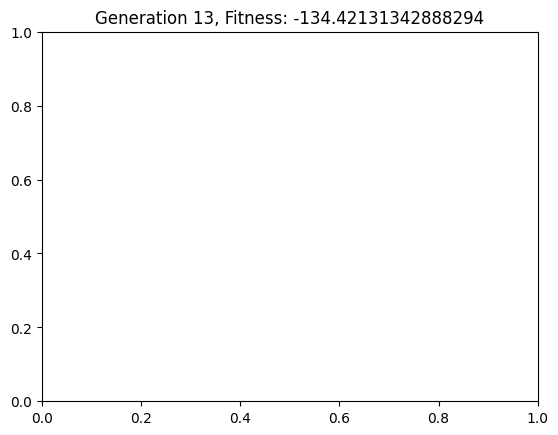

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (238, 161)}, {'name': 'Bedroom1', 'position': (115, 249), 'size': (209, 49)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (148, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 53), 'size': (65, 104)}], 'fitness': -134.42131342888294}


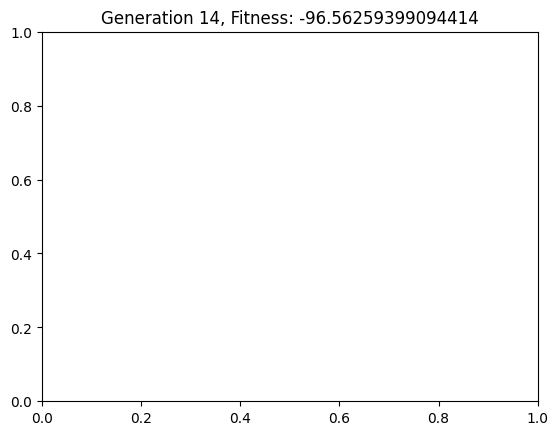

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (225, 148)}, {'name': 'Bedroom1', 'position': (115, 249), 'size': (209, 49)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (148, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 53), 'size': (65, 104)}], 'fitness': -96.56259399094414}


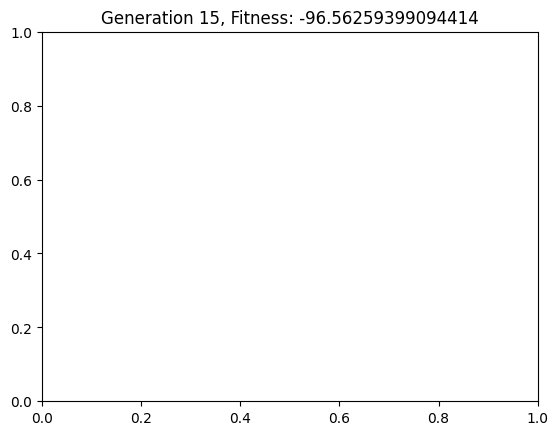

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (226, 149)}, {'name': 'Bedroom1', 'position': (115, 249), 'size': (210, 50)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (149, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 53), 'size': (65, 104)}], 'fitness': -96.56259399094414}


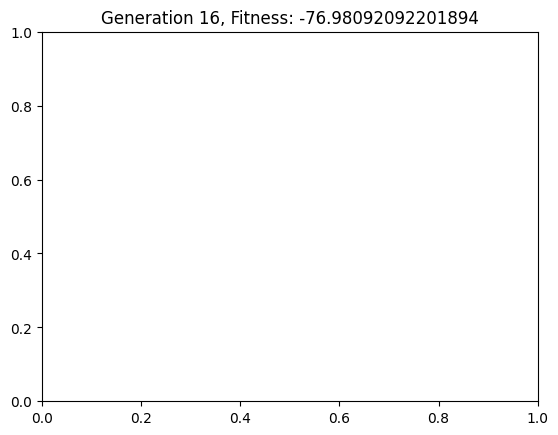

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (226, 149)}, {'name': 'Bedroom1', 'position': (111, 245), 'size': (214, 54)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (157, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -76.98092092201894}


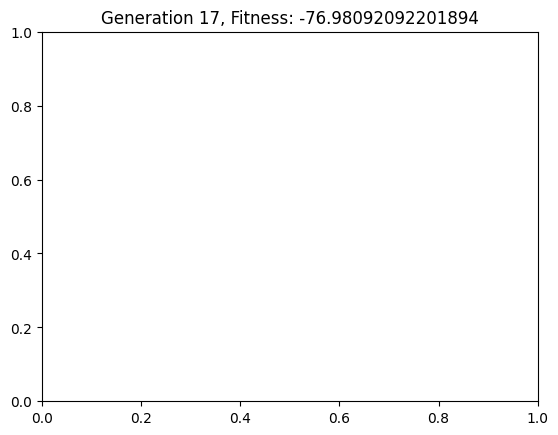

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (227, 150)}, {'name': 'Bedroom1', 'position': (110, 244), 'size': (214, 54)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (158, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -76.98092092201894}


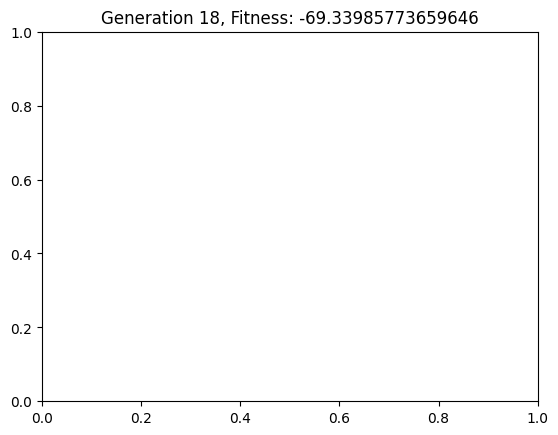

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (227, 150)}, {'name': 'Bedroom1', 'position': (106, 244), 'size': (218, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (166, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 53), 'size': (65, 104)}], 'fitness': -69.33985773659646}


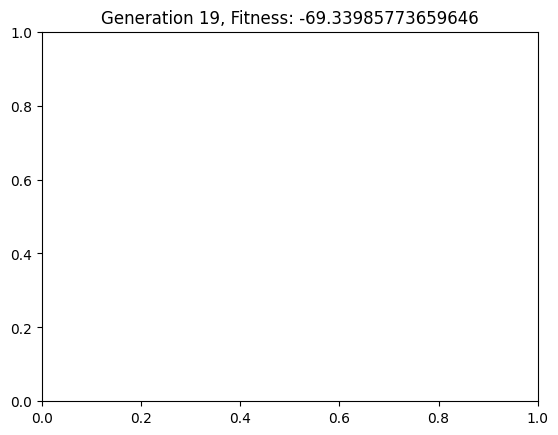

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (228, 151)}, {'name': 'Bedroom1', 'position': (106, 244), 'size': (219, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (167, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 53), 'size': (65, 104)}], 'fitness': -69.33985773659646}


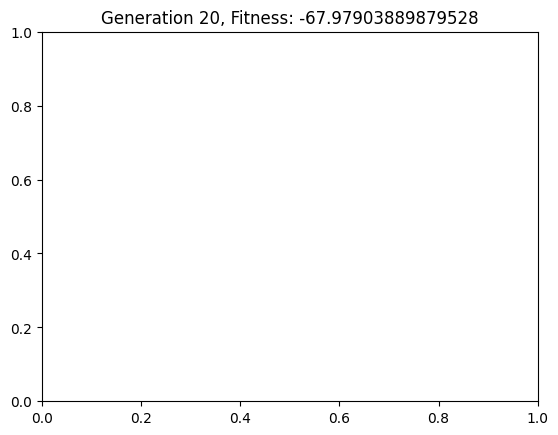

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (228, 151)}, {'name': 'Bedroom1', 'position': (101, 244), 'size': (223, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (176, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 53), 'size': (65, 104)}], 'fitness': -67.97903889879528}


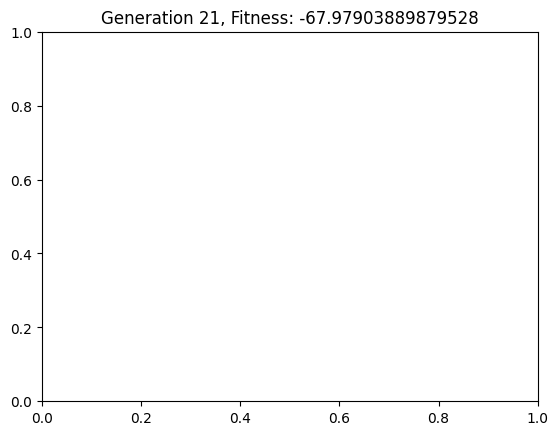

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (229, 152)}, {'name': 'Bedroom1', 'position': (101, 244), 'size': (224, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (177, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 53), 'size': (65, 104)}], 'fitness': -67.97903889879528}


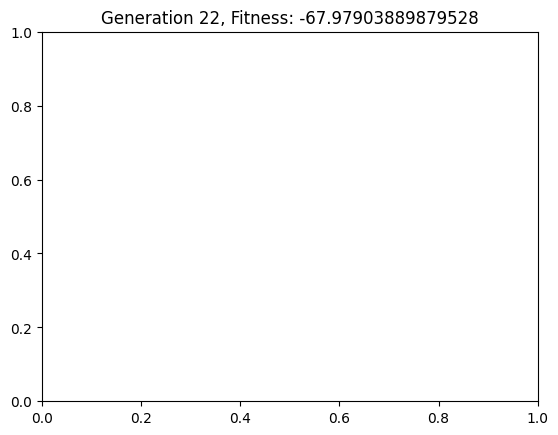

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (232, 155)}, {'name': 'Bedroom1', 'position': (99, 244), 'size': (225, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (180, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 53), 'size': (65, 104)}], 'fitness': -69.96765152933179}


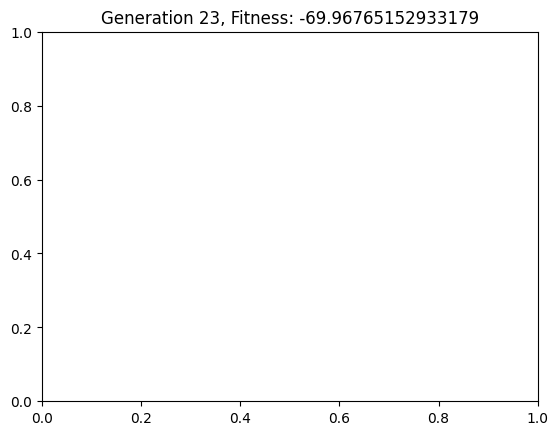

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (239, 162)}, {'name': 'Bedroom1', 'position': (96, 244), 'size': (229, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (187, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 53), 'size': (65, 104)}], 'fitness': -184.41455280864454}


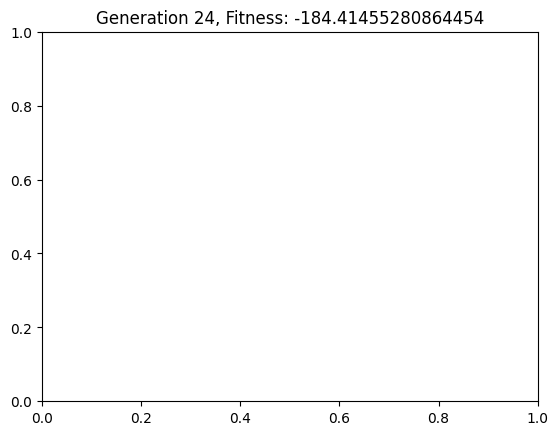

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (247, 170)}, {'name': 'Bedroom1', 'position': (92, 244), 'size': (233, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (195, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 53), 'size': (65, 104)}], 'fitness': -217.47818685170807}


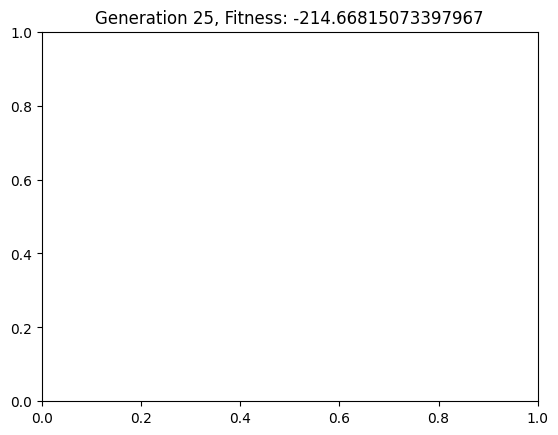

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (255, 178)}, {'name': 'Bedroom1', 'position': (88, 244), 'size': (237, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (203, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -214.66815073397967}


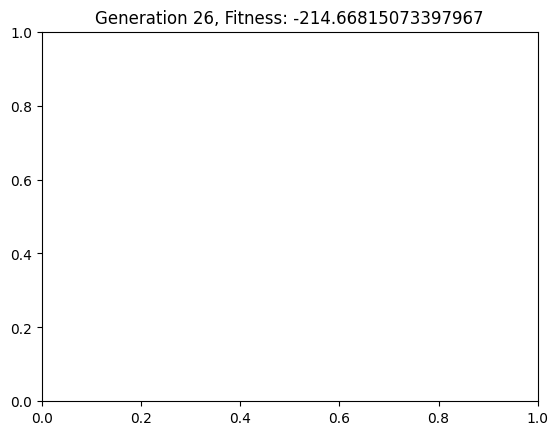

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (263, 186)}, {'name': 'Bedroom1', 'position': (84, 244), 'size': (241, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (211, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -293.2201045836445}


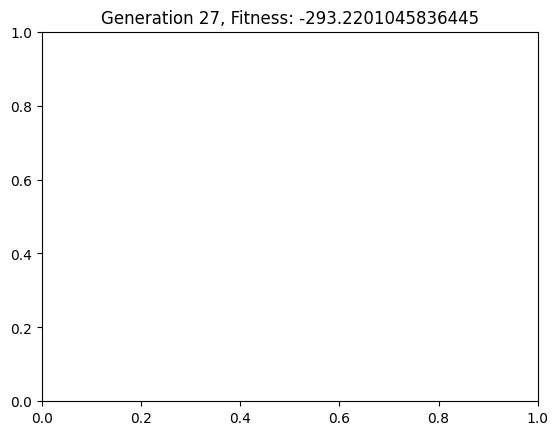

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (271, 194)}, {'name': 'Bedroom1', 'position': (80, 244), 'size': (245, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (219, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -333.7690154076269}


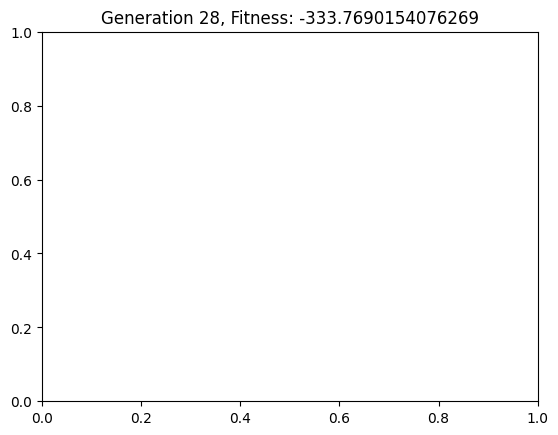

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (279, 202)}, {'name': 'Bedroom1', 'position': (76, 244), 'size': (249, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (227, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -376.47491817440323}


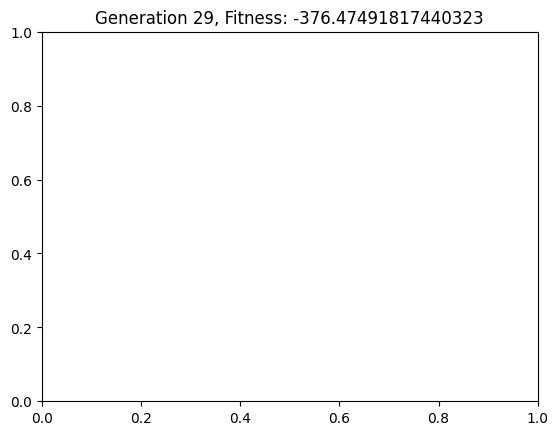

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (287, 210)}, {'name': 'Bedroom1', 'position': (72, 244), 'size': (253, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (235, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -419.32031666492645}


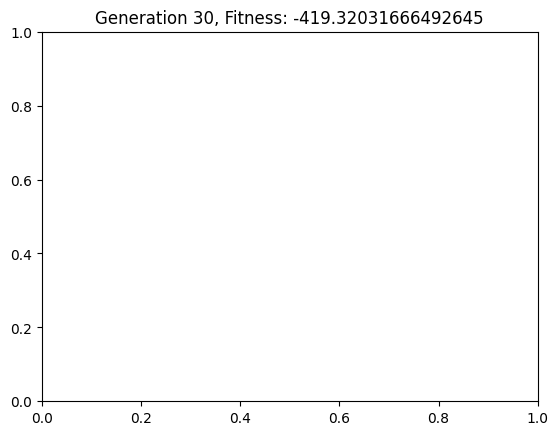

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (295, 218)}, {'name': 'Bedroom1', 'position': (68, 244), 'size': (257, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (243, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -464.28876668129107}


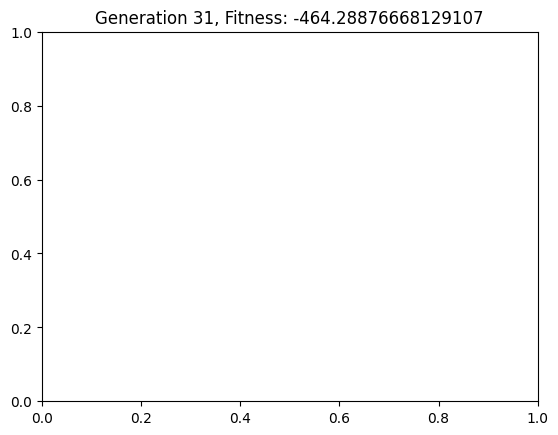

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (303, 226)}, {'name': 'Bedroom1', 'position': (64, 244), 'size': (261, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (251, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -509.36487991683725}


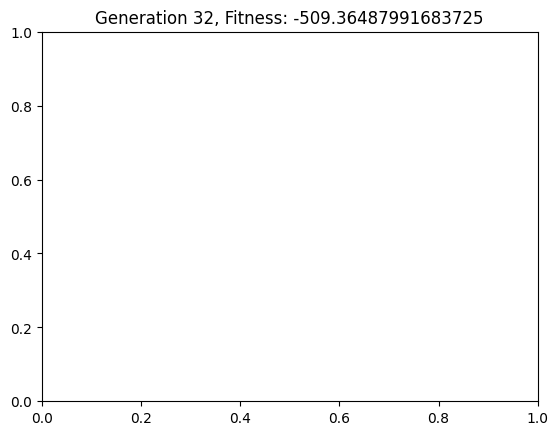

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (311, 234)}, {'name': 'Bedroom1', 'position': (60, 244), 'size': (265, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (259, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -555.5342995467561}


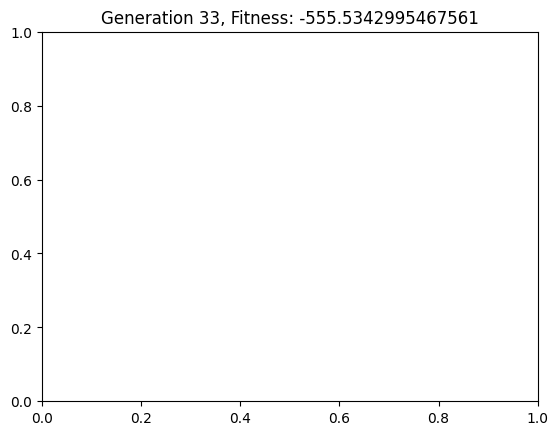

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (319, 242)}, {'name': 'Bedroom1', 'position': (56, 244), 'size': (269, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (267, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -603.7836581967142}


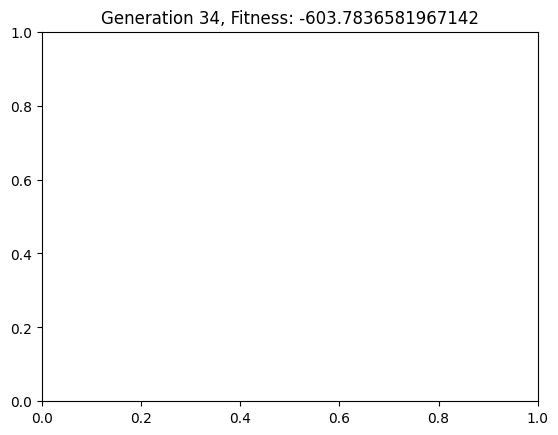

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (327, 250)}, {'name': 'Bedroom1', 'position': (52, 244), 'size': (273, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (275, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -652.1005256158197}


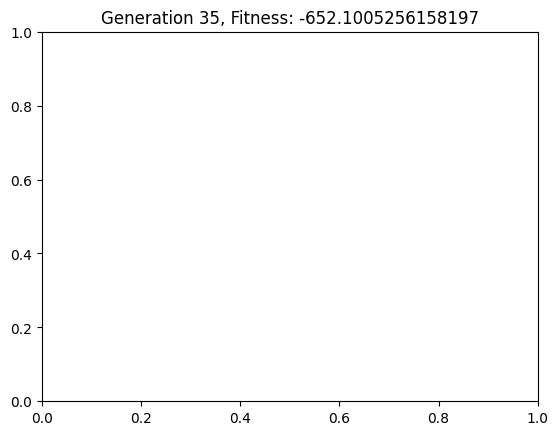

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (335, 258)}, {'name': 'Bedroom1', 'position': (48, 244), 'size': (277, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (283, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -702.4733510725314}


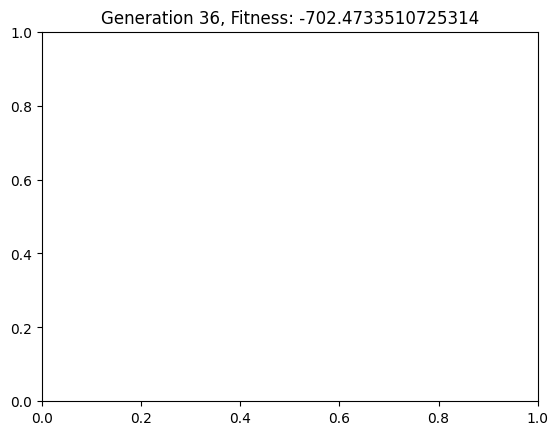

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (343, 261)}, {'name': 'Bedroom1', 'position': (48, 244), 'size': (277, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (291, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -752.8914038756153}


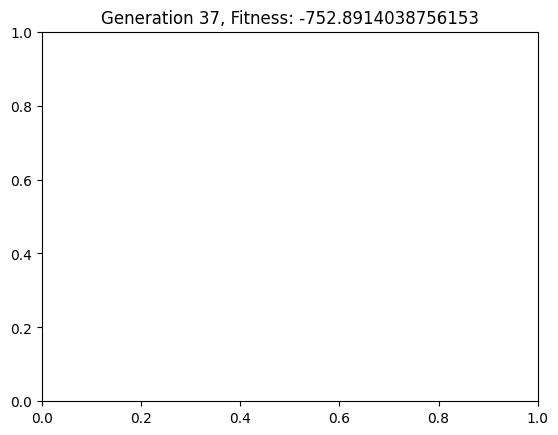

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (351, 261)}, {'name': 'Bedroom1', 'position': (48, 244), 'size': (277, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (299, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -791.3574947633927}


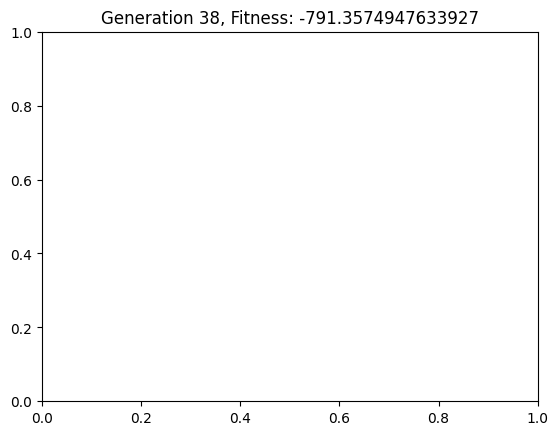

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (359, 261)}, {'name': 'Bedroom1', 'position': (48, 244), 'size': (277, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (307, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -817.3161463062887}


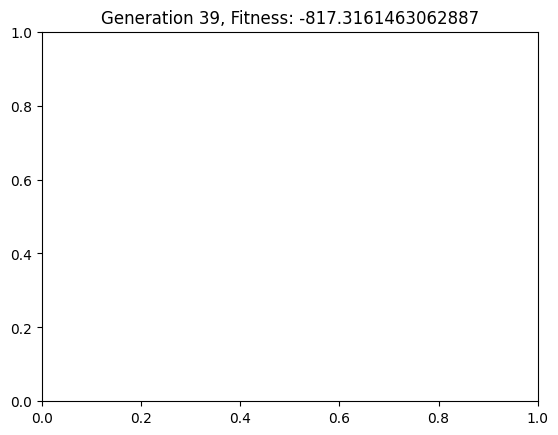

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (367, 261)}, {'name': 'Bedroom1', 'position': (48, 244), 'size': (277, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (315, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -844.2698109718865}


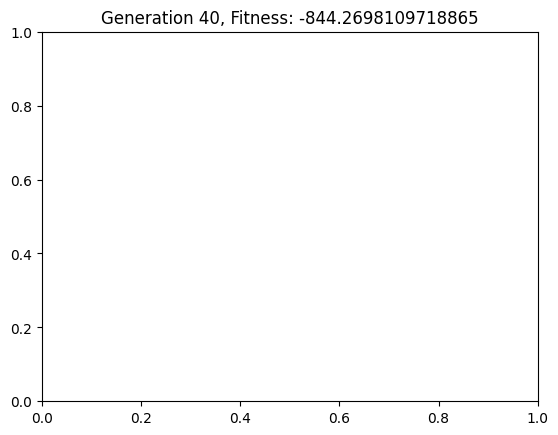

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (375, 261)}, {'name': 'Bedroom1', 'position': (48, 244), 'size': (277, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (323, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -871.217709346813}


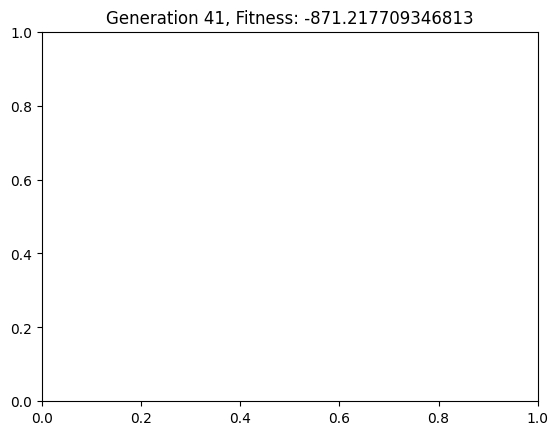

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (383, 261)}, {'name': 'Bedroom1', 'position': (48, 244), 'size': (277, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (331, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -897.1590136753614}


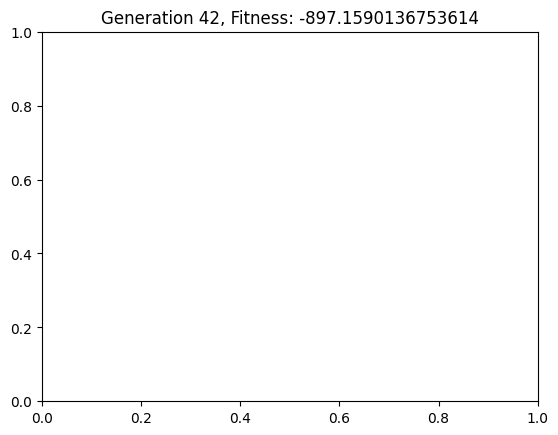

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (391, 261)}, {'name': 'Bedroom1', 'position': (48, 244), 'size': (277, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (333, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -924.0928379167789}


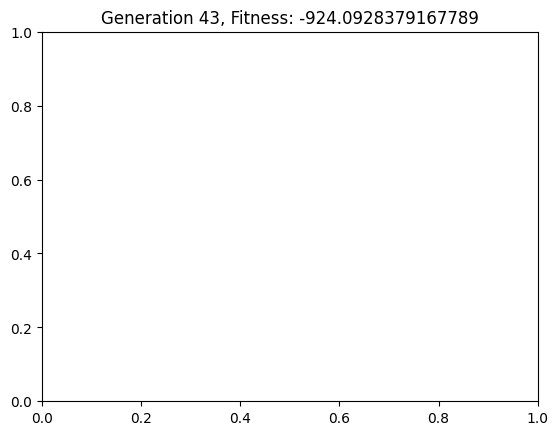

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (399, 261)}, {'name': 'Bedroom1', 'position': (48, 244), 'size': (277, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (333, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -951.0182265621875}


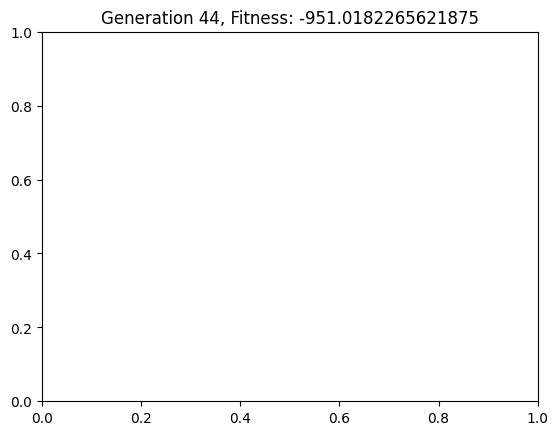

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (407, 261)}, {'name': 'Bedroom1', 'position': (48, 244), 'size': (277, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (333, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -977.9341419077768}


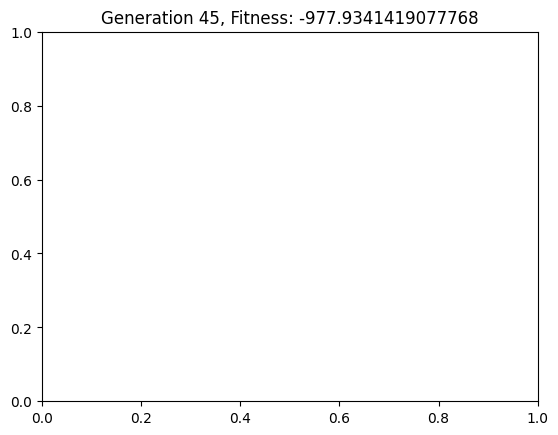

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (415, 261)}, {'name': 'Bedroom1', 'position': (48, 244), 'size': (277, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (333, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -1003.8394494183134}


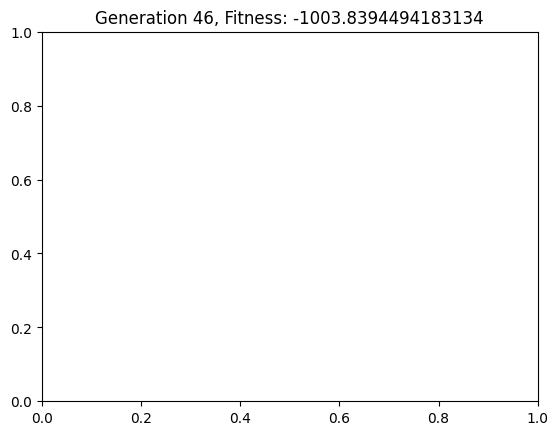

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (423, 261)}, {'name': 'Bedroom1', 'position': (48, 244), 'size': (277, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (333, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -1030.7329007339658}


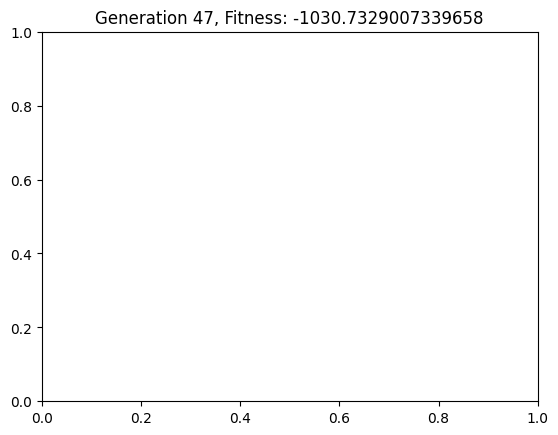

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (431, 261)}, {'name': 'Bedroom1', 'position': (48, 244), 'size': (277, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (333, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -1057.8726701495486}


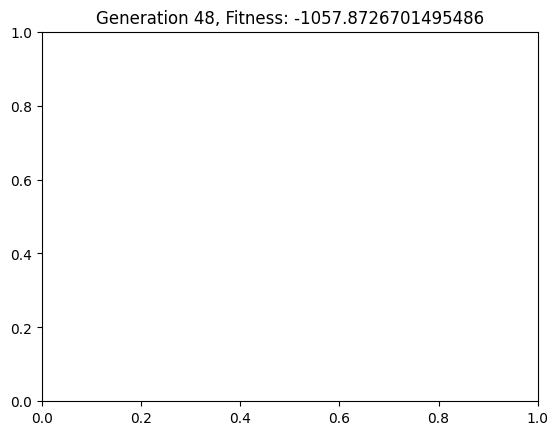

{'rooms': [{'name': 'Living Room', 'position': (307, 299), 'size': (439, 261)}, {'name': 'Bedroom1', 'position': (48, 244), 'size': (277, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (333, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -1085.2505476340364}


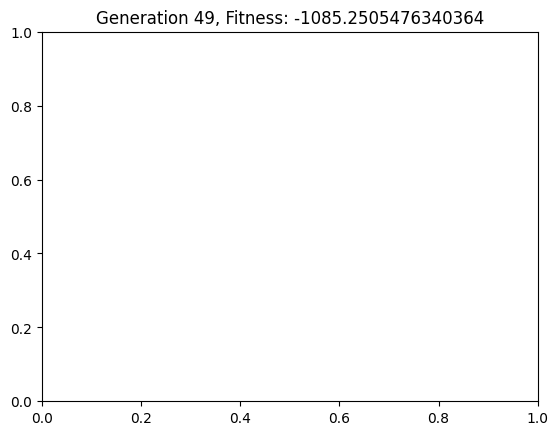

{'rooms': [{'name': 'Living Room', 'position': (303, 299), 'size': (443, 261)}, {'name': 'Bedroom1', 'position': (48, 244), 'size': (277, 55)}, {'name': 'Bedroom2', 'position': (414, 157), 'size': (333, 142)}, {'name': 'Passage', 'position': (325, 158), 'size': (89, 140)}, {'name': 'Kitchen', 'position': (170, 164), 'size': (155, 80)}, {'name': 'Washroom', 'position': (376, 52), 'size': (66, 105)}], 'fitness': -1112.6163034817534}
Elapsed time: 791.74 seconds


<Figure size 640x480 with 0 Axes>

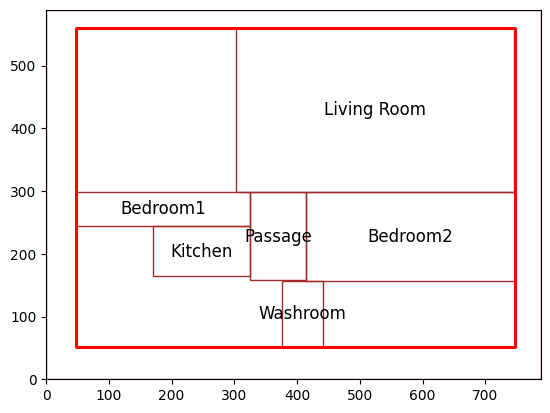

Elapsed time for initial population generation: 28.73 seconds


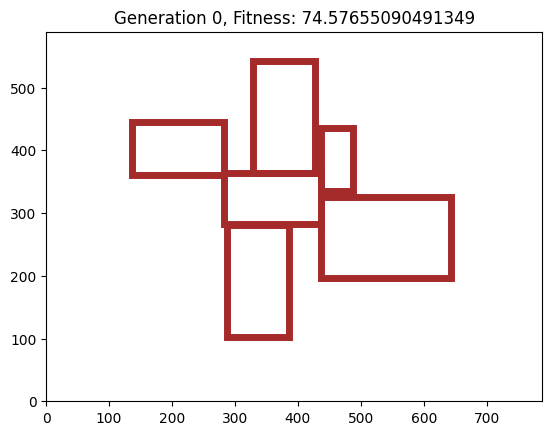

{'rooms': [{'name': 'Living Room', 'position': (437, 197), 'size': (206, 129)}, {'name': 'Passage', 'position': (283, 282), 'size': (153, 81)}, {'name': 'Kitchen', 'position': (136, 360), 'size': (146, 85)}, {'name': 'Washroom', 'position': (437, 335), 'size': (51, 101)}, {'name': 'Bedroom1', 'position': (329, 364), 'size': (99, 178)}, {'name': 'Bedroom2', 'position': (287, 102), 'size': (99, 179)}], 'fitness': 74.57655090491349}


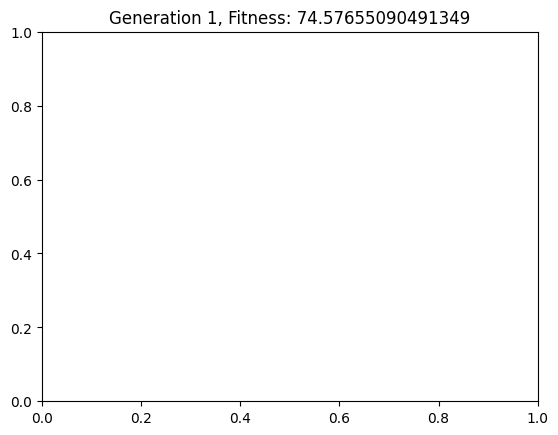

{'rooms': [{'name': 'Living Room', 'position': (437, 197), 'size': (208, 131)}, {'name': 'Passage', 'position': (283, 281), 'size': (153, 82)}, {'name': 'Kitchen', 'position': (135, 183), 'size': (148, 271)}, {'name': 'Washroom', 'position': (437, 335), 'size': (53, 103)}, {'name': 'Bedroom1', 'position': (329, 364), 'size': (101, 180)}, {'name': 'Bedroom2', 'position': (287, 101), 'size': (101, 180)}], 'fitness': 74.57655090491349}


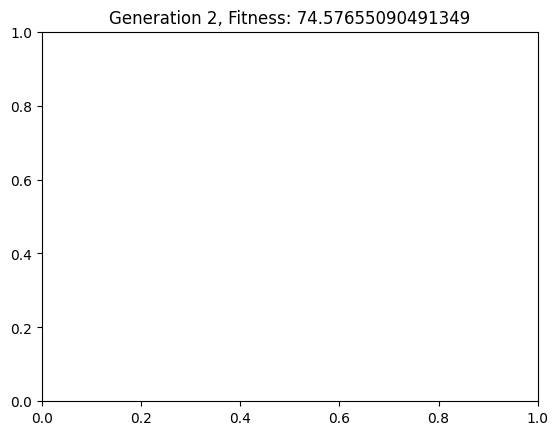

{'rooms': [{'name': 'Living Room', 'position': (437, 197), 'size': (212, 135)}, {'name': 'Passage', 'position': (283, 280), 'size': (153, 84)}, {'name': 'Kitchen', 'position': (131, 183), 'size': (152, 289)}, {'name': 'Washroom', 'position': (437, 335), 'size': (57, 101)}, {'name': 'Bedroom1', 'position': (329, 364), 'size': (105, 184)}, {'name': 'Bedroom2', 'position': (287, 98), 'size': (105, 181)}], 'fitness': -83.1216368725097}


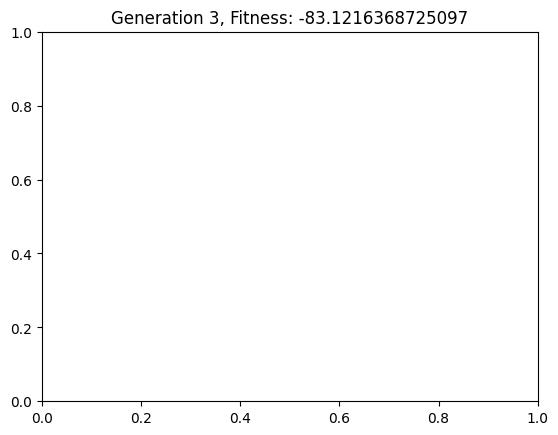

{'rooms': [{'name': 'Living Room', 'position': (437, 194), 'size': (220, 140)}, {'name': 'Passage', 'position': (283, 277), 'size': (153, 86)}, {'name': 'Kitchen', 'position': (123, 183), 'size': (160, 317)}, {'name': 'Washroom', 'position': (437, 335), 'size': (65, 116)}, {'name': 'Bedroom1', 'position': (326, 364), 'size': (110, 192)}, {'name': 'Bedroom2', 'position': (287, 93), 'size': (113, 184)}], 'fitness': -87.73035788635644}


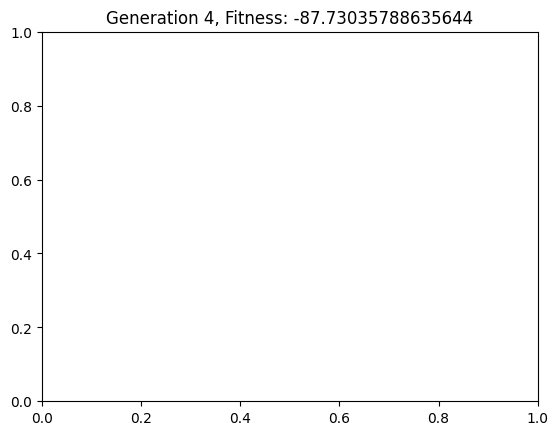

{'rooms': [{'name': 'Living Room', 'position': (437, 190), 'size': (228, 144)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (115, 183), 'size': (168, 294)}, {'name': 'Washroom', 'position': (437, 335), 'size': (73, 134)}, {'name': 'Bedroom1', 'position': (322, 364), 'size': (114, 196)}, {'name': 'Bedroom2', 'position': (287, 88), 'size': (121, 187)}], 'fitness': -205.50099026019856}


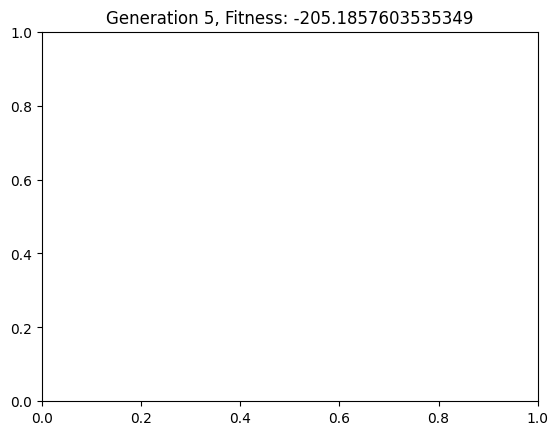

{'rooms': [{'name': 'Living Room', 'position': (437, 186), 'size': (236, 148)}, {'name': 'Bedroom1', 'position': (318, 364), 'size': (118, 196)}, {'name': 'Bedroom2', 'position': (287, 84), 'size': (129, 191)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (107, 183), 'size': (176, 282)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 146)}], 'fitness': -205.1857603535349}


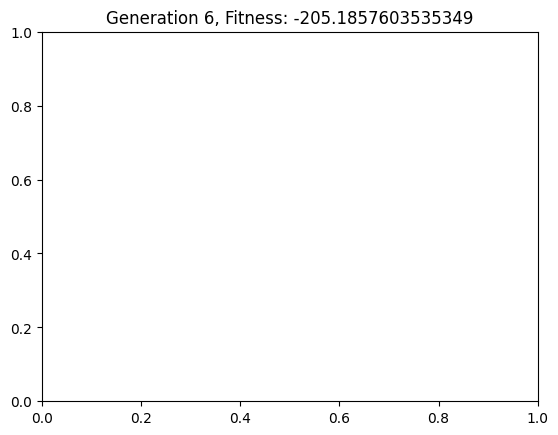

{'rooms': [{'name': 'Living Room', 'position': (437, 182), 'size': (244, 152)}, {'name': 'Bedroom1', 'position': (314, 364), 'size': (122, 196)}, {'name': 'Bedroom2', 'position': (287, 80), 'size': (137, 195)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (99, 183), 'size': (184, 324)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 147)}], 'fitness': -224.14830965483992}


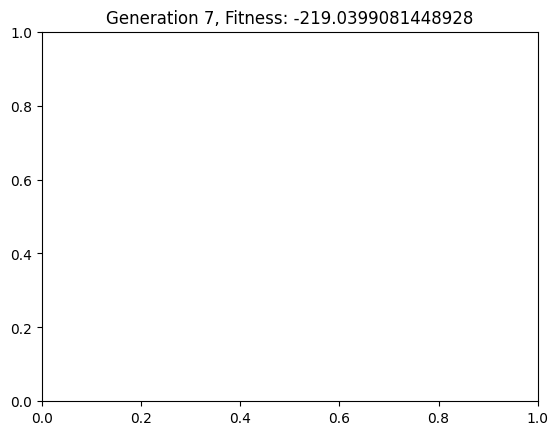

{'rooms': [{'name': 'Living Room', 'position': (437, 178), 'size': (252, 156)}, {'name': 'Bedroom1', 'position': (310, 364), 'size': (126, 196)}, {'name': 'Bedroom2', 'position': (287, 76), 'size': (145, 199)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (91, 183), 'size': (192, 376)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 149)}], 'fitness': -219.0399081448928}


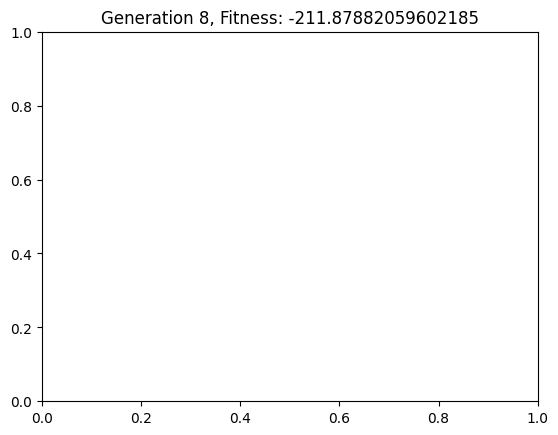

{'rooms': [{'name': 'Living Room', 'position': (437, 174), 'size': (260, 160)}, {'name': 'Bedroom1', 'position': (306, 364), 'size': (130, 196)}, {'name': 'Bedroom2', 'position': (285, 72), 'size': (151, 203)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (83, 132), 'size': (200, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 150)}], 'fitness': -211.87882059602185}


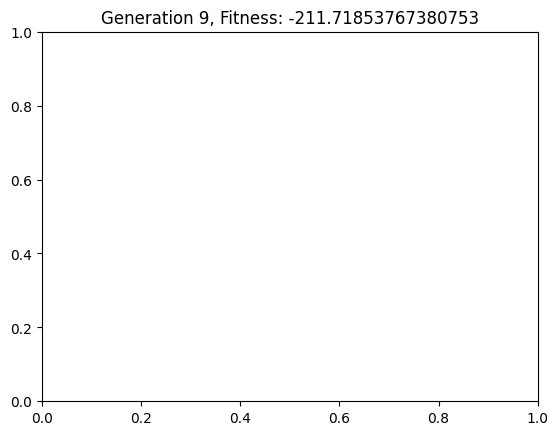

{'rooms': [{'name': 'Living Room', 'position': (437, 170), 'size': (268, 164)}, {'name': 'Bedroom1', 'position': (302, 364), 'size': (134, 196)}, {'name': 'Bedroom2', 'position': (283, 68), 'size': (154, 207)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (75, 132), 'size': (208, 374)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 152)}], 'fitness': -211.71853767380753}


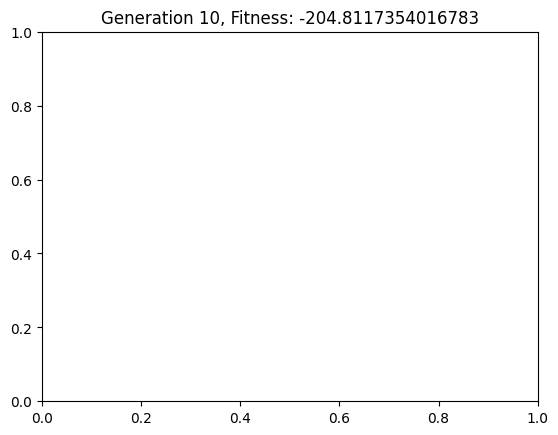

{'rooms': [{'name': 'Living Room', 'position': (437, 166), 'size': (276, 168)}, {'name': 'Bedroom1', 'position': (298, 364), 'size': (138, 196)}, {'name': 'Bedroom2', 'position': (283, 64), 'size': (154, 211)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (67, 132), 'size': (216, 406)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 133)}], 'fitness': -204.8117354016783}


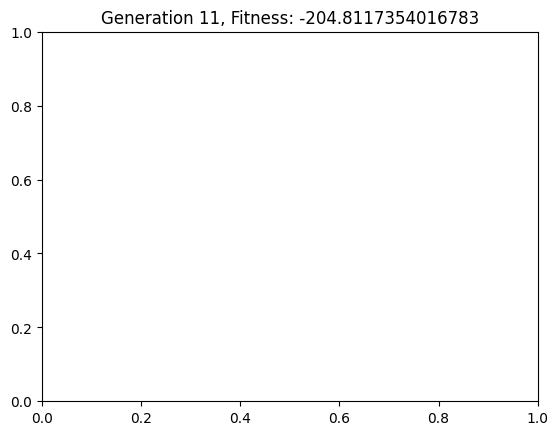

{'rooms': [{'name': 'Living Room', 'position': (437, 162), 'size': (284, 172)}, {'name': 'Bedroom1', 'position': (294, 364), 'size': (142, 196)}, {'name': 'Bedroom2', 'position': (283, 60), 'size': (154, 215)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (60, 132), 'size': (223, 369)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 140)}], 'fitness': -209.95870329718107}


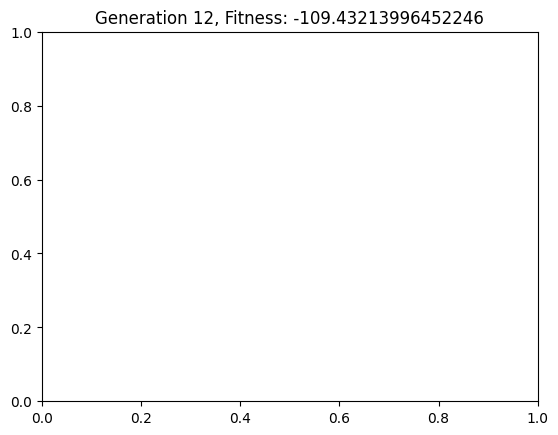

{'rooms': [{'name': 'Living Room', 'position': (437, 158), 'size': (292, 176)}, {'name': 'Bedroom1', 'position': (290, 364), 'size': (146, 196)}, {'name': 'Bedroom2', 'position': (283, 56), 'size': (154, 219)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (52, 68), 'size': (231, 396)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 148)}], 'fitness': -109.43213996452246}


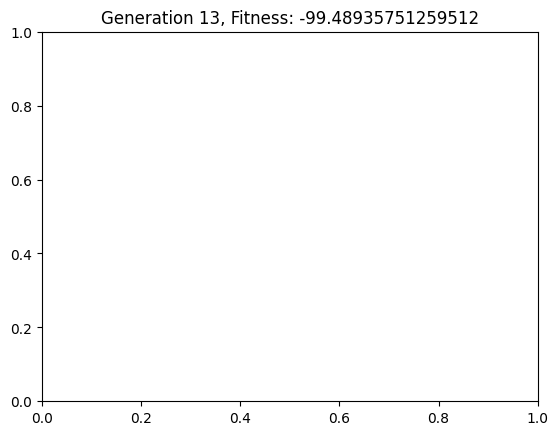

{'rooms': [{'name': 'Living Room', 'position': (437, 154), 'size': (300, 180)}, {'name': 'Bedroom1', 'position': (286, 364), 'size': (150, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 223)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 154)}], 'fitness': -99.48935751259512}


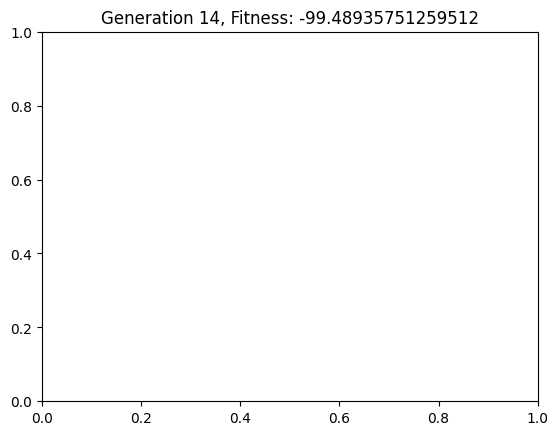

{'rooms': [{'name': 'Living Room', 'position': (437, 150), 'size': (308, 184)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 147)}], 'fitness': -332.8168171984249}


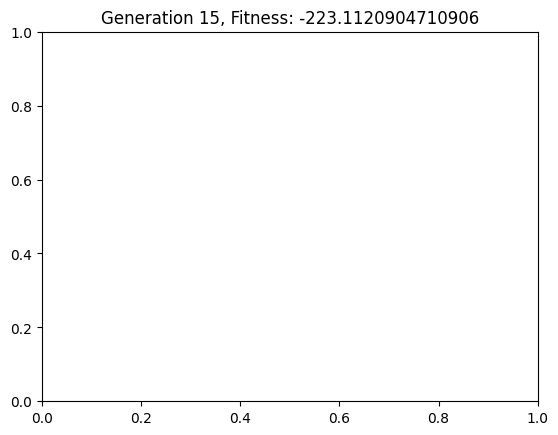

{'rooms': [{'name': 'Living Room', 'position': (437, 146), 'size': (310, 188)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 142)}], 'fitness': -223.1120904710906}


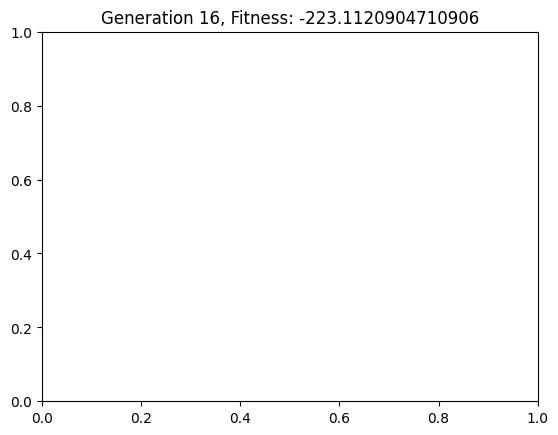

{'rooms': [{'name': 'Living Room', 'position': (437, 142), 'size': (310, 192)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 144)}], 'fitness': -233.75559064734156}


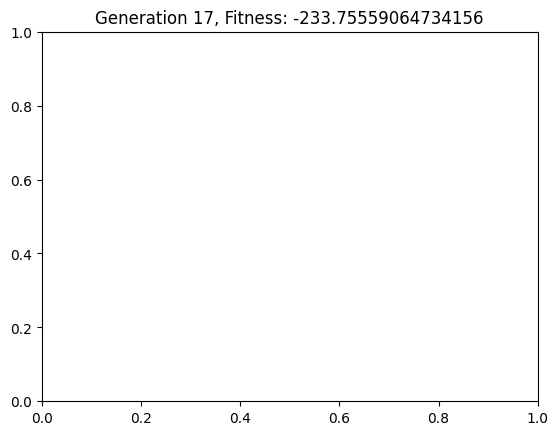

{'rooms': [{'name': 'Living Room', 'position': (437, 138), 'size': (310, 196)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 134)}], 'fitness': -235.78454095114114}


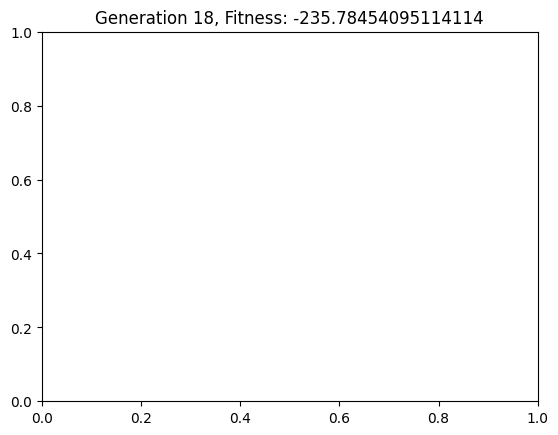

{'rooms': [{'name': 'Living Room', 'position': (437, 134), 'size': (310, 200)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 125)}], 'fitness': -355.201703459603}


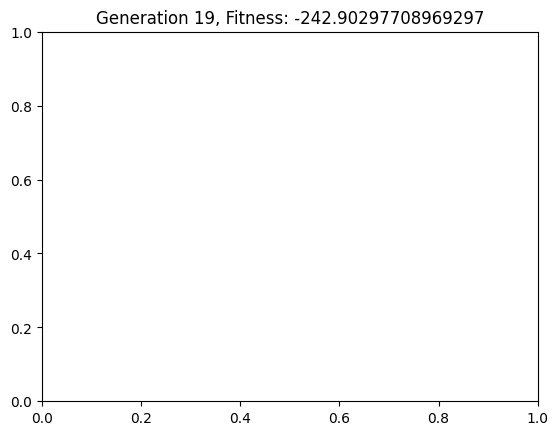

{'rooms': [{'name': 'Living Room', 'position': (437, 130), 'size': (310, 204)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 130)}], 'fitness': -242.90297708969297}


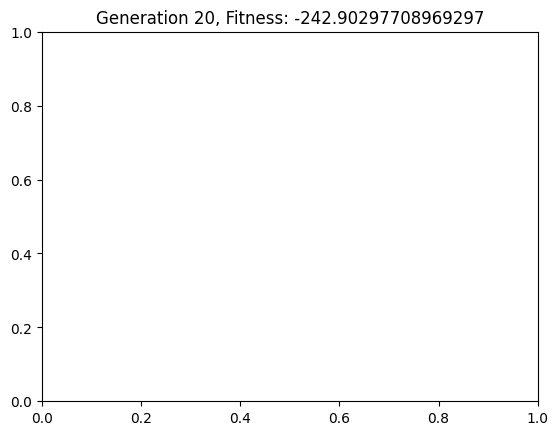

{'rooms': [{'name': 'Living Room', 'position': (437, 126), 'size': (310, 208)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 126)}], 'fitness': -369.2760733470865}


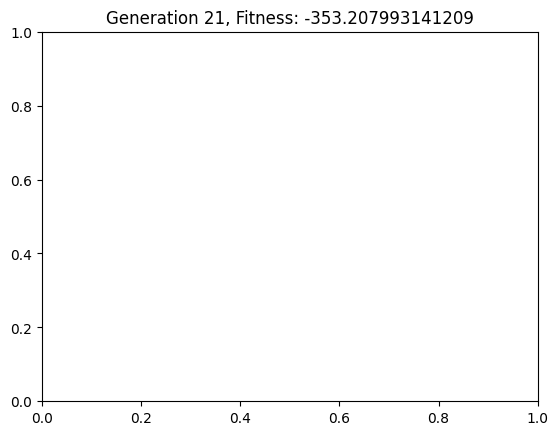

{'rooms': [{'name': 'Living Room', 'position': (437, 122), 'size': (310, 212)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 142)}], 'fitness': -353.207993141209}


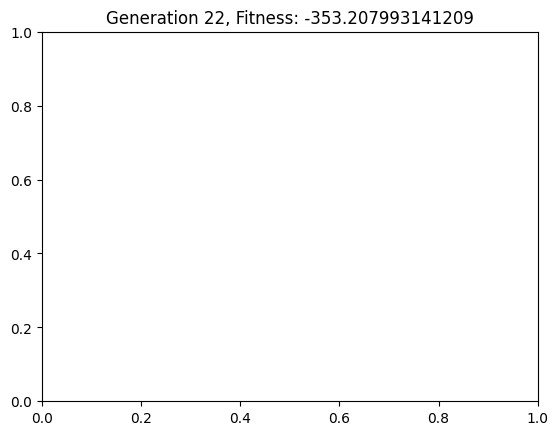

{'rooms': [{'name': 'Living Room', 'position': (437, 118), 'size': (310, 216)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 145)}], 'fitness': -369.77505603155237}


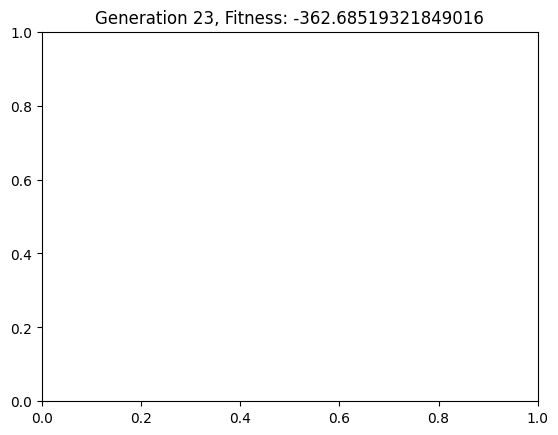

{'rooms': [{'name': 'Living Room', 'position': (437, 114), 'size': (310, 220)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 147)}], 'fitness': -362.68519321849016}


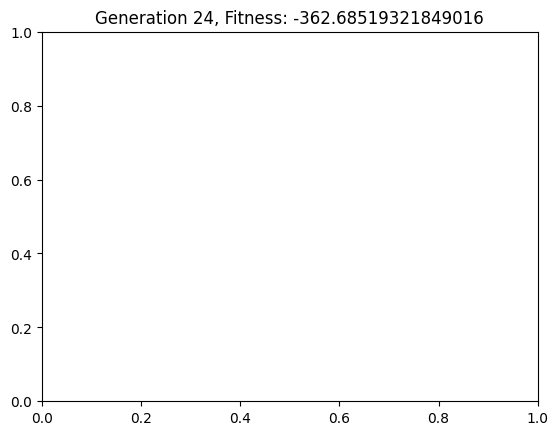

{'rooms': [{'name': 'Living Room', 'position': (437, 110), 'size': (310, 224)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 145)}], 'fitness': -376.600769086274}


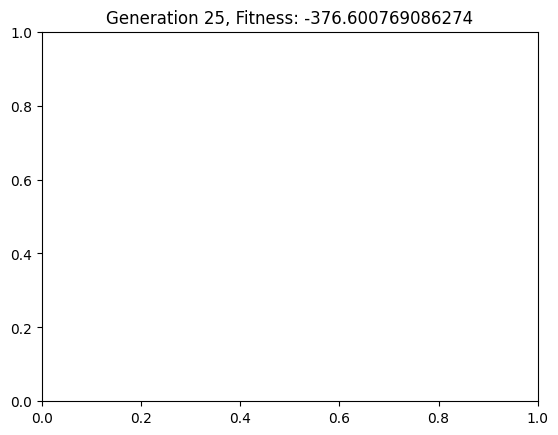

{'rooms': [{'name': 'Living Room', 'position': (437, 106), 'size': (310, 228)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 127)}], 'fitness': -383.69713494067673}


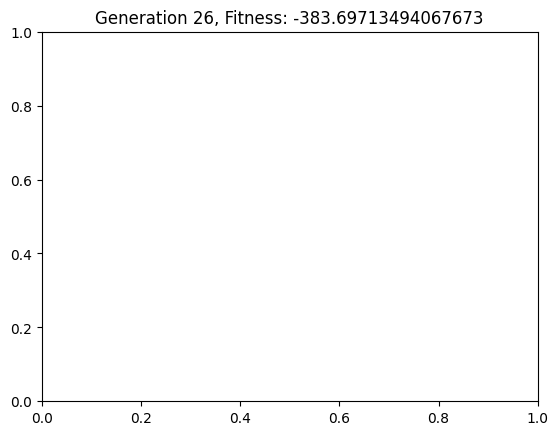

{'rooms': [{'name': 'Living Room', 'position': (437, 102), 'size': (310, 232)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 137)}], 'fitness': -406.865446685806}


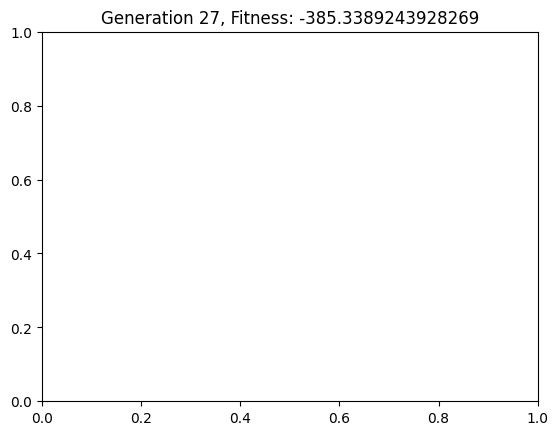

{'rooms': [{'name': 'Living Room', 'position': (437, 98), 'size': (310, 236)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 152)}], 'fitness': -385.3389243928269}


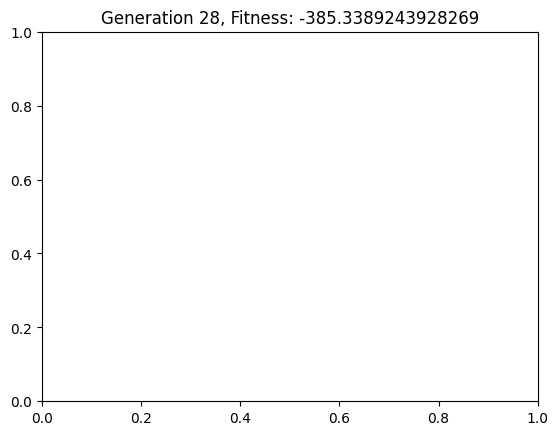

{'rooms': [{'name': 'Living Room', 'position': (437, 94), 'size': (310, 240)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 131)}], 'fitness': -393.0985408301486}


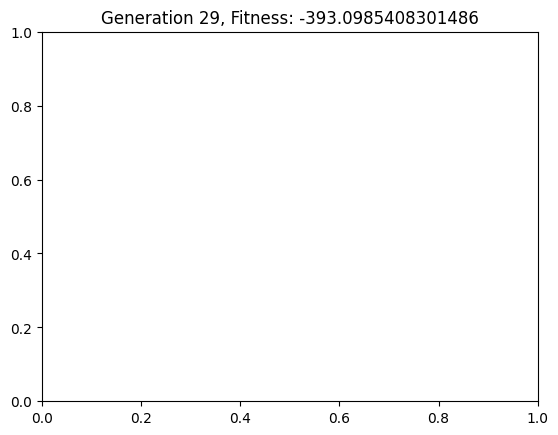

{'rooms': [{'name': 'Living Room', 'position': (437, 90), 'size': (310, 244)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 134)}], 'fitness': -418.57052229597514}


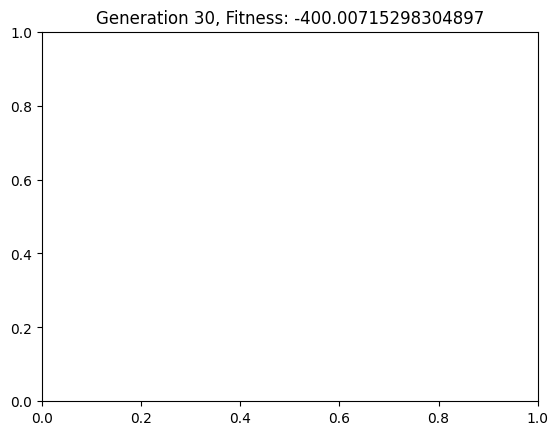

{'rooms': [{'name': 'Living Room', 'position': (437, 86), 'size': (310, 248)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 137)}], 'fitness': -400.00715298304897}


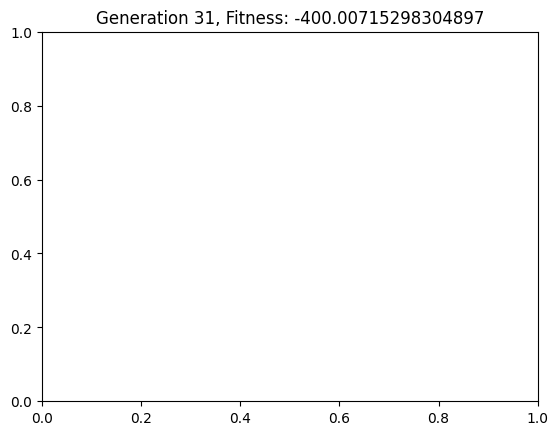

{'rooms': [{'name': 'Living Room', 'position': (437, 82), 'size': (310, 252)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 147)}], 'fitness': -423.36112421744735}


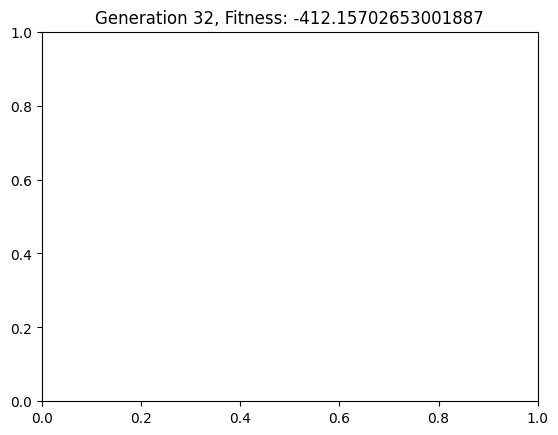

{'rooms': [{'name': 'Living Room', 'position': (437, 78), 'size': (310, 256)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 148)}], 'fitness': -412.15702653001887}


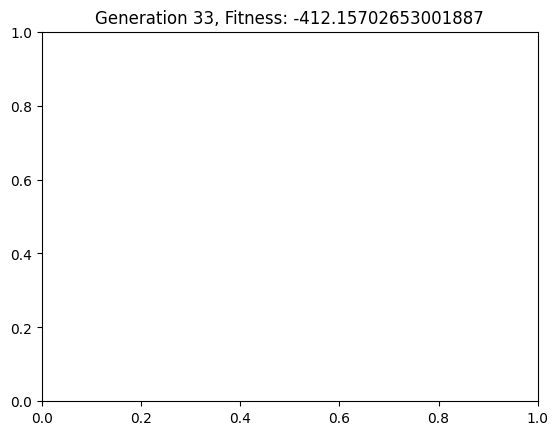

{'rooms': [{'name': 'Living Room', 'position': (437, 74), 'size': (310, 260)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 151)}], 'fitness': -423.4999689002076}


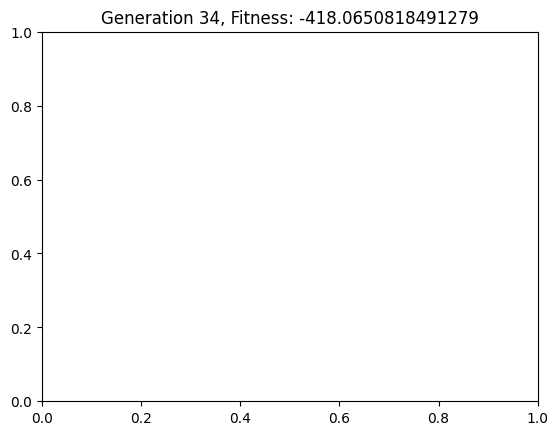

{'rooms': [{'name': 'Living Room', 'position': (437, 70), 'size': (310, 264)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 153)}], 'fitness': -418.0650818491279}


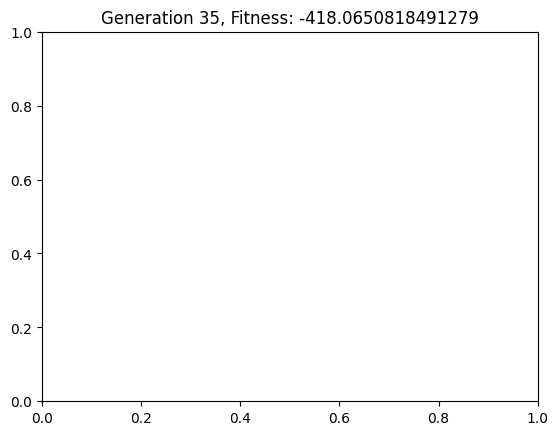

{'rooms': [{'name': 'Living Room', 'position': (437, 66), 'size': (310, 268)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 145)}], 'fitness': -428.7127730260338}


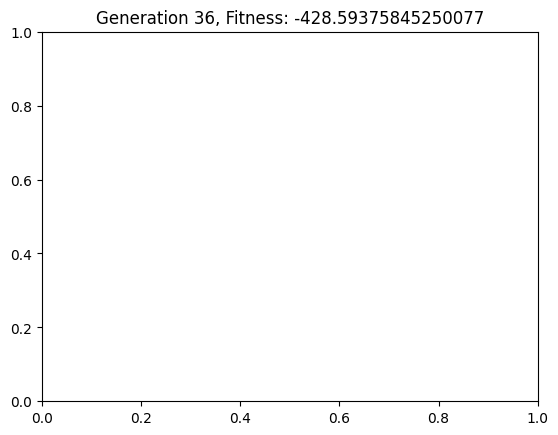

{'rooms': [{'name': 'Living Room', 'position': (437, 62), 'size': (310, 272)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 135)}], 'fitness': -428.59375845250077}


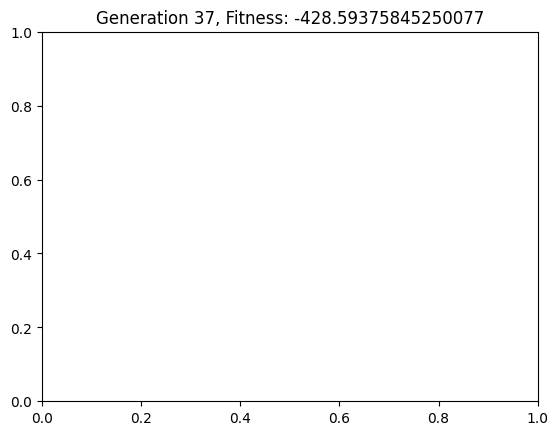

{'rooms': [{'name': 'Living Room', 'position': (437, 58), 'size': (310, 276)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 154)}], 'fitness': -458.2756115402687}


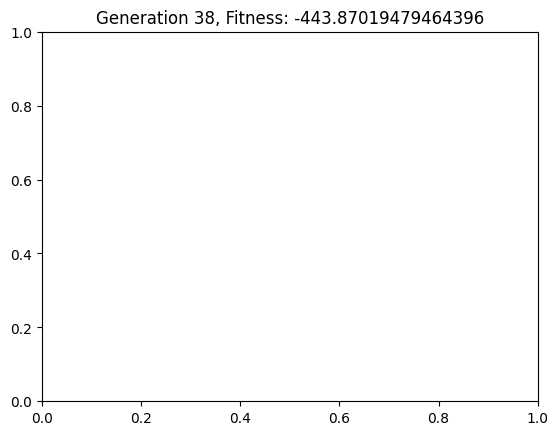

{'rooms': [{'name': 'Living Room', 'position': (437, 54), 'size': (310, 280)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 125)}], 'fitness': -443.87019479464396}


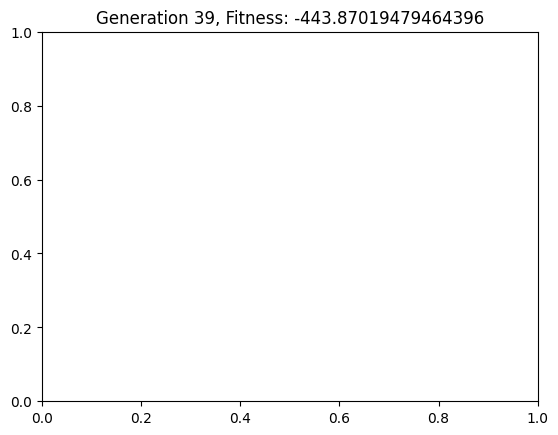

{'rooms': [{'name': 'Living Room', 'position': (437, 52), 'size': (310, 283)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 151)}], 'fitness': -482.7574132721385}


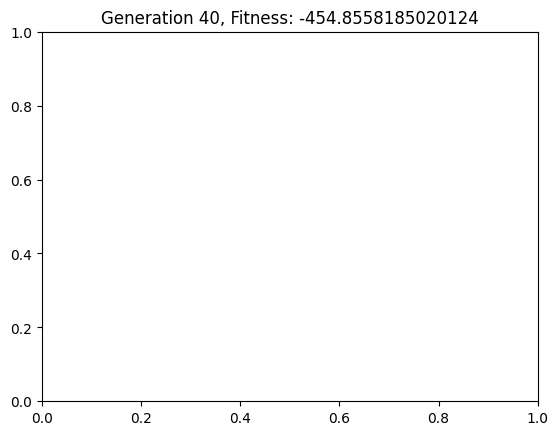

{'rooms': [{'name': 'Living Room', 'position': (437, 52), 'size': (310, 283)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 143)}], 'fitness': -454.8558185020124}


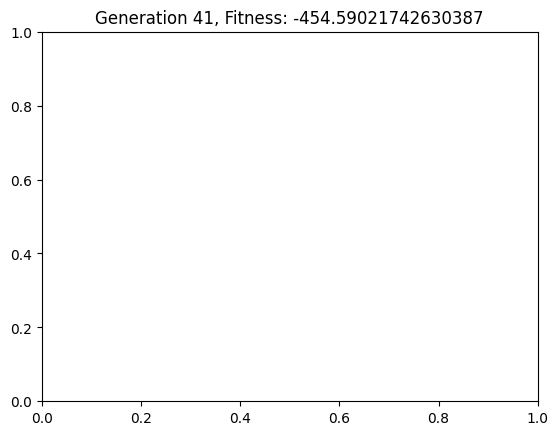

{'rooms': [{'name': 'Living Room', 'position': (437, 52), 'size': (310, 283)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 142)}], 'fitness': -454.59021742630387}


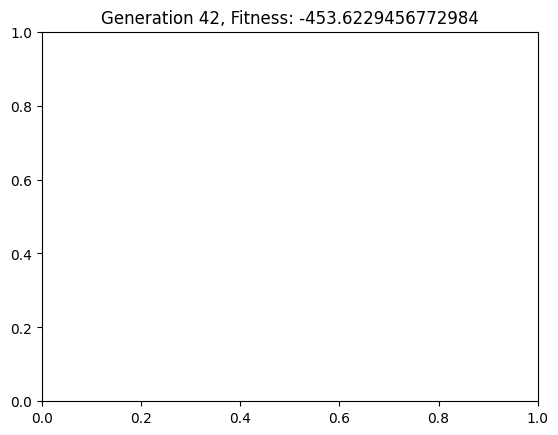

{'rooms': [{'name': 'Living Room', 'position': (437, 52), 'size': (310, 283)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 140)}], 'fitness': -453.6229456772984}


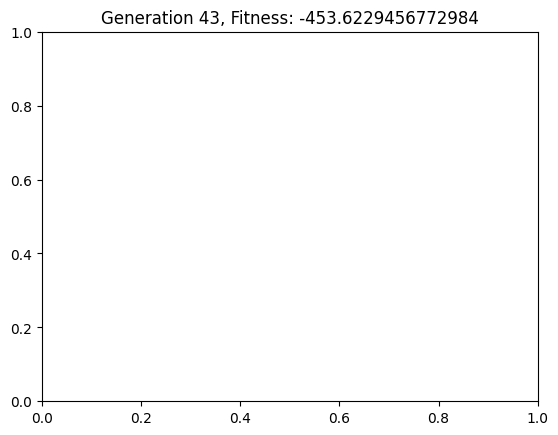

{'rooms': [{'name': 'Living Room', 'position': (437, 52), 'size': (310, 283)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 142)}], 'fitness': -467.2752955061188}


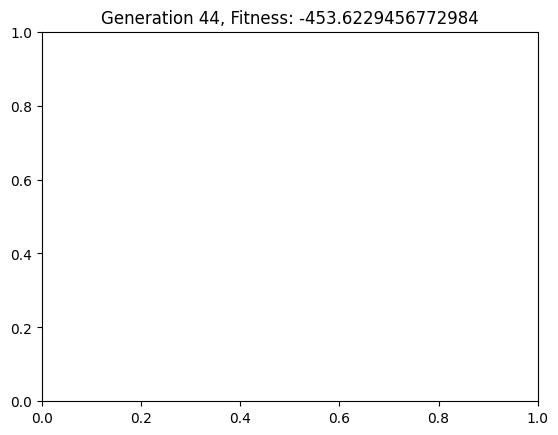

{'rooms': [{'name': 'Living Room', 'position': (437, 52), 'size': (310, 283)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 153)}], 'fitness': -453.6229456772984}


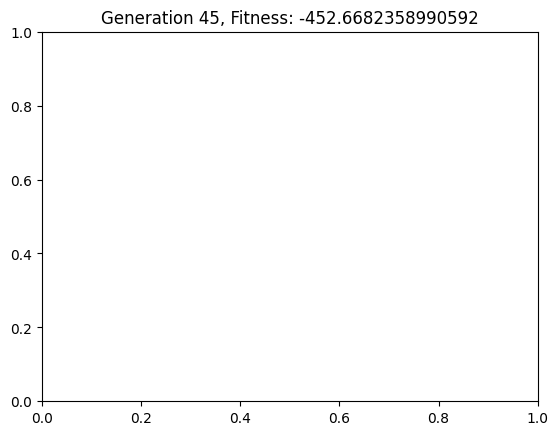

{'rooms': [{'name': 'Living Room', 'position': (437, 52), 'size': (310, 283)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 127)}], 'fitness': -452.6682358990592}


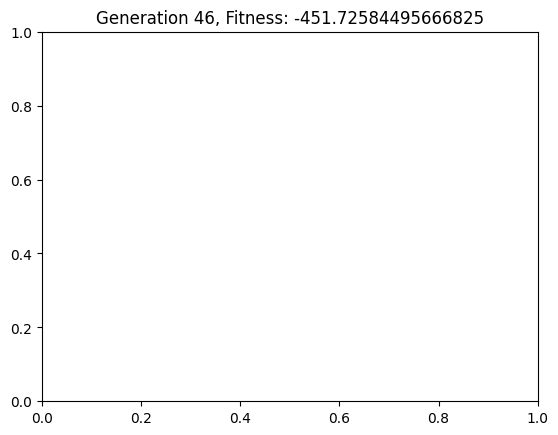

{'rooms': [{'name': 'Living Room', 'position': (437, 52), 'size': (310, 283)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 128)}], 'fitness': -451.72584495666825}


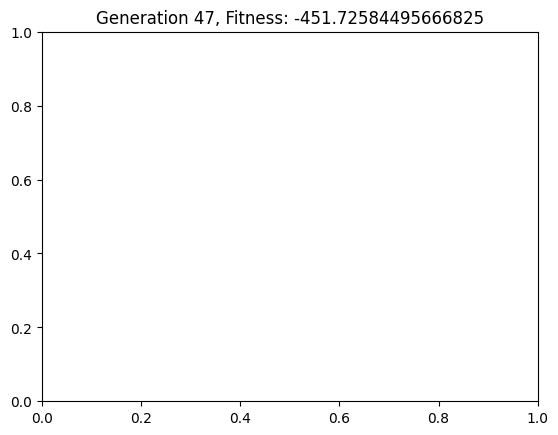

{'rooms': [{'name': 'Living Room', 'position': (437, 52), 'size': (310, 283)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 132)}], 'fitness': -482.338825725899}


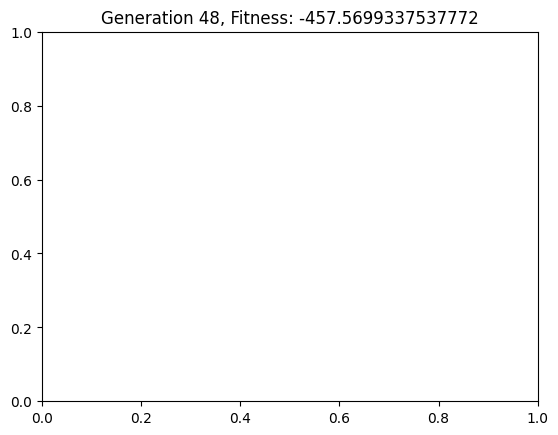

{'rooms': [{'name': 'Living Room', 'position': (437, 52), 'size': (310, 283)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 149)}], 'fitness': -457.5699337537772}


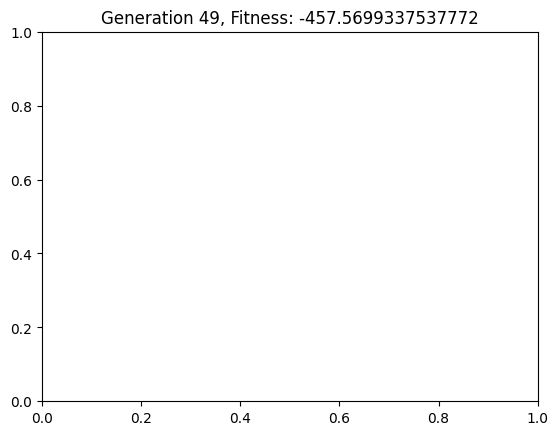

{'rooms': [{'name': 'Living Room', 'position': (437, 52), 'size': (310, 283)}, {'name': 'Bedroom1', 'position': (283, 364), 'size': (154, 196)}, {'name': 'Bedroom2', 'position': (283, 52), 'size': (154, 224)}, {'name': 'Passage', 'position': (283, 276), 'size': (153, 88)}, {'name': 'Kitchen', 'position': (48, 68), 'size': (235, 380)}, {'name': 'Washroom', 'position': (437, 335), 'size': (78, 150)}], 'fitness': -457.5699337537772}
Elapsed time: 958.01 seconds


<Figure size 640x480 with 0 Axes>

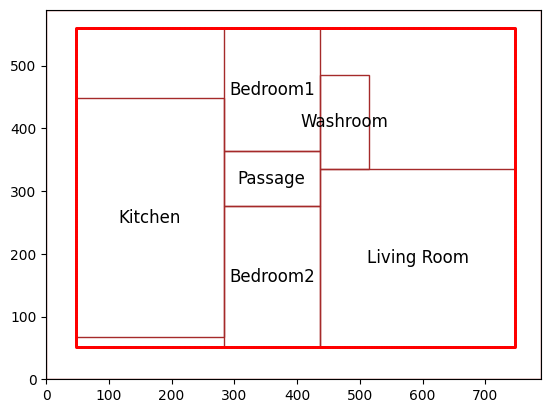

Elapsed time for initial population generation: 28.92 seconds


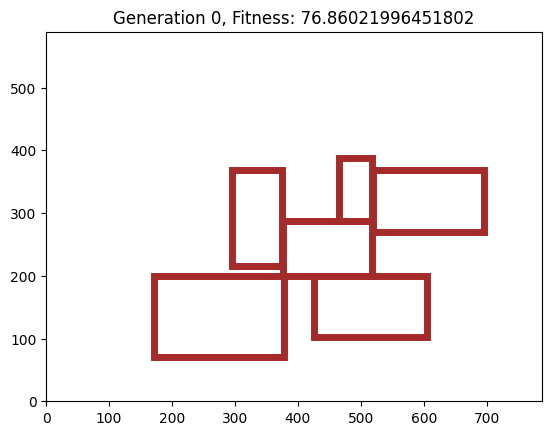

{'rooms': [{'name': 'Living Room', 'position': (172, 70), 'size': (206, 129)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 87)}, {'name': 'Kitchen', 'position': (295, 216), 'size': (80, 153)}, {'name': 'Washroom', 'position': (465, 288), 'size': (53, 100)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (177, 99)}, {'name': 'Bedroom2', 'position': (425, 102), 'size': (180, 97)}], 'fitness': 76.86021996451802}


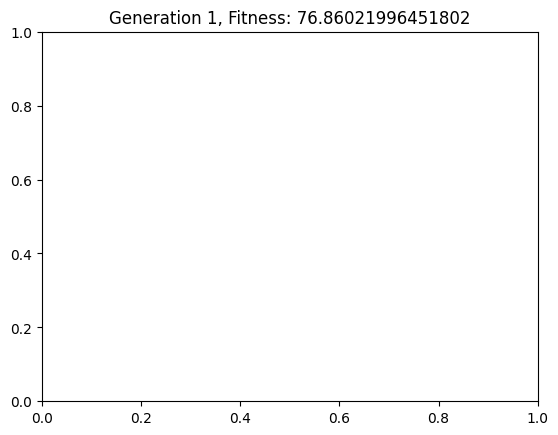

{'rooms': [{'name': 'Living Room', 'position': (172, 69), 'size': (208, 130)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (294, 216), 'size': (82, 158)}, {'name': 'Washroom', 'position': (464, 288), 'size': (55, 89)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (179, 101)}, {'name': 'Bedroom2', 'position': (425, 101), 'size': (182, 98)}], 'fitness': 76.86021996451802}


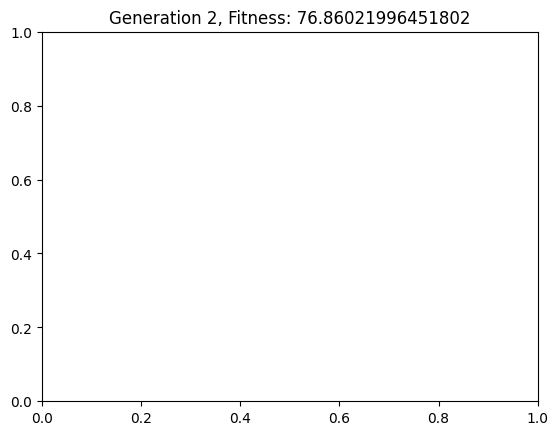

{'rooms': [{'name': 'Living Room', 'position': (172, 67), 'size': (212, 132)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (290, 216), 'size': (86, 141)}, {'name': 'Washroom', 'position': (460, 288), 'size': (59, 99)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (183, 105)}, {'name': 'Bedroom2', 'position': (425, 99), 'size': (186, 100)}], 'fitness': -33.89240789490674}


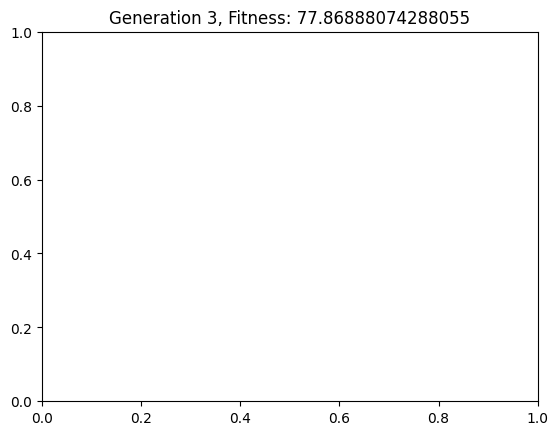

{'rooms': [{'name': 'Living Room', 'position': (172, 63), 'size': (220, 136)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (191, 113)}, {'name': 'Bedroom2', 'position': (425, 95), 'size': (194, 104)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (282, 216), 'size': (94, 159)}, {'name': 'Washroom', 'position': (452, 288), 'size': (67, 108)}], 'fitness': 77.86888074288055}


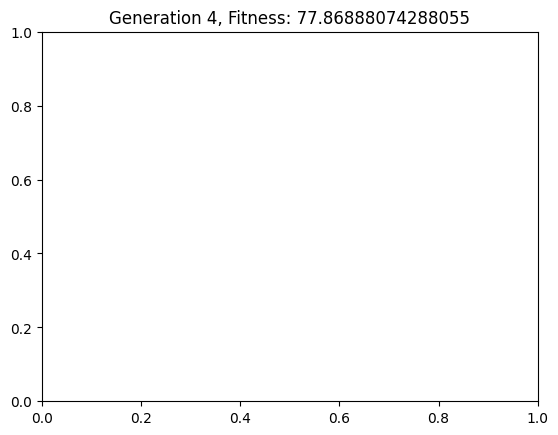

{'rooms': [{'name': 'Living Room', 'position': (172, 59), 'size': (228, 140)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (199, 121)}, {'name': 'Bedroom2', 'position': (425, 91), 'size': (202, 108)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (274, 216), 'size': (102, 179)}, {'name': 'Washroom', 'position': (444, 288), 'size': (75, 123)}], 'fitness': -52.55014998372053}


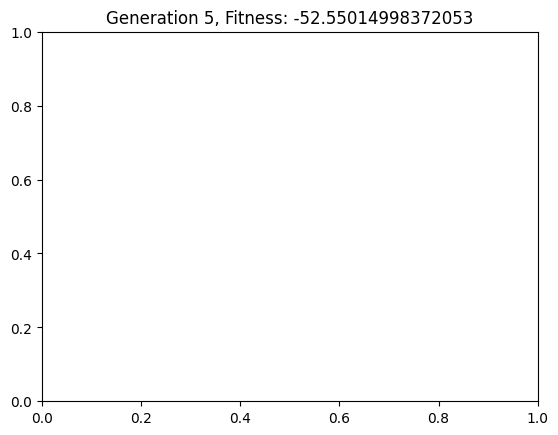

{'rooms': [{'name': 'Living Room', 'position': (172, 55), 'size': (236, 144)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (207, 129)}, {'name': 'Bedroom2', 'position': (425, 87), 'size': (210, 112)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (266, 216), 'size': (110, 204)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 130)}], 'fitness': -169.29091244525478}


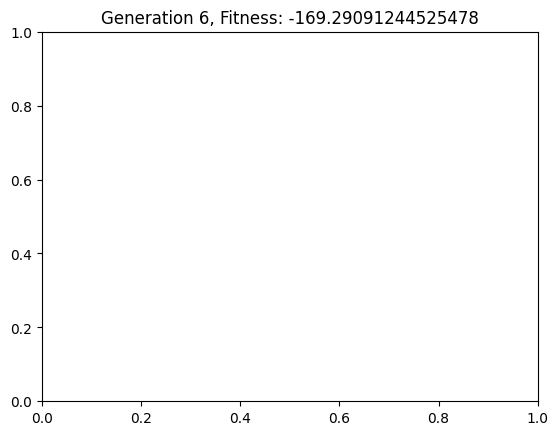

{'rooms': [{'name': 'Living Room', 'position': (172, 52), 'size': (244, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (215, 137)}, {'name': 'Bedroom2', 'position': (425, 83), 'size': (218, 116)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (258, 216), 'size': (118, 207)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 147)}], 'fitness': -187.71886048447988}


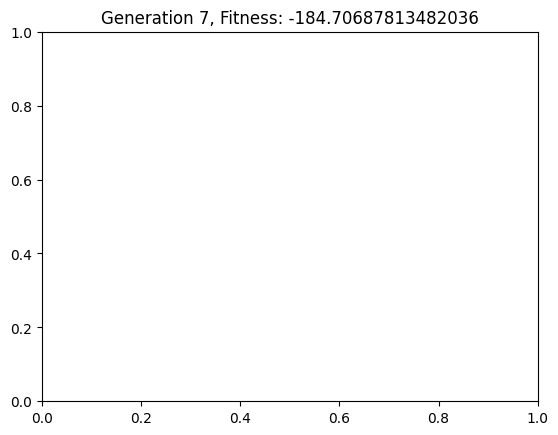

{'rooms': [{'name': 'Living Room', 'position': (172, 52), 'size': (252, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (223, 145)}, {'name': 'Bedroom2', 'position': (425, 79), 'size': (226, 120)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (250, 216), 'size': (126, 242)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 131)}], 'fitness': -184.70687813482036}


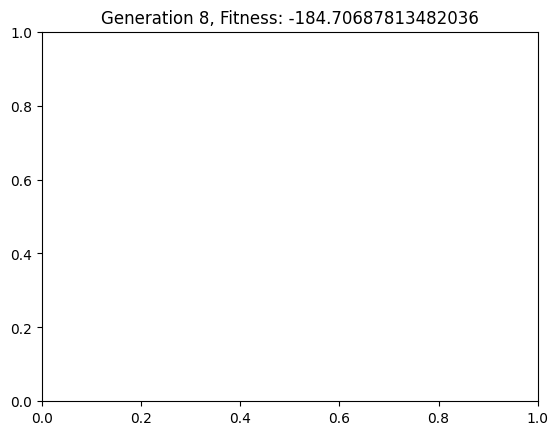

{'rooms': [{'name': 'Living Room', 'position': (168, 52), 'size': (256, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 153)}, {'name': 'Bedroom2', 'position': (425, 75), 'size': (234, 124)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (242, 216), 'size': (134, 217)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 142)}], 'fitness': -283.311413772604}


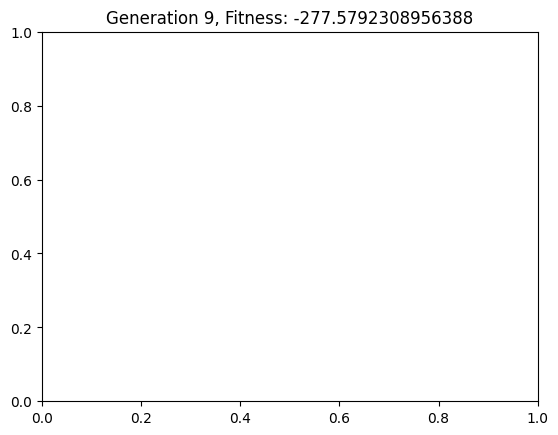

{'rooms': [{'name': 'Living Room', 'position': (164, 52), 'size': (260, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 161)}, {'name': 'Bedroom2', 'position': (425, 71), 'size': (242, 128)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (234, 216), 'size': (142, 263)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 150)}], 'fitness': -277.5792308956388}


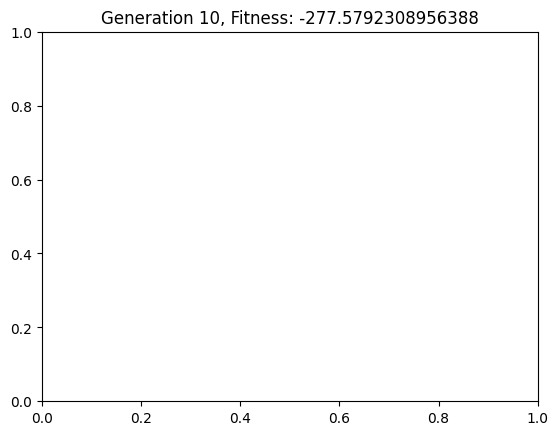

{'rooms': [{'name': 'Living Room', 'position': (160, 52), 'size': (264, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 169)}, {'name': 'Bedroom2', 'position': (425, 67), 'size': (250, 132)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (226, 216), 'size': (150, 259)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 135)}], 'fitness': -305.3306982043199}


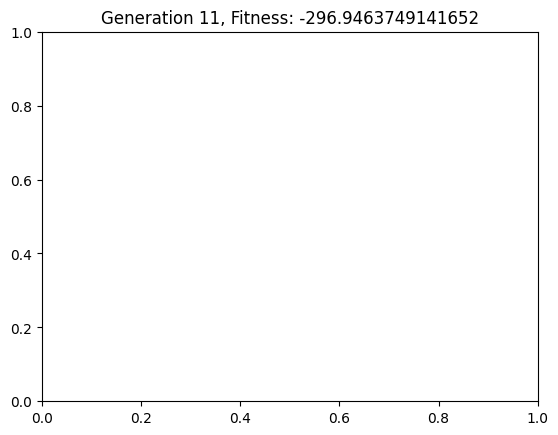

{'rooms': [{'name': 'Living Room', 'position': (156, 52), 'size': (268, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 177)}, {'name': 'Bedroom2', 'position': (425, 63), 'size': (258, 136)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (218, 216), 'size': (158, 282)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 133)}], 'fitness': -296.9463749141652}


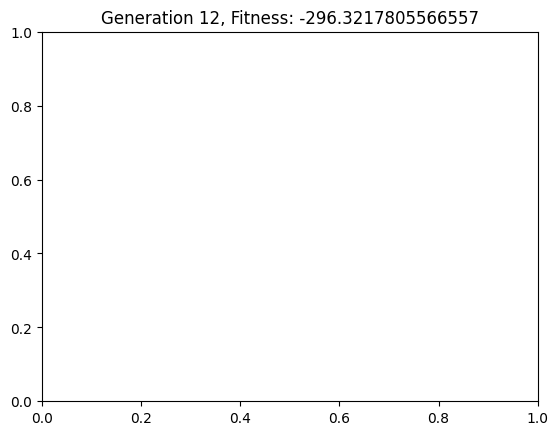

{'rooms': [{'name': 'Living Room', 'position': (152, 52), 'size': (272, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 185)}, {'name': 'Bedroom2', 'position': (425, 59), 'size': (266, 140)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (210, 216), 'size': (166, 288)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 150)}], 'fitness': -296.3217805566557}


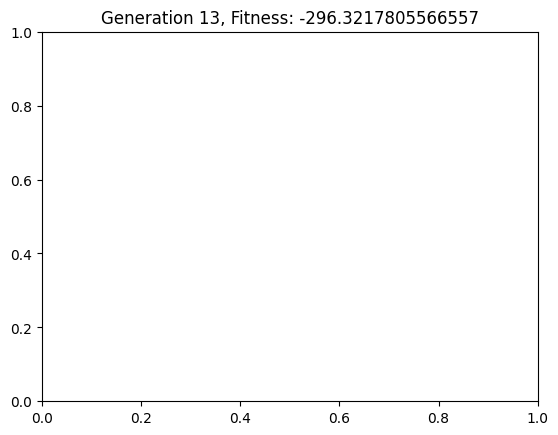

{'rooms': [{'name': 'Living Room', 'position': (148, 52), 'size': (276, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 193)}, {'name': 'Bedroom2', 'position': (425, 55), 'size': (274, 144)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (202, 216), 'size': (174, 326)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 151)}], 'fitness': -315.18902631115884}


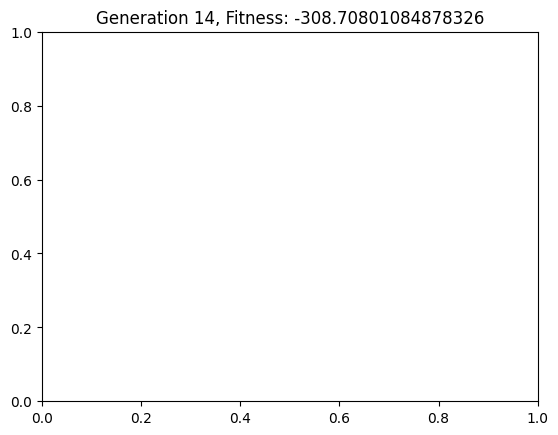

{'rooms': [{'name': 'Living Room', 'position': (144, 52), 'size': (280, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 201)}, {'name': 'Bedroom2', 'position': (425, 52), 'size': (282, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (197, 216), 'size': (179, 303)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 131)}], 'fitness': -308.70801084878326}


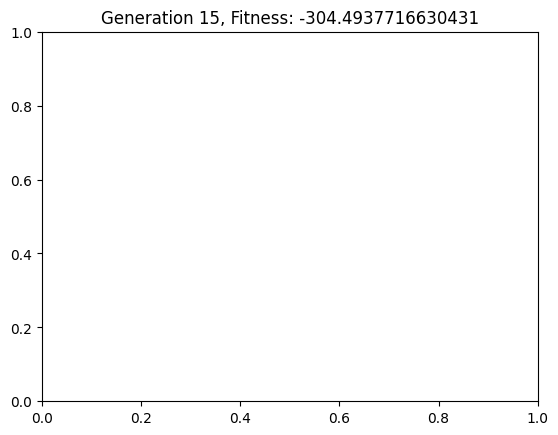

{'rooms': [{'name': 'Living Room', 'position': (140, 52), 'size': (284, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 209)}, {'name': 'Bedroom2', 'position': (425, 52), 'size': (290, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (190, 201), 'size': (186, 356)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 155)}], 'fitness': -304.4937716630431}


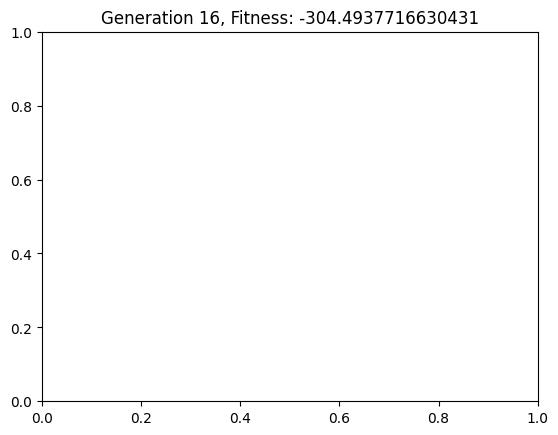

{'rooms': [{'name': 'Living Room', 'position': (136, 52), 'size': (288, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 217)}, {'name': 'Bedroom2', 'position': (425, 52), 'size': (298, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (183, 201), 'size': (193, 334)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 125)}], 'fitness': -328.4386434437428}


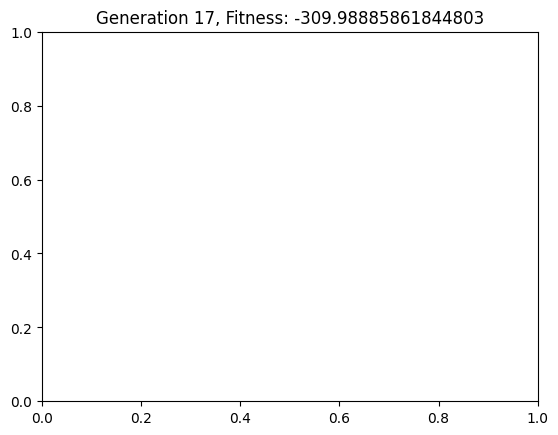

{'rooms': [{'name': 'Living Room', 'position': (132, 52), 'size': (292, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 225)}, {'name': 'Bedroom2', 'position': (425, 52), 'size': (306, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (179, 201), 'size': (197, 357)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 128)}], 'fitness': -309.98885861844803}


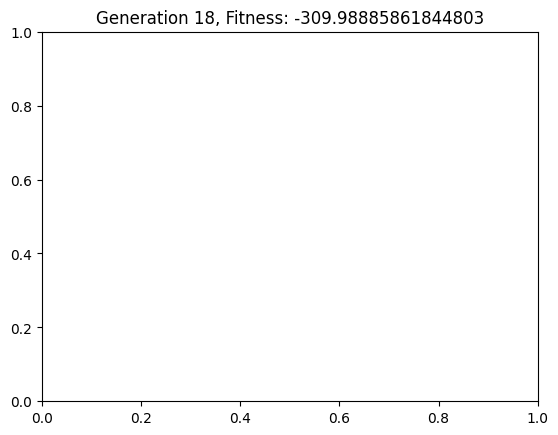

{'rooms': [{'name': 'Living Room', 'position': (128, 52), 'size': (296, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 233)}, {'name': 'Bedroom2', 'position': (425, 52), 'size': (314, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (176, 201), 'size': (200, 335)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 148)}], 'fitness': -314.26816494792786}


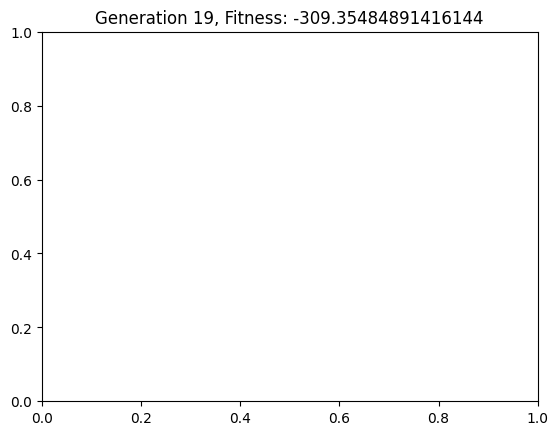

{'rooms': [{'name': 'Living Room', 'position': (124, 52), 'size': (300, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 241)}, {'name': 'Bedroom2', 'position': (425, 52), 'size': (322, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (172, 201), 'size': (204, 349)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 128)}], 'fitness': -309.35484891416144}


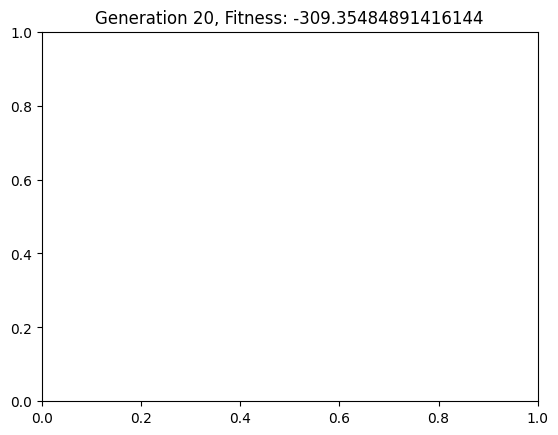

{'rooms': [{'name': 'Living Room', 'position': (119, 52), 'size': (303, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 249)}, {'name': 'Bedroom2', 'position': (422, 52), 'size': (324, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (168, 201), 'size': (208, 355)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 146)}], 'fitness': -312.67667405928785}


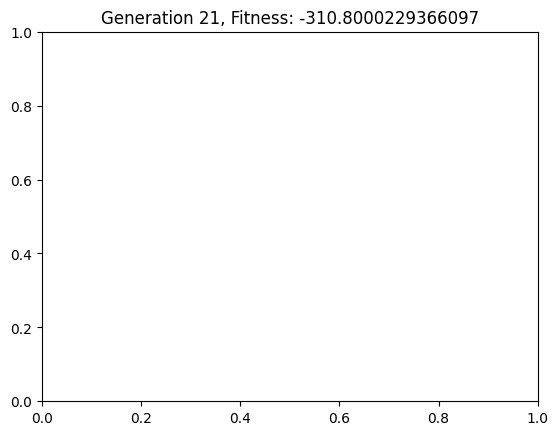

{'rooms': [{'name': 'Living Room', 'position': (114, 52), 'size': (306, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 257)}, {'name': 'Bedroom2', 'position': (420, 52), 'size': (327, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (165, 201), 'size': (211, 352)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 133)}], 'fitness': -310.8000229366097}


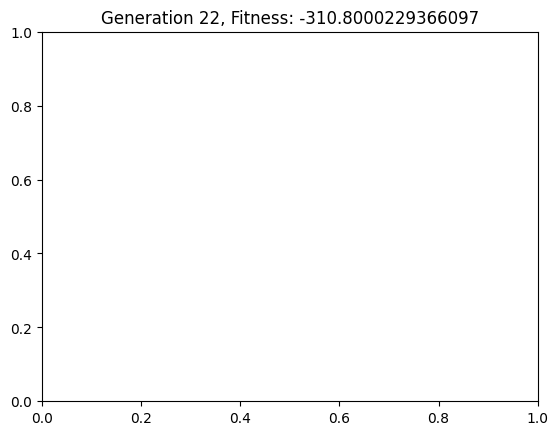

{'rooms': [{'name': 'Living Room', 'position': (108, 52), 'size': (308, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 265)}, {'name': 'Bedroom2', 'position': (417, 52), 'size': (330, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (163, 201), 'size': (213, 351)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 153)}], 'fitness': -317.90580143186236}


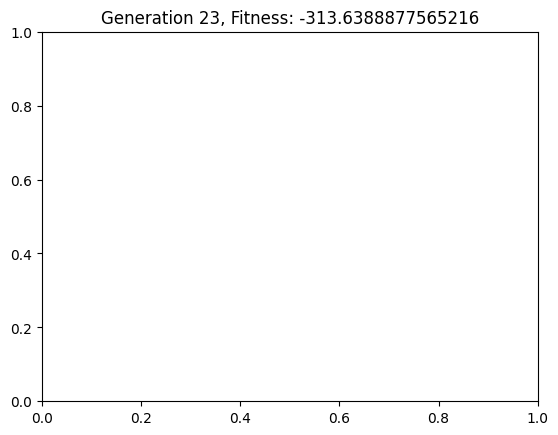

{'rooms': [{'name': 'Living Room', 'position': (103, 52), 'size': (311, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 273)}, {'name': 'Bedroom2', 'position': (414, 52), 'size': (332, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (162, 201), 'size': (214, 349)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 150)}], 'fitness': -313.6388877565216}


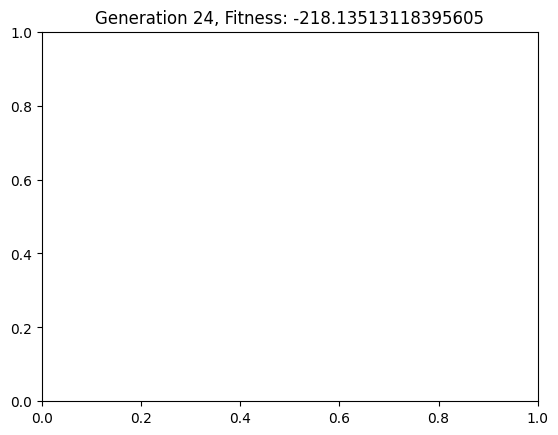

{'rooms': [{'name': 'Living Room', 'position': (98, 52), 'size': (314, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 281)}, {'name': 'Bedroom2', 'position': (412, 52), 'size': (335, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (159, 201), 'size': (217, 352)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 148)}], 'fitness': -218.13513118395605}


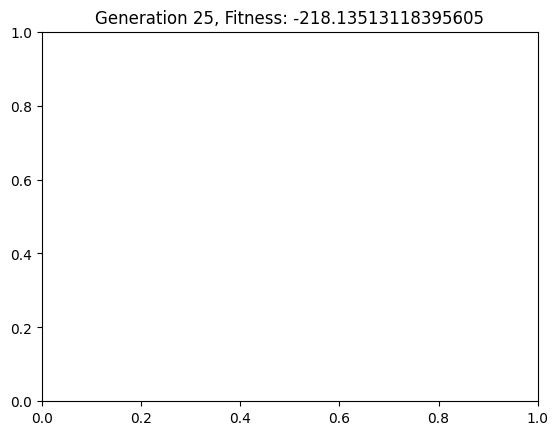

{'rooms': [{'name': 'Living Room', 'position': (92, 52), 'size': (316, 148)}, {'name': 'Bedroom1', 'position': (519, 269), 'size': (228, 289)}, {'name': 'Bedroom2', 'position': (409, 52), 'size': (338, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (158, 201), 'size': (218, 359)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 142)}], 'fitness': -327.4608043402357}


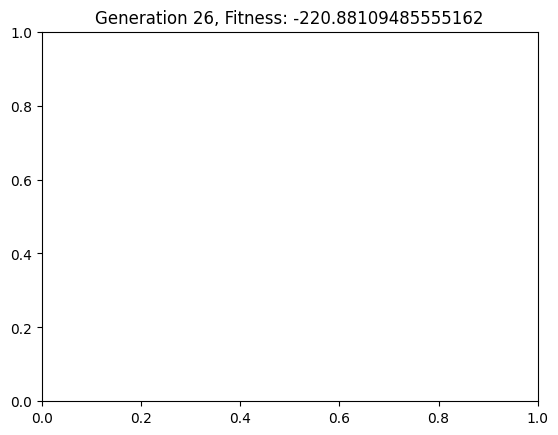

{'rooms': [{'name': 'Living Room', 'position': (87, 52), 'size': (319, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (406, 52), 'size': (340, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (158, 201), 'size': (218, 359)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 134)}], 'fitness': -220.88109485555162}


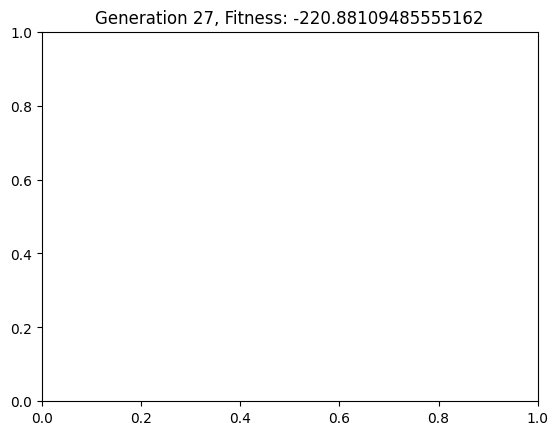

{'rooms': [{'name': 'Living Room', 'position': (82, 52), 'size': (322, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (404, 52), 'size': (343, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (158, 201), 'size': (218, 359)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 140)}], 'fitness': -321.13077760335295}


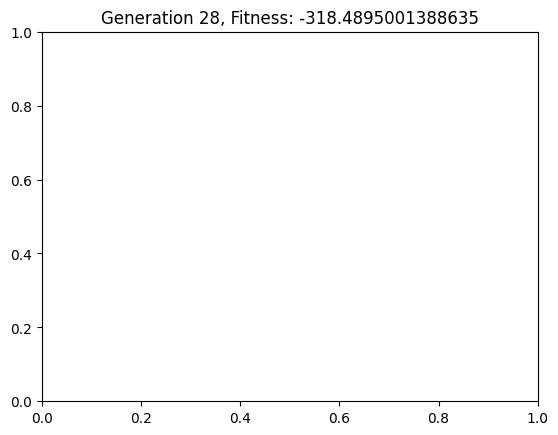

{'rooms': [{'name': 'Living Room', 'position': (76, 52), 'size': (324, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (401, 52), 'size': (346, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (158, 201), 'size': (218, 359)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 141)}], 'fitness': -318.4895001388635}


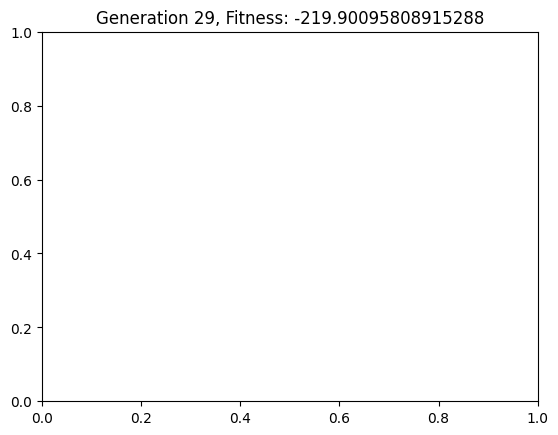

{'rooms': [{'name': 'Living Room', 'position': (71, 52), 'size': (327, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (398, 52), 'size': (348, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (157, 201), 'size': (219, 353)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 128)}], 'fitness': -219.90095808915288}


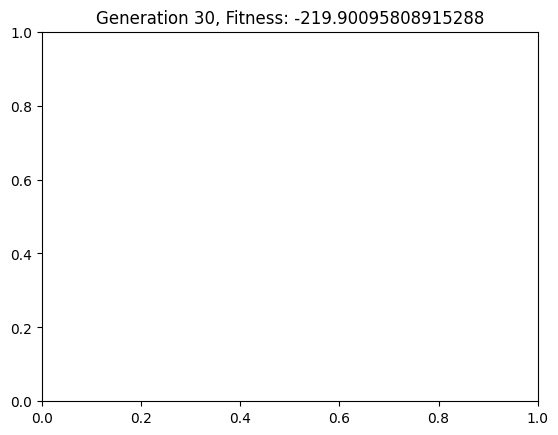

{'rooms': [{'name': 'Living Room', 'position': (66, 52), 'size': (330, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (396, 52), 'size': (351, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (157, 201), 'size': (219, 353)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 141)}], 'fitness': -221.1003800990623}


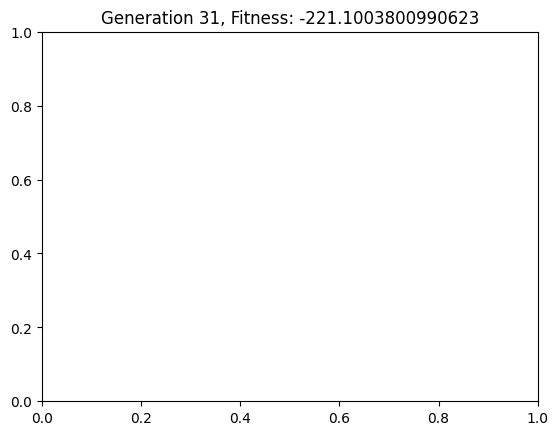

{'rooms': [{'name': 'Living Room', 'position': (60, 52), 'size': (332, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (393, 52), 'size': (354, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (157, 201), 'size': (219, 353)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 137)}], 'fitness': -323.4927594395779}


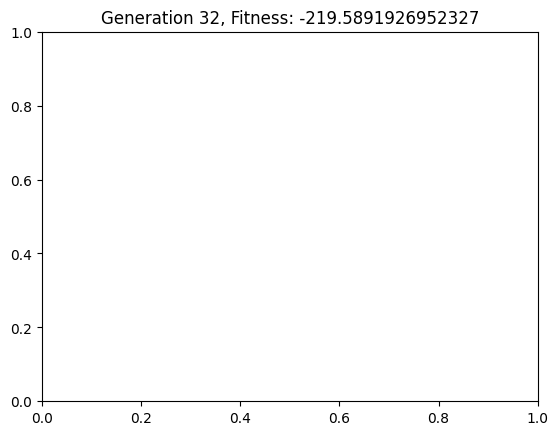

{'rooms': [{'name': 'Living Room', 'position': (55, 52), 'size': (335, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (390, 52), 'size': (356, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (156, 201), 'size': (220, 355)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 129)}], 'fitness': -219.5891926952327}


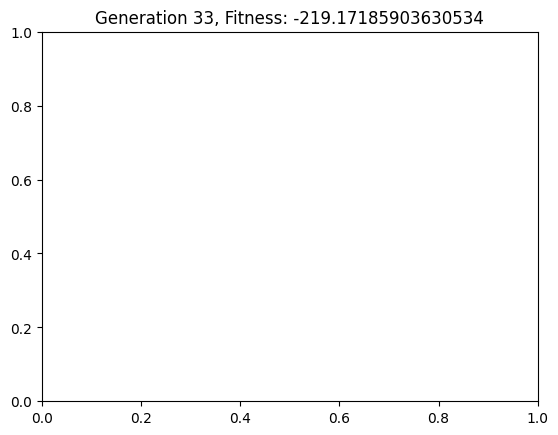

{'rooms': [{'name': 'Living Room', 'position': (50, 52), 'size': (338, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (388, 52), 'size': (359, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (156, 201), 'size': (220, 355)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 138)}], 'fitness': -219.17185903630534}


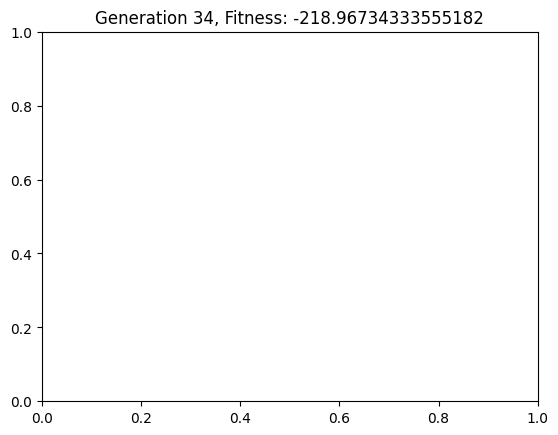

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (155, 201), 'size': (221, 354)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 132)}], 'fitness': -218.96734333555182}


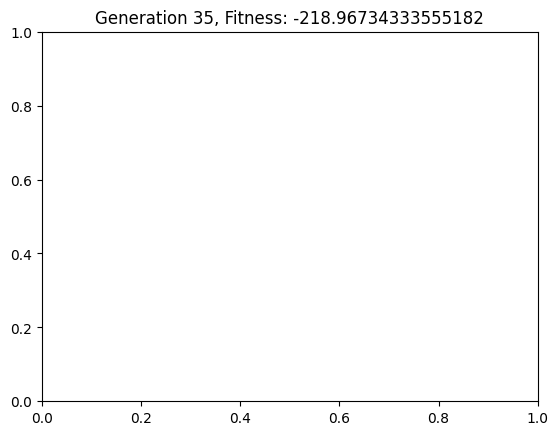

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (154, 201), 'size': (222, 359)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 149)}], 'fitness': -222.22879170522123}


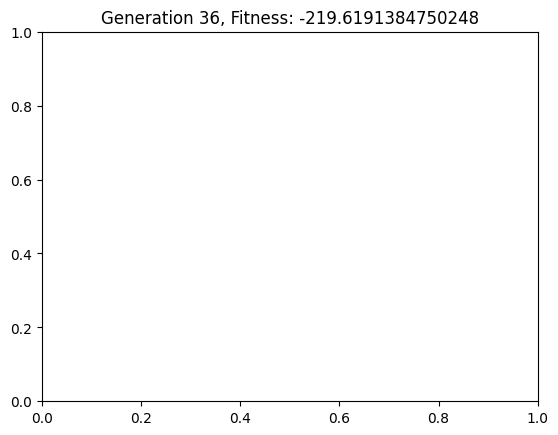

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (153, 200), 'size': (223, 360)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 130)}], 'fitness': -219.6191384750248}


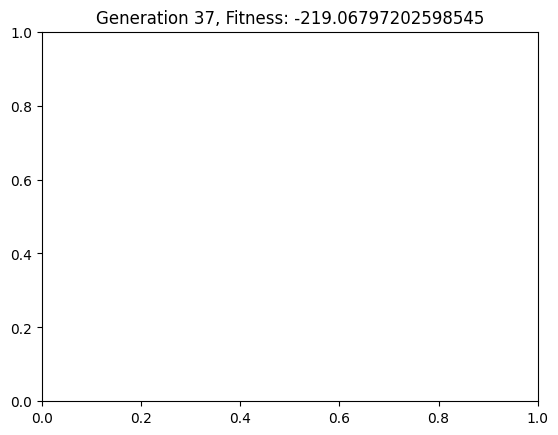

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (152, 200), 'size': (224, 360)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 134)}], 'fitness': -219.06797202598545}


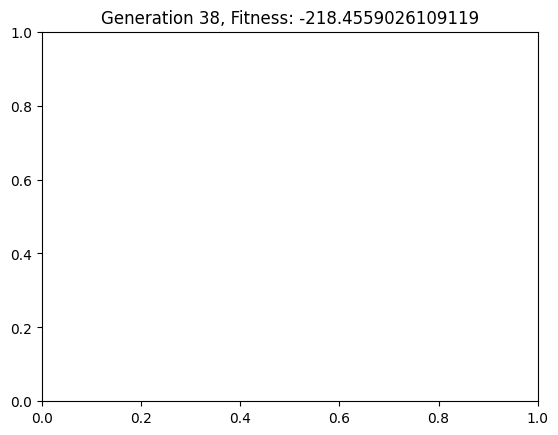

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (152, 200), 'size': (224, 360)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 150)}], 'fitness': -218.4559026109119}


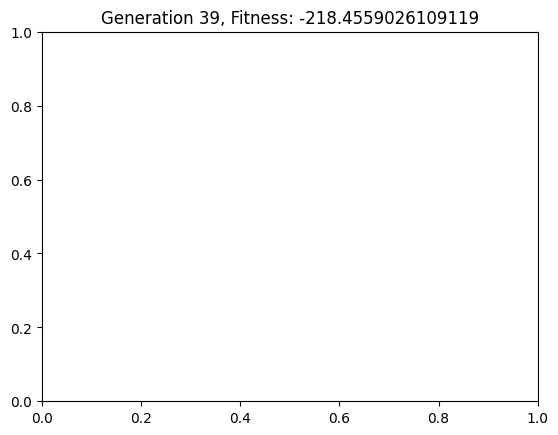

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (152, 200), 'size': (224, 360)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 136)}], 'fitness': -328.7919221469314}


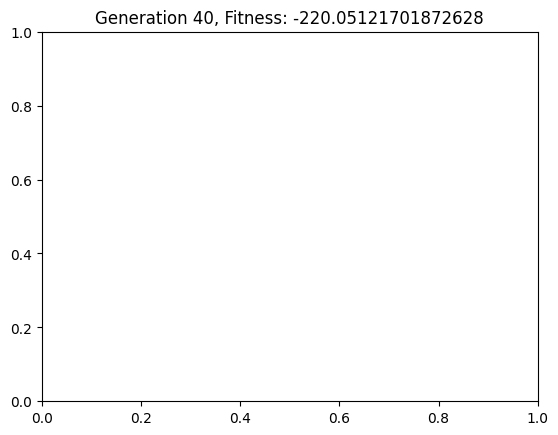

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (152, 200), 'size': (224, 360)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 139)}], 'fitness': -220.05121701872628}


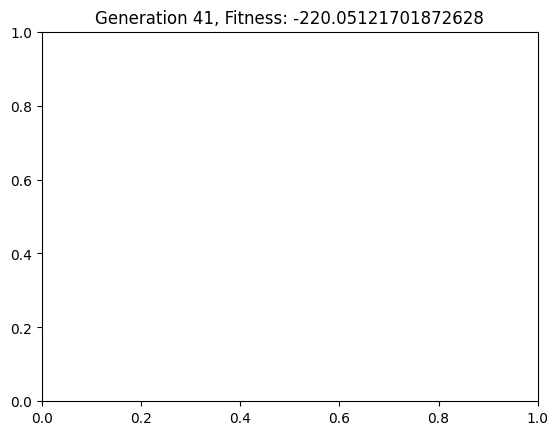

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (152, 200), 'size': (224, 360)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 135)}], 'fitness': -322.0048348936571}


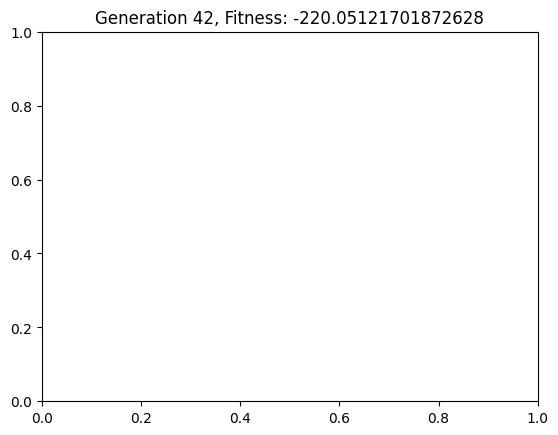

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (152, 200), 'size': (224, 360)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 132)}], 'fitness': -220.05121701872628}


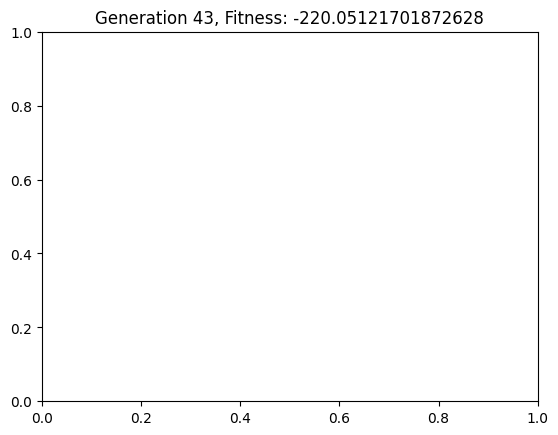

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (152, 200), 'size': (224, 360)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 126)}], 'fitness': -223.09681725182654}


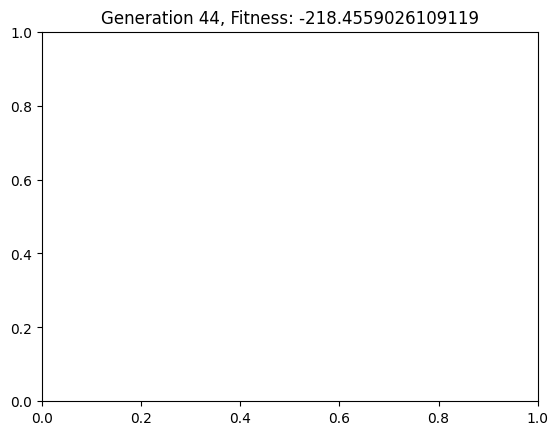

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (152, 200), 'size': (224, 360)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 136)}], 'fitness': -218.4559026109119}


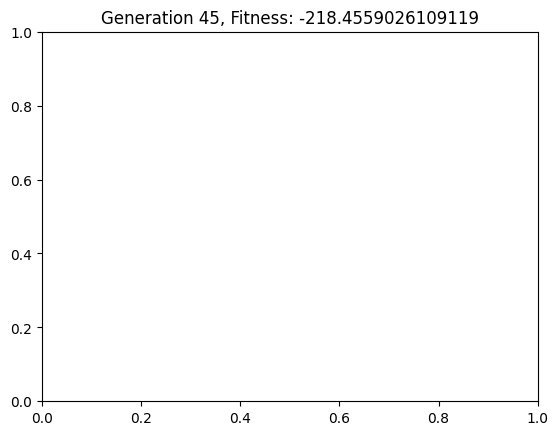

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (152, 200), 'size': (224, 360)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 143)}], 'fitness': -225.96326453003851}


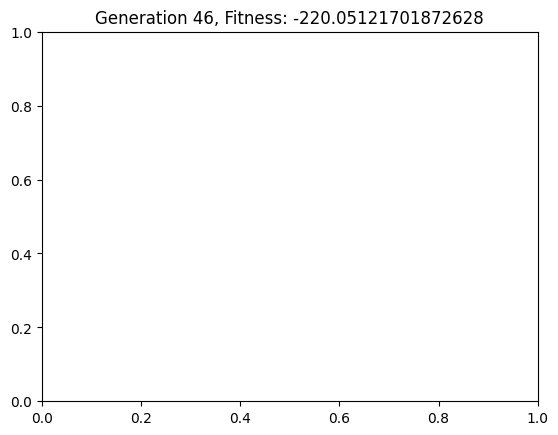

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (152, 200), 'size': (224, 360)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 138)}], 'fitness': -220.05121701872628}


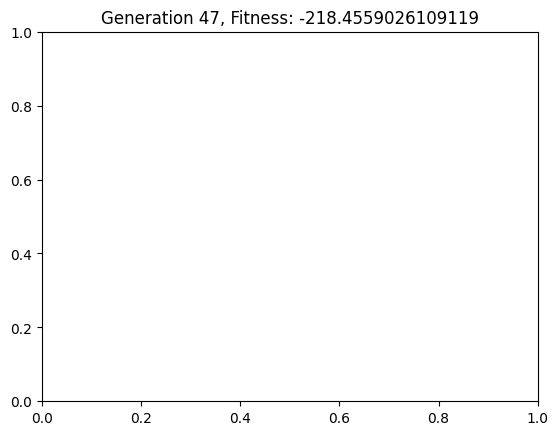

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (152, 200), 'size': (224, 360)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 132)}], 'fitness': -218.4559026109119}


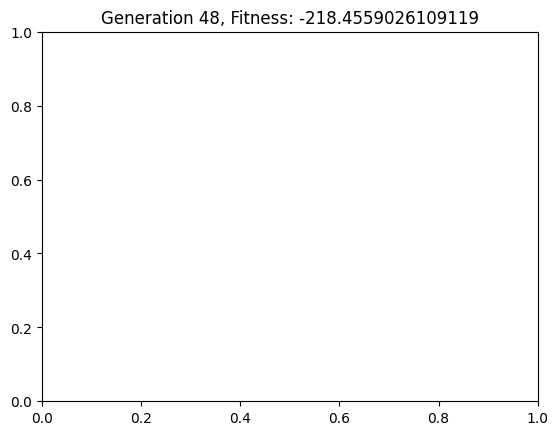

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (152, 200), 'size': (224, 360)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 128)}], 'fitness': -223.09681725182654}


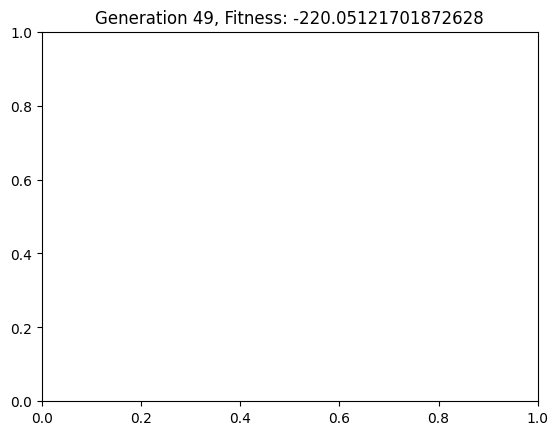

{'rooms': [{'name': 'Living Room', 'position': (48, 52), 'size': (339, 148)}, {'name': 'Bedroom1', 'position': (519, 266), 'size': (228, 294)}, {'name': 'Bedroom2', 'position': (387, 52), 'size': (360, 148)}, {'name': 'Passage', 'position': (376, 200), 'size': (142, 88)}, {'name': 'Kitchen', 'position': (152, 200), 'size': (224, 360)}, {'name': 'Washroom', 'position': (441, 288), 'size': (78, 147)}], 'fitness': -220.05121701872628}
Elapsed time: 1007.18 seconds


<Figure size 640x480 with 0 Axes>

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from shapely.geometry import Polygon
# from test import population as population_final
from input_converter import *
import random
from skimage import measure
global i1
i1 = 0
from pix_array import floorArray
import time
import sys
from numba import jit
import copy


def find_closest_point_brute_force(void_x, void_y,floor_plan,target_rooms=["Kitchen", "Washroom", "Bedroom1"]):
  """
  This function finds the closest point to a given point using a brute force approach.

  Args:
      point: A tuple representing the reference point (x1, y1).
      points: A list of tuples representing points (x2, y2).

  Returns:
      A tuple representing the closest point (x2, y2) and its distance to the reference point.
  """
  closest_point = None
  min_distance = float('inf')  # Initialize with positive infinity
  rooms= floor_plan["rooms"]
  for room in rooms:
    if room["name"] in target_rooms:
    # Calculate distance using distance formula

        distance = ((room['position'][0] - void_x)**2 + (room['position'][1] - void_y)**2)**0.5
        if distance < min_distance:
            min_distance = distance
            closest_point = room["position"]
            room_name = room["name"]

  return closest_point, room_name


class RoomPlanner(object):
    def __init__(self, PLOT_SIZE=(80, 120), MIN_ROOM_SIZE=(10, 10), NUM_BEDROOMS=3,
                 POPULATION_SIZE=80, NUM_GENERATIONS=50, MUTATION_RATE=2,
                 MAX_MUTATION_PERCENTAGE=0.1, SIZE_INCREASE_FACTOR=1,
                 COLLISION_RESOLUTION_STEPS=10, MIN_NUM_ROOMS=2,
                 GRID_SIZE=(10, 10), MIN_AREA=10, path=r"/content/test_plot.png"):
        self.PLOT_SIZE = PLOT_SIZE
        self.MIN_ROOM_SIZE = MIN_ROOM_SIZE
        self.NUM_BEDROOMS = NUM_BEDROOMS
        self.POPULATION_SIZE = POPULATION_SIZE
        self.NUM_GENERATIONS = NUM_GENERATIONS
        self.MUTATION_RATE = MUTATION_RATE
        self.MAX_MUTATION_PERCENTAGE = MAX_MUTATION_PERCENTAGE
        self.SIZE_INCREASE_FACTOR = SIZE_INCREASE_FACTOR
        self.COLLISION_RESOLUTION_STEPS = COLLISION_RESOLUTION_STEPS
        self.MIN_NUM_ROOMS = MIN_NUM_ROOMS
        self.GRID_SIZE = GRID_SIZE
        self.MIN_AREA = MIN_AREA
        self.BEDROOM_SIZE = (10, 10)
        self.MIN_KITCHEN_SIZE = (15,15*1.5)
        self.APPROXIMATION_FACTOR = 0.5
        self.MAX_XY_RATIO = 1.8
        self.MIN_XY_RATIO = 1.5
        self.MIN_LIVING_ROOM_SIZE = (20, 20)
        self.BEDROOM_FACTOR = 0.35
        self.KITCHEN_FACTOR = 0.10
        self.LIVING_ROOM_FACTOR = 0.4
        self.MIN_LIVING_ROOM_SIZE = (45,45)
        # pri_useless_t("gen change")
        # path= "test_plot.png"
        self.floor_plan_array = floorArray(path)
        self.floor_plan_set = set()
        self.PLOT_SIZE = (self.floor_plan_array.shape[1], self.floor_plan_array.shape[0])
        self.path = path
        self.self_neighbours = [[], [], []] # [lr_neig, passage_neig, kitchen_neig, br1_neig, ... , bri_neig]


    def check_overlap(self, position1, size1, position2, size2):
        return (position1[0] < position2[0] + size2[0] and position1[0] + size1[0] > position2[0] and position1[1] < position2[1] + size2[1] and position1[1] + size1[1] > position2[1])

    def generate_initial_population(self, ax, generation, stime):
        population = [] # 1st to last
        array_population = []
        # fit_score = -sys.maxsize - 1
        for _ in range(self.POPULATION_SIZE):
            fp, array_fp = self.generate_random_rooms(ax, generation)
            population.append(fp)
            array_population.append(array_fp)
            # if(fp['fitness']>fit_score):
        mtime = time.time()

        elapsed_time = mtime - stime
        print(f"Elapsed time for initial population generation: {elapsed_time:.2f} seconds")
        return population, array_population





    def generate_random_rooms(self, ax, generation):
        rooms = {'rooms': [], 'fitness': 0}
        room_positions, array_fp = initial_population(self.path)
        try:
            living_room = {'name': 'Living Room', 'position': room_positions['living room']['vertex'], 'size': (room_positions['living room']['length'], room_positions['living room']['breadth'])}
            rooms['rooms'].append(living_room)
        except:
           print("No Living room")
        try:
            passage = {'name': 'Passage', 'position': room_positions['passage']['vertex'], 'size': (room_positions['passage']['length'], room_positions['passage']['breadth'])}
            rooms['rooms'].append(passage)
        except:
           print("No passage")
        try:
            kitchen = {'name': 'Kitchen', 'position': room_positions['kitchen']['vertex'], 'size': (room_positions['kitchen']['length'], room_positions['kitchen']['breadth'])}
            rooms['rooms'].append(kitchen)
        except:
           print("No Kitchen")
        try:
            wc = {'name': 'Washroom', 'position': room_positions['bathroom']['vertex'], 'size': (room_positions['bathroom']['length'], room_positions['bathroom']['breadth'])}
            rooms['rooms'].append(wc)
        except:
           print("No Washroom")
        try:
            bedroom = {'name': 'Bedroom' + str(1), 'position': room_positions['bedroom']['vertex'], 'size': (room_positions['bedroom']['length'], room_positions['bedroom']['breadth'])}
            rooms['rooms'].append(bedroom)
            bedroom = {'name': 'Bedroom' + str(2), 'position': room_positions['bedroom2']['vertex'], 'size': (room_positions['bedroom2']['length'], room_positions['bedroom2']['breadth'])}
            rooms['rooms'].append(bedroom)
        except:
           print("No Bedroom")

        rooms['fitness'] = self.calculate_fitness(rooms['rooms'],ax)
        return rooms, array_fp

    #************************************************************************************************************************************************************************************

    import numpy as np
    from shapely.geometry import Polygon
    import random

    # TODO: VERIFIED
    def get_centroid(self,room):
        x1 = room['position'][0]
        y1 = room['position'][1]
        x2 = room['position'][0] + room['size'][0]
        y2 = room['position'][1]
        x3 = room['position'][0] + room['size'][0]
        y3 = room['position'][1] + room['size'][1]
        x4 = room['position'][0]
        y4 = room['position'][1] + room['size'][1]
        vertices = [(x1, y1), (x2, y2), (x3, y3), (x4, y4)]
        n = len(vertices)
        A = 0
        Cx = 0
        Cy = 0

        for i in range(n):
            x_i, y_i = vertices[i]
            x_ip1, y_ip1 = vertices[(i + 1) % n]
            cross_product = (x_i * y_ip1) - (x_ip1 * y_i)
            A += cross_product
            Cx += (x_i + x_ip1) * cross_product
            Cy += (y_i + y_ip1) * cross_product

        A *= 0.5
        Cx /= (6 * A)
        Cy /= (6 * A)

        return (Cx, Cy)

#************************************************************************************************************************************************************************************

    # TODO: VERIFIED
    def get_total_plot_area(self):
        plot = self.load_plot(r"/content/final_plot.txt")
        plot_vertices = self.find_plot_vertices(plot)
        plot_polygon = Polygon(plot_vertices)
        return plot_polygon.area

    def get_area_fitness(self, room_list):
        """
        # input like [{'name': 'By_laws', 'position": (60.8,
            # 108.8), 'size': (19.2, 11.2)), {'name': 'Living Room', 'position': (12,
            # 71), 'size': (68, 49)}, {'name': 'Passage', 'position': (0, 25), 'size': (12, 81)}, (name: Kitchen, position: (0, 51), size: (12, 25)), {'name': 'Bedroom1', 'position': (12, 12), 'size': (30, 30)}, ('name':
            # 'Washroom', 'position': (32, 32), 'size': (7.5, 7)}]
        """
        area = 0
        for room in room_list:
            # input : {'name': 'Living Room', 'position': (12, 71), 'size': (68, 49)}
            x1 = room['position'][0]
            y1 = room['position'][1]
            x2 = room['position'][0] + room['size'][0]
            y2 = room['position'][1] + room['size'][1]
            coordinates = [(x1, y1), (x2, y1), (x2, y2), (x1, y2)]
            polygon = Polygon(coordinates)
            area = area + polygon.area
        return area / self.get_total_plot_area()

    #************************************************************************************************************************************************************************************

    def get_vertices(self,room):
        x1 = room['position'][0]
        y1 = room['position'][1]
        x2 = room['position'][0] + room['size'][0]
        y2 = room['position'][1]
        x3 = room['position'][0] + room['size'][0]
        y3 = room['position'][1] + room['size'][1]
        x4 = room['position'][0]
        y4 = room['position'][1] + room['size'][1]
        vertices = [(x1, y1), (x2, y2), (x3, y3), (x4, y4)]
        return vertices

    #************************************************************************************************************************************************************************************

    def get_irregularity_for_each_room(self,room_list):

        '''
        input:
        room_list: list of dictionaries containing details of all rooms
        plot_vertices: list of vertices of the plot

        output:
        irregularity: float value representing the irregularity of the room
        '''

        irregularity = 0
        for room in room_list:
            room_centroid = self.get_centroid(room)
            room_vertices = self.get_vertices(room)
            irregularity += self.get_irregularity(room_centroid, room_vertices)
            # bound between 0 and 1
            bounded_irregularity = irregularity / len(room_list)
        return bounded_irregularity


    def get_irregularity(self,room_centroid, room_vertices):

        '''
        input:
        room_centroid: tuple of centroid of the room
        plot_vertices: list of vertices of the plot

        output:
        irregularity: float value representing the irregularity of the room
        '''

        absolute_distances = []
        for vertex in room_vertices:
            distance = np.sqrt((room_centroid[0] - vertex[0])**2 + (room_centroid[1] - vertex[1])**2)
            absolute_distances.append(distance)

        mean_distance = np.mean(absolute_distances)

        irregularity = 0
        for distance in absolute_distances:
            irregularity += np.abs(distance - mean_distance)
        return irregularity

    #************************************************************************************************************************************************************************************

    # TODO : Choose the best way to calculate distance
    def calculate_distance_fitness(self,plot_centroid, figure_centroid):

        distance = np.sqrt((plot_centroid[0] - figure_centroid[0])**2 + (plot_centroid[1] - figure_centroid[1])**2)



        distance_bonus = distance


        # distance_fitness = distance / (plot_x + plot_y)

        # plot_width = self.PLOT_SIZE[0]
        # plot_height = self.PLOT_SIZE[1]
        # corner_preference = 1.0


        # min_x_distance_to_corner = min(figure_x, plot_width - figure_x)
        # min_y_distance_to_corner = min(figure_y, plot_height - figure_y)

        # corner_penalty = 1.0 - (min_x_distance_to_corner + min_y_distance_to_corner) / (plot_width + plot_height)


        # fitness = (1 - corner_preference) * (1 - distance_penalty) + corner_preference * (1 - corner_penalty)

        return distance_bonus



    def calculate_fitness_gradient(distance):
        '''
        Simple linear gradient function to calculate fitness based on distance

        Higher the distance, higher the fitness
        '''
        max_distance = 20


        if distance <= max_distance:
            fitness = distance / max_distance
        else:
            fitness = 0

        return fitness

     #************************************************************************************************************************************************************************************

    def calculate_area(vertices):
        # Calculate area of polygon using shoelace formula
        n = len(vertices)
        area = 0.0
        for i in range(n):
            x1, y1 = vertices[i]
            x2, y2 = vertices[(i + 1) % n]
            area += x1 * y2 - y1 * x2
        return abs(area) / 2.0




    def load_plot(file_path):
        return np.loadtxt(file_path, dtype=int)


    # TODO : VERIFIED
    def find_plot_vertices(self,plot):
        contours = measure.find_contours(plot, level=0.5)
        vertices = []

        # Ensure that the contours are sorted by size in descending order and select the largest contour
        contours = sorted(contours, key=lambda x: len(x), reverse=True)
        largest_contour = contours[0]

        # Convert the contour coordinates to integer and remove duplicates
        for coord in largest_contour:
            x, y = int(coord[1]), int(coord[0])
            if (x, y) not in vertices:
                vertices.append((x, y))

        return vertices

    def get_all_boundary_overlap_penalty(self,room_list, plot_vertices):
        penalty = 0
        for room in room_list:

            room_vertices = self.get_vertices(room)
            penalty += self.get_boundary_overlap_penalty(room_vertices, plot_vertices)
        normalized_penalty = penalty / len(room_list)
        # subtract from 1 to get the fitness
        return 1 - normalized_penalty



    def get_boundary_overlap_penalty(self,room_vertices, plot_vertices):

        '''
        input:
        room_vertices: list of vertices of the room
        plot_vertices: list of vertices of the plot

        output:
        boundary_overlap_penalty: float value representing the boundary overlap penalty
        '''
        # transfrom room vertices to polygon

        boundary_overlap_penalty = 0

        room_polygon = Polygon(room_vertices)
        plot_polygon = Polygon(plot_vertices)

        room_area = room_polygon.area
        plot_area = plot_polygon.area


        intersection_area = room_polygon.intersection(plot_polygon).area


        if room_area == intersection_area:
            boundary_overlap_penalty = 0.0
        else:

            area_outside_plot = room_area - intersection_area


            boundary_overlap_penalty = area_outside_plot / room_area

        return boundary_overlap_penalty

    #************************************************************************************************************************************************************************************

    def check_every_connection(self,room_list,reference_connection_matrix):

            '''
            input:
            room_list: list of dictionaries containing details of all rooms

            output:
            connection: boolean value representing whether all rooms are connected
            '''

            fitness = 100

            for i in range(len(room_list)):
                for j in range(i + 1, len(room_list)):
                    if not self.check_connection(room_list[i], room_list[j], reference_connection_matrix):
                        fitness -= 1

            return fitness / 100

    def check_connection(self, room1, room2, reference_connection_matrix):
        '''
        input:
        room1: dictionary containing details of room1
        room2: dictionary containing details of room2
        reference_connection_matrix: the connection matrix indicating connections between rooms
        rooms: list of room names

        output:
        connection: boolean value representing whether room1 and room2 are connected
        '''

        room1_name = room1["name"]
        room2_name = room2["name"]

        if room1_name == room2_name:
            return True

        try:
            room1_index = rooms.index(room1_name)
            room2_index = rooms.index(room2_name)
        except:
            return False

        # Check connection in both ways: room1 to room2 and room2 to room1
        if reference_connection_matrix[room1_index][room2_index] == 1 or reference_connection_matrix[room2_index][room1_index] == 1:
            return True

        return False

    #************************************************************************************************************************************************************************************

        # Perfect aspect ratios for each room type
    perfect_aspect_ratios = {
        "living room": random.uniform(1.4,1.8),
        "passage": random.uniform(1.6,2),
        "kitchen": random.uniform(1.6,2),
        "bathroom":random.uniform(1.6,2),
        "bedroom1": random.uniform(1.6,2)
    }

    def calculate_aspect_ratio(self,length, breadth):
        if length == 0 or breadth == 0:
            return 0
        return max(length / breadth, breadth / length)


    def get_skewness(self,room_list):
        fitness = 0
        for room in room_list:
            room_name = room["name"].lower()
            length, breadth = room["size"]
            aspect_ratio = self.calculate_aspect_ratio(length, breadth)

            if room_name in self.perfect_aspect_ratios:
                perfect_ratio = self.perfect_aspect_ratios[room_name]
                deviation = abs(aspect_ratio - perfect_ratio)
                fitness += 1 / (1 + deviation)

        return fitness / len(room_list)

    #************************************************************************************************************************************************************************************

    def calculate_room_center(self,position, size):
        x, y = position
        length, breadth = size
        center_x = x + length / 2
        center_y = y + breadth / 2
        return center_x, center_y

    # @jit(nopython=True)
    def calculate_distance(self,point1, point2):
        return np.sqrt((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2)

    def fitness_function_distribution(self,room_list, plot_centroid):
        distances = []
        for room in room_list:
            room_center = self.calculate_room_center(room["position"], room["size"])
            distance = self.calculate_distance(room_center, plot_centroid)
            distances.append(distance)

        # Calculate the standard deviation of distances
        std_distance = np.std(distances)

        # more distributed the rooms, higher the fitness
        # more dispersed the rooms, higher the fitness
        fitness = 1 / (1 + std_distance)



    #************************************************************************************************************************************************************************************

    def get_slopes(self,room1,room2,room_list):
        # room = {"name": "Living Room", "position": (0, 0), "size": (0, 1)}
        # room_list = [{"name": "Living Room", "position": (0, 0), "size": (0, 1)}, {"name": "Bedroom1", "position": (0, 0), "size": (0, 1)}]
        room1_x = room1['position'][0]
        room1_y = room1['position'][1]
        room1_width = room1['size'][0]
        room1_height = room1['size'][1]

        coords1 = [(room1_x, room1_y), (room1_x + room1_width, room1_y), (room1_x + room1_width, room1_y + room1_height), (room1_x, room1_y + room1_height)]

        if room2 == room1:
            return [0, 0, 0, 0]




        room_slopes1 = [(coords1[1][1] - coords1[0][1]) / (coords1[1][0] - coords1[0][0]), (coords1[2][1] - coords1[1][1]) / (coords1[2][0] - coords1[1][0]), (coords1[3][1] - coords1[2][1]) / (coords1[3][0] - coords1[2][0]), (coords1[0][1] - coords1[3][1]) / (coords1[0][0] - coords1[3][0])]

        return room_slopes1


    def slant_fitness(self,room_list):
        irregularity = 0
        for room in room_list:
            room_slopes = self.get_slopes(room,room,room_list)
            for i in range(4):
                if room_slopes[i] != 1 or room_slopes[i] != -1 or room_slopes[i] != 0:
                    irregularity += 1
        return 4*len(room_list) - irregularity

    #************************************************************************************************************************************************************************************'

    def load_plot(self,file_path):
        return np.loadtxt(file_path)

    def find_plot_centroid(self,plot):
        non_zero_coords = np.argwhere(plot > 0)
        centroid = np.mean(non_zero_coords, axis=0)
        return centroid

    #************************************************************************************************************************************************************************************

    def calculate_room_area(self,size):
        """Calculate the area of a room given its size (width, height)."""
        return size[0] * size[1]

    def fitness_function_size_comparison(self,room_list):
        """
        Calculate a fitness score based on the sizes of rooms.

        Args:
            room_list (list of dicts): Each dict contains 'name', 'position', and 'size' of a room.

        Returns:
            float: Fitness score.
        """
        # Initialize room areas
        room_areas = {}
        for room in room_list:
            room_name = room["name"]
            room_area = self.calculate_room_area(room["size"])
            room_areas[room_name] = room_area

        # Assign weights to size relationships
        living_room_weight = 1.5
        bedroom_weight = 1.4
        kitchen_weight = 1.0
        passage_weight = 1.0
        wc_weight = 0.3

        # Calculate size relationships
        fitness = 0.0
        # lr/bed = 1.2-1.8
        # lr/kitchen = 1.8-2.4
        # lr/bath= 4.7-5.3
        lr_bed = room_areas["Living Room"]/room_areas["Bedroom1"]
        lr_kitchen= room_areas["Living Room"]/room_areas["Kitchen"]
        lr_bathroom= room_areas["Living Room"]/room_areas["Washroom"]
        if((lr_bed>1.2) and (lr_bed<1.8)):
            fitness+= lr_bed/1.5
        elif(lr_bed<1.2):
            fitness += (lr_bed-1.2)/1.5
        else:
            fitness+= (1.8-lr_bed)/1.5

        if((lr_kitchen>1.8) and (lr_kitchen<2.4)):
            fitness+= lr_kitchen/2.1
        elif(lr_kitchen<1.8):
            fitness += (lr_kitchen-1.8)/2.1
        else:
            fitness+= (2.4-lr_kitchen)/2.1

        if((lr_bathroom>4.7) and (lr_bathroom<5.3)):
            fitness+= lr_bathroom/5.0
        elif(lr_bathroom<4.7):
            fitness += (lr_bathroom-4.7)/5.0
        else:
            fitness+= (5.3-lr_bathroom)/5.0


        # if room_areas["Living Room"] > room_areas["Passage"]:
        #     fitness += living_room_weight
        # if room_areas["Living Room"] > room_areas["Washroom"]:
        #     fitness += living_room_weight
        # if room_areas["Bedroom1"] > room_areas["Passage"]:
        #     fitness += bedroom_weight
        # if room_areas["Bedroom1"] > room_areas["Washroom"]:
        #     fitness += bedroom_weight
        # if room_areas["Kitchen"] > room_areas["Passage"] and room_areas["Kitchen"] < room_areas["Living Room"]:
        #     fitness += kitchen_weight
        # if room_areas["Kitchen"] > room_areas["Washroom"] and room_areas["Kitchen"] < room_areas["Bedroom1"]:
        #     fitness += kitchen_weight

        # Normalize fitness score (optional)
        # max_fitness = 2 * (living_room_weight + bedroom_weight + kitchen_weight)
        # fitness_normalized = fitness / max_fitness

        return fitness

    #************************************************************************************************************************************************************************************

    def calculate_fitness(self, room_list,ax=0):


        plot_path = r"/content/final_plot.txt"


        plot = self.load_plot(plot_path)

        plot_centroid = self.find_plot_centroid(plot)

        # # Calculate the fitness of the room distribution
        # distribution_fitness = self.fitness_function_distribution(room_list, plot_centroid)

        # Calculate the fitness of the room aspect ratios
        skewness_fitness = self.get_skewness(room_list)

        # Calculate the fitness of the room irregularity
        # slant_fitness = self.slant_fitness(room_list)

        # plot_vertices = self.find_plot_vertices(plot)

        # Calculate the fitness of the room boundary overlap
        # boundary_overlap_penalty = self.get_all_boundary_overlap_penalty(room_list, plot_vertices)

        size_comparison_fitness = self.fitness_function_size_comparison(room_list)

        # Calculate the fitness of the room connection

#         reference_connection_matrix = np.array([[0, 1, 1, 1, 1],
# [1, 0, 0, 0, 0],
# [1, 0, 0, 0, 0],
# [1, 0, 0, 0, 0],
# [1, 0, 0, 0, 0]]
# )
        # connection_fitness = self.check_every_connection(room_list,reference_connection_matrix)

        # Calculate the fitness of the room area

        area_fitness = self.calculate_area_fitness(room_list,ax,0)

        # Calculate the fitness of the room irregularity
        # irregularity_fitness = self.get_irregularity_for_each_room(room_list)

        # Calculate the fitness of the room distance from the plot centroid
        distance_fitness = self.calculate_distance_fitness(plot_centroid, self.get_centroid(room_list[0]))



        # print("skewness_fitness",50*skewness_fitness)
        # print("area_fitness",area_fitness//100000)
        # print("distance_fitness",distance_fitness)
        # print("size_comparison_fitness",100*size_comparison_fitness)

        master_fitness = 50*skewness_fitness + area_fitness//10000 - distance_fitness + 100*size_comparison_fitness

        return master_fitness

    #************************************************************************************************************************************************************************************
    # @jit(nopython=True)
    def room_array_label(self, name):
        # pri_useless_t(name)
        if(name[0:7]=="Living "):
            return 2
        elif(name[0:7]=="Bedroom"):
            return 6
        elif(name[0:7]=="Kitchen"):
            return 4
        elif name[0:7]=="Passage":
            return 3
        elif(name[0:7]=="Washroo"):
            return 5

    # @jit(nopython=True)
    def mark_in_room(self, population):
        for room in population['rooms']:
            pos = room['position']
            end_pos = (pos[0]+room['size'][0], pos[1]+room['size'][1])
            label = self.room_array_label(room['name'])
            self.mark_occupy(pos, end_pos, label)

    #@jit(nopython=True)
    def mark_occupy(self, position, end, label):
        for i in range(int(position[0]), int(end[0]+1)):
            for j in range(int(position[1]), int(end[1]+1)):
                self.floor_plan_array[i][j] = label
                if (i, j) in self.floor_plan_set:
                    self.floor_plan_set.remove((i, j))

    def get_index_for_neighbours(self, name):
        if name=="living_room":
            return 0
        if name=="passage":
            return 1
        if name=="kitchen":
            return 2
        # for i in range(1, NUM_BEDROOMS+1):
        if name[0:7]=="bedroom":
            return 2+int(name[7])
        else:
           #print_proxy("Room impossible")
            assert 0

    def check_side(self, side, neighbor_position, neighbor_size, kitchen_size):
        if side == 'left'  :
            return neighbor_position[0] - kitchen_size[0] >= 0
        elif side == 'right':
            return neighbor_position[0] + neighbor_size[0] + kitchen_size[0] <= self.PLOT_SIZE[0]
        elif side == 'top':
            return neighbor_position[1] + neighbor_size[1] + kitchen_size[1] <= self.PLOT_SIZE[1]
        elif side == 'bottom':
            return neighbor_position[1] - kitchen_size[1] >= 0
        return False

    def get_indexing(self, floor_plan):
        # pri_useless_t(floor_plan)
        if floor_plan['name']=='Living Room':
            return 1
        elif floor_plan['name']=='Bedroom1':
            return 3
        # elif floor_plan['name']=='Bedroom2':
        #     return 4
        elif floor_plan['name']=='Passage':
            return 0
        elif floor_plan['name']=='Kitchen':
            return 2
        elif floor_plan['name']=='Washroom':
            return 4
        # elif floor_plan['name']=='Washroom2':
        #     return 6
        else:
            # pri_useless_t(floor_plan['name'])
            return 7

    def position_to_index(self, floor_plan, i, j):
        for room in floor_plan:
            if room:
                x, y= room['position']
                w, h = room['size']
                if x<=i<=x+w and y<=j<=y+h:
                    return self.get_indexing(room)
        return 7
        # pri_useless_t(i)
        # pri_useless_t(j)
    #@jit(nopython=True)
    def convert_to_grid(self, floor_plan):
        grid = [[8] * (self.PLOT_SIZE[0]+1) for _ in range(self.PLOT_SIZE[1]+1)]
        # pri_useless_t()
        # pri_useless_t(len(grid))
        # pri_useless_t()
        for room in floor_plan:
            if room:
                x, y= room['position']
                x=int(x)
                y=int(y)
                w, h = room['size']
                w=int(w)
                h=int(h)
                # pri_useless_t(room["name"])
                # pri_useless_t(x)
                # pri_useless_t(x+w)
                for i in range(x, x+w):
                    # pri_useless_t(room['name'])
                    # pri_useless_t(y)
                    # pri_useless_t(y+h)
                    for j in range(y, y+h):
                        # pri_useless_t(i)
                        # pri_useless_t(j)
                        if j<=self.PLOT_SIZE[1] and i<=self.PLOT_SIZE[0]:
                            grid[j][i]=self.get_indexing(room)
        # pri_useless_t(grid)
        return grid

    # @jit(nopython=True)
    def grid_to_graph(self, floor_plan):
        map = [[0] * 5 for _ in range(5)]
        for room in floor_plan:
            if room:
                x, y= room['position']
                w, h = room['size']
                x=x-1
                if x>=0:
                    for j in range(int(y), int(y+h+1)):
                        if j<=y+h and self.get_indexing(room)<5 and j<=self.PLOT_SIZE[1] and x<=self.PLOT_SIZE[0] and self.position_to_index(floor_plan, x, j)<5:
                            map[self.get_indexing(room)][self.position_to_index(floor_plan, x, j)]=1
                x, y= room['position']
                y=y-1
                if y>=0:
                    for i in range(int(x), int(x+w+1)):
                        if i<=x+w and self.get_indexing(room)<5 and y<=self.PLOT_SIZE[1] and i<=self.PLOT_SIZE[0] and self.position_to_index(floor_plan, i, y)<5:
                            map[self.get_indexing(room)][self.position_to_index(floor_plan, i, y)]=1
                w=w+1
                h=h
                x=room['position'][0]
                y=room['position'][1]
                if x+w<=self.PLOT_SIZE[0]:
                    for j in range(int(y),int(y+h+1)):
                        # pri_useless_t(j)
                        # pri_useless_t(self.get_indexing(room))
                        # pri_useless_t(grid[j][x])
                        # pri_useless_t("aaaaaaaaaa")
                        if j<=y+h and self.get_indexing(room)<5 and j<=self.PLOT_SIZE[1] and x+w<=self.PLOT_SIZE[0] and self.position_to_index(floor_plan, x+w, j)<5:
                            map[self.get_indexing(room)][self.position_to_index(floor_plan, x+w, j)]=1
                w, h = room['size']
                h=h+1
                x=room['position'][0]
                y=room['position'][1]
                if y+h<=self.PLOT_SIZE[1]:
                    for i in range(int(x),int(x+w+1)):
                        # pri_useless_t(i)
                        # pri_useless_t("aaaaaaabbb")
                        if i<=x+w and self.get_indexing(room)<5 and y+h<=self.PLOT_SIZE[1] and i<=self.PLOT_SIZE[0] and self.position_to_index(floor_plan, i, y+h)<5:
                            map[self.get_indexing(room)][self.position_to_index(floor_plan, i, y+h)]=1
        return map

    #@jit(nopython=True)
    def check_within_shape(self, start_x, start_y, end_x, end_y):
        for x in range(int(start_x), int(end_x+1)):
            for y in range(int(start_y), int(end_y+1)):
                if self.floor_plan_array[y][x]==0:
                    return False
        return True


    #@jit(nopython=True)
    def calculate_area_fitness(self, floor_plan, ax, generation):
        # total_fitness = 0
        # pri_useless_t("a")
        # pri_useless_t(floor_plan)
        if type(floor_plan)==dict:
            i=floor_plan['fitness']
            floor_plan=floor_plan['rooms']
        # # Check if all rectangles fit within the plot

        # Check for overlapping rectangles
        overlap_area=0
        for i, rect1 in enumerate(floor_plan):
            for j, rect2 in enumerate(floor_plan):
                if i != j and rect1 and rect2:
                    # x1, y1, w1, h1 = rect1
                    # pri_useless_t("aaa")
                    x1, y1= rect1['position']
                    w1, h1 = rect1['size']
                    # x2, y2, w2, h2 = rect2
                   #print_proxy(floor_plan)
                    x2, y2= rect2['position']
                    w2, h2 = rect2['size']
                    # if not (x1 + w1 <= x2 or x2 + w2 <= x1 or y1 + h1 <= y2 or y2 + h2 <= y1):
                    #     # Penalize if rectangles overlap
                    #     return -1e6  # Return a very low fitness value
                    x_dist = (min(x1+w1, x2+w2) -max(x1,x2))
                    y_dist = (min(y1+h1, y2+h2) -max(y1, y2))
                    if x_dist<=0 or y_dist<=0:
                        continue
                    ar=x_dist*y_dist
                    # if ar==w1*h1:
                    #     return -100
                    # if ar==w2*h2:
                    #     return -100
                    overlap_area+=ar
        # if overlap_area>0:
        #     return -overlap_area


        # Calculate total area covered by rectangles
        total_area_covered=0
        # pri_useless_t("kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkk")
        # pri_useless_t(overlap_area)
        # pri_useless_t()
        for rect in floor_plan:
            if rect:
                x, y= rect['position']
                w, h = rect['size']
                total_area_covered += w * h
        # Calculate total area of the plot
        plot_area = self.PLOT_SIZE[0] * self.PLOT_SIZE[1]

        # Reward solutions that cover the entire plot without overlap
        total_area = 1*total_area_covered - 1000*overlap_area

        for rect in floor_plan:
            if rect:
                x, y= rect['position']
                width, height = rect['size']
                if x < 0 or y < 0 or x + width > self.PLOT_SIZE[0] or y + height > self.PLOT_SIZE[1]:
                    # Penalize if any rectangle is outside the plot
                    total_area -=10000  # Return a very low fitness value

        # return total_fitness

        # grid = [[0] * (self.PLOT_SIZE[0]+1) for _ in range(self.PLOT_SIZE[1]+1)]

        # # Iterate through each rectangle and mark the grid cells covered by it
        # # pri_useless_t(type(floor_plan))
        # if type(floor_plan)==dict:
        #     floor_plan=floor_plan['rooms']
        # for rect in floor_plan:
        #     # x, y, width, height = rect
        #     # pri_useless_t(rect)
        #     x, y= rect['position']
        #     width, height = rect['size']
        #     for i in range(x, x + width):
        #         for j in range(y, y + height):
        #             # Check if the grid cell is within the plot boundaries
        #             if 0 <= i <= self.PLOT_SIZE[0] and 0 <= j <= self.PLOT_SIZE[1]:
        #                 grid[j][i] += 1  # Increment the count of rectangles covering this grid cell

        # # Calculate the total area occupied by rectangles, considering intersections
        # total_area = 0
        # for row in grid:
        #     for cell in row:
        #         # If a grid cell is covered by more than one rectangle, count it only once
        #         if cell > 0:
        #             total_area += 1
        #         if cell >1:
        #             # pri_useless_t("aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaallllllllllllllllllllllllllllll")
        #             total_area-=1000
        # pri_useless_t()
        # pri_useless_t(grid)
        # pri_useless_t()

        # grid=self.convert_to_grid(floor_plan)
        map = self.grid_to_graph(floor_plan)
        # pri_useless_t(map)
        # pri_useless_t(matrix1)
        # assert 0

        for i in range(0, len(matrix1[0])):
            if matrix1[0][i]==1:
                if map[0][i]==1:
                    # return 0
                    are=self.get_room_area(i, floor_plan)
                    # if are==self.PLOT_SIZE[0]*self.PLOT_SIZE[1]:
                    #    total_area-=10000*self.get_room_area(i, floor_plan)
                    # else:
                    #     total_area+=1*are
            # if matrix[0][i]==1:
                else:
                    # return 0
                    # pri_useless_t(i)
                    are=self.get_room_area(i, floor_plan)
                    total_area-=10000*are
        # if map[3][4]!=1:
        #     total_area-=10000*self.get_room_area(5, floor_plan)
            # else:
            #     if map[0][i]==0:
            #         # return 0
            #         total_area+=1*self.get_room_area(i, floor_plan)
            # # if matrix[0][i]==1:
            #     else:
            #         # return 0
            #        #print_proxy(i)
            #         total_area-=1000*self.get_room_area(i, floor_plan)
        # for room in floor_plan:
        #     if room['name']=='Kitchen':
        #         if room['size'][1]/room['size'][0]!=1.5:
        #             total_area-=10000

        # pri_useless_t("llllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllllll")
        # pri_useless_t()
        # pri_useless_t(total_area)
        # pri_useless_t()
        # try:
        #     self.update_plot1(floor_plan, total_area, ax, 69999999999)
        #     plt.pause(0.1)
        #     plt.draw()
        # except:
        #     self.update_plot1(floor_plan, total_area, ax, generation)
        #     plt.pause(0.1)
        #     plt.draw()
        # for room in floor_plan:
        #     if not self.check_within_shape(room['position'][0], room['position'][1], room['position'][0]+room['size'][0], room['position'][1]+room['size'][1]):
        #         are=room['size'][0]*room['size'][1]
        #         total_area-=1000*are

        return total_area

    #@jit(nopython=True)
    def get_room_area(self, i, floor_plan):
        if i==0:
            name='Passage'
        elif i==1:
            name='Living Room'
        elif i==2:
            name='Kitchen'
        elif i==3:
            name='Bedroom1'
        elif i==4:
            name='Bedroom2'
        elif i==5:
            name='Washroom'
        elif i==6:
            name='Washroom2'
        else:
            name='door'
        # pri_useless_t(name)
        # pri_useless_t(floor_plan)
        for room in floor_plan:
            if room and room['name']==name:
                return room['size'][0]*room['size'][1]
        return self.PLOT_SIZE[0]*self.PLOT_SIZE[1]

    def overlap_area(self, room1, room2):
        x_overlap = max(0, min(room1['position'][0] + room1['size'][0], room2['position'][0] + room2['size'][0]) - max(room1['position'][0], room2['position'][0]))
        y_overlap = max(0, min(room1['position'][1] + room1['size'][1], room2['position'][1] + room2['size'][1]) - max(room1['position'][1], room2['position'][1]))
        return x_overlap * y_overlap

    #@jit(nopython=True)
    def calculate_area_fitness_for_crossover(self, floor_plan):
        total_area = 0
        # floor_plan  = {'rooms': [{'name': 'Living Room', 'position': (5, 61), 'size': (45, 39)}, {'name': 'Passage', 'position': (0, 61), 'size': (5, 33)}, {'name': 'door', 'position': (50, 100), 'size': (-5, -5)}], 'fitness': 1945}
        # pri_useless_t("This FP" + str(floor_plan))
        # pri_useless_t("This FP" + str(floor_plan['rooms']))

        for room in floor_plan['rooms']:
            # pri_useless_t("This room" + str(room))
            if room:
                total_area += room['size'][0] * room['size'][1]

        # pri_useless_t("This total area" + str(total_area))
        return total_area


    #@jit(nopython=True)
    def crossover(self, parenti, parentj, ax, generation):
        # # change the logic
        # parent1 = []
        # parent1.append(paren1)
        # parent2 = []
        # parent2.append(paren2)
        # pri_useless_t("This parent1" + str(parent1))
        parent1=parenti.copy()
        parent2=parentj.copy()
        offspring1 = {'rooms': [], 'fitness': self.calculate_fitness(parent1['rooms'],ax)}
        offspring2 = {'rooms': [], 'fitness': self.calculate_fitness(parent2['rooms'],ax)}
        # for room in parent1['rooms']:
        #     if np.random.rand() < 0.5:
        #         offspring1['rooms'].append(room)
        #         offspring1['fitness'] = self.calculate_area_fitness(offspring1['rooms'])
        #     else:
        #         offspring2['rooms'].append(room)
        #         offspring2['fitness'] = self.calculate_area_fitness(offspring2['rooms'])
        # for room in parent2['rooms']:
        #     if np.random.rand() > 0.5:
        #         offspring1['rooms'].append(room)
        #         offspring1['fitness'] = self.calculate_area_fitness(offspring1['rooms'])
        #     else:
        #         offspring2['rooms'].append(room)
        #         offspring2['fitness'] = self.calculate_area_fitness(offspring2['rooms'])
        all_rooms=['Living room', 'Bedroom', 'Passage', 'Kitchen', 'Washroom', 'door']
        # for room in parent1['rooms']:
        #     if np.random.rand() < 0.5:
        #         block=0
        #         for room_child in offspring1['rooms']:
        #             if room_child['name']==room['name']:
        #                 block=1
        #         if block==0:
        #             offspring1['rooms'].append(room)
        #     else:
        #         block=0
        #         for room_child in offspring2['rooms']:
        #             if room_child['name']==room['name']:
        #                 block=1
        #         if block==0:
        #             offspring2['rooms'].append(room)
        # for room in parent2['rooms']:
        #     if np.random.rand() > 0.5:
        #         block=0
        #         for room_child in offspring1['rooms']:
        #             if room_child['name']==room['name']:
        #                 block=1
        #         if block==0:
        #             offspring1['rooms'].append(room)
        #     else:
        #         block=0
        #         for room_child in offspring2['rooms']:
        #             if room_child['name']==room['name']:
        #                 block=1
        #         if block==0:
        #             offspring2['rooms'].append(room)
        for room_name in all_rooms:
            # if np.random.rand() < 0.5:
            if np.random.uniform(0, 5)>=2.5:
                for room in parent1['rooms']:
                    if room is None:
                        continue
                    if(room['name'][0:7]==room_name[0:7]):
                        offspring1['rooms'].append(room)
                for room in parent2['rooms']:
                    if room is None:
                        continue
                    if(room['name'][0:7]==room_name[0:7]):
                        offspring2['rooms'].append(room)
            else:
                for room in parent2['rooms']:
                    if room is None:
                        continue
                    if(room['name'][0:7]==room_name[0:7]):
                        offspring1['rooms'].append(room)
                for room in parent1['rooms']:
                    if room is None:
                        continue
                    if(room['name'][0:7]==room_name[0:7]):

                        offspring2['rooms'].append(room)
        # for room_name in all_rooms:
        #     if np.random.rand() < 0.5:
        #         for room in parent1['rooms']:
        #             if room is None:
        #                 continue
        #             if(room['name'][0:7]==room_name[0:7]):

        #                 offspring2['rooms'].append(room)
        #     else:
        #         for room in parent2['rooms']:
        #             if room is None:
        #                 continue
        #             if(room['name'][0:7]==room_name[0:7]):
        #                 offspring2['rooms'].append(room)
        # if len(offspring1['rooms']) != len(parent1['rooms']) or len(offspring2['rooms']) != len(parent2['rooms']):
        #     self.crossover(parent1, parent2, ax)
        offspring1['fitness']=self.calculate_fitness(offspring1['rooms'])
        offspring2['fitness']=self.calculate_fitness(offspring2['rooms'])

        # self.update_plot(offspring2, ax, 699999999)
        # plt.pause(0.1)
        # plt.draw()


        return offspring1, offspring2

    #@jit(nopython=True)
    def get_factor(self, name):
        if(name[0:7]=="Living "):
            return 1
        elif(name[0:7]=="Bedroom"):
            return 0.5
        elif(name[0:7]=="Kitchen"):
            return 0.4
        elif name[0:7]=="Passage":
            return 0.15
        elif(name[0:7]=="Washroo"):
            return 0.1

    def resolv(self, room1, room2):
        x_diff = min(room1['position'][0]+room1['size'][0], room2['position'][0]+room2['size'][0])-max(room1['position'][0], room2['position'][0])
        y_diff = min(room1['position'][1]+room1['size'][1], room2['position'][1]+room2['size'][1])-max(room1['position'][1], room2['position'][1])
        if room2['position'][0]<room1['position'][0]:
            room2['size']=(room2['size'][0]-x_diff, room2['size'][1])
        elif room2['position'][0]>room1['position'][0]:
            room1['size']=(room1['size'][0]-x_diff, room1['size'][1])
        if room2['position'][1]<room1['position'][1]:
            room2['size']=(room2['size'][0], room2['size'][1]-y_diff)
        elif room2['position'][1]>room1['position'][1]:
            room1['size']=(room1['size'][0], room1['size'][1]-y_diff)
        return room1, room2

    def resolving(self, roomi, roomj):
        room1=roomi.copy()
        room2=roomj.copy()
        if room1['name']=='door' or room2['name']=='door':
            return room1, room2
        x_diff = min(room1['position'][0]+room1['size'][0], room2['position'][0]+room2['size'][0])-max(room1['position'][0], room2['position'][0])
        y_diff = min(room1['position'][1]+room1['size'][1], room2['position'][1]+room2['size'][1])-max(room1['position'][1], room2['position'][1])
       #print_proxy(room1)
       #print_proxy(x_diff)
       #print_proxy(y_diff)
       #print_proxy(room2)

        # if x_diff==room1['size'][0]:
        #     room1['position']= (np.random.randint(0, self.PLOT_SIZE[0]-room1['size'][0]), room1['position'][1])
        #     return room1, room2
        # elif x_diff==room2['size'][0]:
        #     room2['position'] = (np.random.randint(0, self.PLOT_SIZE[0]-room2['size'][0]), room2['position'][1])
        #     return room1, room2
        # if y_diff==room1['size'][1]:
        #     room1['position']= (room1['position'][0], np.random.randint(0, self.PLOT_SIZE[0]-room1['size'][1]))
        #     return room1, room2
        # elif x_diff==room2['size'][1]:
        #     room2['position'] = (room2['position'][0],np.random.randint(0, self.PLOT_SIZE[0]-room2['size'][1]))
        #     return room1, room2

        # if room2['position'][0]<room1['position'][0]:
        #     room2['size']=(room2['size'][0]-x_diff, room2['size'][1])
        # elif room2['position'][0]>room1['position'][0]:
        #     room1['size']=(room1['size'][0]-x_diff, room1['size'][1])
        # elif room2['position'][1]<room1['position'][1]:
        #     room2['size']=(room2['size'][0], room2['size'][1]-y_diff)
        # elif room2['position'][1]>room1['position'][1]:
        #     room1['size']=(room1['size'][0], room1['size'][1]-y_diff)
        if np.random.randint(0, 3)>1:
            if room2['size'][0]-x_diff>=self.MIN_ROOM_SIZE[0]:
                room2['size']=(room2['size'][0]-x_diff, room2['size'][1])
            elif room1['size'][0]-x_diff>=self.MIN_ROOM_SIZE[0]:
                room1['size']=(room1['size'][0]-x_diff, room1['size'][1])
        else:
            if room2['size'][1]-y_diff>=self.MIN_ROOM_SIZE[1]:
                room2['size']=(room2['size'][0], room2['size'][1]-y_diff)
            elif room1['size'][1]-y_diff>=self.MIN_ROOM_SIZE[1]:
                room1['size']=(room1['size'][0], room1['size'][1]-y_diff)

        # if np.random.randint(0, 3)<2:
        #     while x_diff>0:
        #         # pri_useless_t("a")
        #         # pri_useless_t(room1)
        #         # pri_useless_t(room2)
        #         if room2['position'][0]<room1['position'][0] and room2['size'][0]-1>=self.MIN_ROOM_SIZE[0]:
        #             room2['size']=(room2['size'][0]-1, room2['size'][1])
        #             x_diff=x_diff-1
        #             if x_diff and room1['position'][0]+1<self.PLOT_SIZE[0] and room1['size'][0]-1>=self.MIN_ROOM_SIZE[0]:
        #                 room1['position']=(room1['position'][0]+1, room1['position'][1])
        #                 room1['size'] = (room1['size'][0]-1, room1['size'][1])
        #                 x_diff=x_diff-1
        #         elif room2['position'][0]>=room1['position'][0] and room1['size'][0]-1>=self.MIN_ROOM_SIZE[0]:
        #             room1['size']=(room1['size'][0]-1, room1['size'][1])
        #             x_diff=x_diff-1
        #             if x_diff and room2['position'][0]+1<self.PLOT_SIZE[0] and room2['size'][0]-1>=self.MIN_ROOM_SIZE[0]:
        #                 room2['position']=(room2['position'][0]+1, room2['position'][1])
        #                 room2['size'] = (room2['size'][0]-1, room2['size'][1])
        #                 x_diff=x_diff-1
        # else:
        #     while y_diff>0:
        #         # pri_useless_t("b")
        #         # pri_useless_t(room1)
        #         # pri_useless_t(room2)
        #         if room2['position'][1]<room1['position'][1] and room1['size'][1]-1>=self.MIN_ROOM_SIZE[1]:
        #             room2['size']=(room2['size'][0], room2['size'][1]-1)
        #             y_diff=y_diff-1
        #             if y_diff and room1['position'][1]+1<self.PLOT_SIZE[1] and room1['size'][1]-1>=self.MIN_ROOM_SIZE[1]:
        #                 room1['position']=(room1['position'][1],room1['position'][1]+1)
        #                 room1['size'] = (room1['size'][0], room1['size'][1]-1)
        #                 y_diff=y_diff-1
        #         elif room2['position'][1]>=room1['position'][1] and room1['size'][1]-1>=self.MIN_ROOM_SIZE[1]:
        #             room1['size']=( room1['size'][0], room1['size'][1]-1)
        #             y_diff=y_diff-1
        #             if y_diff and room2['position'][1]+1<self.PLOT_SIZE[1] and room1['size'][1]-1>=self.MIN_ROOM_SIZE[1]:
        #                 room2['position']=(room2['position'][1], room2['position'][1]+1)
        #                 room2['size'] = (room2['size'][0], room2['size'][1]-1)
        #                 y_diff=y_diff-1
        #     # else:
        #     # y_diff=y_diff-1

        # first_room_x_overlap = x_diff/room1['size'][0]
        # second_room_x_overlap = x_diff/room2['size'][0]
        # first_room_y_overlap = y_diff/room1['size'][1]
        # second_room_y_overlap = y_diff/room2['size'][1]
        # if second_room_x_overlap<first_room_x_overlap:
        #     room2['size']=(room2['size'][0]-x_diff, room2['size'][1])
        # elif second_room_x_overlap>=first_room_x_overlap:
        #     room1['size']=(room1['size'][0]-x_diff, room1['size'][1])
        # if second_room_y_overlap<first_room_y_overlap:
        #     room2['size']=(room2['size'][0], room2['size'][1]-y_diff)
        # elif second_room_y_overlap>=first_room_y_overlap:
        #     room1['size']=(room1['size'][0], room1['size'][1]-y_diff)

        # if room2['position'][0]<room1['position'][0]:
        #     if (room2['size'][0]-x_diff)/room2['size'][1]<=1.5 and room2['size'][0]-x_diff>self.MIN_ROOM_SIZE[0]:
        #         room2['size']=(room2['size'][0]-x_diff, room2['size'][1])
        #     elif room1['size'][0]-x_diff>self.MIN_ROOM_SIZE[0]:
        #         room1['size']=(room1['size'][0]-x_diff, room1['size'][1])
        # elif room2['position'][0]>room1['position'][0]:
        #     if (room1['size'][0]-x_diff)/room1['size'][1]<=1.5 and room1['size'][0]-x_diff>self.MIN_ROOM_SIZE[0]:
        #         room1['size']=(room1['size'][0]-x_diff, room1['size'][1])
        #     elif room2['size'][0]-x_diff>self.MIN_ROOM_SIZE[0]:
        #         room2['size']=(room2['size'][0]-x_diff, room2['size'][1])
        # if room2['position'][1]<room1['position'][1]:
        #     if room2['size'][0]/(room2['size'][1]-y_diff)<=1.5 and room2['size'][1]-y_diff>self.MIN_ROOM_SIZE[1]:
        #         room2['size']=(room2['size'][0], room2['size'][1]-y_diff)
        #     elif room1['size'][1]-y_diff>self.MIN_ROOM_SIZE[1]:
        #         room1['size']=(room1['size'][0], room1['size'][1]-y_diff)
        # elif room2['position'][1]>room1['position'][1]:
        #     if room1['size'][0]/(room1['size'][1]-y_diff)<=1.5 and room1['size'][1]-y_diff>self.MIN_ROOM_SIZE[1]:
        #         room1['size']=(room1['size'][0], room1['size'][1]-y_diff)
        #     elif room2['size'][1]-y_diff>self.MIN_ROOM_SIZE[1]:
        #         room2['size']=(room2['size'][0], room2['size'][1]-y_diff)

        # if room2['position'][0]<room1['position'][0]:
        #     room2['size']=(room2['size'][0]-(x_diff/2), room2['size'][1])
        #     room1['position']=(room1['position'][0]+(x_diff/2), room1['position'][1])
        #     room1['size']=(room1['size'][0]-(x_diff/2), room1['size'][1])
        # elif room2['position'][0]>room1['position'][0]:
        #     room1['size']=(room1['size'][0]-(x_diff/2), room1['size'][1])
        #     room2['position']=(room2['position'][0]+(x_diff/2), room2['position'][1])
        #     room2['size']=(room2['size'][0]-(x_diff/2), room2['size'][1])
        # if room2['position'][1]<room1['position'][1]:
        #     room2['size']=(room2['size'][0], room2['size'][1]-(y_diff/2))
        #     room1['position']=(room1['position'][0], room1['position'][1]+(y_diff/2))
        #     room1['size']=(room1['size'][0], room1['position'][1]-(y_diff/2))
        # elif room2['position'][1]>room1['position'][1]:
        #     room1['size']=(room1['size'][0], room1['size'][1]-(y_diff/2))
        #     room2['position']=(room2['position'][0], room2['position'][1]+(y_diff/2))
        #     room2['size']=(room2['size'][0], room2['position'][1]-(y_diff/2))

        return room1, room2

    # def mutate(self, floor_plan):
    #     mutated_plan = floor_plan.copy()
    #     # for room in mutated_plan['rooms']:

    #     #     # control if room has to be mutated
    #     #     if np.random.rand() < self.MUTATION_RATE:

    #     #         # if yes,
    #     #         # then by how much it has to be mutated
    #     #         # room cannot be mutated to a size less than the minimum room size and more than the plot size
    #     #         room['size'] = (min(room['size'][0] + self.SIZE_INCREASE_FACTOR, self.PLOT_SIZE[0]),
    #     #                         min(room['size'][1] + self.SIZE_INCREASE_FACTOR, self.PLOT_SIZE[1]))

    #     for room in mutated_plan['rooms']:
    #         if room and room['name'] != 'door':
    #             # control if room has to be mutated
    #             if np.random.rand() < self.MUTATION_RATE:
    #                 # pri_useless_t("a")
    #                 # pri_useless_t(room)
    #                 f = self.get_factor(room['name'])
    #                 # pri_useless_t(f)
    #                 x_factor = min(room['size'][0] + self.SIZE_INCREASE_FACTOR, f*self.PLOT_SIZE[0])
    #                 y_factor = min(room['size'][1] + self.SIZE_INCREASE_FACTOR, f*self.PLOT_SIZE[1])
    #                 store_size=room['size']
    #                 store_fit=mutated_plan['fitness']
    #                 # mutated_plan_store = mutated_plan.copy()
    #                 if room['position'][0]+x_factor<=self.PLOT_SIZE[0] and room['position'][1]+room['size'][1]<=self.PLOT_SIZE[1]:
    #                     room['size'] = (x_factor,room['size'][1])

    #                 col=self.find_colliding_rooms(room, mutated_plan['rooms'])
    #                 for i in range(0, len(col)):
    #                     room1, room2=self.resolving(room, col[i])
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(room)]=room1
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(col[i])]=room2

    #                 # fit1=self.calculate_area_fitness(mutated_plan['rooms'])
    #                 # if fit1<store_fit:
    #                 #     mutated_plan=mutated_plan_store

    #                 # first_mutation = mutated_plan.copy()
    #                 if room['position'][0]+room['size'][0]<=self.PLOT_SIZE[0] and room['position'][1]+y_factor<=self.PLOT_SIZE[1]:
    #                     room['size'] = (room['size'][0], y_factor)
    #                 col=self.find_colliding_rooms(room, mutated_plan['rooms'])
    #                 for i in range(0, len(col)):
    #                     # self.update_plot(mutated_plan, 699999999, ax)
    #                     # plt.pause(0.1)
    #                     # plt.draw()
    #                     room1, room2=self.resolving(room, col[i])
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(room)]=room1
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(col[i])]=room2

    #                     # self.update_plot(mutated_plan, 70000000, ax)
    #                     # plt.pause(0.1)
    #                     # plt.draw()
    #                 # fit2=self.calculate_area_fitness(mutated_plan['rooms'])
    #                 # if fit2<fit1:
    #                 #     mutated_plan=first_mutation

    #                 # second_mutation = mutated_plan.copy()
    #                 if room['position'][0]+room['size'][0]-x_factor>=0:
    #                     room['position']=(room['position'][0]+room['size'][0]-x_factor, room['position'][1])
    #                 col=self.find_colliding_rooms(room, mutated_plan['rooms'])
    #                 for i in range(0, len(col)):
    #                     room1, room2=self.resolving(room, col[i])
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(room)]=room1
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(col[i])]=room2
    #                 # fit3=self.calculate_area_fitness(mutated_plan['rooms'])
    #                 # if fit3<fit2:
    #                 #     mutated_plan=second_mutation

    #                 # third_mutation = mutated_plan.copy()
    #                 if room['position'][1]+room['size'][1]-y_factor>=0:
    #                     room['position']=(room['position'][0], room['position'][1]+room['size'][1]-y_factor)
    #                 col=self.find_colliding_rooms(room, mutated_plan['rooms'])
    #                 for i in range(0, len(col)):
    #                     room1, room2=self.resolving(room, col[i])
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(room)]=room1
    #                     mutated_plan['rooms'][mutated_plan['rooms'].index(col[i])]=room2


    #     mutated_plan['fitness']=self.calculate_area_fitness(mutated_plan['rooms'])
    #     return mutated_plan

    def get_ratio_factor(self, room_name):
        # if (room_name=='Kitchen'):
        #     return np.random.uniform(1.3, 1.6)
        # if (room_name[0:7]=='Bedroom'):
        #     return np.random.uniform(1, 1.3)
        # if (room_name[0:7]=='Washroo'):
        #     return np.random.uniform(1.3, 1.7)
        if (room_name=='Kitchen'):
            return np.random.uniform(1.6, 2.0)
        # if (room_name[0:7]=='Bedroom'):
        #     return np.random.uniform(1.6, 2.0)
        if (room_name[0:7]=='Washroo'):
            return np.random.uniform(1.6, 2.0)

    #@jit(nopython=True)
    def mutate(self, floor_plan, ax, generation):
        # import copy
        # mutated_plan = copy.deepcopy(floor_plan)
        mutated_plan = floor_plan.copy()

        # pri_useless_t(mutated_plan)
        # pri_useless_t():
        # mutated_plan['fitness']=self.calculate_area_fitness(mutated_plan['rooms'], ax, generation)
        # mutated_plan['fitness']=-69999999999999999999
        # for room in mutated_plan['rooms']:

        #     # control if room has to be mutated
        #     if np.random.rand() < self.MUTATION_RATE:

        #         # if yes,
        #         # then by how much it has to be mutated
        #         # room cannot be mutated to a size less than the minimum room size and more than the plot size
        #         room['size'] = (min(room['size'][0] + self.SIZE_INCREASE_FACTOR, self.PLOT_SIZE[0]),
        #                         min(room['size'][1] + self.SIZE_INCREASE_FACTOR, self.PLOT_SIZE[1]))

        for room in mutated_plan['rooms']:
            # if room and room['name'] != 'door' and room['name'] != 'Passage':
            if room and room['name'] != 'door' and room['name'] != 'By_laws':
                # control if room has to be mutated
                # # if np.random.rand() < self.MUTATION_RATE:
                #     # pri_useless_t("a")
                #     # pri_useless_t(room)
                f = self.get_factor(room['name'])
                if room['name']!="Kitchen" and room['name'][0:7]!="Washroo":
                # if room['name']!="Kitchen" and room['name'][0:7]!="Washroo":
                    x_factor = min(int(room['size'][0] + self.SIZE_INCREASE_FACTOR), int(f*self.PLOT_SIZE[0]))
                    y_factor = min(int(room['size'][1] + self.SIZE_INCREASE_FACTOR), int(f*self.PLOT_SIZE[1]))
                    store_room = room.copy()
                    store_size=()
                    # pri_useless_t(room['size'])
                    store_size=room['size']
                    # store_fit=mutated_plan['fitness'].copy()

                    if room['position'][0]+x_factor<=self.PLOT_SIZE[0] and room['position'][1]+room['size'][1]<=self.PLOT_SIZE[1] and self.check_within_shape(room['position'][0], room['position'][1], room['position'][0]+x_factor, room['position'][1]+room['size'][1]):
                    # if room['position'][0]+x_factor<=self.PLOT_SIZE[0] and room['position'][1]+room['size'][1]<=self.PLOT_SIZE[1]:
                        room['size'] = (x_factor,room['size'][1])

                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['size'] = store_size
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])

                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['size'] = store_size
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size

                    store_size=room['size']
                    if room['position'][0]+room['size'][0]<=self.PLOT_SIZE[0] and room['position'][1]+y_factor<=self.PLOT_SIZE[1] and self.check_within_shape(room['position'][0], room['position'][1], room['position'][0]+room['size'][0], room['position'][1]+y_factor):
                    # if room['position'][0]+room['size'][0]<=self.PLOT_SIZE[0] and room['position'][1]+y_factor<=self.PLOT_SIZE[1]:
                        room['size'] = (room['size'][0], y_factor)
                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['size'] = store_size
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['size'] = store_size
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size

                    store_position=room['position']
                    if room['position'][0]+room['size'][0]-x_factor>=0 and self.check_within_shape(room['position'][0]+room['size'][0]-x_factor, room['position'][1], room['position'][0]+room['size'][0], room['position'][1]+room['size'][1]):
                    # if room['position'][0]+room['size'][0]-x_factor>=0:
                        room['position']=(room['position'][0]+room['size'][0]-x_factor, room['position'][1])
                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['position'] = store_position
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['position'] = store_position
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size

                    store_position=room['position']
                    if room['position'][1]+room['size'][1]-y_factor>=0 and self.check_within_shape(room['position'][0], room['position'][1]+room['size'][1]-y_factor, room['position'][0]+room['size'][0], room['position'][1]+room['size'][1]):
                    # if room['position'][1]+room['size'][1]-y_factor>=0:
                        room['position']=(room['position'][0], room['position'][1]+room['size'][1]-y_factor)
                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['position'] = store_position
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['position'] = store_position
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size

                    # mutated_plan['rooms'][mutated_plan['rooms'].index(store_room)] = room
                    mutated_plan['fitness']=self.calculate_fitness(mutated_plan['rooms'], ax)
                else:
                    x_factor = min(int(room['size'][0] + self.SIZE_INCREASE_FACTOR), int(f*self.PLOT_SIZE[0]))
                    rate = self.get_ratio_factor(room['name'])
                    y_factor = int(rate*x_factor)
                    # y_factor = 1.5*x_factor
                    store_room = room.copy()
                    store_size=()
                    # pri_useless_t(room['size'])
                    store_size=room['size']+()
                    # store_fit=mutated_plan['fitness'].copy()
                    work=0
                    if room['position'][0]+x_factor<=self.PLOT_SIZE[0] and room['position'][1]+y_factor<=self.PLOT_SIZE[1] and self.check_within_shape(room['position'][0], room['position'][1], room['position'][0]+x_factor, room['position'][1]+y_factor):
                        room['size'] = (x_factor,y_factor)
                        work=1

                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['size'] = store_size
                        work=0
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])

                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['size'] = store_size
                                work=0
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size

                    # if work==1:
                    store_size=room['size']+()
                    store_position=room['position']+()
                    if room['position'][0]+x_factor<=self.PLOT_SIZE[0] and 0<=room['position'][1]+room['size'][1]-y_factor<=self.PLOT_SIZE[1] and self.check_within_shape(room['position'][0], room['position'][1]+room['size'][1]-y_factor, room['position'][0]+x_factor, room['position'][1]+room['size'][1]):
                        room['position']=(room['position'][0], room['position'][1]+room['size'][1]-y_factor)
                        room['size'] = (x_factor,y_factor)
                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['size'] = store_size
                        room['position'] = store_position
                        work=0
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])

                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['size'] = store_size
                                room['position'] = store_position
                                work=0
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size
                    #     room['position'] = store_position

                    work1=0
                    store_position=room['position']+()
                    store_size=room['size']+()
                    if room['position'][0]+room['size'][0]-x_factor>=0 and room['position'][1]+y_factor<=self.PLOT_SIZE[1] and self.check_within_shape(room['position'][0]+room['size'][0]-x_factor, room['position'][1], room['position'][0]+room['size'][0], room['position'][1]+y_factor):
                        room['position']=(room['position'][0]+room['size'][0]-x_factor, room['position'][1])
                        room['size']=(x_factor, y_factor)
                        work1=1
                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['position'] = store_position
                        room['size']=store_size
                        work1=0
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['position'] = store_position
                                room['size'] = store_size
                                work1=0
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size
                    #     room['position'] = store_position

                    # if work1==1:
                    store_size=room['size']+()
                    store_position=room['position']+()
                    if room['position'][0]+room['size'][0]-x_factor>=0 and 0<=room['position'][1]+room['size'][1]-y_factor<=self.PLOT_SIZE[1] and self.check_within_shape(room['position'][0]+room['size'][0]-x_factor, room['position'][1]+room['size'][1]-y_factor, room['position'][0]+room['size'][0], room['position'][1]+room['size'][1]):
                        room['position']=(room['position'][0]+room['size'][0]-x_factor, room['position'][1]+room['size'][1]-y_factor)
                        room['size'] = (x_factor, y_factor)
                    col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                    if col:
                        room['size'] = store_size
                        room['position'] = store_position
                        work=0
                        col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])

                    map = self.grid_to_graph(mutated_plan['rooms'])
                    for i in range(0, len(matrix1[0])):
                        if matrix1[0][i]==1:
                            if map[0][i]==0:
                                room['size'] = store_size
                                room['position'] = store_position
                                work=0
                                break
                    # if map[3][4]!=1:
                    #     room['size'] = store_size
                    #     room['position'] = store_position

                    mutated_plan['fitness']=self.calculate_fitness(mutated_plan['rooms'],ax)

                # x_factor = min(room['size'][0] + self.SIZE_INCREASE_FACTOR, f*self.PLOT_SIZE[0])
                # y_factor = min(room['size'][1] + self.SIZE_INCREASE_FACTOR, f*self.PLOT_SIZE[1])
                # store_room = room.copy()
                # store_size=()
                # # pri_useless_t(room['size'])
                # store_size=room['size']
                # # store_fit=mutated_plan['fitness'].copy()

                # if room['position'][0]+x_factor<=self.PLOT_SIZE[0] and room['position'][1]+room['size'][1]<=self.PLOT_SIZE[1]:
                #     room['size'] = (x_factor,room['size'][1])

                # col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                # if col:
                #     room['size'] = store_size
                #     col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])

                # map = self.grid_to_graph(mutated_plan['rooms'])
                # for i in range(0, len(matrix1[0])):
                #     if matrix1[0][i]==1:
                #         if map[0][i]==0:
                #             room['size'] = store_size
                #             break

                # store_size=room['size']
                # if room['position'][0]+room['size'][0]<=self.PLOT_SIZE[0] and room['position'][1]+y_factor<=self.PLOT_SIZE[1]:
                #     room['size'] = (room['size'][0], y_factor)
                # col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                # if col:
                #     room['size'] = store_size
                #     col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                # map = self.grid_to_graph(mutated_plan['rooms'])
                # for i in range(0, len(matrix1[0])):
                #     if matrix1[0][i]==1:
                #         if map[0][i]==0:
                #             room['size'] = store_size
                #             break

                # store_position=room['position']
                # if room['position'][0]+room['size'][0]-x_factor>=0:
                #     room['position']=(room['position'][0]+room['size'][0]-x_factor, room['position'][1])
                # col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                # if col:
                #     room['position'] = store_position
                #     col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                # map = self.grid_to_graph(mutated_plan['rooms'])
                # for i in range(0, len(matrix1[0])):
                #     if matrix1[0][i]==1:
                #         if map[0][i]==0:
                #             room['position'] = store_position
                #             break

                # store_position=room['position']
                # if room['position'][1]+room['size'][1]-y_factor>=0:
                #     room['position']=(room['position'][0], room['position'][1]+room['size'][1]-y_factor)
                # col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                # if col:
                #     room['position'] = store_position
                #     col, passage_col=self.find_colliding_rooms(room, mutated_plan['rooms'])
                # map = self.grid_to_graph(mutated_plan['rooms'])
                # for i in range(0, len(matrix1[0])):
                #     if matrix1[0][i]==1:
                #         if map[0][i]==0:
                #             room['position'] = store_position
                #             break

                # # mutated_plan['rooms'][mutated_plan['rooms'].index(store_room)] = room
                # mutated_plan['fitness']=self.calculate_area_fitness(mutated_plan['rooms'], ax, generation)

       #print_proxy(mutated_plan)
       #print_proxy("xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx")

        # if mutated_plan['fitness']<floor_plan['fitness']:
        #     return floor_plan
        return mutated_plan

    #@jit(nopython=True)
    def check_collision(self,position, size,room_cords):
        # use room_cords to check collision
       #print_proxy("This room cords" + str(position))
        x, y = position
        width, height = size
        for room in room_cords:
            if room:
               #print_proxy(room)
                room_x = room_cords[room][0]
                room_y = room_cords[room][1]
                room_width = room_cords[room][0]
                room_height = room_cords[room][1]
                if (x < room_x + room_width and x + width > room_x and
                    y < room_y + room_height and y + height > room_y):
                    return True
        return False

    #@jit(nopython=True)
    def resolve_collisions(self, floor_plan, position, size,room_cords):
        x, y = position
        width, height = size
        # Reduce the size of the structure until collision is resolved
        while self.check_collision((x, y), (width, height),room_cords):
            if width > height:
                width -= 1
            else:
                height -= 1
            # If width or height becomes zero, break the loop to prevent infinite loop
            if width == 0 or height == 0:
                break
        return (x, y), (width, height)

    def plot_rooms(self, rooms):
        fig, ax = plt.subplots()
        border = Rectangle((0, 0), self.PLOT_SIZE[0], self.PLOT_SIZE[1], fill=False, color='brown')
        ax.add_patch(border)
        for room in rooms:
           #print_proxy(room)
            # if(room['name'] == 'Door'):
            #     # plot circles for doors
            #    #print_proxy("done")
            #     position = room['position']
            #     size = room['size']
            #     ax.add_patch(plt.Circle((position[0], position[1]), 5, color='blue'))
            #     continue
            if(room==None):
                continue
            position = room['position']
            size = room['size']
            color = 'black' if room.get('external', False) else 'brown'
            if room['name'] == 'Door':
                rect = plt.Circle((position[0], position[1]), 5, color='blue', fill=True)
            else:
                rect = Rectangle((position[0], position[1]), size[0], size[1], linewidth=5, edgecolor=color, facecolor='none')
            ax.add_patch(rect)

            room_name = room['name']
            room_center = (position[0] + size[0] / 2, position[1] + size[1] / 2)
            ax.text(room_center[0], room_center[1], room_name, fontsize=12, ha='center', va='center')

        ax.set_xlim(0, self.PLOT_SIZE[0])
        ax.set_ylim(0, self.PLOT_SIZE[1])
        ax.set_aspect('equal', adjustable='box')
        plt.show()
        # plt.pause(0.5)
        # plt.close(fig)



    def plot_room_boundaries(self, rooms):
        fig, ax = plt.subplots()
        border = Rectangle((0, 0), self.PLOT_SIZE[0], self.PLOT_SIZE[1], fill=False, color='brown')
        ax.add_patch(border)
        for room in rooms:
            position = room['position']
            size = room['size']
            ax.add_patch(Rectangle(position, size[0], size[1], fill=False, color='brown'))
        ax.set_xlim(0, self.PLOT_SIZE[0])
        ax.set_ylim(0, self.PLOT_SIZE[1]+11.2)
        plt.show()

    #@jit(nopython=True)
    def genetic_plot_rooms(self, rooms):
        fig, ax = plt.subplots()
        border = Rectangle((0, 0), self.PLOT_SIZE[0], self.PLOT_SIZE[1], fill=False, color='brown')
        ax.add_patch(border)
        # rooms = [{'rooms':[{'name':'Living Room','position':(0,0),'size':(40,40)},{'name':'door','position':(0,0),'size':(5,5)}],'fitness':1600}]
        rooms1 = rooms['rooms']
        # rect = Rectangle((0,0), 80,11.2, linewidth=5, edgecolor='brown', facecolor='none')
        # ax.text(40, 5.6, 'By_laws', fontsize=12, ha='center', va='center')
        for room in rooms1:
                if(room==None):
                    continue
               #print_proxy(room)
                position = room['position']
                size = room['size']
                color = 'black' if room.get('external', False) else 'brown'
                if room['name'] == 'Door':
                    rect = plt.Circle((position[0], position[1]), 2, color='blue', fill=True)
                else:
                    # rect = Rectangle((position[0], position[1]+11.2), size[0], size[1], linewidth=2, edgecolor=color, facecolor='none')
                    rect = Rectangle((position[0], position[1]), size[0], size[1], linewidth=1, edgecolor=color, facecolor='none')
                    # rect = Rectangle((position[1], position[0]), size[1], size[0], linewidth=2, edgecolor=color, facecolor='none')
                ax.add_patch(rect)

                room_name = room['name']
                # room_center = (position[0] + size[0] / 2, position[1] + (size[1] / 2)+5.6)
                room_center = (position[0] + size[0] / 2, position[1] + (size[1] / 2))
                # room_center = (position[1] + (size[1] / 2), position[0] + size[0] / 2)
                ax.text(room_center[0], room_center[1], room_name, fontsize=12, ha='center', va='center')
        # for tup in self.self_neighbours[0]:
        #     ax.scatter(tup[0], tup[1], color='yellow', s=2, zorder=5)
        vertices = np.array([])

        boundary_points=[]
        bound = np.array([0,2,3,4,5,6])
        for i in range(0, self.PLOT_SIZE[1]):
            for j in range(0, self.PLOT_SIZE[0]):
                if self.floor_plan_array[i][j] == 1:
                    if (self.floor_plan_array[i-1, j] ==0 or self.floor_plan_array[i+1, j] ==0 or
                        self.floor_plan_array[i, j-1] ==0 or self.floor_plan_array[i, j+1] ==0 or
                        self.floor_plan_array[i-1, j-1] ==0 or self.floor_plan_array[i-1, j+1] ==0 or
                        self.floor_plan_array[i+1, j-1] ==0 or self.floor_plan_array[i+1, j+1] ==0):
                        # if (j, i) not in boundary_points:
                        boundary_points.append((j, i))

        boundary_points = np.array(boundary_points)
        # plt.scatter(self.PLOT_SIZE[0], self.PLOT_SIZE[1], color='red', s=20)
        # plt.scatter(self.floor_plan_array.shape[0], self.floor_plan_array.shape[1], color='blue', s=10)
        for tup in boundary_points:
            plt.scatter(tup[0], tup[1], color='red', s=1)


        ax.set_xlim(0, self.PLOT_SIZE[0])
        ax.set_ylim(0, self.PLOT_SIZE[1])
        ax.set_aspect('equal', adjustable='box')
        plt.show()


    #@jit(nopython=True)
    def plot_room_boundaries(self, rooms):
        fig, ax = plt.subplots()
        border = Rectangle((0, 0), self.PLOT_SIZE[0], self.PLOT_SIZE[1], fill=False, color='brown')
        ax.add_patch(border)
        for room in rooms:
            position = room['position']
            size = room['size']
            ax.add_patch(Rectangle(position, size[0], size[1], fill=False, color='brown'))
        ax.set_xlim(0, self.PLOT_SIZE[0])
        ax.set_ylim(0, self.PLOT_SIZE[1])
        plt.show()


    # def find_colliding_rooms(self, room, floor_plan):
    #     colliding_rooms = []
    #     for other_room in floor_plan:
    #         if other_room is None:
    #             continue
    #         if  room != other_room and other_room['name']!='door':
    #             if ((room['position'][0] < other_room['position'][0] + other_room['size'][0] and
    #                 room['position'][0] + room['size'][0] > other_room['position'][0]) and
    #                 (room['position'][1] < other_room['position'][1] + other_room['size'][1] and
    #                 room['position'][1] + room['size'][1] > other_room['position'][1])):
    #                 # or ((room['position'][0] <= other_room['position'][0]+other_room['size'][0]) and (other_room['position'][0] <= room['position'][0]+room['size'][0]) and (room['position'][1] <= other_room['position'][1]+other_room['size'][1]) and (other_room['position'][1] <= room['position'][1]+room['size'][1]))
    #                 colliding_rooms.append(other_room)
    #     return colliding_rooms
    #@jit(nopython=True)
    def find_colliding_rooms(self, room1, floor_plan):
        colliding_rooms = []
        passage_col=False
        for room2 in floor_plan:
            if  room1 != room2 and room2['name']!='door':
                x_diff = min(room1['position'][0]+room1['size'][0], room2['position'][0]+room2['size'][0])-max(room1['position'][0], room2['position'][0])
                y_diff = min(room1['position'][1]+room1['size'][1], room2['position'][1]+room2['size'][1])-max(room1['position'][1], room2['position'][1])
                if x_diff<=0 or y_diff<=0:
                    continue
                if room2['name']=='Passage':
                    passage_col=True
                colliding_rooms.append(room2)

        return colliding_rooms, passage_col

    def resolve_collision(self, room1, room2, expand_walls=True):
        x1, y1, w1, h1 = room1['position'][0], room1['position'][1], room1['size'][0], room1['size'][1]
        x2, y2, w2, h2 = room2['position'][0], room2['position'][1], room2['size'][0], room2['size'][1]
        x_overlap = max(0, min(x1 + w1, x2 + w2) - max(x1, x2))
        y_overlap = max(0, min(y1 + h1, y2 + h2) - max(y1, y2))
        if x_overlap < y_overlap:
            room1['size'] = (w1 - x_overlap, h1)
        else:
            room1['size'] = (w1, h1 - y_overlap)
        if expand_walls:
            room1['size'] = self.increase_room_size(room1, self.PLOT_SIZE[0], self.PLOT_SIZE[1])['size']
        return room1

    def increase_room_size(self, room, max_width, max_height):
        position = room['position']
        size = room['size']
        available_width = max_width - position[0] - size[0]
        available_height = max_height - position[1] - size[1]
        if available_width > 0 and available_height > 0:
            size = (min(size[0] + available_width, max_width), min(size[1] + available_height, max_height))
        return {'position': position, 'size': size}

    #@jit(nopython=True)
    def genetic_algorithm(self, stime):

       #print_proxy("Generating initial population...")

        # -----------------  Genetic Algorithm -----------------

        best_floor_plan = None


        fig, ax = plt.subplots()
        ax.set_xlim(0, self.PLOT_SIZE[0])
        ax.set_ylim(0, self.PLOT_SIZE[1])
        population, array_population = self.generate_initial_population(ax, 0, stime)
        prev_fp_fit = 0
        cont = 0

        for generation in range(self.NUM_GENERATIONS):
           #print_proxy(f"Generation {generation + 1}/{self.NUM_GENERATIONS}")

            # for floor_plan in population:
            #     floor_plan['fitness']=self.calculate_area_fitness(floor_plan['rooms'], ax, generation)
            for floor_plan in population:

                # plan to add fitness to the floor plan
                if best_floor_plan is None or floor_plan['fitness'] > best_floor_plan['fitness']:
                    best_floor_plan = floor_plan.copy()
                    # self.floor_plan_array = array_population[population.index(floor_plan)]
                # else:
                #     best_floor_plan = best_floor_plan

                if best_floor_plan['fitness'] == np.prod(self.PLOT_SIZE):
                    return best_floor_plan

               #print_proxy('aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa')
               #print_proxy(floor_plan['fitness'])
               #print_proxy("vvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvv")
                # if generation % 10 == 0:
                # self.update_plot(floor_plan, ax, 9000)
                # plt.pause(0.3)
                # plt.draw()
                # self.genetic_plot_rooms(floor_plan)

                # if generation % 100 == 0:
                #    #print_proxy(f"Generation {generation + 1}/{self.NUM_GENERATIONS}, Fitness: {best_floor_plan['fitness']}")
           #print_proxy()
           #print_proxy('b')
           #print_proxy(best_floor_plan)
            store_fp=copy.deepcopy(best_floor_plan)
            for room in store_fp['rooms']:
                col, _ = self.find_colliding_rooms(room, store_fp['rooms'])
                for i in range(0, len(col)):
                    room1, room2=self.resolving(room, col[i])
                    store_fp['rooms'][store_fp['rooms'].index(room)]=room1
                    room = room1
                    store_fp['rooms'][store_fp['rooms'].index(col[i])]=room2
                store_fp['fitness']=self.calculate_fitness(store_fp['rooms'], ax)
            if store_fp['fitness']>best_floor_plan['fitness']:
                best_floor_plan=store_fp.copy()
            self.update_plot(best_floor_plan, ax, generation)
            plt.pause(0.1)
            plt.draw()
            # if generation==0:
            #     plt.savefig('first.png')
            parents = self.select_parents(population, ax, generation)
            offspring = []
            for i in range(0, len(parents), 2):
                if(i+1 >= len(parents)):
                    break
                offspring1, offspring2 = self.crossover(parents[i], parents[i + 1], ax, generation)
                of1=self.mutate(offspring1, ax, generation)
                offspring.append(of1)
                of2=self.mutate(offspring2, ax, generation)
            #    #print_proxy('iiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiiii')
            #    #print_proxy(of2['fitness'])
                offspring.append(of2)

            # now population is the parents and the offspring
            population = parents + offspring + [best_floor_plan]
            # if prev_fp_fit==best_floor_plan['fitness']:
            #     cont+=1
            # else:
            #     cont=0
            # if cont==2:
            #     break
            # prev_fp_fit = best_floor_plan['fitness']
            print(best_floor_plan)

        return best_floor_plan

    def select_parents(self, population, ax, generation):
        for floor_plan in population:
            floor_plan['fitness']=self.calculate_fitness(floor_plan['rooms'],ax)
        fitnesses = [floor_plan['fitness'] for floor_plan in population]
        # fitnesses.sort(reverse=True)
        num_parents = max(int(0.1 * self.POPULATION_SIZE), 2)
        # fitne=fitnesses[0:num_parents]
        # # sort the population based on fitness
        population = [x for _, x in sorted(zip(fitnesses, population), key=lambda pair: pair[0], reverse=True)]

        # # choose only the top 10% or 2 parents whichever is greater
        # num_parents = max(int(0.1 * self.POPULATION_SIZE), 2)
        # parents = population[:num_parents]
        # return parents

         # fitnesses = [floor_plan['fitness'] for floor_plan in population]
        # # sort the population based on fitness
        # population = [x for _, x in sorted(zip(fitnesses, population), key=lambda pair: pair[0], reverse=True)]

        # population= sorted(population, key=lambda x: x['fitness'], reverse=True)

        # choose only the top 10% or 2 parents whichever is greater

        # num_parents = 2
        # parents=[]
        # i=0
        # for floor_plan in population:
        #     for fit in fitne:
        #         if floor_plan['fitness']==fit:
        #             parents.append(floor_plan)
        #             i=i+1
        #             if i>len(fitne):
        #                 return parents
        #             fitne=fitne[i:len(fitne)]
        parents = population[0:num_parents]
        # for fp in population:
        #    #print_proxy("nnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnn")
        #    #print_proxy()
        #    #print_proxy(fp['fitness'])
        #    #print_proxy()
        # for fp in parents:
            # pri_useless_t("mmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmm")
            # pri_useless_t()
            # pri_useless_t(fp['fitness'])
            # pri_useless_t()
            # self.update_plot(fp, ax, 90000000)
            # plt.pause(0.1)
            # plt.draw()
        return parents

    #@jit(nopython=True)
    def update_plot(self, best_floor_plan, ax, generation):
        ax.clear()
        ax.set_xlim(0, self.PLOT_SIZE[0])
        ax.set_ylim(0, self.PLOT_SIZE[1])
        for room in best_floor_plan['rooms']:
            if room is None:
                continue
            position = room['position']
            size = room['size']
            edge_color = 'BLACK' if room.get('external', False) else 'BROWN'
            rect = Rectangle((position[0], position[1]), size[0], size[1], linewidth=5, edgecolor=edge_color, facecolor='none')
            ax.add_patch(rect)
        plt.title(f'Generation {generation}, Fitness: {best_floor_plan["fitness"]}')
        plt.draw()
        return ax

    def update_plot1(self, best_floor_plan, i, ax, generation):
        ax.clear()
        ax.set_xlim(0, self.PLOT_SIZE[0])
        ax.set_ylim(0, self.PLOT_SIZE[1])
        for room in best_floor_plan:
            if room is None:
                continue
            position = room['position']
            size = room['size']
            edge_color = 'BLACK' if room.get('external', False) else 'BROWN'
            rect = Rectangle((position[0], position[1]), size[0], size[1], linewidth=5, edgecolor=edge_color, facecolor='none')
            ax.add_patch(rect)
        plt.title(f'Generation {generation}, Fitness: {i}')
        plt.draw()
        return ax


    def remove_narrow_rooms(self, rooms):
        for room in rooms:
            if room['size'][0] < self.MIN_ROOM_SIZE[0] or room['size'][1] < self.MIN_ROOM_SIZE[1]:
                rooms.remove(room)
        return rooms

    def main(self):
        best_floor_plan = self.genetic_algorithm()
        return best_floor_plan['rooms']

    def draw_rooms_pygame(self, rooms, screen):
        for room in rooms:
            position = room['position']
            size = room['size']
            color = (0, 0, 0) if room.get('external', False) else (0, 0, 0)
            pygame.draw.rect(screen, color, (position[0], position[1], size[0], size[1]), 5)
        return screen

    def draw_rooms(self, rooms, screen):
        for room in rooms:
            position = room['position']
            size = room['size']
            color = (0, 0, 0) if room.get('external', False) else (0, 0, 0)
            pygame.draw.rect(screen, color, (position[0], position[1], size[0], size[1]), 5)
        return screen

    def draw_rooms(self, rooms, screen):
        for room in rooms:
            position = room['position']
            size = room['size']
            color = (0, 0, 0) if room.get('external', False) else (0, 0, 0)
            pygame.draw.rect(screen, color, (position[0], position[1], size[0], size[1]), 5)
        return screen

    def boundary_for_walls(self, rooms):
        for room in rooms:
            if room['position'][0] == 0 or room['position'][1] == 0:
                room['external'] = True
        return rooms

    def draw_rooms(self, rooms, screen):
        for room in rooms:
            position = room['position']
            size = room['size']
            color = (0, 0, 0) if room.get('external', False) else (0, 0, 0)
            pygame.draw.rect(screen, color, (position[0], position[1], size[0], size[1]), 5)
        return screen

    def draw_room_boundaries(self, rooms, screen):
        # draw lines for each room
        # blue lines for external walls
        # black lines for internal walls

        for room in rooms:
            position = room['position']
            size = room['size']
            if room.get('external', False):
                color = (0, 0, 255)
            else:
                color = (0, 0, 0)
            pygame.draw.line(screen, color, (position[0], position[1]), (position[0] + size[0], position[1]), 5)
            pygame.draw.line(screen, color, (position[0], position[1]), (position[0], position[1] + size[1]), 5)
            pygame.draw.line(screen, color, (position[0] + size[0], position[1]), (position[0] + size[0], position[1] + size[1]), 5)
            pygame.draw.line(screen, color, (position[0], position[1] + size[1]), (position[0] + size[0], position[1] + size[1]), 5)

    def get_index(name):
        if name[0:7] == 'Living ':
            return 1
        if name[0:7] == 'Bedroom':
            return 2
        if name[0:7] == 'Washrom':
            return 2
        if name[0:7] == 'Kitchen':
            return 3
        if name[0:7] == 'Passage':
            return 4


    def divide_non_rectangular_void(self,plot_matrix, void_x, void_y, void_width, void_height):
        """
        This function divides a non-rectangular void into smaller rectangles.

        Args:
            plot_matrix: The matrix representing the plot occupancy.
            void_x, void_y: Bottom-left corner coordinates of the non-rectangular void.
            void_width, void_height: Width and height of the non-rectangular void.

        Returns:
            A list of dictionaries, where each dictionary represents a smaller rectangular void.
        """
        plot_width,plot_height= self.PLOT_SIZE[0],self.PLOT_SIZE[1]
        sub_voids = []
        # Check if longer dimension is horizontal (void_width > void_height)
        if void_width > void_height:
            # Divide horizontally into smaller rectangles with same height
            for j in range(void_y, void_y + void_height):
                current_width = 1
                while void_x + current_width < plot_width and plot_matrix[void_x + current_width][j] == 0:
                    current_width += 1
                sub_voids.append({'name': "Void", 'position': (void_x, j), 'size': (current_width, void_height)})
                void_x += current_width  # Move to the next non-zero column
        else:
            # Divide vertically into smaller rectangles with same width
            for i in range(void_x, void_x + void_width):
                current_height = 1
                while void_y + current_height < plot_height and plot_matrix[i][void_y + current_height] == 0:
                    current_height += 1
                sub_voids.append({'name': "Void", 'position': (i, void_y), 'size': (void_width, current_height)})
                void_y += current_height  # Move to the next


    def find_voids(self, rooms):

    # Sort rooms by x-coordinate and y-coordinate
        rooms.sort(key=lambda x: (x['position'][0], x['position'][1]))

        # Initialize list to store voids
        voids = []

        # Function to check for voids between rooms
        def check_void(room1, room2):
            if room1['position'][1] == room2['position'][1]:
                # Rooms are on the same level (horizontally adjacent)
                x1, y1 = room1['position']
                x2, y2 = room2['position']
                if x1 + room1['size'][0] < x2:
                    voids.append({'position': (x1 + room1['size'][0], y1), 'size': (x2 - x1 - room1['size'][0], room1['size'][1])})
            elif room1['position'][0] == room2['position'][0]:
                # Rooms are on the same vertical line (vertically adjacent)
                x1, y1 = room1['position']
                x2, y2 = room2['position']
                if y1 + room1['size'][1] < y2:
                    voids.append({'position': (x1, y1 + room1['size'][1]), 'size': (room1['size'][0], y2 - y1 - room1['size'][1])})

        # Check for voids between rooms
        for i in range(len(rooms) - 1):
            check_void(rooms[i], rooms[i + 1])

        # Check for voids between rooms and the boundary of the plot
        for room in rooms:
            x, y = room['position']
            w, h = room['size']
            if x > 0:
                voids.append({'position': (0, y), 'size': (x, h)})
            if x + w < self.PLOT_SIZE[0]:
                voids.append({'position': (x + w, y), 'size': (self.PLOT_SIZE[0] - x - w, h)})
            if y > 0:
                voids.append({'position': (x, 0), 'size': (w, y)})
            if y + h < self.PLOT_SIZE[1]:
                voids.append({'position': (x, y + h), 'size': (w, self.PLOT_SIZE[1] - y - h)})

        return voids


    def find_overlapping_non_overlapping_rooms(self,plot1, plot2):
        """
        This function finds rectangles overlapping in plot2 but not in plot1.

        Args:
            plot1: A list of dictionaries representing rooms in the first plot.
            plot2: A list of dictionaries representing rooms in the second plot.

        Returns:
            A list of dictionaries representing rooms in plot2 that don't overlap with any room in plot1.
        """
        non_overlapping_rooms = []
        for room2 in plot2:
            # Assume room doesn't overlap initially
            is_overlapping = False
            x2, y2 = room2["position"]
            w2, h2 = room2["size"]
            for room1 in plot1:
                x1, y1 = room1["position"]
                w1, h1 = room1["size"]
                # Check for overlap using rectangle intersection conditions
                if (x1 < x2 + w2 and x1 + w1 > x2 and
                    y1 < y2 + h2 and y1 + h1 > y2):
                    is_overlapping = True
                    break  # Exit inner loop if overlap found

            if not is_overlapping:
            # Add room to non-overlapping list if no overlap found
                non_overlapping_rooms.append(room2.copy())  # Copy to avoid modifying original data

        return non_overlapping_rooms

    def remove_voids(self,floor_plan,target_rooms=["Kitchen", "Washroom", "Bedroom1"]):
        rooms=floor_plan["rooms"]
        # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")
        # pri_useless_t(rooms)
        # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")
        all_voids = planner.find_voids(rooms)

        voids = planner.find_overlapping_non_overlapping_rooms(rooms,all_voids)
       #print_proxy(voids)
        count=0
        while voids:  # Loop until no voids remain
           #print_proxy("@@@@@@@@@@@@@@@@@@@@@@@")
           #print_proxy(count)
           #print_proxy("@@@@@@@@@@@@@@@@@@@@@@@")
            if(count==10):
                break

            for void in voids:


                void_x, void_y = void["position"]
                void_width, void_height = void["size"]
                if void_y< 57:
                    continue
                closest_point, room_name = find_closest_point_brute_force(void_x,void_y,floor_plan,target_rooms=["Kitchen", "Washroom", "Bedroom1"])
                # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")
                # pri_useless_t(closest_point)
                # pri_useless_t(room_name)
                # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")
                room = {}
                for room_info in rooms:
                    if room_info["name"] == room_name:
                        room = room_info
                        break  # Exit the loop once found

                room_x,room_y=closest_point
                if(void_y==room_y and void_x<room_x):
                    room["position"]=(void_x,void_y)
                    room["size"]=(void_width+room["size"][0],room["size"][1])
                elif (void_y==room_y and void_x>room_x):
                    room["size"]=(void_width+room["size"][0],room["size"][1])
                elif (void_x==room_x and void_y>room_y):
                    room["size"]=(room["size"][0],room["size"][1]+void_height)
                else :
                    room["position"]=(void_x,void_y)
                    room["size"]=(room["size"][0],room["size"][1]+void_height)
                # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")
                # pri_useless_t(room["position"])
                # pri_useless_t(room["size"])
                # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")

            all_voids = planner.find_voids(rooms)
            voids = planner.find_overlapping_non_overlapping_rooms(rooms,all_voids)  # Find new voids after resizing
            count=count+1
            # if(count==50):
            #     break
        all_voids = planner.find_voids(rooms)
        voids = planner.find_overlapping_non_overlapping_rooms(rooms,all_voids)
        for void in voids:
               #print_proxy("@@@@@@@@@@@@@@@@@@@@@@@")
               #print_proxy(count)
               #print_proxy("@@@@@@@@@@@@@@@@@@@@@@@")

                void_x, void_y = void["position"]
                void_width, void_height = void["size"]
                if void_y< 57:
                    continue
                closest_point, room_name = find_closest_point_brute_force(void_x,void_y,floor_plan)
                # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")
                # pri_useless_t(closest_point)
                # pri_useless_t(room_name)
                # pri_useless_t("@@@@@@@@@@@@@@@@@@@@@@@")
                room = {}
                for room_info in rooms:
                    if room_info["name"] == room_name:
                        room = room_info
                        break  # Exit the loop once found
                room_x,room_y=closest_point
                if(void_y==room_y and void_x<room_x):
                    room["position"]=(void_x,void_y)
                    room["size"]=(void_width+room["size"][0],room["size"][1])
                elif (void_y==room_y and void_x>room_x):
                    room["size"]=(void_width+room["size"][0],room["size"][1])
                elif (void_x==room_x and void_y>room_y):
                    room["size"]=(room["size"][0],room["size"][1]+void_height)
                else :
                    room["position"]=(void_x,void_y)
                    room["size"]=(room["size"][0],room["size"][1]+void_height)
        return rooms

    def add_balcony(self, rooms):
        for room in rooms:
            if room["name"]=="Living Room":
                break
        pos_b, pos_l = room["position"]
        b,l = room["size"]
        end_b, end_l = pos_b+b, pos_l+l
        bal_pos_b, bal_pos_l = end_b-min(0.2*b, 15), pos_l
        bal_b,bal_l = min(0.2*b, 15), l
        rooms.append({'name': 'Balcony', 'position': (bal_pos_b, bal_pos_l), 'size': (bal_b,bal_l)})
        return rooms


if __name__ == '__main__':
    import time
    while True:
        start_time = time.time()
        planner = RoomPlanner()
        # population = planner.generate_initial_population()
        population = planner.genetic_algorithm(start_time)
        end_time = time.time()

        elapsed_time = end_time - start_time
        print(f"Elapsed time: {elapsed_time:.2f} seconds")
        # pri_useless_t(population)
        # pri_useless_t("Initial population generated")con
        # pri_useless_t("Plotting rooms...")
        # pri_useless_t(population)

        # planner.plot_rooms(population[0]['rooms'])



        # population = planner.genetic_algorithm()
        # pri_useless_t("This is " + str(population))
       #print_proxy("------------------------------------")
       #print_proxy(population)
        # planner.genetic_plot_rooms(population)
        # planner.mark_in_room(population)


        # rooms= planner.remove_voids(population.copy())
        # # pri_useless_t(voids)
        # # modified_floor_plan = planner.remove_voids_by_expanding_rooms(population.copy())
        # pri_useless_t("------------------------------------")
        # pri_useless_t(voids)
        # pri_useless_t(rooms)
        # planner.genetic_plot_rooms(room_occupancy_array)

        # sorted_rooms= sorted(population["rooms"], key=lambda room: (room["position"][0], room["position"][1]))
        # pri_useless_t(sorted_rooms)

        # planner.genetic_plot_rooms(pop)
        # pri_useless_t("iiiiiiiiiiiiiiiiiiii")
        # pri_useless_t(rooms)
        # pri_useless_t("!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!")
        # pri_useless_t(population)
        pop = population.copy()
        # pop['rooms']=planner.add_balcony(pop['rooms'])
        np.savetxt('final_plot_1.txt', planner.floor_plan_array, fmt='%d')
        planner.genetic_plot_rooms(population)

    # while True:
    #     planner = RoomPlanner()
    #     population = planner.generate_initial_population()
    #     planner.plot_rooms(population[0]['rooms'])